In [21]:
from config_path import add_to_sys_path
add_to_sys_path()  # Call the function to add path

import numpy as np
from sympy.physics.wigner import wigner_3j,wigner_6j
import sympy as sy
from numpy import linalg as LA
from IPython.display import Latex,display
import matplotlib.pyplot as plt
from matplotlib import colors
%matplotlib inline
import seaborn as sns
import ujson as uj
sns.set()
sns.set_palette('bright')
from Energy_Levels import MoleculeLevels
from Energy_Levels import branching_ratios, Calculate_TDMs,Calculate_TDM_evecs, Calculate_forbidden_TDM_evecs, Calculate_forbidden_TDMs
from functools import partial
np.set_printoptions(precision=9, suppress=True)
# from tabulate import tabulate
from matplotlib.collections import LineCollection

In [22]:
%matplotlib inline

In [23]:
# X010 = MoleculeLevels.initialize_state('CaOH','40','X010',N_list,M_values = 'custom',I=[0,1/2],S=1/2,round=16,M_range=[1])
# X010 = MoleculeLevels.initialize_state('YbOH','174','X010',[1,2,3,4],M_values = 'all',I=[0,0],S=1/2,round=8,P_values=[1/2,3/2])

In [24]:
# X010 = MoleculeLevels.initialize_state('CaOH','40','X010',N_list,M_values = 'custom',I=[0,1/2],S=1/2,round=16,M_range=[1])
# A000 = MoleculeLevels.initialize_state('YbOH','174','A000',[1,2,3,4],M_values = 'all',I=[0,0],S=1/2,round=8,P_values=[1/2,3/2])

In [25]:
# def track_transition_E(state_g,qdict_g,state_e,qdict_e,Ez,B0,dipole='z',parity_g='-',parity_e='+',Debye=1.465):
#     tables = []
#     lines = []
#     g_idx = state_g.select_q(qdict_g,parity=parity_g)
#     e_idx = state_e.select_q(qdict_e,parity=parity_e)
#     for E0 in Ez:
#         print(E0)
#         if dipole=='z': 
#             TDM = Debye*Calculate_TDMs(0,state_g,state_e,E0,B0)
#         elif dipole=='x':
#             TDM = Debye*(-1/np.sqrt(2)*(Calculate_TDMs(1,state_g,state_e,E0,B0) - Calculate_TDMs(-1,state_g,state_e,E0,B0)))
#         elif dipole=='+':
#             TDM = Debye*Calculate_TDMs(1,state_g,state_e,E0,B0)
#         elif dipole=='-':
#             TDM = Debye*Calculate_TDMs(-1,state_g,state_e,E0,B0)
#         elif dipole=='all':
#             TDM = Debye*1/np.sqrt(3)*sum([Calculate_TDMs(p,state_g,state_e,E0,B0) for p in [0,1,-1]])
#         field_lines = []
#         field_table = []
#         for i in g_idx:
#             Eg = state_g.evals0[i]
#             vec_g = state_g.evecs0[i]
#             q_g = abs(vec_g).argmax()
#             for j in e_idx:
#                 Ee = state_e.evals0[j]
#                 vec_e = state_e.evecs0[j]
#                 q_e = abs(vec_e).argmax()
#                 dE = np.round((Ee - Eg)/2,7)
#                 strength = np.round(TDM[j,i],4)
#                 if strength >1e-4:
#                     Ne,Je,Fe,Me = [state_e.q_numbers[_q][q_e] for _q in ['N','J','F','M']]
#                     Pe = {1:'+',-1:'-'}[state_e.parities[j]]
#                     Ng,Jg,Fg,Mg = [state_g.q_numbers[_q][q_g] for _q in ['N','J','F','M']]
#                     Pg = {1:'+',-1:'-'}[state_g.parities[i]]
#                     t_str = '(N={Ng}{Pg},J={Jg},F={Fg},M={Mg})->(N={Ne}{Pe},J={Je},F={Fe},M={Me}))'.format(Ne=Ne,Je=Je,Fe=int(Fe),Me=int(Me),Pe=Pe,Ng=Ng,Jg=Jg,Fg=int(Fg),Mg=int(Mg),Pg=Pg)
#                     e_str = str(dE)
#                     d_str = str(strength)
#                     field_table.append([t_str,e_str,d_str])
#                     field_lines.append(dE)
#         lines.append(sorted(field_lines))
#         tables.append(sorted(field_table,key=lambda x: x[1]))
#     return lines,tables



def get_json_data(file_path,numpy=False,ujson=True):
    if '.json' not in file_path:
        file_path+='.json'
    with open(file_path, 'r') as f:
        if ujson:
            data = uj.load(f)
        else:
            data = json.load(f)
    if numpy:
        data = np.array(data)
    return data

def save_json_data(data,file_path,ujson=True):
    if type(data) is np.ndarray:
        data_save = data.tolist()
    else:
        data_save=data
    if '.json' not in file_path:
        file_path+='.json'
    with open(file_path,'w') as f:
        if ujson:
            uj.dump(data_save,f)
        else:
            json.dump(data_save,f)
    print('Data saved to', file_path)

def transitions_B(state_g,state_e,Bsample,dipole='z',origin=0,Debye=5.24,cm=False,scale=2):
    if state_g.evecs_B is None:
        print('Run ZeemanMap on Ground State')
        return
    if state_e.evecs_B is None or not np.array_equiv(state_e.Bz,state_g.Bz):
        print('Run ZeemanMap on Excited State with same fields as Ground State')
        return
    print('Using E (V/cm) field of',state_g._Ez)
    gBz = state_g.Bz
    TDM_B = np.zeros((len(Bsample),state_e.size,state_g.size))
    dE_B = np.zeros((len(Bsample),state_e.size,state_g.size))
    t_str_B = np.empty_like(dE_B, dtype='object')
    for iB,B0 in enumerate(Bsample):
        idx = np.searchsorted(gBz,B0)
        B0 = gBz[idx]
        print(B0)
        TDM_func = partial(Calculate_forbidden_TDM_evecs,G_evecs=state_g.evecs_B[idx],Ground=state_g,E_evecs = state_e.evecs_B[idx],Excited=state_e,scale=scale)
        TDM_dict = {
            'z': TDM_func(0),
            '+': TDM_func(1),
            '-': TDM_func(-1),
                   }
        if dipole=='z' or dipole=='+' or dipole=='-':
            TDM = TDM_dict[dipole]
        elif 'x' in dipole:
            TDMx = -1/np.sqrt(2)*(TDM_dict['+']-TDM_dict['-'])
            if dipole=='x':
                TDM=TDMx
            elif dipole=='x+z' or dipole=='z+x':
                TDM = 1/np.sqrt(2)*(abs(TDMx)+abs(TDM_dict['z']))
        elif dipole=='all':
            TDM = 1/np.sqrt(3)*(TDM_dict['z']+TDM_dict['+']+TDM_dict['-'])
        else:
            TDM = 1/np.sqrt(3)*(abs(TDM_dict['z'])+abs(TDM_dict['+'])+abs(TDM_dict['-']))
        TDM*=Debye
        TDM_B[iB,:,:] = TDM
        for i in range(state_g.size):
            Eg = state_g.evals_B[idx][i]
            vec_g = state_g.evecs_B[0][i] #correlate with zero field state
            q_g = abs(vec_g).argmax()
            for j in range(state_e.size):
                Ee = state_e.evals_B[idx][j]+origin*(29979.2458)
                vec_e = state_e.evecs_B[0][j]
                q_e = abs(vec_e).argmax()
                dE = (Ee - Eg)
                if cm:
                    dE/=(29979.2458)
                dE_B[iB,j,i] = dE
                Je,Fe,Me = [state_e.q_numbers[_q][q_e] for _q in ['J','F','M']]
                Pe = {1:'+',-1:'-'}[state_e.parities[j]]
                Ng,Jg,Fg,Mg = [state_g.q_numbers[_q][q_g] for _q in ['N','J','F','M']]
                Pg = {1:'+',-1:'-'}[state_g.parities[i]]
                if Me % 1 == 0:
                    Me=int(Me)
                    Mg = int(Mg)
                    Fe = int(Fe)
                    Fg = int(Fg)
                t_str = '(N={Ng}{Pg},J={Jg},F={Fg},M={Mg})->(J={Je}{Pe},F={Fe},M={Me})'.format(Je=Je,Fe=Fe,Me=Me,Pe=Pe,Ng=Ng,Jg=Jg,Fg=Fg,Mg=Mg,Pg=Pg)
                t_str_B[iB,j,i] = t_str
    return TDM_B,dE_B,t_str_B


def transitions_E(state_g,state_e,Esample,origin = 0,dipole='z',Debye=5.24,cm=True,scale=2):
    if state_g.evecs_E is None:
        print('Run StarkMap on Ground State')
        return
    if state_e.evecs_E is None or not np.array_equiv(state_e.Ez,state_g.Ez):
        print('Run StarkMap on Excited State with same fields as Ground State')
        return
    print('Using B (G) field of',state_g._Bz)
    gEz = state_g.Ez
    TDM_E = np.zeros((len(Esample),state_e.size,state_g.size))
    dE_E = np.zeros((len(Esample),state_e.size,state_g.size))
    t_str_E = np.empty_like(dE_E, dtype='object')
    for iE,E0 in enumerate(Esample):
        idx = np.searchsorted(gEz,E0)
        E0 = gEz[idx]
        print(E0)
        TDM_func = partial(Calculate_forbidden_TDM_evecs,G_evecs=state_g.evecs_E[idx],Ground=state_g,E_evecs = state_e.evecs_E[idx],Excited=state_e,scale=scale)
        TDM_dict = {
            'z': TDM_func(0),
            '+': TDM_func(1),
            '-': TDM_func(-1),
                   }
        if dipole=='z' or dipole=='+' or dipole=='-':
            TDM = TDM_dict[dipole]
        elif 'x' in dipole:
            TDMx = -1/np.sqrt(2)*(TDM_dict['+']-TDM_dict['-'])
            if dipole=='x':
                TDM=TDMx
            elif dipole=='x+z' or dipole=='z+x':
                TDM = 1/np.sqrt(2)*(abs(TDMx)+abs(TDM_dict['z']))
        elif dipole=='all':
            TDM = 1/np.sqrt(3)*(TDM_dict['z']+TDM_dict['+']+TDM_dict['-'])
        else:
            TDM = 1/np.sqrt(3)*(abs(TDM_dict['z'])+abs(TDM_dict['+'])+abs(TDM_dict['-']))
        TDM*=Debye
        TDM_E[iE,:,:] = TDM
        for i in range(state_g.size):
            Eg = state_g.evals_E[idx][i]
            vec_g = state_g.evecs_E[0][i] #correlate with zero field state
            q_g = abs(vec_g).argmax()
            for j in range(state_e.size):
                Ee = state_e.evals_E[idx][j]+origin*(29979.2458)
                vec_e = state_e.evecs_E[0][j]
                q_e = abs(vec_e).argmax()
                dE = (Ee - Eg)
                if cm:
                    dE/=(29979.2458)
                dE_E[iE,j,i] = dE
                Je,Fe,Me = [state_e.q_numbers[_q][q_e] for _q in ['J','F','M']]
                Pe = {1:'+',-1:'-'}[state_e.parities[j]]
                Ng,Jg,Fg,Mg = [state_g.q_numbers[_q][q_g] for _q in ['N','J','F','M']]
                Pg = {1:'+',-1:'-'}[state_g.parities[i]]
                if Me % 1 == 0:
                    Me=int(Me)
                    Mg = int(Mg)
                    Fe = int(Fe)
                    Fg = int(Fg)
                t_str = '(N={Ng}{Pg},J={Jg},F={Fg},M={Mg})->(J={Je}{Pe},F={Fe},M={Me})'.format(Je=Je,Fe=Fe,Me=Me,Pe=Pe,Ng=Ng,Jg=Jg,Fg=Fg,Mg=Mg,Pg=Pg)
                t_str_E[iE,j,i] = t_str
    return TDM_E,dE_E,t_str_E

def lorentzian(f,f0,g,N):
    return N*(g/2)**2 /((f-f0)**2 + (g/2)**2)

def simulate_spectra_E(TDM_E,dE_E,g_idx,e_idx,Esample,E0=0,g=7.9/(29979.2458),cut=True,dip=False,thresh = 0.001,dipole='z'):
    header = ['Transition','Estimated Frequency (cm-1)','Dipole Moment (D)']
    all_param = []
    flist = []
    TDMlist = []
    iE = np.searchsorted(Esample,E0)
    E0 = Esample[iE]
    for i in g_idx:
            for j in e_idx:
                _TDM = TDM_E[iE,j,i]
                _dE = dE_E[iE,j,i]
                if _dE<0:
                    continue
                flist.append(_dE)
                all_param.append([_dE,g,_TDM])
                TDMlist.append(_TDM)
    fmin = min(flist)-5*g
    fmax = max(flist)+5*g
    freq = np.linspace(fmin,fmax,1000)
    plt.figure()
    tot_lor = np.zeros(1000)
    for param in all_param:
        tot_lor+=lorentzian(freq,*param)
    if dip:
        tot_lor*=-1
    plt.plot(freq,tot_lor)
    return flist,tot_lor,TDMlist

def print_table_E(Evals,TDM_E,dE_E,t_str_E,g_idx,e_idx,cut=True,thresh = 0.001,dipole='z'):
    header = ['Transition','Estimated Frequency','Dipole Moment (D)']
    all_table = []
    for iE in range(len(Evals)):
        print('\nE (V/cm) =',Evals[iE])
        print('Pol =',dipole)
        E_table = []
        for i in g_idx:
            for j in e_idx:
                _TDM = TDM_E[iE,j,i]
                _dE = dE_E[iE,j,i]
                _t_str = t_str_E[iE,j,i]
                if _dE<=0:
                    continue
                if abs(_TDM)<thresh and cut:
                    continue
                E_table.append([_t_str,str(_dE),str(_TDM)])
        E_table = sorted(E_table,key=lambda x: float(x[1]))
        print(tabulate(E_table,headers=header,floatfmt=('','.5f','.5f')))
        all_table.append(E_table)
    return all_table

def print_table_B(Bvals,TDM_B,dE_B,t_str_B,g_idx,e_idx,cut=True,thresh = 0.001,dipole='z'):
    header = ['Transition','Estimated Frequency','Dipole Moment (D)']
    all_table = []
    for iB in range(len(Bvals)):
        print('\nB (G) =',Bvals[iB])
        print('Pol =',dipole)
        B_table = []
        for i in g_idx:
            for j in e_idx:
                _TDM = TDM_B[iB,j,i]
                _dE = dE_B[iB,j,i]
                _t_str = t_str_B[iB,j,i]
                if _dE<=0:
                    continue
                if abs(_TDM)<thresh and cut:
                    continue
                B_table.append([_t_str,str(_dE),str(_TDM)])
        B_table = sorted(B_table,key=lambda x: float(x[1]))
        print(tabulate(B_table,headers=header,floatfmt=('','.5f','.5f')))
        all_table.append(B_table)
    return all_table

def plot_B(Bvals,TDM_B,dE_B,g_idx=None,e_idx=None,Debye=2,thresh = 0.001,title=None,linescale=None,figure=None,**kwargs):
    if g_idx is None:
        g_idx = np.arange(0,TDM_B.shape[2])
    if e_idx is None:
        e_idx = np.arange(0,TDM_B.shape[1])
    if figure is None:
        fig,a = plt.subplots(figsize=(8,6))
    else:
        fig = figure
        a = fig.axes[0]
    for i in g_idx:
        for j in e_idx:
            linestyle='solid'
            _TDM = TDM_B[:,j,i]
            _dE = dE_B[:,j,i]
            if _dE[0]<=0:
                continue
            if abs(_TDM).mean()<thresh:
                continue
            if abs(_TDM).mean()<0.001:
                pass
#                 linestyle='dotted'
            scale_mean=np.square(_TDM).mean()/Debye
            scale = 0.5*(np.square(_TDM[1:])+np.square(_TDM[:-1]))/Debye
            if linescale is None:
                a.plot(Bvals,_dE,linestyle=linestyle,**kwargs)
            else:
                filterByKey = lambda keys: {x: kwargs[x] for x in keys}
                pt_keys = ['marker','mfc','color']
                lc_keys = ['color']
                pt_kwargs = filterByKey(pt_keys)
                lc_kwargs = filterByKey(lc_keys)
                x = Bvals
                y = _dE
                lwidths = scale*linescale
                points = np.array([x, y]).T.reshape(-1, 1, 2)
                segments = np.concatenate([points[:-1], points[1:]], axis=1)
                lc = LineCollection(segments, linewidths=lwidths,**lc_kwargs)
                a.add_collection(lc)
                a.plot(Bvals,_dE,linestyle='None',**pt_kwargs)
    plt.xlabel('Magnetic Field (G)',fontsize=14)
    plt.ylabel('Transition Frequency (MHz/2)',fontsize=14)
#     if title is None:
#         title = 'CaOH Microwave Transitions'
#     plt.title(title,fontsize=18)
    plt.ticklabel_format(useOffset=False, style='plain')
    return

def plot_E(Evals,TDM_E,dE_E,g_idx=None,e_idx=None,Debye=2,thresh = 0.001,title=None,linescale=None,figure=None,**kwargs):
    if g_idx is None:
        g_idx = np.arange(0,TDM_E.shape[2])
    if e_idx is None:
        e_idx = np.arange(0,TDM_E.shape[1])
    if figure is None:
        fig,a = plt.subplots(figsize=(8,6))
    else:
        fig = figure
        a = fig.axes[0]
    for i in g_idx:
        for j in e_idx:
            linestyle='solid'
            _TDM = TDM_E[:,j,i]
            _dE = dE_E[:,j,i]
            if _dE[0]<=0:
                continue
            if abs(_TDM).mean()<thresh:
                continue
            if abs(_TDM).mean()<0.001:
                pass
#                 linestyle='dotted'
            scale_mean=np.square(_TDM).mean()/Debye
            scale = 0.5*(np.square(_TDM[1:])+np.square(_TDM[:-1]))
            if linescale is None:
                a.plot(Evals,_dE,linestyle=linestyle,**kwargs)
            else:
                filterByKey = lambda keys: {x: kwargs[x] for x in keys}
                pt_keys = ['marker','mfc','color']
                lc_keys = ['color']
                pt_kwargs = filterByKey(pt_keys)
                lc_kwargs = filterByKey(lc_keys)
                x = Evals
                y = _dE
                lwidths = scale*linescale
                points = np.array([x, y]).T.reshape(-1, 1, 2)
                segments = np.concatenate([points[:-1], points[1:]], axis=1)
                lc = LineCollection(segments, linewidths=lwidths,**lc_kwargs)
                a.add_collection(lc)
                a.plot(Evals,_dE,linestyle='None',**pt_kwargs)
    plt.xlabel('Electric Field (V/cm)',fontsize=14)
    plt.ylabel('Transition Frequency (MHz/2)',fontsize=14)
#     if title is None:
#         title = 'CaOH Microwave Transitions'
#     plt.title(title,fontsize=18)
    plt.ticklabel_format(useOffset=False, style='plain')
    return

def simulate_Escan(Ez,TDM_E,dE_E,e,g,g_idx=None,e_idx=None,Debye=5.24,thresh = 0.001,title=None,linescale=None,figure=None,**kwargs):
    if g_idx is None:
        g_idx = np.arange(0,TDM_E.shape[2])
    if e_idx is None:
        e_idx = np.arange(0,TDM_E.shape[1])
    if figure is None:
        fig,a = plt.subplots(figsize=(8,6))
    else:
        fig = figure
        a = fig.axes[0]
    for i in g_idx:
        for j in e_idx:
            linestyle='solid'
            _TDM = TDM_E[:,j,i]
            _dE = dE_E[:,j,i]
            if _dE[0]<=0:
                continue
            if abs(_TDM).mean()<thresh:
                continue
            if abs(_TDM).mean()<0.001:
                pass
#                 linestyle='dotted'
            scale_mean=np.square(_TDM).mean()/Debye
            scale = 0.5*(np.square(_TDM[1:])+np.square(_TDM[:-1]))
            a.plot(Ez,)
            if linescale is None:
                a.plot(Evals,_dE,linestyle=linestyle,**kwargs)
            else:
                filterByKey = lambda keys: {x: kwargs[x] for x in keys}
                pt_keys = ['marker','mfc','color']
                lc_keys = ['color']
                pt_kwargs = filterByKey(pt_keys)
                lc_kwargs = filterByKey(lc_keys)
                x = Evals
                y = _dE
                lwidths = scale*linescale
                points = np.array([x, y]).T.reshape(-1, 1, 2)
                segments = np.concatenate([points[:-1], points[1:]], axis=1)
                lc = LineCollection(segments, linewidths=lwidths,**lc_kwargs)
                a.add_collection(lc)
                a.plot(Evals,_dE,linestyle='None',**pt_kwargs)
    plt.xlabel('Electric Field (V/cm)',fontsize=14)
    plt.ylabel('Transition Frequency (MHz/2)',fontsize=14)
#     if title is None:
#         title = 'CaOH Microwave Transitions'
#     plt.title(title,fontsize=18)
    plt.ticklabel_format(useOffset=False, style='plain')
    return

def Lorentzian(x,x0,g,N):
    return N*(g/2)**2/((x-x0)**2 + (g/2)**2)

def TwoLorentzians(x,g1,g2,x01,x02,N1,N2):
    return Lorentzian(x,x01,g1,N1) + Lorentzian(x,x02,g2,N2)

def fitLorentzian(xscale, data,guess,sigma=None,plot=True,verbose=False):
    if verbose:
        print(guess)
    function = Lorentzian
    params,error,residuals = fitFunction(xscale,data,function,guess,sigma,plot)
    if verbose:
        print('\n')
        print('Fit error = ',error)
        print('FIT PARAMS = ',params)
        mean = params[1]
        mean_err = error[1]
        fwhm = params[0]
        fwhm_err = error[0]
        print('Mean = {} +/- {}, FWHM = {} +/- {}'.format(mean,mean_err,fwhm,fwhm_err))
    return [params,error,residuals]

def fit2Lorentzians(xscale, data,mean_guess,fwhm_guess,norm_guess,sigma=None,plot=True,verbose=False):
    guess = list(fwhm_guess) + list(mean_guess) + list(norm_guess)
    if verbose:
        print(guess)
    function = TwoLorentzians
    params,error,residuals = fitFunction(xscale,data,function,guess,sigma,plot)
    if verbose:
        print('\n')
        print('Fit error = ',error)
        print('FIT PARAMS = ',params)
        for i in range(2):
            peaknum = i+1
            mean = params[2+i]
            mean_err = error[2+i]
            fwhm = params[i]
            fwhm_err = error[i]
            print('Mean {} = {} +/- {}, FWHM {} = {} +/- {}'.format(peaknum,mean,mean_err,peaknum,fwhm,fwhm_err))
    return [params,error,residuals]

# def track_transition_B(state_g,qdict_g,state_e,qdict_e,Bscan,dipole='z',parity_g='-',parity_e='+',Debye=1.465):
#     tables = []
#     lines = []
#     g_idx = state_g.select_q(qdict_g,parity=parity_g)
#     e_idx = state_e.select_q(qdict_e,parity=parity_e)
#     if state_g.evecs_B is None:
#         print('Run ZeemanMap on Ground State')
#         return
#     if state_e.evecs_B is None:
#         print('Run ZeemanMap on Excited State')
#         return
#     for B0 in Bscan:
#         idx = np.searchsorted(Bz,B0)
#         B0 = Bz[idx]
#         print(B0)
#         if dipole=='z': 
#             TDM = Debye*Calculate_TDM_evecs(0,state_g.evecs_B[idx],state_g,state_e.evecs_B[idx],state_e)
#         elif dipole=='x':
#             TDM = Debye*(-1/np.sqrt(2)*sum([p*Calculate_TDM_evecs(p,state_g.evecs_B[idx],state_g,state_e.evecs_B[idx],state_e) for p in [-1,1]]))
#         elif dipole=='+':
#             TDM = Debye**Calculate_TDM_evecs(1,state_g.evecs_B[idx],state_g,state_e.evecs_B[idx],state_e)
#         elif dipole=='-':
#             TDM = Debye**Calculate_TDM_evecs(-1,state_g.evecs_B[idx],state_g,state_e.evecs_B[idx],state_e)
#         elif dipole=='all':
#             TDM = Debye*1/np.sqrt(3)*sum([(-1)**p*Calculate_TDM_evecs(p,state_g.evecs_B[idx],state_g,state_e.evecs_B[idx],state_e) for p in [0,1,-1]])
#         else:
#             TDM = Debye*1/np.sqrt(3)*sum([abs(Calculate_TDM_evecs(p,state_g.evecs_B[idx],state_g,state_e.evecs_B[idx],state_e)) for p in [0,1,-1]])
#         field_lines = []
#         field_table = []
#         for i in g_idx:
#             Eg = state_g.evals_B[idx][i]
#             vec_g = state_g.evecs_B[idx][i]
#             q_g = abs(vec_g).argmax()
#             for j in e_idx:
#                 Ee = state_e.evals_B[idx][j]
#                 vec_e = state_e.evecs_B[idx][j]
#                 q_e = abs(vec_e).argmax()
#                 dE = np.round((Ee - Eg)/2,7)
#                 strength = np.round(TDM[j,i],5)
#                 if abs(strength) >1e-5:
#                     Ne,Je,Fe,Me = [state_e.q_numbers[_q][q_e] for _q in ['N','J','F','M']]
#                     Pe = {1:'+',-1:'-'}[state_e.parities[j]]
#                     Ng,Jg,Fg,Mg = [state_g.q_numbers[_q][q_g] for _q in ['N','J','F','M']]
#                     Pg = {1:'+',-1:'-'}[state_g.parities[i]]
#                     t_str = '(N={Ng}{Pg},J={Jg},F={Fg},M={Mg})->(N={Ne}{Pe},J={Je},F={Fe},M={Me})'.format(Ne=Ne,Je=Je,Fe=int(Fe),Me=int(Me),Pe=Pe,Ng=Ng,Jg=Jg,Fg=int(Fg),Mg=int(Mg),Pg=Pg)
#                     e_str = str(dE)
#                     d_str = str(strength)
#                     field_table.append([t_str,e_str,d_str])
#                     field_lines.append(dE)
#         lines.append(field_lines)
#         tables.append(sorted(field_table,key=lambda x: x[1]))
#     return lines,tables

# def all_B_tracking(state,g_q,e_q,Bvals,dipole='z',reorder_missing=True,plot=True):
#     B_lines,B_tables = track_transition_B(state,g_q,state,e_q,Bvals,dipole)
#     header = ['Transition','Estimated Frequency (MHz/2)','Dipole Moment (D)']
#     for i in range(len(Bvals)):
#         print('\nB (G) =',Bvals[i])
#         print('Pol =',dipole)
#         print(tabulate(B_tables[i],headers=header,floatfmt=('','.6f','.4f')))
#     for i,B in enumerate(B_lines):
#         print('Number of lines:',len(B))
#     if plot:   
#         B_linesT = plot_B_tracking(Bvals,B_lines,dipole,reorder_missing)
#         return B_lines,B_tables,B_linesT
#     else:
#         return B_lines,B_tables

# def plot_B_tracking(Bvals,B_lines,B_tables=None,dipole='z',reorder_missing=True,title=None,figure=None,color=None,marker='o'):
#     nlast = len(B_lines[-1])
#     for i,B in enumerate(B_lines):
#         while len(B)<nlast:
#             if reorder_missing:
#                 B_lines[i].append(B_lines[i][-1])
#             else:
#                 nlast=len(B)
#     BT = list(zip(*B_lines))
#     if figure is None:
#         plt.figure(figsize=(8,6))
#     else:
#         plt.figure(figure)
#     for i,line in enumerate(BT):
#         linestyle='solid'
#         if B_tables is not None:
#             strength = [float(B_tables[b][i][-1]) for b in range(1,len(B_tables))]
#             strength_avg = sum(strength)/(len(strength))
#             if strength_avg<0.05:
#                 linestyle='dotted'
#         if color is None:
#             plt.plot(Bvals,line,marker=marker,mfc='white',linestyle=linestyle)
#         else:
#             plt.plot(Bvals,line,marker=marker,mfc='white',linestyle=linestyle,color=color)
#     plt.xlabel('Magnetic Field (G)',fontsize=14)
#     plt.ylabel('Transition Frequency (MHz/2)',fontsize=14)
#     if title is None:
#         title = 'CaOH Microwave Transitions, {} Pol'.format(dipole)
#     plt.title(title,fontsize=18)
#     plt.ticklabel_format(useOffset=False, style='plain')
#     return BT

# def Forbidden_TDM_b2a(p,Ground,Excited,coeffs = [0.852, 0.087, 0.516],dA=2.32,dB=1.87): #uA010,kA010,B010
#     G_qn = Ground.q_numbers
#     E_qn = Excited.q_numbers
    
#     G_qnA = Ground.alt_q_numbers['aBJ']
#     G_b2a = Ground.library.basis_changers['a_bBJ'](G_qn,G_qnA)
#     G_qnA_v = Ground.alt_q_numbers['vibronic']
#     G_vibronic = Ground.library.basis_changers['X010_vibronic'](G_qnA,G_qnA_v)
    
#     E_qnA = E_qn
#     E_qnA_v = Excited.alt_q_numbers['vibronic']
#     uA010_qn = Excited.alt_q_numbers['uA010']
#     kA010_qn = Excited.alt_q_numbers['kA010']
#     B010_qn = Excited.alt_q_numbers['B010']
#     E_vibronic = Excited.library.basis_changers['A000_vibronic'](E_qnA,E_qnA_v)
#     uA010_mixing = Excited.library.basis_changers['A000_uA010'](E_qnA_v,uA010_qn) 
#     kA010_mixing = Excited.library.basis_changers['A000_kA010'](E_qnA_v,kA010_qn)
#     B010_mixing = Excited.library.basis_changers['A000_B010'](E_qnA_v,B010_qn)
    
#     TDM_u = dA*Excited.library.TDM_p_forbidden_builders[Excited.iso_state](p,G_qnA_v,uA010_qn)
#     TDM_k = dA*Excited.library.TDM_p_forbidden_builders[Excited.iso_state](p,G_qnA_v,kA010_qn)
#     TDM_B = dB* Excited.library.TDM_p_forbidden_builders[Excited.iso_state](p,G_qnA_v,B010_qn)
    
#     TDM_p = E_vibronic.T@(coeffs[0]*uA010_mixing.T@TDM_u + coeffs[1]*kA010_mixing.T@TDM_k + coeffs[2]*B010_mixing.T@TDM_B)@G_vibronic@G_b2a
#     return TDM_p

def Forbidden_TDM_b2a(p,Ground,Excited,coeffs = [0.5, 0.5, -0.5]): #uA010,kA010,B010
    G_qn = Ground.q_numbers
    E_qn = Excited.q_numbers
    
    G_qnA = Ground.alt_q_numbers['aBJ']
    G_b2a = Ground.library.basis_changers['a_bBJ'](G_qn,G_qnA)
    G_qnA_v = Ground.alt_q_numbers['vibronic']
    
    E_qnA = E_qn
    
    TDM_u = Excited.library.TDM_p_forbidden_builders['uA010'](p,G_qnA,E_qnA)
    TDM_k = Excited.library.TDM_p_forbidden_builders['kA010'](p,G_qnA,E_qnA)
    TDM_B = Excited.library.TDM_p_forbidden_builders['B010'](p,G_qnA,E_qnA)
    
    TDM_p = (coeffs[0]*TDM_u + coeffs[1]*TDM_k + coeffs[2]*TDM_B)@G_b2a
    return TDM_p

def Forbidden_TDM_kuB(p,Ground,Excited): #uA010,kA010,B010
    G_qn = Ground.q_numbers
    E_qn = Excited.q_numbers
    
    G_qnA = Ground.alt_q_numbers['aBJ']
    G_b2a = Ground.library.basis_changers['a_bBJ'](G_qn,G_qnA)
    G_qnA_v = Ground.alt_q_numbers['vibronic']
    
    E_qnA = E_qn
    
    TDM_u = Excited.library.TDM_p_forbidden_builders['uA010'](p,G_qnA,E_qnA)
    TDM_k = Excited.library.TDM_p_forbidden_builders['kA010'](p,G_qnA,E_qnA)
    TDM_B = Excited.library.TDM_p_forbidden_builders['B010'](p,G_qnA,E_qnA)
    
    TDM_p_u = TDM_u@G_b2a
    TDM_p_k = TDM_k@G_b2a
    TDM_p_B = TDM_B@G_b2a
    return np.array([TDM_p_u,TDM_p_k,TDM_p_B])

# def Forbidden_TDM_kuB(p,Ground,Excited):
#     G_qn = Ground.q_numbers
#     E_qn = Excited.q_numbers
    
#     G_qnA = Ground.alt_q_numbers['aBJ']
#     G_b2a = Ground.library.basis_changers['a_bBJ'](G_qn,G_qnA)
#     G_qnA_v = Ground.alt_q_numbers['vibronic']
#     G_vibronic = Ground.library.basis_changers['X010_vibronic'](G_qnA,G_qnA_v)
    
#     E_qnA = E_qn
#     E_qnA_v = Excited.alt_q_numbers['vibronic']
#     uA010_qn = Excited.alt_q_numbers['uA010']
#     kA010_qn = Excited.alt_q_numbers['kA010']
#     B010_qn = Excited.alt_q_numbers['B010']
#     E_vibronic = Excited.library.basis_changers['A000_vibronic'](E_qnA,E_qnA_v)
#     uA010_mixing = Excited.library.basis_changers['A000_uA010'](E_qnA_v,uA010_qn) 
#     kA010_mixing = Excited.library.basis_changers['A000_kA010'](E_qnA_v,kA010_qn)
#     B010_mixing = Excited.library.basis_changers['A000_B010'](E_qnA_v,B010_qn)
    
#     TDM_u = dA*Excited.library.TDM_p_forbidden_builders[Excited.iso_state](p,G_qnA_v,uA010_qn)
#     TDM_k = dA*Excited.library.TDM_p_forbidden_builders[Excited.iso_state](p,G_qnA_v,kA010_qn)
#     TDM_B = dB* Excited.library.TDM_p_forbidden_builders[Excited.iso_state](p,G_qnA_v,B010_qn)
    
#     TDM_p_u = E_vibronic.T@uA010_mixing.T@TDM_u@G_vibronic@G_b2a
#     TDM_p_k = E_vibronic.T@kA010_mixing.T@TDM_k@G_vibronic@G_b2a
#     TDM_p_B = E_vibronic.T@B010_mixing.T@TDM_B@G_vibronic@G_b2a
#     return np.array([TDM_p_u,TDM_p_k,TDM_p_B])

def select_dipole(dipole,TDM_func):
    if dipole == 'z':
        TDM = TDM_func(0)
    elif dipole == '+':
        TDM = TDM_func(1)
    elif dipole == '-':
        TDM = TDM_func(1)
    elif 'x' in dipole:
        TDMx = -1/np.sqrt(2)*(TDM_func(1)-TDM_func(-1))
        if dipole=='x':
            TDM=TDMx
        elif dipole=='x+z' or dipole=='z+x':
            TDM = 1/np.sqrt(2)*(abs(TDMx)+abs(TDM_func(0)))
    else:
        TDM = 1/np.sqrt(3)*(abs(TDM_func(-1))+abs(TDM_func(0))+abs(TDM_func(1)))
    return TDM
    


def simulate_transitions(field_vals,state_g,state_e,E_or_B='E',origin = 0,subE=False,dipole='z',Debye=5.24,cm=True,coeffs = [0.852, 0.087, 0.516]):
    if E_or_B=='E':
        if state_g.evecs_E is None:
            print('Run StarkMap on Ground State')
            return
        if state_e.evecs_E is None or not np.array_equiv(state_e.Ez,state_g.Ez):
            print('Run StarkMap on Excited State with same fields as Ground State')
            return
        print('Using B (G) field of',state_g._Bz)
        g_field = state_g.Ez
    elif E_or_B=='B':
        if state_g.evecs_B is None:
            print('Run ZeemanMap on Ground State')
            return
        if state_e.evecs_B is None or not np.array_equiv(state_e.Bz,state_g.Bz):
            print('Run ZeemanMap on Excited State with same fields as Ground State')
            return
        print('Using E (V/cm) field of',state_g._Ez)
        g_field = state_g.Bz
    TDM_vs_field = np.zeros((len(field_vals),state_e.size,state_g.size))
    dE_vs_field = np.zeros((len(field_vals),state_e.size,state_g.size))
    t_str_vs_field = np.empty_like(dE_vs_field, dtype='object')
    TDM_func = partial(Forbidden_TDM_b2a,Ground=state_g,Excited=state_e,coeffs=coeffs)
    TDM = select_dipole(dipole,TDM_func)
    f_idx = np.searchsorted(g_field,field_vals)
    if E_or_B == 'E':
        E_evecs = state_e.evecs_E[f_idx,:,:]
        G_evecs = state_g.evecs_E[f_idx,:,:]
        E_evals = state_e.evals_E[f_idx,:]
        G_evals = state_g.evals_E[f_idx,:]
    elif E_or_B == 'B':
        E_evecs = state_e.evecs_B[f_idx,:,:]
        G_evecs = state_g.evecs_B[f_idx,:,:]
        E_evals = state_e.evals_B[f_idx,:]
        G_evals = state_g.evals_B[f_idx,:]
    if cm:
        E_evals/=29979.2458
        G_evals/=29979.2458
    E_evals+= origin
    TDM_vs_field = np.matmul(E_evecs,np.matmul(TDM,np.transpose(G_evecs,axes=[0,2,1])))
    if subE:
        dE_vs_field = np.array([np.subtract.outer(0*E_e,-E_g) for E_e,E_g in zip(E_evals,G_evals)])
    else:
        dE_vs_field = np.array([np.subtract.outer(E_e, E_g) for E_e,E_g in zip(E_evals,G_evals)])
    return TDM_vs_field,dE_vs_field

def gen_t_str(field_vals,state_g,state_e,TDM_vs_field, dE_vs_field,E_or_B='E',dipole='z'):
    t_str_vs_field = np.empty_like(np.zeros((len(field_vals),state_e.size,state_g.size)), dtype='object')
    g_field = state_g.Ez
    f_idx = np.searchsorted(g_field,field_vals)
    if E_or_B == 'E':
        E_evecs = state_e.evecs_E[f_idx,:,:]
        G_evecs = state_g.evecs_E[f_idx,:,:]
    elif E_or_B == 'B':
        E_evecs = state_e.evecs_B[f_idx,:,:]
        G_evecs = state_g.evecs_B[f_idx,:,:]
    for i in range(state_g.size):
        vec_g = G_evecs[0,i,:]
        q_g = abs(vec_g).argmax()
        for j in range(state_e.size):
            vec_e = E_evecs[0,j,:]
            q_e = abs(vec_e).argmax()
            for k in range(len(f_idx)):
                dE = dE_vs_field[k,j,i]
                TDM = TDM_vs_field[k,j,i]
                Je,Fe,Me = [state_e.q_numbers[_q][q_e] for _q in ['J','F','M']]
                Pe = {1:'+',-1:'-'}[state_e.parities[j]]
                Ng,Jg,Fg,Mg = [state_g.q_numbers[_q][q_g] for _q in ['N','J','F','M']]
                Pg = {1:'+',-1:'-'}[state_g.parities[i]]
                if Me % 1 == 0:
                    Me=int(Me)
                    Mg = int(Mg)
                    Fe = int(Fe)
                    Fg = int(Fg)
                t_str = '(N={Ng}{Pg},J={Jg},F={Fg},M={Mg})->(J={Je}{Pe},F={Fe},M={Me})'.format(Je=Je,Fe=Fe,Me=Me,Pe=Pe,Ng=Ng,Jg=Jg,Fg=Fg,Mg=Mg,Pg=Pg)
                t_str_vs_field[k,j,i] = t_str
    return t_str_vs_field

def plot_vs_field(field_vals,TDM_vs_field,dE_vs_field,sub_mean=False,g_idx=None,e_idx=None,Debye=2,thresh = 0.001,title=None,negE_okay=False,linescale=None,figure=None,**kwargs):
    if g_idx is None:
        g_idx = np.arange(0,TDM_E.shape[2])
    if e_idx is None:
        e_idx = np.arange(0,TDM_E.shape[1])
    if figure is None:
        fig,a = plt.subplots(figsize=(8,6))
    else:
        fig = figure
        a = fig.axes[0]
    dE_list = []
    for i in g_idx:
        for j in e_idx:
            linestyle='solid'
            _TDM = TDM_vs_field[:,j,i]
            _dE = dE_vs_field[:,j,i]
            if _dE[0]<=0 and not negE_okay:
#                 print('low',_dE[0])
                continue
            if abs(_TDM).mean()<thresh:
                continue
            if abs(_TDM).mean()<0.001:
                pass
#                 linestyle='dotted'
            dE_list.append(_dE)
            if not sub_mean:
                if linescale is None:
                    a.plot(field_vals,_dE,linestyle=linestyle,**kwargs)
                else:
                    scale_mean=np.square(_TDM).mean()
                    scale = 0.5*(np.square(_TDM[1:])+np.square(_TDM[:-1]))
                    filterByKey = lambda keys: {x: kwargs[x] for x in keys}
                    pt_keys = ['marker','mfc','color']
                    lc_keys = ['color']
                    pt_kwargs = filterByKey(pt_keys)
                    lc_kwargs = filterByKey(lc_keys)
                    x = field_vals
                    y = _dE
                    lwidths = scale*linescale
                    points = np.array([x, y]).T.reshape(-1, 1, 2)
                    segments = np.concatenate([points[:-1], points[1:]], axis=1)
                    lc = LineCollection(segments, linewidths=lwidths,**lc_kwargs)
                    a.add_collection(lc)
                    a.plot(field_vals,_dE,linestyle='None',**pt_kwargs)
            else:
                pass
    dE_list = np.array(dE_list)
    dE_mean = np.mean(dE_list.T[0,:])
    if sub_mean:
        for __dE in dE_list:
            a.plot(field_vals,__dE-dE_mean,linestyle=linestyle,**kwargs)
    plt.xlabel('Electric Field (V/cm)',fontsize=14)
    plt.ylabel('Transition Frequency (MHz/2)',fontsize=14)
#     if title is None:
#         title = 'CaOH Microwave Transitions'
#     plt.title(title,fontsize=18)
    plt.ticklabel_format(useOffset=False, style='plain')
    return

from scipy.optimize import curve_fit
from functools import partial

def fitFunction(xscale,data,function,guess,sigma,plot,bounds=None):
    xscale = np.array(xscale)
    data = np.array(data)
    guess = np.array(guess).astype(float)
    if bounds==None:
        bounds = (-np.inf,np.inf)
    try:
        popt,pcov = curve_fit(function,xscale,data,p0=guess,sigma=sigma,bounds=bounds)
        perr = np.round(np.sqrt((np.diag(pcov))),decimals=6)
        params = np.round(popt,decimals=6)
        fit = function(xscale,*popt)
        residuals = data - fit
        if plot:
            plotFitComparison(xscale,data,function,params,sigma)
            plotFitResiduals(xscale,residuals,sigma)
    except RuntimeError:
        print("Error - curve_fit failed")
        print(guess)
        plt.figure()
        plt.plot(xscale,data)
        plt.plot(xscale,function(xscale,*guess))
        params = []
        perr = []
        residuals = []
    return [params,perr,residuals]

def fit_intensities(xscale,data,state_g,state_e,field_EB,eg_idx_pairs,guess=[1.24,-0.1,-0.5],sigma=None,bounds=None,plot=True,verbose=False,dipole='z'):
    E0, B0 = field_EB
    G_evals,G_evecs = state_g.eigensystem(E0,B0)
    E_evals,E_evecs = state_e.eigensystem(E0,B0)
    TDM_func = partial(Forbidden_TDM_kuB,Ground=state_g,Excited=state_e)
    TDM_mats = select_dipole(dipole,TDM_func)
    function = partial(simulate_missing,TDM_u=TDM_mats[0],TDM_k=TDM_mats[1],TDM_B=TDM_mats[2],G_evals=G_evals,G_evecs=G_evecs,E_evals=E_evals,E_evecs=E_evecs,eg_idx_pairs=eg_idx_pairs)
    params,error,residuals = fitFunction(xscale,data,function,guess,sigma,plot,bounds=bounds)
    if verbose:
        print('Fit error = ',error)
        print('FIT PARAMS = ',params)
        print('\n')
    return [params,error,residuals]

def simulate_missing(xscale,u_coeff,k_coeff,B_coeff,TDM_u,TDM_k,TDM_B,G_evals,G_evecs,E_evals,E_evecs,eg_idx_pairs,origin =17998.5875-319.908907,square=True,cm=True,thresh=1e-3,g=10/(29979.2458)):
    TDM_EB = E_evecs@(u_coeff*TDM_u+k_coeff*TDM_k+B_coeff*TDM_B)@G_evecs.T
    if cm:
        E_evals/=29979.2458
        G_evals/=29979.2458
    E_evals+= origin
    dE_EB = np.subtract.outer(E_evals, G_evals)
    TDM_peaks = np.zeros(len(eg_idx_pairs))
    for k,(e_idx,g_idx) in enumerate(eg_idx_pairs):
        all_param = []
        flist = []
        for i in g_idx:
            for j in e_idx:
                _TDM = TDM_EB[j,i]
                _dE = dE_EB[j,i]
                if _dE<0:
                    continue
                if abs(_TDM) < thresh:
                    continue
                if square:
                    _TDM = np.square(_TDM)
                all_param.append([_dE,g,_TDM])
                flist.append(_dE)
        fmin = min(flist)-10*g
        fmax = max(flist)+10*g
        n=int((fmax-fmin)/(g/20))
        freq = np.linspace(fmin,fmax,n)
        tot_lor = np.zeros(n)
        for param in all_param:
            tot_lor+=lorentzian(freq,*param)
        TDM_peaks[k] = tot_lor.max()
    return TDM_peaks

# def prepare_TDM_info(field_EB, 

# def simulate_spectra_evecs(G_evecs,G_evals,E_evecs,E_evals,T=4,origin = 0,square=True,pad=10,dipole='z',cm=True,coeffs = [0.852, 0.087, 0.516],thresh=1e-3,g=7.9/(29979.2458),dip=False,plot=True):

import copy

def simulate_spectra_precompute(state_g,state_e,g_idx,e_idx,freq_array=None,T=4,origin = 0,P_adjust=False,square=True,pad=10,dipole='z',cm=True,coeffs = [0.852, 0.087, 0.516],thresh=1e-3,g=7.9/(29979.2458),dip=False,plot=True):
    G_evals,G_evecs = copy.deepcopy(state_g.evals0),copy.deepcopy(state_g.evecs0)
    E_evals,E_evecs = state_e.eigensystem(E0,B0)
    TDM_func = partial(Forbidden_TDM_b2a,Ground=state_g,Excited=state_e,coeffs = coeffs)
    TDM_mat = select_dipole(dipole,TDM_func)
    TDM_EB = E_evecs@TDM_mat@G_evecs.T

def simulate_spectra(field_EB,state_g,state_e,g_idx,e_idx,freq_array=None,diagonalize=False,T=4,origin = 0,P_adjust=False,square=True,pad=10,dipole='z',cm=True,coeffs = [0.852, 0.087, 0.516],thresh=1e-3,g=7.9/(29979.2458),dip=False,make_lorentzians=True,plot=True):
    E0, B0 = field_EB
    if diagonalize:
        G_evals,G_evecs = state_g.eigensystem(E0,B0)
        E_evals,E_evecs = state_e.eigensystem(E0,B0)
    else:
        G_evals,G_evecs = copy.deepcopy(state_g.evals0),copy.deepcopy(state_g.evecs0)
        E_evals,E_evecs = copy.deepcopy(state_e.evals0),copy.deepcopy(state_e.evecs0)
    TDM_func = partial(Forbidden_TDM_b2a,Ground=state_g,Excited=state_e,coeffs = coeffs)
    TDM_mat = select_dipole(dipole,TDM_func)
    TDM_EB = E_evecs@TDM_mat@G_evecs.T
    if cm:
        E_evals/=29979.2458
        G_evals/=29979.2458
    E_evals+= origin
    dE_EB = np.subtract.outer(E_evals, G_evals)
    
    all_param = []
    flist = []
    TDMlist = []
    for i in g_idx:
            for j in e_idx:
                arg_max = np.argmax(G_evecs[i])
                N= state_g.q_numbers['N'][arg_max]
                Jg = state_g.q_numbers['J'][arg_max]
                arg_max_e = np.argmax(E_evecs[j])
                Je = state_e.q_numbers['J'][arg_max_e]
#                 if N==1:
#                     boltz=1
#                 else:
#                     boltz = np.exp(-(0.352*(N*(N+1)-2)/T))
                if cm:
                    boltz = np.exp(-G_evals[i]*1.439/T)
                else:
                    boltz = np.exp(-4.799e-5*G_evals[i]/T)
                _TDM = TDM_EB[j,i]
                _dE = dE_EB[j,i]
                if _dE<0:
                    continue
                if abs(_TDM) < thresh:
                    continue
                flist.append(_dE)
                if square:
                    _TDM = np.square(_TDM)
                _TDM*= boltz
                if Jg>Je and P_adjust:
                    _TDM*=(2*Je+1)/(2*Jg+1)
                all_param.append([_dE,g,_TDM])
                TDMlist.append(_TDM)
                
    if flist==[]:
        flist.append(0)
        all_param.append([0,g,0])
        TDMlist.append(0)
    if make_lorentzians:
        if freq_array is None:
            fmin = min(flist)-pad*g
            fmax = max(flist)+pad*g
            n=int((fmax-fmin)/(g/20))
            freq = np.linspace(fmin,fmax,n)
        else:
            freq = freq_array
            n = len(freq_array)
        tot_lor = np.zeros(n)
        for param in all_param:
            tot_lor+=lorentzian(freq,*param)
        if dip:
            tot_lor*=-1
        if plot:
            plt.figure()
            plt.plot(freq,tot_lor)
        return flist,(freq,tot_lor),TDMlist
    else:
        return flist,TDMlist

def plotFitComparison(xscale,data,function,params,sigma,xlabel=None,ylabel=None):
    plt.figure()
    plt.title('Fit vs Data')
    if sigma is None:
        plt.plot(xscale,data,label='Data',marker='o')
    else:
        plt.errorbar(xscale,data,yerr=sigma,label='Data',marker='o',linestyle='None')
    plt.plot(xscale,function(xscale,*params),label='Fit')
    return

def plotFitResiduals(xscale,residuals,sigma):
    plt.figure()
    plt.title('Fit Residuals')
    if sigma is None:
        plt.plot(xscale,residuals,'o',linestyle='None')
    else:
        plt.errorbar(xscale,residuals,yerr=sigma,marker='o',linestyle='None')
    plt.plot(xscale,np.zeros(len(xscale)),linestyle='--')
    return

In order to figure out Stark/Zeeman plotting, I need to be able to tread dE as a fit parameter

In [7]:
#NOTE CODE BELOW IS WRITTEN ASSUMING CORRECT DIPOLE PARAMETER IN IMPORTED CODE

In [109]:
g = MoleculeLevels.initialize_state('YbOH','174','X010',[1,2],M_values = 'all',I=[0,0],S=1/2,round=8,P_values=[1/2,3/2])
e = MoleculeLevels.initialize_state('YbOH','174','A000',[1,2],M_values = 'all',I=[0,0],S=1/2,round=8,P_values=[1/2,3/2])
Bz = np.linspace(1e-3,80,1001)
Ez = np.linspace(0,300,1001)
g.ZeemanMap(Bz,0,idx=g.select_q({'N':1}))
e.ZeemanMap(Bz,0,idx=e.select_q({'J':1.5,'P':[1/2,-1/2]},parity='-'))
g.StarkMap(Ez,1e-4,idx=g.select_q({'N':1}))
e.StarkMap(Ez,1e-4,idx=e.select_q({'J':1.5,'P':[1/2,-1/2]},parity='-'))

In [110]:
g.update_params({
    'Be':7328.74,
    'Gamma_SR':-89.26,
    'q_lD': 12.60,
    'p_lD': 10.77,
    'Gamma_Prime': 13.95
})

In [111]:
g.eigensystem(0,1e-3)
e.eigensystem(0,1e-3)
gidx = g.select_q({'N':[1]})
eidx = e.select_q({'J':[1.5],'P':[1/2,-1/2]},parity='-')

In [112]:
from lmfit import minimize, Parameters
import time

def line_residual(params, data_arr,uncertainty,thresh = 5/29979.2458):
        c1 = params['d_mu']
        c2 = params['d_kappa']
        c3 = params['d_B']
        T = params['Temp']
        v = [c1,c2,c3]
        E = 0
        B=1e-3
        offset = params['offset']
        lines,[freq_out,tot_lor],tdms = simulate_spectra([E,B],g,e,gidx,eidx,diagonalize=True,freq_array =None,origin = offset+17998.5875-319.908907,P_adjust=False,pad=100,T=T,square=square,dipole='x',cm=True,coeffs=v,thresh=1e-3,g=16/(29979.2458),plot=False);
    #     model_n = tot_lor/tot_lor.max()
        lines=np.sort(np.unique(lines))
        line_diffs = lines[1:] - lines[:-1]
        line_group = [lines[0]]
        line_avgs = []
        for i,ld in enumerate(line_diffs):
            if ld<=thresh:
                line_group.append(lines[i+1])
            else:
                line_avgs.append(sum(line_group)/len(line_group))
                line_group = [lines[i+1]]
        line_avgs.append(sum(line_group)/len(line_group))
        line_avgs = np.array(line_avgs)
        diff = (data_arr - line_avgs)/uncertainty
        return diff
    
def cal_residual(params,model,data,uncertainty):
    offset = params['offset']
    diff = (data+offset-model)/uncertainty
    return diff

In [113]:
All_StarkZeeman_Data = {
    '20220526': get_json_data('20220526_StarkZeeman_allinfo.json',numpy=False),
    '20220616': get_json_data('20220616_StarkZeeman_allinfo.json',numpy=False),
    '20220627': get_json_data('20220627_StarkZeeman_allinfo.json',numpy=False),
    '20220628': get_json_data('20220628_StarkZeeman_allinfo.json',numpy=False),
    '20220629_1': get_json_data('20220629_1_StarkZeeman_allinfo.json',numpy=False),
    '20220629_2': get_json_data('20220629_2_StarkZeeman_allinfo.json',numpy=False),
}

In [114]:
calibration_scans = {} #Holds calibration scans
for label,batch in All_StarkZeeman_Data.items():
    calibration_scans[label] = []
    for scan in batch:
        if scan['EB'][0] == 0 and scan['EB'][1] < 0.1:
            calibration_scans[label].append(scan) 

First, need to calibrate. We will use Yuiki's fit values with their uncertainties. Lines are N=1,J=0.5,1.5,+ up to J=1.5,-. 

In [115]:
calibration_values = np.array([[17004.88239, 2/29979.2458],[17004.88456, 2/29979.2458]])

In [116]:
calibration_scans['20220526'][0]['lines']

[17004.88252472784, 17004.88467769648]

In [117]:
ref_model = False #Calibrate using the free field I2 corrected line positions or using the free field model

freq_cal = {}
for label,calib in calibration_scans.items():
    cal_out = []
    for cal in calib:
        data = np.array(cal['lines'])
        data_uncertainty = np.array(cal['line_error'])
        if ref_model:
            model_uncertainty = calibration_values.T[1]
            uncertainty = np.sqrt(data_uncertainty**2 + model_uncertainty**2)
            params = Parameters()
            params.add('d_mu', value=-0.5,min=-10,max=10,vary=False)
            params.add('d_kappa', value=2,min=-10,max=10,vary=False)
            params.add('d_B', value=-1,min=-10,max=10,vary=False)
            params.add('Temp', value=4.0,min=1,max=10,vary=False)
            params.add('offset',value=0.0000,min=-0.0005,max=0.0005,vary=True)
            out = minimize(line_residual, params, args=(data,uncertainty))
        else:
            model = calibration_values.T[0]
            model_uncertainty = calibration_values.T[1]
            uncertainty = np.sqrt(data_uncertainty**2 + model_uncertainty**2)
            params = Parameters()
            params.add('offset',value=0.0000,min=-0.0005,max=0.0005,vary=True)
            out = minimize(cal_residual, params, args=(model,data,uncertainty))#,kws={'flist':True})#,method='least_squares')
        cal_out.append(out)
    if len(cal_out)==1:
        freq_cal[label] = cal_out[0].params['offset'].value
    else:
        freq_cal[label] = sum([_cal.params['offset'].value for _cal in cal_out])/len(cal_out)

In [118]:
# freq_cal #Taken with ref_model=True 
# {'20220526': 0.00011180621068926486,
#  '20220616': 0.0001475005252669152,
#  '20220627': -5.902261631321161e-05,
#  '20220628': -9.065293359887972e-06,
#  '20220629_1': 7.601758991532151e-05,
#  '20220629_2': 4.8153806363949894e-05}

In [119]:
freq_cal #Taken with ref_model=False

{'20220526': -0.0001268052594307635,
 '20220616': -0.00019224884991819394,
 '20220627': -2.0758705972123053e-05,
 '20220628': -4.765043915395457e-05,
 '20220629_1': -0.00017288441182405868,
 '20220629_2': -0.0001262844095345051}

In [120]:
for label in All_StarkZeeman_Data:
    batch = All_StarkZeeman_Data[label]
    for i in range(len(batch)):
        batch[i]['lines cal'] = np.array(batch[i]['lines']) + (-1)**(ref_model)*freq_cal[label]
        batch[i]['data cal'] = np.array(batch[i]['data'])
        batch[i]['data cal'][0]+=(-1)**(ref_model)*freq_cal[label]

In [121]:
def field_line_residual(params, dataset,thresh = 7/29979.2458,no_uncert=False):
        c1 = params['d_mu']
        c2 = params['d_kappa']
        c3 = params['d_B']
        T = params['Temp']
        v = [c1,c2,c3]
        d = params['d']
        mu = params['mu']
        if 'offset' in params:
            offset = params['offset']
        else:
            offset=0
        total_diff = []
        print(d)
        print(mu)
        for i,scan in enumerate(dataset):
            E,B= scan['EB']
            data_lines = scan['lines cal']+offset
            data_uncertainty = np.array(scan['line_error'])
            model_lines,tdms = simulate_spectra([d*E,mu*B],g,e,gidx,eidx,diagonalize=True,freq_array =None,origin = 17998.5875-319.908907,P_adjust=False,pad=100,T=T,square=True,dipole='x',cm=True,coeffs=v,thresh=1e-3,g=16/(29979.2458),make_lorentzians=False,plot=False)
            model_lines=np.sort(np.unique(model_lines))
            line_diffs = model_lines[1:] - model_lines[:-1]
            line_group = [model_lines[0]]
            line_avgs = []
            for i,ld in enumerate(line_diffs):
                if ld<=thresh:
                    line_group.append(model_lines[i+1])
                else:
                    line_avgs.append(sum(line_group)/len(line_group))
                    line_group = [model_lines[i+1]]
            line_avgs.append(sum(line_group)/len(line_group))
            model_avgs = np.array(line_avgs)
            
            if len(model_avgs)>len(data_lines):
                diff_array = np.subtract.outer(data_lines, model_avgs)
                model_avgs = np.array([model_avgs[np.argmin(abs(_diff))] for _diff in diff_array])
            elif len(model_avgs)<len(data_lines):
                print('More lines fit ({}) than predicted ({}). Choosing nearest data lines'.format(len(data_lines),len(model_avgs)))
                print('Issue occured for {}, i = {}, EB = {}'.format(label,i,(E,B)))
                diff_array = np.subtract.outer(model_avgs,data_lines)
                data_lines = np.array([data_lines[np.argmin(abs(_diff))] for _diff in diff_array])
                data_uncertainty = np.array([data_uncertainty[np.argmin(abs(_diff))] for _diff in diff_array])
            if no_uncert:
                data_uncertainty/=data_uncertainty
            total_diff.append((data_lines - model_avgs)/data_uncertainty)
        total_diff = np.concatenate((total_diff))
        return total_diff
    
def all_field_line_residual(params, all_datasets,thresh = 7/29979.2458, no_uncert=False):
        c1 = params['d_mu']
        c2 = params['d_kappa']
        c3 = params['d_B']
        T = params['Temp']
        v = [c1,c2,c3]
        d = params['d']
        mu = params['mu']
        print(d)
        print(mu)
        total_diff = []
        for label in all_datasets:
            dataset = all_datasets[label]
            dataset_diff = []
            offset_str = 'offset'+label
            offset = params[offset_str]
            for i,scan in enumerate(dataset):
                E,B= scan['EB']
                data_lines = scan['lines cal']+offset
                data_uncertainty = np.array(scan['line_error'])
                model_lines,tdms = simulate_spectra([d*E,mu*B],g,e,gidx,eidx,diagonalize=True,freq_array =None,origin = 17998.5875-319.908907,P_adjust=False,pad=100,T=T,square=True,dipole='x',cm=True,coeffs=v,thresh=1e-3,g=16/(29979.2458),make_lorentzians=False,plot=False)
                model_lines=np.sort(np.unique(model_lines))
                line_diffs = model_lines[1:] - model_lines[:-1]
                line_group = [model_lines[0]]
                line_avgs = []
                for i,ld in enumerate(line_diffs):
                    if ld<=thresh:
                        line_group.append(model_lines[i+1])
                    else:
                        line_avgs.append(sum(line_group)/len(line_group))
                        line_group = [model_lines[i+1]]
                line_avgs.append(sum(line_group)/len(line_group))
                model_avgs = np.array(line_avgs)

                if len(model_avgs)>len(data_lines):
                    diff_array = np.subtract.outer(data_lines, model_avgs)
                    model_avgs = np.array([model_avgs[np.argmin(abs(_diff))] for _diff in diff_array])
                elif len(model_avgs)<len(data_lines):
                    print('More lines fit ({}) than predicted ({}). Choosing nearest data lines'.format(len(data_lines),len(model_avgs)))
                    print('Issue occured for {}, i = {}, EB = {}'.format(label,i,(E,B)))
                    diff_array = np.subtract.outer(model_avgs,data_lines)
                    data_lines = np.array([data_lines[np.argmin(abs(_diff))] for _diff in diff_array])
                    data_uncertainty = np.array([data_uncertainty[np.argmin(abs(_diff))] for _diff in diff_array])
                if no_uncert:
                    data_uncertainty/=data_uncertainty
                dataset_diff.append((data_lines - model_avgs)/data_uncertainty)
            dataset_diff = np.concatenate((dataset_diff))
            total_diff.append(dataset_diff)
        total_diff = np.concatenate((total_diff))
        if return_uncert:
            return total_
        return total_diff
    
    
def field_line_residual_update_params(params, dataset,update_params_str,EB_cut = [0,15],thresh = 9/29979.2458,no_uncert=False):
        c1 = params['d_mu']
        c2 = params['d_kappa']
        c3 = params['d_B']
        T = params['Temp']
        v = [c1,c2,c3]
        D = params['D_X']
        gSX = params['g_S_X']
        gSA = params['g_S_A']
        glp = params['g_lp_A']
        if 'offset' in params:
            offset = params['offset']
        else:
            offset=0
        total_diff = []
#         print(D)
#         print(glp)
#         print(gS)
        X_update = {}
        A_update = {}
        if 'g_lp_A' in update_params:
            A_update['g_lp'] = glp.value
        if 'g_S_A' in update_params:
            A_update['g_S'] = gSA.value
        if 'D_X' in update_params:
            X_update['muE'] = D.value*0.503412
        if 'g_S_X' in update_params:
            X_update['g_S'] = gSX.value
        if X_update != {}:
            g.update_params(X_update)
        if A_update != {}:
            e.update_params(A_update)
        for i,scan in enumerate(dataset):
            E,B= scan['EB']
            Ecut,Bcut = EB_cut
            if abs(B)<Bcut or abs(E)<Ecut:
                continue
            data_lines = scan['lines cal']+offset
            data_uncertainty = np.sqrt(0.0003**2+np.array(scan['line_error'])**2)
            model_lines,tdms = simulate_spectra([E,B],g,e,gidx,eidx,diagonalize=True,freq_array =None,origin = 17998.5875-319.908907,P_adjust=False,pad=100,T=T,square=True,dipole='x',cm=True,coeffs=v,thresh=1e-3,g=16/(29979.2458),make_lorentzians=False,plot=False)
#             model_lines=np.sort(np.unique(model_lines))
            model_lines=np.sort(model_lines)
            line_diffs = model_lines[1:] - model_lines[:-1]
            line_group = [model_lines[0]]
            line_avgs = []
            for i,ld in enumerate(line_diffs):
                if ld<=thresh and model_lines[i+1] - line_group[0] < thresh*1.5:
                    line_group.append(model_lines[i+1])
                else:
                    line_avgs.append(sum(line_group)/len(line_group))
                    line_group = [model_lines[i+1]]
            line_avgs.append(sum(line_group)/len(line_group))
            model_avgs = np.array(line_avgs)
            
            if len(model_avgs)>len(data_lines):
                diff_array = np.subtract.outer(data_lines, model_avgs)
                model_avgs = np.array([model_avgs[np.argmin(abs(_diff))] for _diff in diff_array])
            elif len(model_avgs)<len(data_lines):
                print('More lines fit ({}) than predicted ({}). Choosing nearest data lines'.format(len(data_lines),len(model_avgs)))
                print('Issue occured for {}, i = {}, EB = {}'.format(label,i,(E,B)))
                diff_array = np.subtract.outer(model_avgs,data_lines)
                data_lines = np.array([data_lines[np.argmin(abs(_diff))] for _diff in diff_array])
                data_uncertainty = np.array([data_uncertainty[np.argmin(abs(_diff))] for _diff in diff_array])
            if no_uncert:
                data_uncertainty/=data_uncertainty
            total_diff.append((data_lines - model_avgs)/data_uncertainty)
        total_diff = np.concatenate((total_diff))
        return total_diff

In [122]:
# g = MoleculeLevels.initialize_state('YbOH','174','X010',[1,2],M_values = 'all',I=[0,0],S=1/2,round=8,P_values=[1/2,3/2])
# e = MoleculeLevels.initialize_state('YbOH','174','A000',[1,2],M_values = 'all',I=[0,0],S=1/2,round=8,P_values=[1/2,3/2])
# Bz = np.linspace(1e-3,80,1001)
# Ez = np.linspace(0,300,1001)
# g.ZeemanMap(Bz,0,idx=g.select_q({'N':1}))
# e.ZeemanMap(Bz,0,idx=e.select_q({'J':1.5,'P':[1/2,-1/2]},parity='-'))
# g.StarkMap(Ez,1e-4,idx=g.select_q({'N':1}))
# e.StarkMap(Ez,1e-4,idx=e.select_q({'J':1.5,'P':[1/2,-1/2]},parity='-'))

# g.eigensystem(0,1e-3)
# e.eigensystem(0,1e-3)
# gidx = g.select_q({'N':[1]})
# eidx = e.select_q({'J':[1.5],'P':[1/2,-1/2]},parity='-')

In [123]:
sns.set_style('white')
sns.despine()

def paper_plot_Zeeman(e,g,label,dataset,Bplot,v, thresh=6/29979.2458,cap=3,eline=3):
    E0 = max([scan['EB'][0] for scan in dataset])
    g.ZeemanMap(Bz,E0)
    e.ZeemanMap(Bz,E0)
    g.eigensystem(E0,1e-3)
    e.eigensystem(E0,1e-3)
    gidx = g.select_q({'N':[1]})
    eidx = e.select_q({'J':[1.5],'P':[1/2,-1/2]},parity='-')
    # v=[0.321393805, 0.383022222, 0.698046338]
    print(v)
    TDM_B, dE_B = simulate_transitions(Bplot,g,e,E_or_B='B',subE=False,origin = 17998.5875-319.908907,dipole='x',Debye=5.24,cm=True,coeffs = v)
    t_str_B = gen_t_str(Bplot,g,e,TDM_B, dE_B,E_or_B='B')

    fig = plt.figure(figsize=(13,6))
    plt.plot();
    plot_vs_field(Bplot,TDM_B,dE_B,e_idx=eidx,g_idx=gidx,linescale=None,thresh=1e-3,color='C0',marker='None',mfc='None',figure=fig)

    #Label axes
    plt.title(r'$^{174}$YbOH $\tilde{X}^2\Sigma(01^10)$ $N^{\prime\prime}=1^+\rightarrow J^{\prime}=3/2^-$ Zeeman Shifts',fontsize=20)
    plt.ylabel(r'Transition Frequency (MHz)',fontsize=18)
    plt.xlabel('Magnetic Field (G)',fontsize=18)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)



    
    first=True
    for i,scan in enumerate(dataset):
        E,B= scan['EB']
        if E != E0:
            continue
        data_lines = scan['lines cal']
        data_uncertainty = np.sqrt(np.array(scan['line_error'])**2 + (10/29979.2458)**2) #np.array(scan['fwhms']) #np.sqrt(np.array(scan['line_error']))**2#+(np.ones(n)*1/29979.2458)**2)
        B_array = B*np.ones(len(data_lines))
        err_container=plt.errorbar(B_array,data_lines,yerr=data_uncertainty,capsize=cap,elinewidth=eline,linestyle='None',marker='o',color='C1',mfc='white',mew=1.5,markersize=8)
    #     model_lines,tdms = simulate_spectra([d*E,mu*B],g,e,gidx,eidx,diagonalize=True,freq_array =None,origin = 17998.5875-319.908907,P_adjust=False,pad=100,T=T,square=True,dipole='x',cm=True,coeffs=v,thresh=1e-3,g=16/(29979.2458),make_lorentzians=False,plot=False)
    #     model_lines=np.sort(np.unique(model_lines))
    #     line_diffs = model_lines[1:] - model_lines[:-1]
    #     line_group = [model_lines[0]]
    #     line_avgs = []
    #     for i,ld in enumerate(line_diffs):
    #         if ld<=thresh:
    #             line_group.append(model_lines[i+1])
    #         else:
    #             line_avgs.append(sum(line_group)/len(line_group))
    #             line_group = [model_lines[i+1]]
    #     line_avgs.append(sum(line_group)/len(line_group))
    #     model_avgs = np.array(line_avgs)

    #     if len(model_avgs)>len(data_lines):
    #         diff_array = np.subtract.outer(data_lines, model_avgs)
    #         model_avgs = np.array([model_avgs[np.argmin(abs(_diff))] for _diff in diff_array])
    #     elif len(model_avgs)<len(data_lines):
    #         print('More lines fit ({}) than predicted ({}). Choosing nearest data lines'.format(len(data_lines),len(model_avgs)))
    #         print('Issue occured for {}, i = {}, EB = {}'.format(label,i,(E,B)))
    #         diff_array = np.subtract.outer(model_avgs,data_lines)
    #         data_lines = np.array([data_lines[np.argmin(abs(_diff))] for _diff in diff_array])
    #         data_uncertainty = np.array([data_uncertainty[np.argmin(abs(_diff))] for _diff in diff_array])
    #     if no_uncert:
    #         data_uncertainty/=data_uncertainty
    #     total_diff.append((data_lines - model_avgs)/data_uncertainty)
    plt.tight_layout()
    yticks = plt.yticks()
    newlabels = [str(round(29979.2458*(val-17004.884))) for val in yticks[0]]
    newticks = (yticks[0],newlabels)
    plt.yticks(*newticks);
    
        #figure out legend
    colors = ['C0','C1']
    mark = ['None','o']
    mf = ['None','white']
    linest = [None,'None']
    lines = [plt.Line2D([0], [0], color=c, marker=mk,mfc=m,linestyle=ls) for c,m,mk,ls in zip(colors,mf,mark,linest)]
    lines[1] = err_container
    labels = ['Theory','Experiment']
    plt.legend(lines, labels,loc=(0.1,0.05),fontsize=16);
    # plt.savefig('X010_stark_shifts_B0_v2.svg')#,dpi=1000)

def paper_plot_Stark(e,g,label,dataset,Eplot,v, thresh=6/29979.2458,cap=3,eline=3,q_off=0,zeroE_special=False):
    B0 = max([scan['EB'][1] for scan in dataset])
    g.StarkMap(Ez,B0)
    e.StarkMap(Ez,B0)
    g.eigensystem(0,B0)
    e.eigensystem(0,B0)
    gidx = g.select_q({'N':[1]})
    eidx = e.select_q({'J':[1.5],'P':[1/2,-1/2]},parity='-')
    # v=[0.321393805, 0.383022222, 0.698046338]
    print(v)
    if label == '20220526' and zeroE_special:
        TDM_E, dE_E = simulate_transitions(Eplot,g,e,E_or_B='E',subE=True,origin = 0*17998.5875-0*319.908907,dipole='x',Debye=5.24,cm=True,coeffs = v)
    else:
        TDM_E, dE_E = simulate_transitions(Eplot,g,e,E_or_B='E',subE=False,origin = 17998.5875-319.908907,dipole='x',Debye=5.24,cm=True,coeffs = v)
    t_str_E = gen_t_str(Eplot,g,e,TDM_E, dE_E,E_or_B='E')

    fig = plt.figure(figsize=(13,6))
    plt.plot();
    if label=='20220526' and zeroE_special:
        plot_vs_field(Eplot,TDM_E,dE_E,negE_okay=True,sub_mean=True,e_idx=eidx,g_idx=gidx,linescale=None,thresh=1e-3,color='C0',marker='None',mfc='None',figure=fig)
    else:
        plot_vs_field(Eplot,TDM_E,dE_E,e_idx=eidx,g_idx=gidx,linescale=None,thresh=1e-3,color='C0',marker='None',mfc='None',figure=fig)

    #Label axes
    plt.title(r'$^{174}$YbOH $\tilde{X}^2\Sigma(01^10)$ $N^{\prime\prime}=1^+\rightarrow J^{\prime}=3/2^-$ Stark Shifts',fontsize=20)
    plt.ylabel(r'Transition Frequency (MHz)',fontsize=18)
    plt.xlabel('Electric Field (V/cm)',fontsize=18)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)


    first = True
    offset = 0
    for i,scan in enumerate(dataset):
        E,B= scan['EB']
        if B!=B0:
            continue
        data_lines = scan['lines cal']
        if first:
            offset = data_lines.mean()
            first=False
        data_uncertainty = np.sqrt(np.array(scan['line_error'])**2 + (10/29979.2458)**2)#+(np.ones(n)*1/29979.2458)+0*np.array(scan['fwhms'])#np.sqrt(np.array(scan['line_error']))**2#+(np.ones(n)*1/29979.2458)**2)
        E_array = E*np.ones(len(data_lines))
        if label=='20220526' and zeroE_special:
            q = 14.7525*2
            err_container=plt.errorbar(E_array,-(data_lines-offset)+q_off+0*(7327.708+q)/29979.2458,yerr=data_uncertainty,capsize=cap,elinewidth=eline,linestyle='None',marker='o',color='C1',mfc='white',mew=1.5,markersize=8)
        else:
            err_container=plt.errorbar(E_array,data_lines,yerr=data_uncertainty,capsize=cap,elinewidth=eline,linestyle='None',marker='o',color='C1',mfc='white',mew=1.5,markersize=8)
    #     model_lines,tdms = simulate_spectra([d*E,mu*B],g,e,gidx,eidx,diagonalize=True,freq_array =None,origin = 17998.5875-319.908907,P_adjust=False,pad=100,T=T,square=True,dipole='x',cm=True,coeffs=v,thresh=1e-3,g=16/(29979.2458),make_lorentzians=False,plot=False)
    #     model_lines=np.sort(np.unique(model_lines))
    #     line_diffs = model_lines[1:] - model_lines[:-1]
    #     line_group = [model_lines[0]]
    #     line_avgs = []
    #     for i,ld in enumerate(line_diffs):
    #         if ld<=thresh:
    #             line_group.append(model_lines[i+1])
    #         else:
    #             line_avgs.append(sum(line_group)/len(line_group))
    #             line_group = [model_lines[i+1]]
    #     line_avgs.append(sum(line_group)/len(line_group))
    #     model_avgs = np.array(line_avgs)

    #     if len(model_avgs)>len(data_lines):
    #         diff_array = np.subtract.outer(data_lines, model_avgs)
    #         model_avgs = np.array([model_avgs[np.argmin(abs(_diff))] for _diff in diff_array])
    #     elif len(model_avgs)<len(data_lines):
    #         print('More lines fit ({}) than predicted ({}). Choosing nearest data lines'.format(len(data_lines),len(model_avgs)))
    #         print('Issue occured for {}, i = {}, EB = {}'.format(label,i,(E,B)))
    #         diff_array = np.subtract.outer(model_avgs,data_lines)
    #         data_lines = np.array([data_lines[np.argmin(abs(_diff))] for _diff in diff_array])
    #         data_uncertainty = np.array([data_uncertainty[np.argmin(abs(_diff))] for _diff in diff_array])
    #     if no_uncert:
    #         data_uncertainty/=data_uncertainty
    #     total_diff.append((data_lines - model_avgs)/data_uncertainty)
    plt.tight_layout()
    yticks = plt.yticks()
    if label == '20220526' and zeroE_special:
        newlabels = [str(round(29979.2458*(val))) for val in yticks[0]]
        plt.ylabel(r'$\tilde{X}(01^10)$ Energy (MHz)')
    else:
        newlabels = [str(round(29979.2458*(val-17004.884))) for val in yticks[0]]
    newticks = (yticks[0],newlabels)
    plt.yticks(*newticks);
    
        #figure out legend
    colors = ['C0','C1']
    mark = ['None','o']
    mf = ['None','white']
    linest = [None,'None']
    lines = [plt.Line2D([0], [0], color=c, marker=mk,mfc=m,linestyle=ls) for c,m,mk,ls in zip(colors,mf,mark,linest)]
    lines[1]=err_container
    labels = ['Theory','Experiment']
    plt.legend(lines, labels,loc=(0.1,0.05),fontsize=16)

    # plt.savefig('X010_stark_shifts_B0_v2.svg')#,dpi=1000)

<Figure size 432x288 with 0 Axes>

In [124]:
E_field_datasets = {
'20220526': All_StarkZeeman_Data['20220526'],
'20220628': All_StarkZeeman_Data['20220628'],
'20220629_2': All_StarkZeeman_Data['20220629_2']}
B_field_datasets = {
'20220616': All_StarkZeeman_Data['20220616'],
'20220627': All_StarkZeeman_Data['20220627'],
'20220629_1': All_StarkZeeman_Data['20220629_1']}

20220616
126.52474093437195
Name        Value      Min      Max   Stderr     Vary     Expr Brute_Step
D_X           2.1      1.5        3        0    False     None     None
Temp            4        1       10        0    False     None     None
d_B             1      -10       10        0    False     None     None
d_kappa       0.5      -10       10        0    False     None     None
d_mu          0.5      -10       10        0    False     None     None
g_S_A        1.86        1        3        0    False     None     None
g_S_X       2.072        1        3 0.008858     True     None     None
g_lp_A     -0.724       -1        1        0    False     None     None


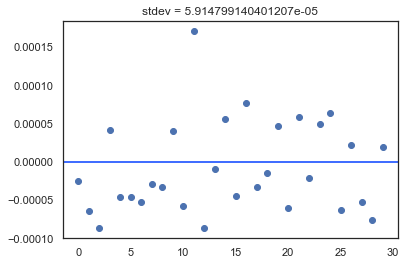

20220627
166.14772391319275
Name        Value      Min      Max   Stderr     Vary     Expr Brute_Step
D_X          2.16      1.5        3 0.008919     True     None     None
Temp            4        1       10        0    False     None     None
d_B             1      -10       10        0    False     None     None
d_kappa       0.5      -10       10        0    False     None     None
d_mu          0.5      -10       10        0    False     None     None
g_S_A        1.86        1        3        0    False     None     None
g_S_X       2.113        1        3  0.01401     True     None     None
g_lp_A     -0.724       -1        1        0    False     None     None


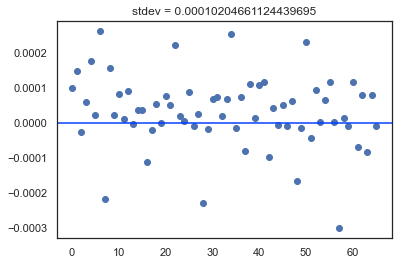

20220629_1
185.2505488395691
Name        Value      Min      Max   Stderr     Vary     Expr Brute_Step
D_X         2.193      1.5        3  0.02401     True     None     None
Temp            4        1       10        0    False     None     None
d_B             1      -10       10        0    False     None     None
d_kappa       0.5      -10       10        0    False     None     None
d_mu          0.5      -10       10        0    False     None     None
g_S_A        1.86        1        3        0    False     None     None
g_S_X       2.089        1        3  0.01291     True     None     None
g_lp_A     -0.724       -1        1        0    False     None     None


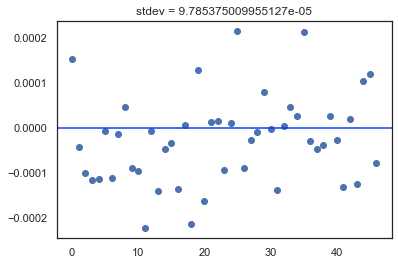

In [102]:
B_field_results = {}
B_field_params = {}
for label,dataset in B_field_datasets.items():
    params = Parameters()
    params.add('d_mu', value=0.5,min=-10,max=10,vary=False)
    params.add('d_kappa', value=0.5,min=-10,max=10,vary=False)
    params.add('d_B', value=1,min=-10,max=10,vary=False)
    params.add('Temp', value=4.0,min=1,max=10,vary=False)
    params.add('g_lp_A',value=-0.724,vary=False,min=-1,max=1)
    params.add('g_S_X',value=2.0023, vary=True,min=1,max=3)
    params.add('g_S_A',value=1.86, vary=False,min=1,max=3)
    if label =='20220616':
        params.add('D_X',value=2.15, vary=False,min=1.5,max=3)
        update_params = ['g_lp_A','g_S_X','g_S_A','D_X']
    else:
        params.add('D_X',value=2.15, vary=True,min=1.5,max=3)
        update_params = ['g_lp_A','g_S_X','g_S_A','D_X']
    
    # params.add('offset20220526',value=0,min=-0.0005,max=0.0005,vary=True)
    # params.add('offset20220616',value=0,min=-0.0005,max=0.0005,vary=True)
    # params.add('offset20220627',value=0,min=-0.0005,max=0.0005,vary=True)
    # params.add('offset20220628',value=0,min=-0.0005,max=0.0005,vary=True)
    # params.add('offset20220629_1',value=0,min=-0.0005,max=0.0005,vary=True)
    # params.add('offset20220629_2',value=0,min=-0.0005,max=0.0005,vary=True)
    print(label)
    t1 = time.time()
    out = minimize(field_line_residual_update_params, params, args=([dataset,update_params]),method='least_squares', kws={'EB_cut':[0,25],'thresh':13/29979.2458})#,kws={'flist':True})#,method='least_squares')
    t2 = time.time()
    print(t2-t1)
    out.params.pretty_print()
    final_resid = field_line_residual_update_params(out.params,dataset,update_params,no_uncert=True,EB_cut=[0,25],thresh=13/29979.2458)
    plt.figure()
    plt.plot(final_resid, 'bo')
    plt.axhline(y=0)
    plt.title('stdev = '+ str(final_resid.std()))
    plt.show()
    B_field_results[label] = out
    B_field_params[label] = params

20220526
158.42767810821533
Name        Value      Min      Max   Stderr     Vary     Expr Brute_Step
D_X          2.15      1.5        3 0.008831     True     None     None
Temp            4        1       10        0    False     None     None
d_B             1      -10       10        0    False     None     None
d_kappa       0.5      -10       10        0    False     None     None
d_mu          0.5      -10       10        0    False     None     None
g_S_A        1.86        1        3        0    False     None     None
g_S_X       2.002        1        3        0    False     None     None
g_lp_A     -0.724       -1        1        0    False     None     None


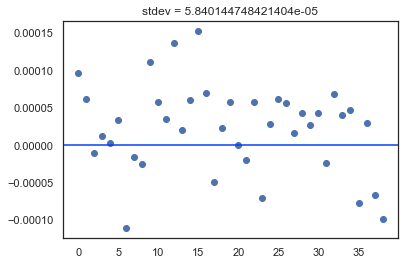

20220628
248.00829935073853
Name        Value      Min      Max   Stderr     Vary     Expr Brute_Step
D_X         2.157      1.5        3  0.01219     True     None     None
Temp            4        1       10        0    False     None     None
d_B             1      -10       10        0    False     None     None
d_kappa       0.5      -10       10        0    False     None     None
d_mu          0.5      -10       10        0    False     None     None
g_S_A        1.86        1        3        0    False     None     None
g_S_X       2.087        1        3 0.009084     True     None     None
g_lp_A     -0.724       -1        1        0    False     None     None


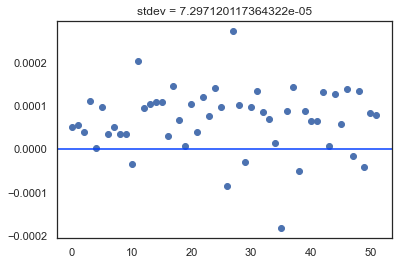

20220629_2
738.9962205886841
Name        Value      Min      Max   Stderr     Vary     Expr Brute_Step
D_X          2.14      1.5        3 0.008975     True     None     None
Temp            4        1       10        0    False     None     None
d_B             1      -10       10        0    False     None     None
d_kappa       0.5      -10       10        0    False     None     None
d_mu          0.5      -10       10        0    False     None     None
g_S_A        1.86        1        3        0    False     None     None
g_S_X         2.1        1        3  0.01734     True     None     None
g_lp_A     -0.724       -1        1        0    False     None     None


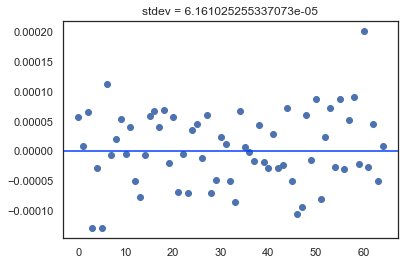

In [103]:
E_field_results = {}
E_field_params = {}
for label,dataset in E_field_datasets.items():
    params = Parameters()
    params.add('d_mu', value=0.5,min=-10,max=10,vary=False)
    params.add('d_kappa', value=0.5,min=-10,max=10,vary=False)
    params.add('d_B', value=1,min=-10,max=10,vary=False)
    params.add('Temp', value=4.0,min=1,max=10,vary=False)
    params.add('D_X',value=2.11, vary=True,min=1.5,max=3)
    params.add('g_S_A',value=1.86, vary=False,min=1,max=3)
    params.add('g_lp_A',value=-0.724,vary=False,min=-1,max=1)
    if label =='20220526':
        params.add('g_S_X',value=2.0023, vary=False,min=1,max=3)
        update_params = ['g_S_X','D_X','g_S_A','g_lp_A']
    else:
        params.add('g_S_X',value=2.0023, vary=True,min=1,max=3)
        update_params = ['g_S_X','D_X','g_S_A','g_lp_A']
        
    # params.add('offset20220526',value=0,min=-0.0005,max=0.0005,vary=True)
    # params.add('offset20220616',value=0,min=-0.0005,max=0.0005,vary=True)
    # params.add('offset20220627',value=0,min=-0.0005,max=0.0005,vary=True)
    # params.add('offset20220628',value=0,min=-0.0005,max=0.0005,vary=True)
    # params.add('offset20220629_1',value=0,min=-0.0005,max=0.0005,vary=True)
    # params.add('offset20220629_2',value=0,min=-0.0005,max=0.0005,vary=True)
    print(label)
    t1 = time.time()
    out = minimize(field_line_residual_update_params, params, args=([dataset,update_params]),method='least_squares', kws={'EB_cut':[51,0],'thresh':9/29979.2458})#,kws={'flist':True})#,method='least_squares')
    t2 = time.time()
    print(t2-t1)
    out.params.pretty_print()
    final_resid = field_line_residual_update_params(out.params,dataset,update_params,no_uncert=True,EB_cut=[51,0],thresh=9/29979.2458)
    plt.figure()
    plt.plot(final_resid, 'bo')
    plt.axhline(y=0)
    plt.title('stdev = '+ str(final_resid.std()))
    plt.show()
    E_field_results[label] = out
    E_field_params[label] = params

In [133]:
import lmfit

In [134]:
for label,result in B_field_results.items():
    dataset= B_field_datasets[label]
    if label =='20220616':
        update_params = ['g_S_X']
        continue
    else:
        update_params = ['g_S_X','D_X']
    print(label)
    mini = lmfit.Minimizer(field_line_residual_update_params, B_field_params[label],fcn_args=([dataset,update_params]),fcn_kws={'EB_cut':[0,25],'thresh':13/29979.2458})
    ci = lmfit.conf_interval(mini, result,p_names=update_params)
    lmfit.printfuncs.report_ci(ci)

20220627
          99.73%    95.45%    68.27%    _BEST_    68.27%    95.45%    99.73%
 g_S_X:  -0.04747  -0.03131  -0.01374   2.11309  +0.01727  +0.02823  +0.04279
 D_X  :  -0.03132  -0.02281  -0.01383   2.15967  +0.00879  +0.01785  +0.02716
20220629_1
          99.73%    95.45%    68.27%    _BEST_    68.27%    95.45%    99.73%
 g_S_X:  -0.03864  -0.02662  -0.01782   2.08888  +0.01310  +0.02665  +0.04130
 D_X  :  -0.03955  -0.03342  -0.02486   2.19317      +inf      +inf      +inf


C:\Users\ajadbaba\Anaconda3\lib\site-packages\lmfit\confidence.py:330: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(D_X=2.2171796346989114) = 0.0 < max(sigmas)
  warn(errmsg)


In [135]:
for label,result in E_field_results.items():
    dataset= E_field_datasets[label]
    if label =='20220526':
        update_params = ['D_X']
        continue
    else:
        update_params = ['g_S_X','D_X']
    print(label)
    mini = lmfit.Minimizer(field_line_residual_update_params,E_field_params[label],fcn_args=([dataset,update_params]),fcn_kws={'EB_cut':[51,0],'thresh':9/29979.2458})
    ci = lmfit.conf_interval(mini, result,p_names=update_params)
    lmfit.printfuncs.report_ci(ci)

20220628


C:\Users\ajadbaba\Anaconda3\lib\site-packages\lmfit\confidence.py:330: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(g_S_X=2.0777532272590253) = 0.0 < max(sigmas)
  warn(errmsg)
C:\Users\ajadbaba\Anaconda3\lib\site-packages\lmfit\confidence.py:330: UserWarning: rel_change=0.0 < 1e-05 at iteration 1 and prob(D_X=2.1692322822604613) = 0.0 < max(sigmas)
  warn(errmsg)


          99.73%    95.45%    68.27%    _BEST_    68.27%    95.45%    99.73%
 g_S_X:      -inf      -inf      -inf   2.08684  +0.00953  +0.02207  +0.03086
 D_X  :  -0.03747  -0.02476  -0.01221   2.15704      +inf      +inf      +inf
20220629_2
          99.73%    95.45%    68.27%    _BEST_    68.27%    95.45%    99.73%
 g_S_X:  -0.04902  -0.02548  -0.00294   2.09958  +0.01613  +0.03383  +0.05249
 D_X  :  -0.02399  -0.01676  -0.00742   2.14017  +0.00460  +0.00911  +0.01935


In [105]:
E_field_results['20220526']

In [127]:
E_field_results['20220628']

In [128]:
E_field_results['20220629_2']

In [129]:
B_field_results['20220616']

In [130]:
B_field_results['20220627']

In [131]:
B_field_results['20220629_1']

[0.5 0.5 1. ]
Using B (G) field of 0.001
[0.5 0.5 1. ]
Using B (G) field of 71.37962
[0.5 0.5 1. ]
Using B (G) field of 30.4824
[0.5 0.5 1. ]
Using E (V/cm) field of 0.0
[0.5 0.5 1. ]
Using E (V/cm) field of 244.0
[0.5 0.5 1. ]
Using E (V/cm) field of 100.0


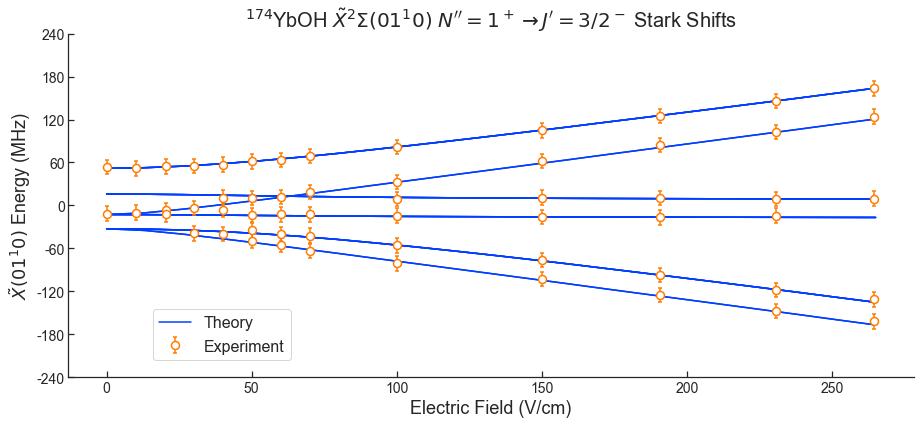

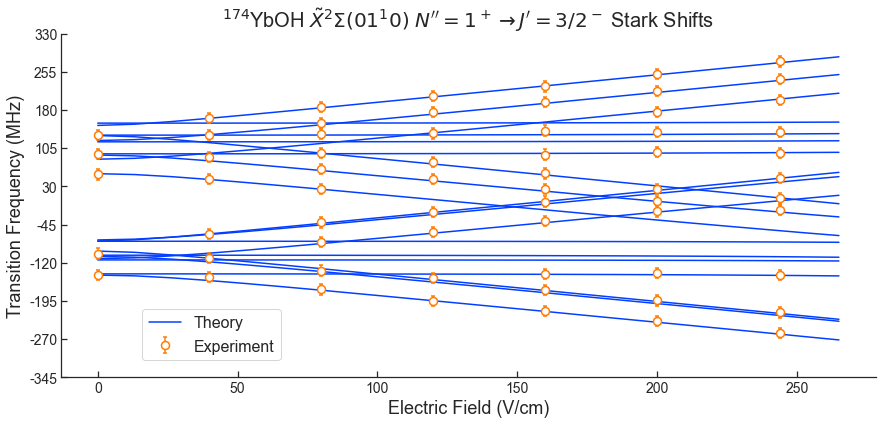

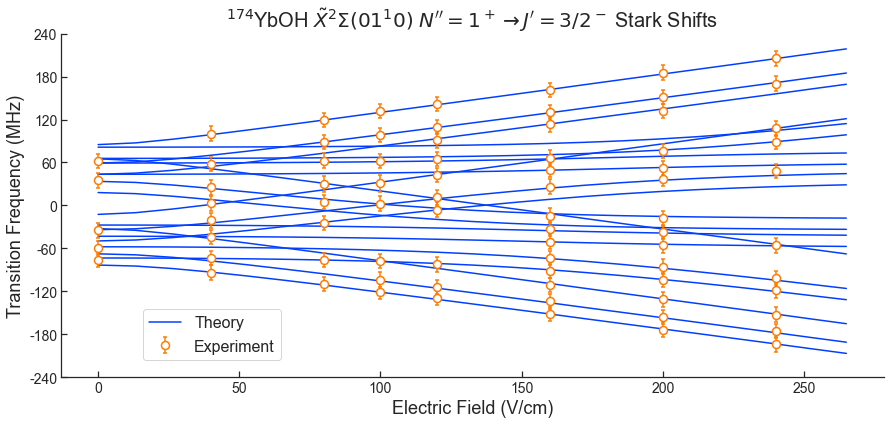

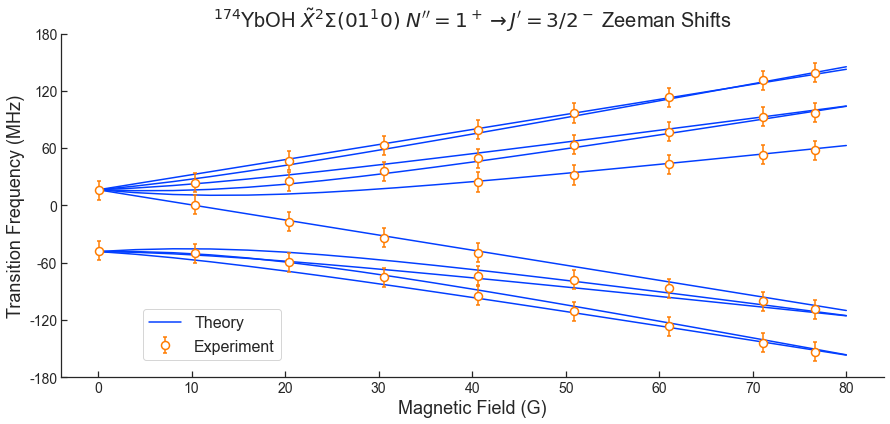

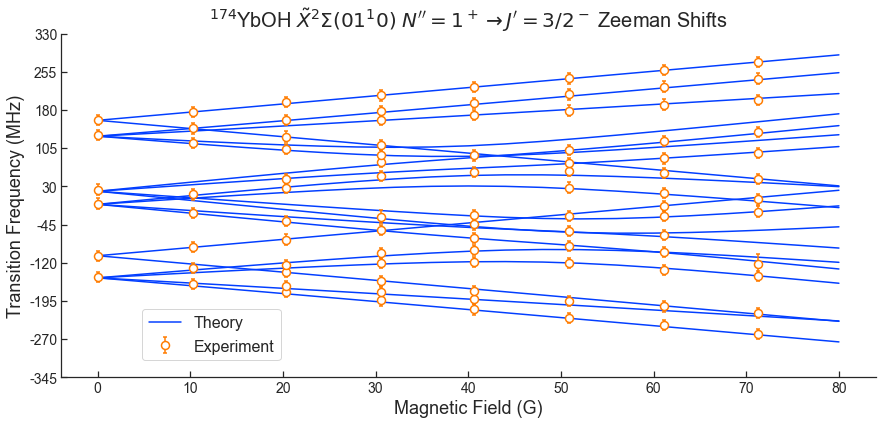

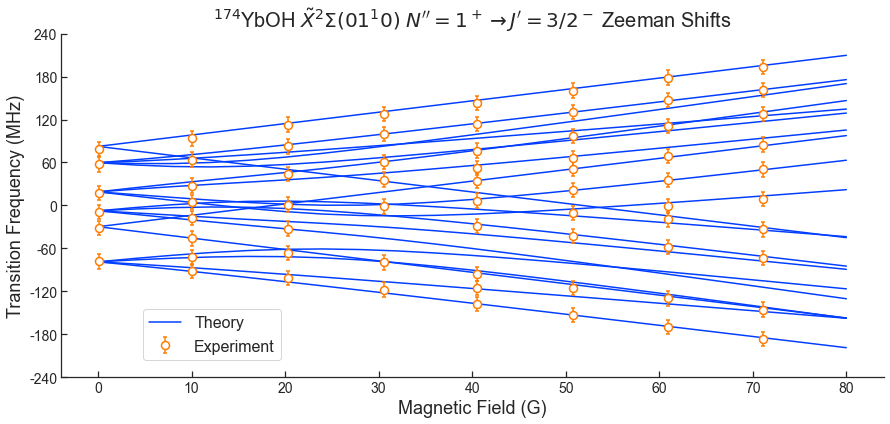

In [125]:
E_field_datasets = {
'20220526': All_StarkZeeman_Data['20220526'],
'20220628': All_StarkZeeman_Data['20220628'],
'20220629_2': All_StarkZeeman_Data['20220629_2']}
B_field_datasets = {
'20220616': All_StarkZeeman_Data['20220616'],
'20220627': All_StarkZeeman_Data['20220627'],
'20220629_1': All_StarkZeeman_Data['20220629_1']}

# v = np.array([0.2,0.4,0.89])
v=np.array([0.5,0.5,1])
Eplot = np.linspace(0,265,21)
Bplot = np.linspace(1e-3,80,21)

sns.set_style({'ytick.left':True,'xtick.bottom':True,'xtick.direction': 'in', 'ytick.direction': 'in',})
for label,dataset in E_field_datasets.items():
    g.update_params({'muE': E_field_results[label].params['D_X'].value*0.503412, 'g_S': E_field_results[label].params['g_S_X'].value})
    e.update_params({'g_lp': E_field_results[label].params['g_lp_A'].value,'g_S':E_field_results[label].params['g_S_A'].value})
    paper_plot_Stark(e,g,label, dataset,Eplot, v, thresh=9/29979.2458,cap=2,eline=1.5,q_off=21/29979.2458,zeroE_special=True)
    sns.despine()
    
for label,dataset in B_field_datasets.items():
    g.update_params({'muE': B_field_results[label].params['D_X'].value*0.503412,'g_S': B_field_results[label].params['g_S_X'].value})
    e.update_params({'g_lp': B_field_results[label].params['g_lp_A'].value,'g_S': B_field_results[label].params['g_S_A'].value})
    paper_plot_Zeeman(e,g,label, dataset,Bplot, v, thresh=9/29979.2458,cap=2,eline=1.5)
    sns.despine()

[0.5 0.5 1. ]
Using B (G) field of 0.001
[0.5 0.5 1. ]
Using B (G) field of 71.37962
[0.5 0.5 1. ]
Using B (G) field of 30.4824
D = 2.1
[0.5 0.5 1. ]
Using E (V/cm) field of 0.0


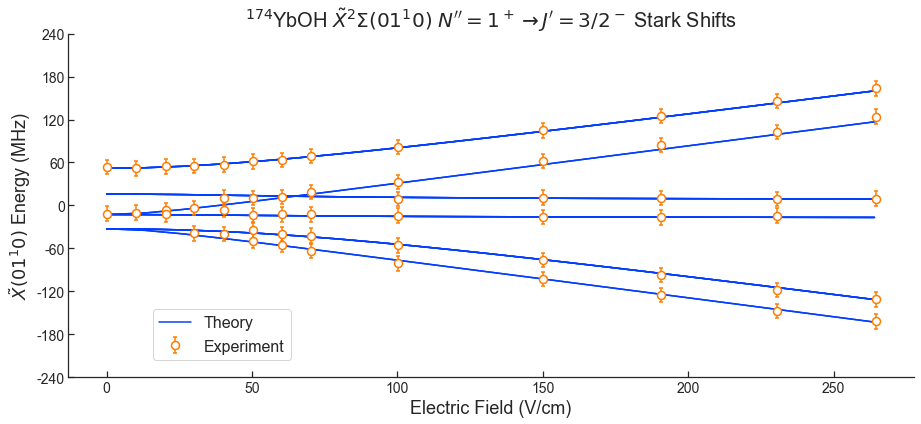

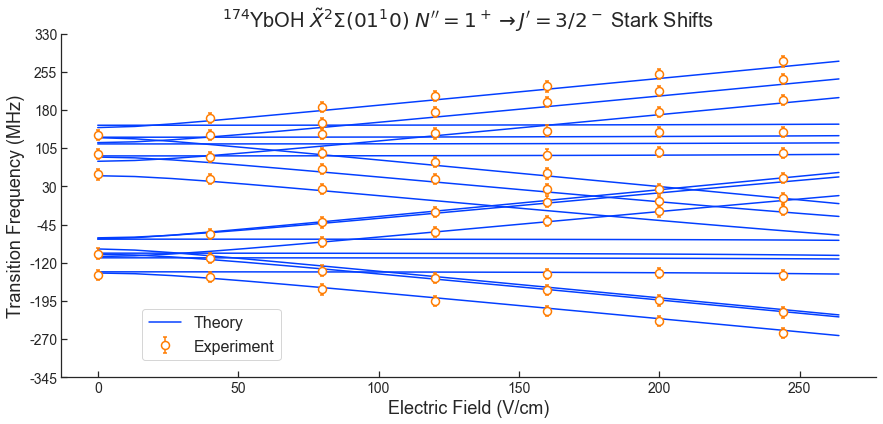

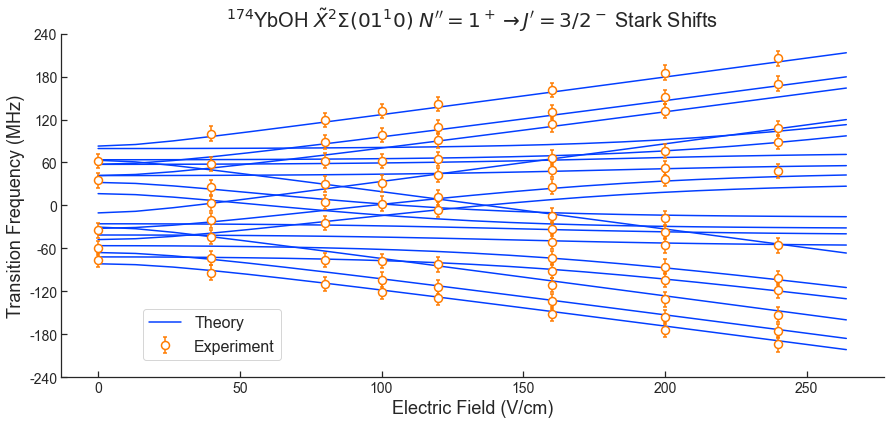

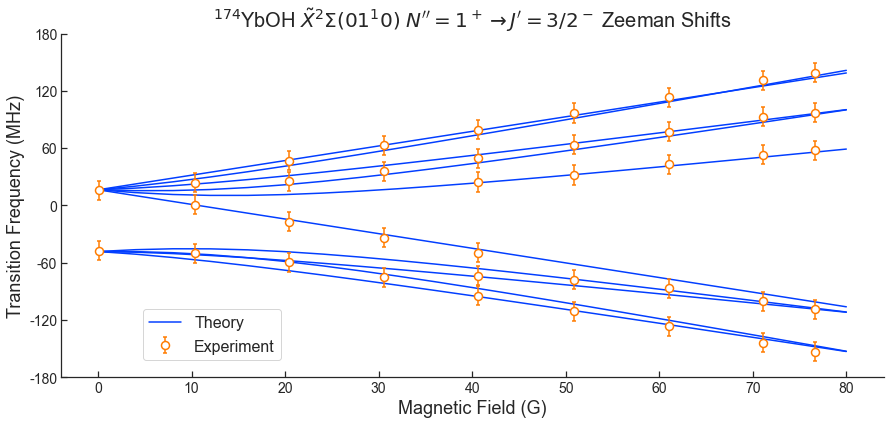

In [126]:
E_field_datasets = {
'20220526': All_StarkZeeman_Data['20220526'],
'20220628': All_StarkZeeman_Data['20220628'],
'20220629_2': All_StarkZeeman_Data['20220629_2']}
B_field_datasets = {
'20220616': All_StarkZeeman_Data['20220616'],
'20220627': All_StarkZeeman_Data['20220627'],
'20220629_1': All_StarkZeeman_Data['20220629_1']}



# v = np.array([0.2,0.4,0.89])
v=np.array([0.5,0.5,1])
Eplot = np.linspace(0,264,21)
Bplot = np.linspace(1e-3,80,21)

for label,dataset in E_field_datasets.items():
    g.update_params({'muE': 2.10*0.503412, 'g_S': 2.0023})
    e.update_params({'g_lp': -0.724,'g_S':1.860})
    paper_plot_Stark(e,g,label, dataset,Eplot, v, thresh=9/29979.2458,cap=2,eline=1.5,q_off=21/29979.2458,zeroE_special=True)
    sns.despine()
    
for label,dataset in B_field_datasets.items():
    if label=='20220616':
        g.update_params({'muE': 2.10*0.503412,'g_S': 2.0023})
        e.update_params({'g_lp':-0.724,'g_S':1.860})
        print('D =',2.10)
        paper_plot_Zeeman(e,g,label, dataset,Bplot, v, thresh=9/29979.2458,cap=2,eline=1.5)
        sns.despine()

20220526
89.68103408813477
Name        Value      Min      Max   Stderr     Vary     Expr Brute_Step
D_X         2.114      1.5        3  0.02499     True     None     None
Temp            4        1       10        0    False     None     None
d_B             1      -10       10        0    False     None     None
d_kappa       0.5      -10       10        0    False     None     None
d_mu          0.5      -10       10        0    False     None     None
g_S_A        1.86        1        3        0    False     None     None
g_S_X       2.002        1        3        0    False     None     None
g_lp_A     -0.724       -1        1        0    False     None     None


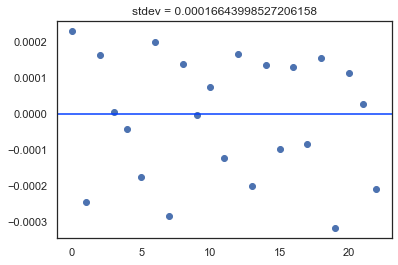

In [40]:
dataset = {'20220526':E_field_datasets['20220526']}
for label,dataset in dataset.items():
    params = Parameters()
    params.add('d_mu', value=0.5,min=-10,max=10,vary=False)
    params.add('d_kappa', value=0.5,min=-10,max=10,vary=False)
    params.add('d_B', value=1,min=-10,max=10,vary=False)
    params.add('Temp', value=4.0,min=1,max=10,vary=False)
    params.add('D_X',value=2.11, vary=True,min=1.5,max=3)
    params.add('g_S_A',value=1.86, vary=False,min=1,max=3)
    params.add('g_lp_A',value=-0.724,vary=False,min=-1,max=1)
    if label =='20220526':
        params.add('g_S_X',value=2.0023, vary=False,min=1,max=3)
        update_params = ['g_S_X','D_X','g_S_A','g_lp_A']
    else:
        params.add('g_S_X',value=2.0023, vary=False,min=1,max=3)
        update_params = ['g_S_X','D_X','g_S_A','g_lp_A']
        
    # params.add('offset20220526',value=0,min=-0.0005,max=0.0005,vary=True)
    # params.add('offset20220616',value=0,min=-0.0005,max=0.0005,vary=True)
    # params.add('offset20220627',value=0,min=-0.0005,max=0.0005,vary=True)
    # params.add('offset20220628',value=0,min=-0.0005,max=0.0005,vary=True)
    # params.add('offset20220629_1',value=0,min=-0.0005,max=0.0005,vary=True)
    # params.add('offset20220629_2',value=0,min=-0.0005,max=0.0005,vary=True)
    print(label)
    t1 = time.time()
    out = minimize(field_line_residual_update_params, params, args=([dataset,update_params]),method='least_squares', kws={'EB_cut':[105,0],'thresh':9/29979.2458})#,kws={'flist':True})#,method='least_squares')
    t2 = time.time()
    print(t2-t1)
    out.params.pretty_print()
    final_resid = field_line_residual_update_params(out.params,dataset,update_params,no_uncert=True,EB_cut=[105,0],thresh=9/29979.2458)
    plt.figure()
    plt.plot(final_resid, 'bo')
    plt.axhline(y=0)
    plt.title('stdev = '+ str(final_resid.std()))
    plt.show()

[0.5 0.5 1. ]
Using B (G) field of 0.001
[0.5 0.5 1. ]
Using E (V/cm) field of 0.0


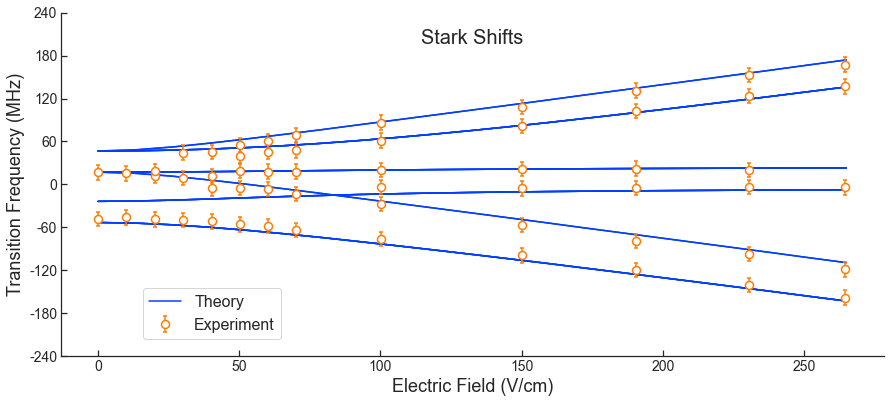

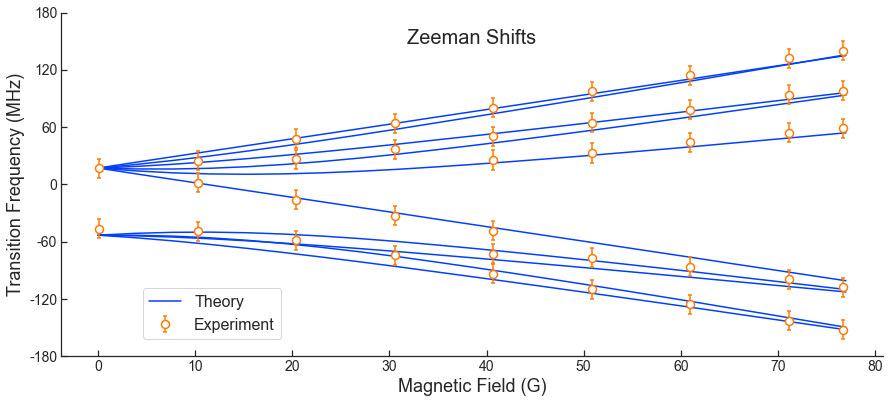

In [131]:
E_field_datasets = {
'20220526': All_StarkZeeman_Data['20220526'],
'20220628': All_StarkZeeman_Data['20220628'],
'20220629_2': All_StarkZeeman_Data['20220629_2']}
B_field_datasets = {
'20220616': All_StarkZeeman_Data['20220616'],
'20220627': All_StarkZeeman_Data['20220627'],
'20220629_1': All_StarkZeeman_Data['20220629_1']}



# v = np.array([0.2,0.4,0.89])
v=np.array([0.5,0.5,1])
Eplot = np.linspace(0,265,21)
Bplot = np.linspace(1e-3,77,21)

sns.set_style({'ytick.left':True,'xtick.bottom':True,'xtick.direction': 'in', 'ytick.direction': 'in',})

for label,dataset in E_field_datasets.items():
    if label=='20220526':
        g.update_params({'muE': 2.11*0.503412, 'g_S': 2.0023})
        e.update_params({'g_lp': -0.724,'g_S':1.860})
        paper_plot_Stark(e,g,label, dataset,Eplot, v, thresh=9/29979.2458,cap=2,eline=1.5,q_off=21/29979.2458,zeroE_special=False)
        plt.title(None)
        plt.title('Stark Shifts',fontsize=20,y=1.2)
        sns.despine()
        plt.savefig('X010_Stark_v2.svg',bbox_inches='tight')
    
for label,dataset in B_field_datasets.items():
    if label=='20220616':
        g.update_params({'muE': 2.11*0.503412,'g_S': 2.0023})
        e.update_params({'g_lp':-0.724,'g_S':1.860})
        paper_plot_Zeeman(e,g,label, dataset,Bplot, v, thresh=9/29979.2458,cap=2,eline=1.5)
        plt.title('Zeeman Shifts',fontsize=20,y=1.2)
        sns.despine()
        plt.savefig('X010_Zeeman_v2.svg',bbox_inches='tight')

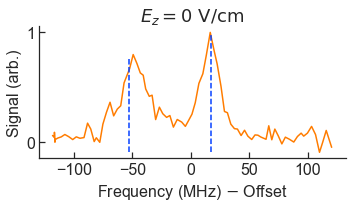

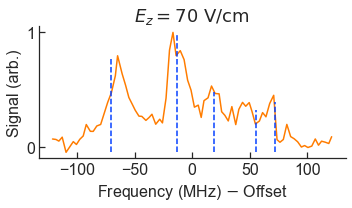

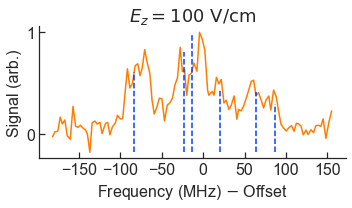

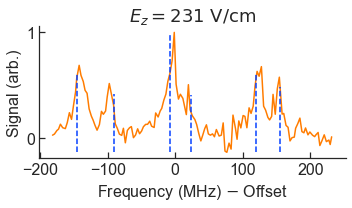

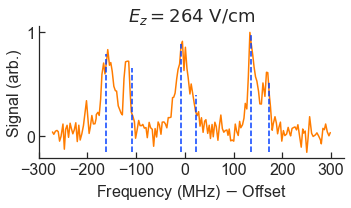

In [130]:
plot_lorentzian=False
all_dataset= {'20220526':E_field_datasets['20220526']}
for label in all_dataset:
    dataset = all_dataset[label]
    g.update_params({'muE': 2.11*0.503412, 'g_S': 2.0023})
    e.update_params({'g_lp': -0.724,'g_S':1.860})
    for scan in dataset:
        E,B = scan['EB']
        if E not in [0,70.18,100.2,230.6,264.4]:
            continue
        plt.figure(figsize=(5,3))
        plt.title(r'$E_z = {} \,\,$'.format(round(scan['EB'][0]))+'$\mathrm{V/cm}$',fontsize=18)
        freq_arr,data_arr = scan['data cal']
        data_norm=data_arr/data_arr.max()
        plt.plot(29979.2458*(freq_arr-17004.884),data_norm,color='C1')
        plt.ylabel('Signal (arb.)',fontsize=16)
        plt.xlabel(r'Frequency (MHz) $-$ Offset',fontsize=16)
        xticks = plt.xticks(fontsize=16)
        plt.yticks([0,1],fontsize=16)
        d=2.11
        mu=1
        T=4
        square=True
#         v=[0.6,-1.5,1]
        v = [0.5,0.5,1]
        if plot_lorentzian:
            model_lines,[freq_out,tot_lor],tdms = simulate_spectra([E,B],g,e,gidx,eidx,diagonalize=True,freq_array =freq_arr,origin = 17998.5875-319.908907,P_adjust=False,pad=10,T=T,square=True,dipole='x',cm=True,coeffs=v,thresh=1e-3,g=16/(29979.2458),make_lorentzians=True,plot=False)
            plt.plot(freq_out,tot_lor/tot_lor.max())
        else:
            model_lines,tdms = simulate_spectra([E,B],g,e,gidx,eidx,diagonalize=True,freq_array =None,origin = 17998.5875-319.908907,P_adjust=False,pad=100,T=T,square=True,dipole='x',cm=True,coeffs=v,thresh=1e-4,g=16/(29979.2458),make_lorentzians=False,plot=False)
            model_lines=np.sort(model_lines)
#             [plt.axvline(x=f) for f in model_lines];
            line_diffs = model_lines[1:] - model_lines[:-1]
            line_group = [model_lines[0]]
            line_avgs = []
            thresh=9/29979.2458
            for i,ld in enumerate(line_diffs):
                if ld<=thresh and model_lines[i+1] - line_group[0] < thresh*1.5:
                    line_group.append(model_lines[i+1])
                else:
                    line_avgs.append(sum(line_group)/len(line_group))
                    line_group = [model_lines[i+1]]
            line_avgs.append(sum(line_group)/len(line_group))
            model_avgs = np.array(line_avgs)
#             if B<61 and B>60:
#                 print(model_avgs)
            ylim=plt.ylim()
            [plt.axvline(x=29979.2458*(f-17004.884),ymin=0.05,ymax=data_norm[np.searchsorted(freq_arr,f)-4:np.searchsorted(freq_arr,f)+4].max()/ylim[-1],linestyle='--') for f in model_avgs];
        sns.despine()
        plt.tight_layout()
        plt.savefig('X010_Stark_{}.svg'.format(round(scan['EB'][0])),bbox_inches='tight')

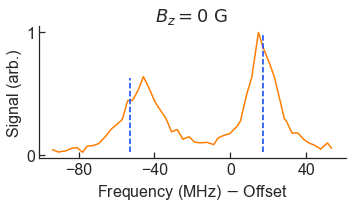

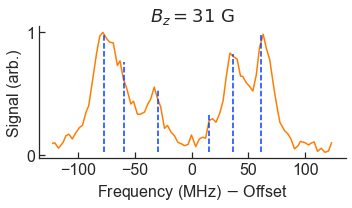

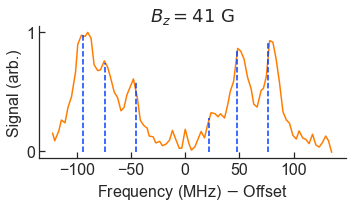

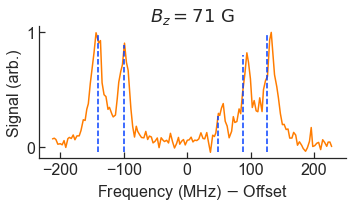

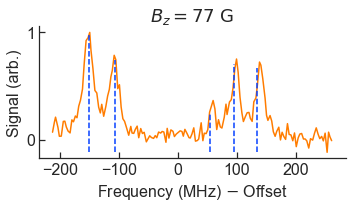

In [146]:
plot_lorentzian=False
all_dataset= {'20220616':B_field_datasets['20220616']}
for label in all_dataset:
    dataset = all_dataset[label]
    g.update_params({'muE': 2.11*0.503412, 'g_S': 2.0023})
    e.update_params({'g_lp': -0.724,'g_S':1.860})
    for scan in dataset:
        E,B = scan['EB']
        if round(B) not in [0,31,41,71,77]:
            continue
        plt.figure(figsize=(5,3))
        plt.title(r'$B_z = {} \,\,$'.format(round(scan['EB'][1]))+'$\mathrm{G}$',fontsize=18)
        freq_arr,data_arr = scan['data cal']
        data_norm=data_arr/data_arr.max()
        plt.plot(29979.2458*(freq_arr-17004.884),data_norm,color='C1')
        plt.ylabel('Signal (arb.)',fontsize=16)
        plt.xlabel(r'Frequency (MHz) $-$ Offset',fontsize=16)
        if round(B)==0:
            xticks = plt.xticks([-80,-40,0,40],fontsize=16)
        else:
            xticks = plt.xticks(fontsize=16)
        plt.yticks([0,1],fontsize=16)
        d=2.11
        mu=1
        T=4
        square=True
#         v=[0.6,-1.5,1]
        v = [0.5,0.5,1]
        if plot_lorentzian:
            model_lines,[freq_out,tot_lor],tdms = simulate_spectra([E,B],g,e,gidx,eidx,diagonalize=True,freq_array =freq_arr,origin = 17998.5875-319.908907,P_adjust=False,pad=10,T=T,square=True,dipole='x',cm=True,coeffs=v,thresh=1e-3,g=16/(29979.2458),make_lorentzians=True,plot=False)
            plt.plot(freq_out,tot_lor/tot_lor.max())
        else:
            model_lines,tdms = simulate_spectra([E,B],g,e,gidx,eidx,diagonalize=True,freq_array =None,origin = 17998.5875-319.908907,P_adjust=False,pad=100,T=T,square=True,dipole='x',cm=True,coeffs=v,thresh=1e-4,g=16/(29979.2458),make_lorentzians=False,plot=False)
            model_lines=np.sort(model_lines)
#             [plt.axvline(x=f) for f in model_lines];
            line_diffs = model_lines[1:] - model_lines[:-1]
            line_group = [model_lines[0]]
            line_avgs = []
            thresh=13/29979.2458
            for i,ld in enumerate(line_diffs):
                if ld<=thresh and model_lines[i+1] - line_group[0] < thresh*1.5:
                    line_group.append(model_lines[i+1])
                else:
                    line_avgs.append(sum(line_group)/len(line_group))
                    line_group = [model_lines[i+1]]
            line_avgs.append(sum(line_group)/len(line_group))
            model_avgs = np.array(line_avgs)
#             if B<61 and B>60:
#                 print(model_avgs)
            ylim=plt.ylim()
            [plt.axvline(x=29979.2458*(f-17004.884),ymin=0.05,ymax=data_norm[np.searchsorted(freq_arr,f)-3:np.searchsorted(freq_arr,f)+3].max()/ylim[-1],linestyle='--') for f in model_avgs];
        sns.despine()
        plt.tight_layout()
        plt.savefig('X010_Zeeman_{}.svg'.format(round(scan['EB'][1])),bbox_inches='tight')

In [139]:

E_field_datasets = {
'20220526': All_StarkZeeman_Data['20220526'],
'20220628': All_StarkZeeman_Data['20220628'],
'20220629_2': All_StarkZeeman_Data['20220629_2']}



array([0., 0., 0., 0., 0.])

In [ ]:
E_field_datasets = {
'20220526': All_StarkZeeman_Data['20220526'],
'20220628': All_StarkZeeman_Data['20220628'],
'20220629_2': All_StarkZeeman_Data['20220629_2']}
D=2.14
# v = np.array([0.2,0.4,0.89])
v=np.array([0.6,-1.3,1])
print(v)
Eplot = np.linspace(0,264,21)

for label,dataset in E_field_datasets.items():
    paper_plot_Stark(dataset,D,Eplot, v, thresh=6/29979.2458)

<Parameter 'd', value=2.12, bounds=[0.1:10]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.1:10]>
<Parameter 'd', value=2.12, bounds=[0.1:10]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.1:10]>
<Parameter 'd', value=2.12, bounds=[0.1:10]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.1:10]>
<Parameter 'd', value=2.120000037658494, bounds=[0.1:10]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.1:10]>
<Parameter 'd', value=2.12, bounds=[0.1:10]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.1:10]>
<Parameter 'd', value=2.1182000303886457, bounds=[0.1:10]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.1:10]>
<Parameter 'd', value=2.118200068061474, bounds=[0.1:10]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.1:10]>
<Parameter 'd', value=2.1182000303886457, bounds=[0.1:10]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.1:10]>
<Parameter 'd', value=2.1189944034075423, bounds=[0.1:10]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.1:10]>
<Parameter 'd', value=2.1189944410740473, bounds=[

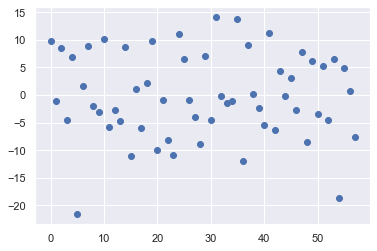

In [150]:
dataset = All_StarkZeeman_Data['20220526']
params = Parameters()
params.add('d_mu', value=-0.5,min=-10,max=10,vary=False)
params.add('d_kappa', value=2,min=-10,max=10,vary=False)
params.add('d_B', value=-1,min=-10,max=10,vary=False)
params.add('Temp', value=4.0,min=1,max=10,vary=False)
params.add('d',value=2.120,min=0.1,max=10,vary=True)
params.add('mu',value=1.0, min=0.1,max=10,vary=False)
params.add('offset',value=0,min=-0.0005,max=0.0005,vary=True)
t1 = time.time()
out = minimize(field_line_residual, params, args=([dataset]))#,kws={'flist':True})#,method='least_squares')
t2 = time.time()
print(t2-t1)
out.params.pretty_print()
final_resid = field_line_residual(params,dataset,no_uncert=True)
plt.plot(final_resid, 'bo')
plt.axhline(y=0)
plt.title('stdev = '+ str(final_resid.std()))

<Parameter 'd', value=2.12, bounds=[0.1:10]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.1:10]>


TypeError: can only concatenate str (not "numpy.float64") to str

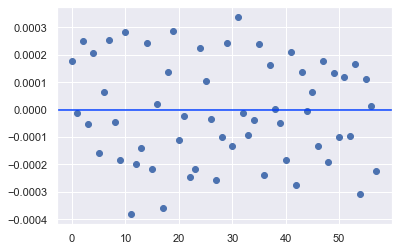

In [161]:
final_resid = field_line_residual(params,dataset,no_uncert=True)
plt.plot(final_resid, 'bo')
plt.axhline(y=0)
plt.title('stdev = '+ str(final_resid.std()))

Text(0.5, 1.0, 'stdev = 0.00018520165728161002')

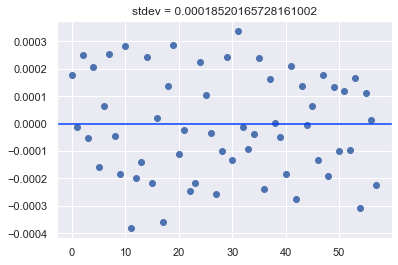

In [162]:
plt.plot(final_resid, 'bo')
plt.axhline(y=0)
plt.title('stdev = '+ str(final_resid.std()))

In [105]:
out

In [65]:
dataset = All_StarkZeeman_Data['20220616']
params = Parameters()
params.add('d_mu', value=-0.5,min=-10,max=10,vary=False)
params.add('d_kappa', value=2,min=-10,max=10,vary=False)
params.add('d_B', value=-1,min=-10,max=10,vary=False)
params.add('Temp', value=4.0,min=1,max=10,vary=False)
params.add('d',value=2.12,min=0.1,max=10,vary=False)
params.add('mu',value=1.0, min=0.1, max = 10,vary=True)
t1 = time.time()
out = minimize(field_line_residual, params, args=([dataset]))#,kws={'flist':True})#,method='least_squares')
t2 = time.time()
print(t2-t1)

<Parameter 'd', value=2.12 (fixed), bounds=[0.1:10]>
<Parameter 'mu', value=1.0000000000000004, bounds=[0.1:10]>
<Parameter 'd', value=2.12 (fixed), bounds=[0.1:10]>
<Parameter 'mu', value=1.0000000000000004, bounds=[0.1:10]>
<Parameter 'd', value=2.12 (fixed), bounds=[0.1:10]>
<Parameter 'mu', value=1.0000000000000004, bounds=[0.1:10]>
<Parameter 'd', value=2.12 (fixed), bounds=[0.1:10]>
<Parameter 'mu', value=1.0000000406384981, bounds=[0.1:10]>
<Parameter 'd', value=2.12 (fixed), bounds=[0.1:10]>
<Parameter 'mu', value=0.9966146881646535, bounds=[0.1:10]>
<Parameter 'd', value=2.12 (fixed), bounds=[0.1:10]>
<Parameter 'mu', value=0.9966147287846793, bounds=[0.1:10]>
<Parameter 'd', value=2.12 (fixed), bounds=[0.1:10]>
<Parameter 'mu', value=0.9961920659796291, bounds=[0.1:10]>
<Parameter 'd', value=2.12 (fixed), bounds=[0.1:10]>
<Parameter 'mu', value=0.9961921065973303, bounds=[0.1:10]>
<Parameter 'd', value=2.12 (fixed), bounds=[0.1:10]>
<Parameter 'mu', value=0.9958227175783457, 

In [66]:
out

In [107]:
# dataset = All_StarkZeeman_Data['20220627']
E_field_datasets = {
'20220526': All_StarkZeeman_Data['20220526'],
'20220628': All_StarkZeeman_Data['20220628'],
'20220629_2': All_StarkZeeman_Data['20220629_2']}
params = Parameters()
params.add('d_mu', value=-0.5,min=-10,max=10,vary=False)
params.add('d_kappa', value=2,min=-10,max=10,vary=False)
params.add('d_B', value=-1,min=-10,max=10,vary=False)
params.add('Temp', value=4.0,min=1,max=10,vary=False)
params.add('d',value=2.12,min=0.1,max=10,vary=True)
params.add('mu',value=1.0, min=0.1, max = 10,vary=False)
params.add('offset20220526',value=0,min=-0.0005,max=0.0005,vary=True)
# params.add('offset20220616',value=0,min=-0.0005,max=0.0005,vary=True)
# params.add('offset20220627',value=0,min=-0.0005,max=0.0005,vary=True)
params.add('offset20220628',value=0,min=-0.0005,max=0.0005,vary=True)
# params.add('offset20220629_1',value=0,min=-0.0005,max=0.0005,vary=True)
params.add('offset20220629_2',value=0,min=-0.0005,max=0.0005,vary=True)
t1 = time.time()
out = minimize(all_field_line_residual, params, args=([E_field_datasets]))#,kws={'flist':True})#,method='least_squares')
t2 = time.time()
print(t2-t1)

<Parameter 'd', value=2.12, bounds=[0.1:10]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.1:10]>
<Parameter 'd', value=2.12, bounds=[0.1:10]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.1:10]>
<Parameter 'd', value=2.12, bounds=[0.1:10]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.1:10]>
<Parameter 'd', value=2.120000037658494, bounds=[0.1:10]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.1:10]>
<Parameter 'd', value=2.12, bounds=[0.1:10]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.1:10]>
<Parameter 'd', value=2.12, bounds=[0.1:10]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.1:10]>
<Parameter 'd', value=2.12, bounds=[0.1:10]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.1:10]>
<Parameter 'd', value=2.1491179666155755, bounds=[0.1:10]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.1:10]>
<Parameter 'd', value=2.149118004039337, bounds=[0.1:10]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.1:10]>
<Parameter 'd', value=2.1491179666155755, bounds=[0.1:10]>
<Parameter 'mu', va

In [108]:
out

In [18]:
# dataset = All_StarkZeeman_Data['20220627']
params = Parameters()
params.add('d_mu', value=-0.5,min=-10,max=10,vary=False)
params.add('d_kappa', value=2,min=-10,max=10,vary=False)
params.add('d_B', value=-1,min=-10,max=10,vary=False)
params.add('Temp', value=4.0,min=1,max=10,vary=False)
params.add('d',value=2.12,min=0.1,max=10,vary=True)
params.add('mu',value=1.0, min=0.5, max = 3,vary=True)
params.add('offset20220526',value=0,min=-0.0005,max=0.0005,vary=True)
params.add('offset20220616',value=0,min=-0.0005,max=0.0005,vary=True)
params.add('offset20220627',value=0,min=-0.0005,max=0.0005,vary=True)
params.add('offset20220628',value=0,min=-0.0005,max=0.0005,vary=True)
params.add('offset20220629_1',value=0,min=-0.0005,max=0.0005,vary=True)
params.add('offset20220629_2',value=0,min=-0.0005,max=0.0005,vary=True)
t1 = time.time()
out = minimize(all_field_line_residual, params, args=([All_StarkZeeman_Data]))#,kws={'flist':True})#,method='least_squares')
t2 = time.time()
print(t2-t1)

<Parameter 'd', value=2.12, bounds=[0.1:10]>
<Parameter 'mu', value=1.0, bounds=[0.5:3]>
<Parameter 'd', value=2.12, bounds=[0.1:10]>
<Parameter 'mu', value=1.0, bounds=[0.5:3]>
<Parameter 'd', value=2.12, bounds=[0.1:10]>
<Parameter 'mu', value=1.0, bounds=[0.5:3]>
<Parameter 'd', value=2.120000037658494, bounds=[0.1:10]>
<Parameter 'mu', value=1.0, bounds=[0.5:3]>
<Parameter 'd', value=2.12, bounds=[0.1:10]>
<Parameter 'mu', value=1.0000000095889139, bounds=[0.5:3]>
<Parameter 'd', value=2.12, bounds=[0.1:10]>
<Parameter 'mu', value=1.0, bounds=[0.5:3]>
<Parameter 'd', value=2.12, bounds=[0.1:10]>
<Parameter 'mu', value=1.0, bounds=[0.5:3]>
<Parameter 'd', value=2.12, bounds=[0.1:10]>
<Parameter 'mu', value=1.0, bounds=[0.5:3]>
<Parameter 'd', value=2.12, bounds=[0.1:10]>
<Parameter 'mu', value=1.0, bounds=[0.5:3]>
<Parameter 'd', value=2.12, bounds=[0.1:10]>
<Parameter 'mu', value=1.0, bounds=[0.5:3]>
<Parameter 'd', value=2.12, bounds=[0.1:10]>
<Parameter 'mu', value=1.0, bounds=[0

<Parameter 'd', value=2.1731619995170246, bounds=[0.1:10]>
<Parameter 'mu', value=1.001019105827172, bounds=[0.5:3]>
<Parameter 'd', value=2.173127265244538, bounds=[0.1:10]>
<Parameter 'mu', value=1.0010592612413185, bounds=[0.5:3]>
<Parameter 'd', value=2.1731447025873907, bounds=[0.1:10]>
<Parameter 'mu', value=1.0010396144825209, bounds=[0.5:3]>
<Parameter 'd', value=2.1731543591967517, bounds=[0.1:10]>
<Parameter 'mu', value=1.001028302858996, bounds=[0.5:3]>
<Parameter 'd', value=2.1731581974893293, bounds=[0.1:10]>
<Parameter 'mu', value=1.001023711260173, bounds=[0.5:3]>
<Parameter 'd', value=2.1731601196264947, bounds=[0.1:10]>
<Parameter 'mu', value=1.0010213902374103, bounds=[0.5:3]>
<Parameter 'd', value=2.173161065889146, bounds=[0.1:10]>
<Parameter 'mu', value=1.0010202421561212, bounds=[0.5:3]>
<Parameter 'd', value=2.1731615380422395, bounds=[0.1:10]>
<Parameter 'mu', value=1.0010196679399317, bounds=[0.5:3]>
<Parameter 'd', value=2.1731619995170246, bounds=[0.1:10]>
<P

In [19]:
out

In [22]:
# dataset = All_StarkZeeman_Data['20220627']
E_field_datasets = {
'20220526': All_StarkZeeman_Data['20220526'],
'20220628': All_StarkZeeman_Data['20220628'],
'20220629_2': All_StarkZeeman_Data['20220629_2']}
E_field_results = {}
for label,dataset in E_field_datasets.items():
    params = Parameters()
    params.add('d_mu', value=-0.5,min=-10,max=10,vary=False)
    params.add('d_kappa', value=2,min=-10,max=10,vary=False)
    params.add('d_B', value=-1,min=-10,max=10,vary=False)
    params.add('Temp', value=4.0,min=1,max=10,vary=False)
    params.add('d',value=2.12,min=1.9,max=2.5,vary=True)
    params.add('mu',value=1.0, min=0.9, max = 1.1,vary=False)
    # params.add('offset20220526',value=0,min=-0.0005,max=0.0005,vary=True)
    # params.add('offset20220616',value=0,min=-0.0005,max=0.0005,vary=True)
    # params.add('offset20220627',value=0,min=-0.0005,max=0.0005,vary=True)
    # params.add('offset20220628',value=0,min=-0.0005,max=0.0005,vary=True)
    # params.add('offset20220629_1',value=0,min=-0.0005,max=0.0005,vary=True)
    # params.add('offset20220629_2',value=0,min=-0.0005,max=0.0005,vary=True)
    print(label)
    t1 = time.time()
    out = minimize(field_line_residual, params, args=([dataset]))#,kws={'flist':True})#,method='least_squares')
    t2 = time.time()
    print(t2-t1)
    out.params.pretty_print()
    E_field_results[label] = out

20220526
<Parameter 'd', value=2.12, bounds=[1.9:2.5]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.9:1.1]>
<Parameter 'd', value=2.12, bounds=[1.9:2.5]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.9:1.1]>
<Parameter 'd', value=2.12, bounds=[1.9:2.5]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.9:1.1]>
<Parameter 'd', value=2.120000001162998, bounds=[1.9:2.5]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.9:1.1]>
<Parameter 'd', value=2.1091202756875322, bounds=[1.9:2.5]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.9:1.1]>
<Parameter 'd', value=2.115198892954848, bounds=[1.9:2.5]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.9:1.1]>
<Parameter 'd', value=2.117755783829979, bounds=[1.9:2.5]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.9:1.1]>
<Parameter 'd', value=2.1189238448278256, bounds=[1.9:2.5]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.9:1.1]>
<Parameter 'd', value=2.119477760971544, bounds=[1.9:2.5]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.9:1.1]>
<Parameter 

135.60982155799866
Name        Value      Min      Max   Stderr     Vary     Expr Brute_Step
Temp            4        1       10        0    False     None     None
d           2.136      1.9      2.5  0.01849     True     None     None
d_B            -1      -10       10        0    False     None     None
d_kappa         2      -10       10        0    False     None     None
d_mu         -0.5      -10       10        0    False     None     None
mu              1      0.9      1.1        0    False     None     None


In [23]:
# dataset = All_StarkZeeman_Data['20220627']
E_field_datasets = {
'20220526': All_StarkZeeman_Data['20220526'],
'20220628': All_StarkZeeman_Data['20220628'],
'20220629_2': All_StarkZeeman_Data['20220629_2']}
E_field_results = {}
for label,dataset in E_field_datasets.items():
    params = Parameters()
    params.add('d_mu', value=-0.5,min=-10,max=10,vary=False)
    params.add('d_kappa', value=2,min=-10,max=10,vary=False)
    params.add('d_B', value=-1,min=-10,max=10,vary=False)
    params.add('Temp', value=4.0,min=1,max=10,vary=False)
    params.add('d',value=2.12,min=1.9,max=2.5,vary=True)
    params.add('mu',value=1.0, min=0.9, max = 1.1,vary=False)
    # params.add('offset20220526',value=0,min=-0.0005,max=0.0005,vary=True)
    # params.add('offset20220616',value=0,min=-0.0005,max=0.0005,vary=True)
    # params.add('offset20220627',value=0,min=-0.0005,max=0.0005,vary=True)
    # params.add('offset20220628',value=0,min=-0.0005,max=0.0005,vary=True)
    # params.add('offset20220629_1',value=0,min=-0.0005,max=0.0005,vary=True)
    # params.add('offset20220629_2',value=0,min=-0.0005,max=0.0005,vary=True)
    print(label)
    t1 = time.time()
    out = minimize(field_line_residual, params, args=([dataset]),method='least_squares')#,kws={'flist':True})#,method='least_squares')
    t2 = time.time()
    print(t2-t1)
    out.params.pretty_print()
    E_field_results[label] = out

20220526
<Parameter 'd', value=2.12, bounds=[1.9:2.5]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.9:1.1]>
<Parameter 'd', value=2.120000031590462, bounds=[1.9:2.5]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.9:1.1]>
<Parameter 'd', value=2.118889836173348, bounds=[1.9:2.5]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.9:1.1]>
<Parameter 'd', value=2.119722459043337, bounds=[1.9:2.5]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.9:1.1]>
<Parameter 'd', value=2.1199306147608343, bounds=[1.9:2.5]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.9:1.1]>
<Parameter 'd', value=2.119982653690209, bounds=[1.9:2.5]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.9:1.1]>
<Parameter 'd', value=2.1199956634225523, bounds=[1.9:2.5]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.9:1.1]>
<Parameter 'd', value=2.1199989158556383, bounds=[1.9:2.5]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.9:1.1]>
<Parameter 'd', value=2.1199997289639096, bounds=[1.9:2.5]>
<Parameter 'mu', value=1.0 (fixed), b

<Parameter 'd', value=2.1578717048622007, bounds=[1.9:2.5]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.9:1.1]>
<Parameter 'd', value=2.1578717370169946, bounds=[1.9:2.5]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.9:1.1]>
<Parameter 'd', value=2.1578727666476345, bounds=[1.9:2.5]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.9:1.1]>
<Parameter 'd', value=2.157871970308559, bounds=[1.9:2.5]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.9:1.1]>
<Parameter 'd', value=2.1578717712237903, bounds=[1.9:2.5]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.9:1.1]>
<Parameter 'd', value=2.157871721452598, bounds=[1.9:2.5]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.9:1.1]>
<Parameter 'd', value=2.1578717536073926, bounds=[1.9:2.5]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.9:1.1]>
<Parameter 'd', value=2.157871721452598, bounds=[1.9:2.5]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.9:1.1]>
326.89082384109497
Name        Value      Min      Max   Stderr     Vary     Expr Brute_Ste

20220526
<Parameter 'd', value=2.1, bounds=[1.8:2.4]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.9:1.1]>
<Parameter 'd', value=2.1000000312924385, bounds=[1.8:2.4]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.9:1.1]>
<Parameter 'd', value=2.121246408142874, bounds=[1.8:2.4]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.9:1.1]>
<Parameter 'd', value=2.1212464397519084, bounds=[1.8:2.4]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.9:1.1]>
<Parameter 'd', value=2.123576045533432, bounds=[1.8:2.4]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.9:1.1]>
<Parameter 'd', value=2.1218288174905133, bounds=[1.8:2.4]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.9:1.1]>
<Parameter 'd', value=2.121392010479784, bounds=[1.8:2.4]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.9:1.1]>
<Parameter 'd', value=2.121282808727101, bounds=[1.8:2.4]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.9:1.1]>
<Parameter 'd', value=2.1212555082889306, bounds=[1.8:2.4]>
<Parameter 'mu', value=1.0 (fixed), bo

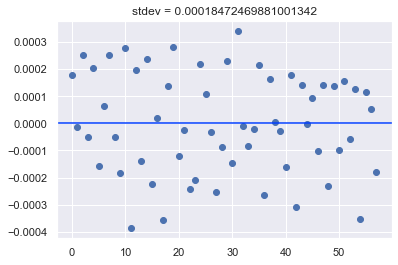

20220628
<Parameter 'd', value=2.1, bounds=[1.8:2.4]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.9:1.1]>
<Parameter 'd', value=2.1000000312924385, bounds=[1.8:2.4]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.9:1.1]>
<Parameter 'd', value=2.1574781522369286, bounds=[1.8:2.4]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.9:1.1]>
<Parameter 'd', value=2.1574781843858584, bounds=[1.8:2.4]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.9:1.1]>
<Parameter 'd', value=2.1921550683499516, bounds=[1.8:2.4]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.9:1.1]>
<Parameter 'd', value=2.1921551010156075, bounds=[1.8:2.4]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.9:1.1]>
<Parameter 'd', value=2.198264316736637, bounds=[1.8:2.4]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.9:1.1]>
<Parameter 'd', value=2.198264349493328, bounds=[1.8:2.4]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.9:1.1]>
<Parameter 'd', value=2.199522049083042, bounds=[1.8:2.4]>
<Parameter 'mu', value=1.0 (fixed), b

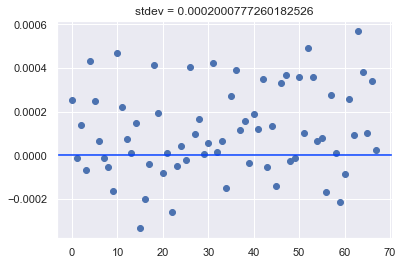

20220629_2
<Parameter 'd', value=2.1, bounds=[1.8:2.4]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.9:1.1]>
<Parameter 'd', value=2.1000000312924385, bounds=[1.8:2.4]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.9:1.1]>
<Parameter 'd', value=2.1481405491186916, bounds=[1.8:2.4]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.9:1.1]>
<Parameter 'd', value=2.14814058112848, bounds=[1.8:2.4]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.9:1.1]>
<Parameter 'd', value=2.1595557879538827, bounds=[1.8:2.4]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.9:1.1]>
<Parameter 'd', value=2.1509943588274894, bounds=[1.8:2.4]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.9:1.1]>
<Parameter 'd', value=2.150994390879803, bounds=[1.8:2.4]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.9:1.1]>
<Parameter 'd', value=2.1566695497142025, bounds=[1.8:2.4]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.9:1.1]>
<Parameter 'd', value=2.1566695818510833, bounds=[1.8:2.4]>
<Parameter 'mu', value=1.0 (fixed),

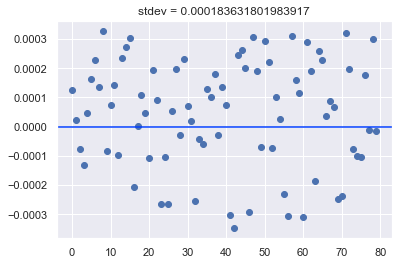

In [22]:
# dataset = All_StarkZeeman_Data['20220627']
E_field_datasets = {
'20220526': All_StarkZeeman_Data['20220526'],
'20220628': All_StarkZeeman_Data['20220628'],
'20220629_2': All_StarkZeeman_Data['20220629_2']}
E_field_results_ls2 = {}
for label,dataset in E_field_datasets.items():
    params = Parameters()
    params.add('d_mu', value=-0.5,min=-10,max=10,vary=False)
    params.add('d_kappa', value=2,min=-10,max=10,vary=False)
    params.add('d_B', value=-1,min=-10,max=10,vary=False)
    params.add('Temp', value=4.0,min=1,max=10,vary=False)
    params.add('d',value=2.1,min=1.8,max=2.4,vary=True)
    params.add('mu',value=1.0, min=0.9, max = 1.1,vary=False)
    # params.add('offset20220526',value=0,min=-0.0005,max=0.0005,vary=True)
    # params.add('offset20220616',value=0,min=-0.0005,max=0.0005,vary=True)
    # params.add('offset20220627',value=0,min=-0.0005,max=0.0005,vary=True)
    # params.add('offset20220628',value=0,min=-0.0005,max=0.0005,vary=True)
    # params.add('offset20220629_1',value=0,min=-0.0005,max=0.0005,vary=True)
    # params.add('offset20220629_2',value=0,min=-0.0005,max=0.0005,vary=True)
    print(label)
    t1 = time.time()
    out = minimize(field_line_residual, params, args=([dataset]),method='least_squares')#,kws={'flist':True})#,method='least_squares')
    t2 = time.time()
    print(t2-t1)
    out.params.pretty_print()
    final_resid = field_line_residual(out.params,dataset,no_uncert=True)
    plt.figure()
    plt.plot(final_resid, 'bo')
    plt.axhline(y=0)
    plt.title('stdev = '+ str(final_resid.std()))
    plt.show()
    E_field_results_ls2[label] = out

20220526
<Parameter 'd', value=2.1, bounds=[1.8:2.5]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.8:1.2]>
<Parameter 'd', value=2.1, bounds=[1.8:2.5]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.8:1.2]>
<Parameter 'd', value=2.1, bounds=[1.8:2.5]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.8:1.2]>
<Parameter 'd', value=2.1000000007399477, bounds=[1.8:2.5]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.8:1.2]>
<Parameter 'd', value=2.113295736382054, bounds=[1.8:2.5]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.8:1.2]>
<Parameter 'd', value=2.1132957369269763, bounds=[1.8:2.5]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.8:1.2]>
<Parameter 'd', value=2.1035379601685733, bounds=[1.8:2.5]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.8:1.2]>
<Parameter 'd', value=2.1046163707985257, bounds=[1.8:2.5]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.8:1.2]>
<Parameter 'd', value=2.1093177005581034, bounds=[1.8:2.5]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.8:1.2]>
<Parameter 

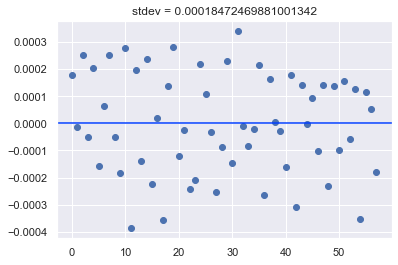

20220628
<Parameter 'd', value=2.1, bounds=[1.8:2.5]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.8:1.2]>
<Parameter 'd', value=2.1, bounds=[1.8:2.5]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.8:1.2]>
<Parameter 'd', value=2.1, bounds=[1.8:2.5]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.8:1.2]>
<Parameter 'd', value=2.1000000007399477, bounds=[1.8:2.5]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.8:1.2]>
<Parameter 'd', value=2.127071494057471, bounds=[1.8:2.5]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.8:1.2]>
<Parameter 'd', value=2.1270714943986424, bounds=[1.8:2.5]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.8:1.2]>
<Parameter 'd', value=2.1355709244077894, bounds=[1.8:2.5]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.8:1.2]>
<Parameter 'd', value=2.1355709246226775, bounds=[1.8:2.5]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.8:1.2]>
<Parameter 'd', value=2.1320186894145126, bounds=[1.8:2.5]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.8:1.2]>
<Parameter 

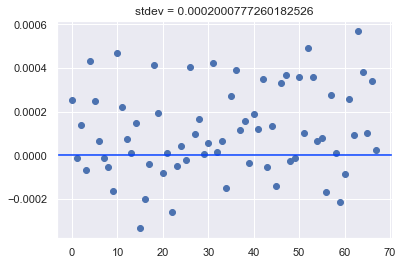

20220629_2
<Parameter 'd', value=2.1, bounds=[1.8:2.5]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.8:1.2]>
<Parameter 'd', value=2.1, bounds=[1.8:2.5]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.8:1.2]>
<Parameter 'd', value=2.1, bounds=[1.8:2.5]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.8:1.2]>
<Parameter 'd', value=2.1000000007399477, bounds=[1.8:2.5]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.8:1.2]>
<Parameter 'd', value=2.1106487740239466, bounds=[1.8:2.5]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.8:1.2]>
<Parameter 'd', value=2.110648774607842, bounds=[1.8:2.5]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.8:1.2]>
<Parameter 'd', value=2.125238896207133, bounds=[1.8:2.5]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.8:1.2]>
<Parameter 'd', value=2.1252388965754854, bounds=[1.8:2.5]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.8:1.2]>
<Parameter 'd', value=2.1320118218570974, bounds=[1.8:2.5]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.8:1.2]>
<Parameter

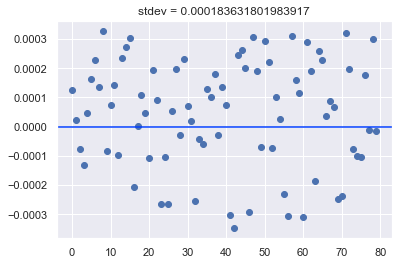

In [23]:
# dataset = All_StarkZeeman_Data['20220627']
E_field_datasets = {
'20220526': All_StarkZeeman_Data['20220526'],
'20220628': All_StarkZeeman_Data['20220628'],
'20220629_2': All_StarkZeeman_Data['20220629_2']}
E_field_results_ls1 = {}
for label,dataset in E_field_datasets.items():
    params = Parameters()
    params.add('d_mu', value=-0.5,min=-10,max=10,vary=False)
    params.add('d_kappa', value=2,min=-10,max=10,vary=False)
    params.add('d_B', value=-1,min=-10,max=10,vary=False)
    params.add('Temp', value=4.0,min=1,max=10,vary=False)
    params.add('d',value=2.1,min=1.8,max=2.5,vary=True)
    params.add('mu',value=1.0, min=0.8, max = 1.2,vary=False)
    # params.add('offset20220526',value=0,min=-0.0005,max=0.0005,vary=True)
    # params.add('offset20220616',value=0,min=-0.0005,max=0.0005,vary=True)
    # params.add('offset20220627',value=0,min=-0.0005,max=0.0005,vary=True)
    # params.add('offset20220628',value=0,min=-0.0005,max=0.0005,vary=True)
    # params.add('offset20220629_1',value=0,min=-0.0005,max=0.0005,vary=True)
    # params.add('offset20220629_2',value=0,min=-0.0005,max=0.0005,vary=True)
    print(label)
    t1 = time.time()
    out = minimize(field_line_residual, params, args=([dataset]))#,kws={'flist':True})#,method='least_squares')
    t2 = time.time()
    print(t2-t1)
    out.params.pretty_print()
    final_resid = field_line_residual(out.params,dataset,no_uncert=True)
    plt.figure()
    plt.plot(final_resid, 'bo')
    plt.axhline(y=0)
    plt.title('stdev = '+ str(final_resid.std()))
    plt.show()
    E_field_results_ls1[label] = out

<Parameter 'd', value=2.113295736382054 +/- 0.00657, bounds=[1.8:2.5]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.8:1.2]>


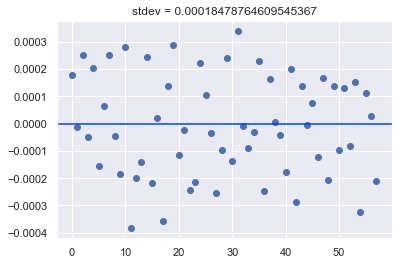

<Parameter 'd', value=2.1355709244077894 +/- 0.00274, bounds=[1.8:2.5]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.8:1.2]>


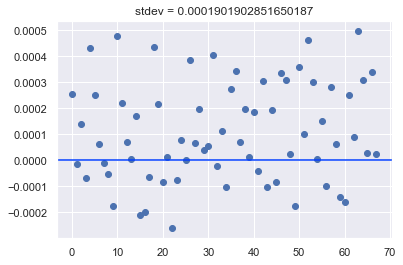

<Parameter 'd', value=2.1416194769056442 +/- 0.00179, bounds=[1.8:2.5]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.8:1.2]>


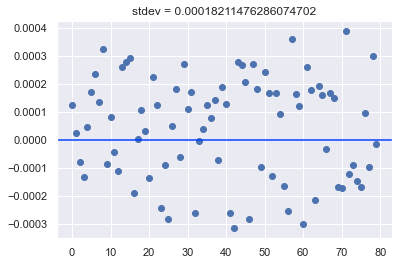

Text(0.5, 1.0, 'stdev = 0.0001912121485047611')

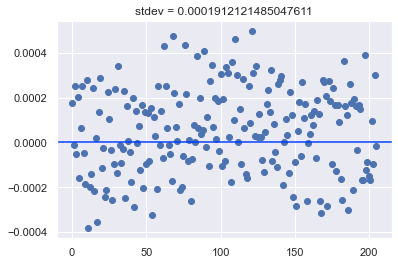

In [31]:
all_res1 = []
for label,out in E_field_results_ls1.items():
    final_resid = field_line_residual(out.params,E_field_datasets[label],no_uncert=True)
    plt.figure()
    plt.plot(final_resid, 'bo')
    plt.axhline(y=0)
    plt.title('stdev = '+ str(final_resid.std()))
    plt.show()
    all_res1.append(final_resid)
plt.figure()
all_res1 = np.concatenate((all_res1))
plt.plot(all_res1,'bo')
plt.axhline(y=0)
plt.title('stdev = '+str(all_res1.std()))

<Parameter 'd', value=2.1212464436903193 +/- 0.0236, bounds=[1.8:2.4]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.9:1.1]>


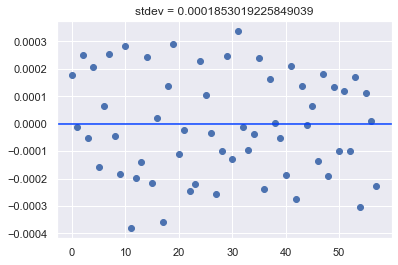

<Parameter 'd', value=2.1991503852906784 +/- 0.0233, bounds=[1.8:2.4]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.9:1.1]>


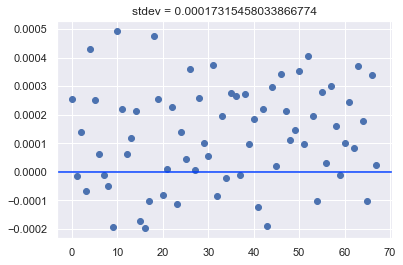

<Parameter 'd', value=2.1578709650865915 +/- 0.0215, bounds=[1.8:2.4]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.9:1.1]>


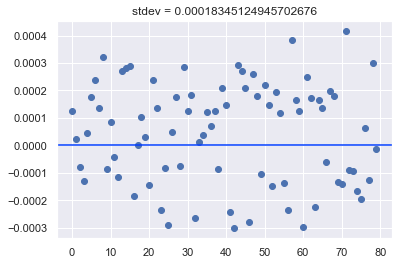

Text(0.5, 1.0, 'stdev = 0.0001884693546819665')

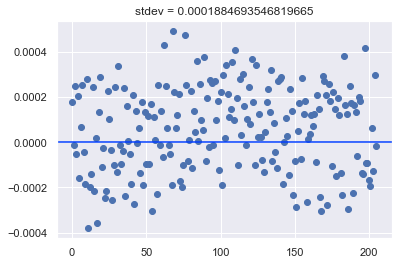

In [30]:
all_res2 = []
for label,out in E_field_results_ls2.items():
    final_resid = field_line_residual(out.params,E_field_datasets[label],no_uncert=True)
    plt.figure()
    plt.plot(final_resid, 'bo')
    plt.axhline(y=0)
    plt.title('stdev = '+ str(final_resid.std()))
    plt.show()
    all_res2.append(final_resid)
plt.figure()
all_res2 = np.concatenate((all_res2))
plt.plot(all_res2,'bo')
plt.axhline(y=0)
plt.title('stdev = '+str(all_res2.std()))

In [142]:
E_field_results_ls2['20220628']
# E_field_results['20220628']
# E_field_results['20220629_2']

In [144]:
E_field_results_ls1['20220628']

In [133]:
# dataset = All_StarkZeeman_Data['20220627']
B_field_datasets = {
'20220616': All_StarkZeeman_Data['20220616'],
'20220627': All_StarkZeeman_Data['20220627'],
'20220629_1': All_StarkZeeman_Data['20220629_1']}
E_field_results = {}
for label,dataset in B_field_datasets.items():
    params = Parameters()
    params.add('d_mu', value=-0.5,min=-10,max=10,vary=False)
    params.add('d_kappa', value=2,min=-10,max=10,vary=False)
    params.add('d_B', value=-1,min=-10,max=10,vary=False)
    params.add('Temp', value=4.0,min=1,max=10,vary=False)
    params.add('d',value=2.15,min=1.9,max=2.5,vary=False)
    params.add('mu',value=1.0, min=0.8, max = 1.2,vary=True)
    # params.add('offset20220526',value=0,min=-0.0005,max=0.0005,vary=True)
    # params.add('offset20220616',value=0,min=-0.0005,max=0.0005,vary=True)
    # params.add('offset20220627',value=0,min=-0.0005,max=0.0005,vary=True)
    # params.add('offset20220628',value=0,min=-0.0005,max=0.0005,vary=True)
    # params.add('offset20220629_1',value=0,min=-0.0005,max=0.0005,vary=True)
    # params.add('offset20220629_2',value=0,min=-0.0005,max=0.0005,vary=True)
    print(label)
    t1 = time.time()
    out = minimize(field_line_residual, params, args=([dataset]))#,kws={'flist':True})#,method='least_squares')
    t2 = time.time()
    print(t2-t1)
    out.params.pretty_print()
    E_field_results[label] = out

20220616
<Parameter 'd', value=2.15 (fixed), bounds=[1.9:2.5]>
<Parameter 'mu', value=1.0, bounds=[0.8:1.2]>
<Parameter 'd', value=2.15 (fixed), bounds=[1.9:2.5]>
<Parameter 'mu', value=1.0, bounds=[0.8:1.2]>
<Parameter 'd', value=2.15 (fixed), bounds=[1.9:2.5]>
<Parameter 'mu', value=1.0, bounds=[0.8:1.2]>
<Parameter 'd', value=2.15 (fixed), bounds=[1.9:2.5]>
<Parameter 'mu', value=1.0000000029802323, bounds=[0.8:1.2]>
<Parameter 'd', value=2.15 (fixed), bounds=[1.9:2.5]>
<Parameter 'mu', value=0.9998323360888377, bounds=[0.8:1.2]>
<Parameter 'd', value=2.15 (fixed), bounds=[1.9:2.5]>
<Parameter 'mu', value=0.9999832336069396, bounds=[0.8:1.2]>
<Parameter 'd', value=2.15 (fixed), bounds=[1.9:2.5]>
<Parameter 'mu', value=0.9999983233606919, bounds=[0.8:1.2]>
<Parameter 'd', value=2.15 (fixed), bounds=[1.9:2.5]>
<Parameter 'mu', value=0.9999998323360693, bounds=[0.8:1.2]>
<Parameter 'd', value=2.15 (fixed), bounds=[1.9:2.5]>
<Parameter 'mu', value=0.999999983233607, bounds=[0.8:1.2]>
<P

In [138]:
# dataset = All_StarkZeeman_Data['20220627']
B_field_datasets = {
'20220616': All_StarkZeeman_Data['20220616'],
'20220627': All_StarkZeeman_Data['20220627'],
'20220629_1': All_StarkZeeman_Data['20220629_1']}
all_field_results = {}
for label,dataset in All_StarkZeeman_Data.items():
    params = Parameters()
    params.add('d_mu', value=-0.5,min=-10,max=10,vary=False)
    params.add('d_kappa', value=2,min=-10,max=10,vary=False)
    params.add('d_B', value=-1,min=-10,max=10,vary=False)
    params.add('Temp', value=4.0,min=1,max=10,vary=False)
    params.add('d',value=2.1,min=1.8,max=2.5,vary=True)
    if label=='20220526':
        vary_mu=False
    else:
        vary_mu=True
    params.add('mu',value=1.0, min=0.8, max = 1.2,vary=vary_mu)
    # params.add('offset20220526',value=0,min=-0.0005,max=0.0005,vary=True)
    # params.add('offset20220616',value=0,min=-0.0005,max=0.0005,vary=True)
    # params.add('offset20220627',value=0,min=-0.0005,max=0.0005,vary=True)
    # params.add('offset20220628',value=0,min=-0.0005,max=0.0005,vary=True)
    # params.add('offset20220629_1',value=0,min=-0.0005,max=0.0005,vary=True)
    # params.add('offset20220629_2',value=0,min=-0.0005,max=0.0005,vary=True)
    print(label)
    t1 = time.time()
    out = minimize(field_line_residual, params, args=([dataset]))#,kws={'flist':True})#,method='least_squares')
    t2 = time.time()
    print(t2-t1)
    out.params.pretty_print()
    all_field_results[label] = out

20220526
<Parameter 'd', value=2.1, bounds=[1.8:2.5]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.8:1.2]>
<Parameter 'd', value=2.1, bounds=[1.8:2.5]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.8:1.2]>
<Parameter 'd', value=2.1, bounds=[1.8:2.5]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.8:1.2]>
<Parameter 'd', value=2.1000000007399477, bounds=[1.8:2.5]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.8:1.2]>
<Parameter 'd', value=2.113295736382054, bounds=[1.8:2.5]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.8:1.2]>
<Parameter 'd', value=2.1132957369269763, bounds=[1.8:2.5]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.8:1.2]>
<Parameter 'd', value=2.1035379601685733, bounds=[1.8:2.5]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.8:1.2]>
<Parameter 'd', value=2.1046163707985257, bounds=[1.8:2.5]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.8:1.2]>
<Parameter 'd', value=2.1093177005581034, bounds=[1.8:2.5]>
<Parameter 'mu', value=1.0 (fixed), bounds=[0.8:1.2]>
<Parameter 

<Parameter 'd', value=2.1, bounds=[1.8:2.5]>
<Parameter 'mu', value=1.0, bounds=[0.8:1.2]>
<Parameter 'd', value=2.1, bounds=[1.8:2.5]>
<Parameter 'mu', value=1.0, bounds=[0.8:1.2]>
<Parameter 'd', value=2.1000000007399477, bounds=[1.8:2.5]>
<Parameter 'mu', value=1.0, bounds=[0.8:1.2]>
<Parameter 'd', value=2.1, bounds=[1.8:2.5]>
<Parameter 'mu', value=1.0000000029802323, bounds=[0.8:1.2]>
<Parameter 'd', value=2.119899402131656, bounds=[1.8:2.5]>
<Parameter 'mu', value=1.01616735127336, bounds=[0.8:1.2]>
<Parameter 'd', value=2.1198994025790814, bounds=[1.8:2.5]>
<Parameter 'mu', value=1.01616735127336, bounds=[0.8:1.2]>
<Parameter 'd', value=2.119899402131656, bounds=[1.8:2.5]>
<Parameter 'mu', value=1.0161673515137462, bounds=[0.8:1.2]>
<Parameter 'd', value=2.130313564202299, bounds=[1.8:2.5]>
<Parameter 'mu', value=1.0195337821371289, bounds=[0.8:1.2]>
<Parameter 'd', value=2.1303135644953395, bounds=[1.8:2.5]>
<Parameter 'mu', value=1.0195337821371289, bounds=[0.8:1.2]>
<Paramet

<Parameter 'd', value=2.097345496727712, bounds=[1.8:2.5]>
<Parameter 'mu', value=0.9876659994990027, bounds=[0.8:1.2]>
<Parameter 'd', value=2.0973454680257286, bounds=[1.8:2.5]>
<Parameter 'mu', value=0.9876659950719802, bounds=[0.8:1.2]>
<Parameter 'd', value=2.0973454545233245, bounds=[1.8:2.5]>
<Parameter 'mu', value=0.9876659929893501, bounds=[0.8:1.2]>
<Parameter 'd', value=2.097345442870092, bounds=[1.8:2.5]>
<Parameter 'mu', value=0.9876659911919358, bounds=[0.8:1.2]>
212.48708653450012
Name        Value      Min      Max   Stderr     Vary     Expr Brute_Step
Temp            4        1       10        0    False     None     None
d           2.097      1.8      2.5 0.008182     True     None     None
d_B            -1      -10       10        0    False     None     None
d_kappa         2      -10       10        0    False     None     None
d_mu         -0.5      -10       10        0    False     None     None
mu         0.9877      0.8      1.2  0.00263     True     None   

In [119]:
def field_intensity_residual(params, dataset,heights_only=False,no_uncert=False,thresh = 7/29979.2458,Normalize=True):
    c1 = params['d_mu']
    c2 = params['d_kappa']
    c3 = params['d_B']
    T = params['Temp']
    v = [c1,c2,c3]
    d = params['d']
    mu = params['mu']
    total_diff = []
    print(v)
    for i,scan in enumerate(dataset):
        E,B= scan['EB']
        if heights_only:
            data_lines = scan['lines cal']
            data_heights = np.array(scan['heights'])
            norm_heights = data_heights/data_heights.max()
            height_uncertainty = norm_heights*0.05
            model_lines,tdms = simulate_spectra([d*E,mu*B],g,e,gidx,eidx,diagonalize=True,freq_array =None,origin = 17998.5875-319.908907,P_adjust=False,pad=100,T=T,square=True,dipole='x',cm=True,coeffs=v,thresh=1e-3,g=16/(29979.2458),make_lorentzians=False,plot=False)
            model_unique,idx_unique = np.unique(model_lines,return_index=True)
            tdms = np.array(tdms)
            tdm_unique = tdms[idx_unique]
            idx_sort = np.argsort(model_unique)
            model_lines = model_unique[idx_sort]
            tdm_lines = tdm_unique[idx_sort]
            line_diffs = model_lines[1:] - model_lines[:-1]
            line_group = [model_lines[0]]
            tdm_group = [tdm_lines[0]]
            line_avgs = []
            tdm_sums = []
            for j,ld in enumerate(line_diffs):
                if ld<=thresh:
                    line_group.append(model_lines[j+1])
                    tdm_group.append(tdm_lines[j+1])
                else:
                    line_avgs.append(sum(line_group)/len(line_group))
                    tdm_sums.append(sum(tdm_group))
                    line_group = [model_lines[j+1]]
                    tdm_group = [tdm_lines[j+1]]
            line_avgs.append(sum(line_group)/len(line_group))
            tdm_sums.append(sum(tdm_group))
            model_avgs = np.array(line_avgs)
            model_tdms = np.array(tdm_sums)
            if Normalize:
                model_tdms/=model_tdms.max()
            if len(model_avgs)>len(data_lines):
                diff_array = np.subtract.outer(data_lines, model_avgs)
                model_avgs = np.array([model_avgs[np.argmin(abs(_diff))] for _diff in diff_array])
                model_tdms = np.array([model_tdms[np.argmin(abs(_diff))] for _diff in diff_array])
            elif len(model_avgs)<len(data_lines):
                print('More lines fit ({}) than predicted ({}). Choosing nearest data lines'.format(len(data_lines),len(model_avgs)))
                print('Issue occured for i = {}, EB = {}'.format(i,(E,B)))
                diff_array = np.subtract.outer(model_avgs,data_lines)
                norm_heights = np.array([norm_heights[np.argmin(abs(_diff))] for _diff in diff_array])
                height_uncertainty = np.array([height_uncertainty[np.argmin(abs(_diff))] for _diff in diff_array])
            if no_uncert:
                height_uncertainty/=height_uncertainty
            total_diff.append((norm_heights - model_tdms)/height_uncertainty)
        else:
            freq,data = scan['data cal']
            data_norm = data/data.max()
            model_lines,[freq_out,tot_lor],tdms = simulate_spectra([d*E,mu*B],g,e,gidx,eidx,diagonalize=True,freq_array =freq,origin = 17998.5875-319.908907,P_adjust=False,pad=10,T=T,square=True,dipole='x',cm=True,coeffs=v,thresh=1e-4,g=16/(29979.2458),make_lorentzians=True,plot=False)
            if Normalize:
                tot_lor_norm = tot_lor/tot_lor.max()
                total_diff.append(data_norm - tot_lor_norm)
            else:
                total_diff.append(data_norm - tot_lor)
    total_diff = np.concatenate((total_diff))
    return total_diff

def all_field_intensity_residual(params, all_datasets,heights_only=False,thresh = 7/29979.2458, no_uncert=False, Normalize=True):
    c1 = params['d_mu']
    c2 = params['d_kappa']
    c3 = params['d_B']
    T = params['Temp']
    v = [c1,c2,c3]
    d = params['d']
    mu = params['mu']
    print(v)
    total_diff = []
    for label in all_datasets:
        dataset = all_datasets[label]
        dataset_diff = []
        for i,scan in enumerate(dataset):
            E,B= scan['EB']
            if heights_only:
                data_lines = scan['lines cal']
                data_heights = np.array(scan['heights'])
                norm_heights = data_heights/data_heights.max()
                height_uncertainty = norm_heights*0.05
                model_lines,tdms = simulate_spectra([d*E,mu*B],g,e,gidx,eidx,diagonalize=True,freq_array =None,origin = 17998.5875-319.908907,P_adjust=False,pad=100,T=T,square=True,dipole='x',cm=True,coeffs=v,thresh=1e-4,g=16/(29979.2458),make_lorentzians=False,plot=False)
                model_unique,idx_unique = np.unique(model_lines,return_index=True)
                tdms = np.array(tdms)
                tdm_unique = tdms[idx_unique]
                idx_sort = np.argsort(model_unique)
                model_lines = model_unique[idx_sort]
                tdm_lines = tdm_unique[idx_sort]
                line_diffs = model_lines[1:] - model_lines[:-1]
                line_group = [model_lines[0]]
                tdm_group = [tdm_lines[0]]
                line_avgs = []
                tdm_sums = []
                for j,ld in enumerate(line_diffs):
                    if ld<=thresh:
                        line_group.append(model_lines[j+1])
                        tdm_group.append(tdm_lines[j+1])
                    else:
                        line_avgs.append(sum(line_group)/len(line_group))
                        tdm_sums.append(sum(tdm_group))
                        line_group = [model_lines[j+1]]
                        tdm_group = [tdm_lines[j+1]]
                line_avgs.append(sum(line_group)/len(line_group))
                tdm_sums.append(sum(tdm_group))
                model_avgs = np.array(line_avgs)
                model_tdms = np.array(tdm_sums)
                if Normalize:
                    model_tdms/=model_tdms.max()
                if len(model_avgs)>len(data_lines):
                    diff_array = np.subtract.outer(data_lines, model_avgs)
                    model_avgs = np.array([model_avgs[np.argmin(abs(_diff))] for _diff in diff_array])
                    model_tdms = np.array([model_tdms[np.argmin(abs(_diff))] for _diff in diff_array])
                elif len(model_avgs)<len(data_lines):
                    print('More lines fit ({}) than predicted ({}). Choosing nearest data lines'.format(len(data_lines),len(model_avgs)))
                    print('Issue occured for {}, i = {}, EB = {}'.format(label,i,(E,B)))
                    diff_array = np.subtract.outer(model_avgs,data_lines)
                    norm_heights = np.array([norm_heights[np.argmin(abs(_diff))] for _diff in diff_array])
                    height_uncertainty = np.array([height_uncertainty[np.argmin(abs(_diff))] for _diff in diff_array])
                if no_uncert:
                    height_uncertainty/=height_uncertainty
                dataset_diff.append((norm_heights - model_tdms)/height_uncertainty)
            else:
                freq,data = scan['data cal']
                data_norm = data/data.max()
                model_lines,[freq_out,tot_lor],tdms = simulate_spectra([d*E,mu*B],g,e,gidx,eidx,diagonalize=True,freq_array =freq,origin = 17998.5875-319.908907,P_adjust=False,pad=10,T=T,square=True,dipole='x',cm=True,coeffs=v,thresh=1e-3,g=16/(29979.2458),make_lorentzians=True,plot=False)
                if Normalize:
                    tot_lor_norm = tot_lor/tot_lor.max()
                    dataset_diff.append(data_norm - tot_lor_norm)
                else:
                    dataset_diff.append(data_norm - tot_lor)
        dataset_diff = np.concatenate((dataset_diff))
        total_diff.append(dataset_diff)
    total_diff = np.concatenate((total_diff))
    return total_diff

In [118]:
dataset = All_StarkZeeman_Data['20220526']
method='least_squares'
heights_only=True
params = Parameters()
params.add('d_mu', value=0.5,min=-10,max=10,vary=True,brute_step=0.2)
params.add('d_kappa', value=-1.3,min=-10,max=10,vary=True,brute_step=0.2)
params.add('d_B', value=1,min=-10,max=10,vary=True)
params.add('Temp', value=4.0,min=1,max=10,vary=False)
params.add('d',value=2.12,min=0.1,max=10,vary=False)
params.add('mu',value=1.0, min=0.5, max = 3,vary=False)
t1 = time.time()
out_i = minimize(field_intensity_residual, params, args=([dataset]),kws={'heights_only':heights_only,'Normalize':False,'thresh':10/29979.2458},method=method)#,kws={'flist':True})#,method='least_squares')
t2 = time.time()
out_i.params.pretty_print()
final_resid_i = field_intensity_residual(out_i.params,dataset,heights_only=heights_only,no_uncert=True)
plt.figure()
plt.plot(final_resid_i, 'bo')
plt.axhline(y=0)
plt.title('stdev = '+ str(final_resid_i.std()))
plt.show()
print(t2-t1)

[<Parameter 'd_mu', value=0.5, bounds=[-10:10], brute_step=0.2>, <Parameter 'd_kappa', value=-1.3, bounds=[-10:10], brute_step=0.2>, <Parameter 'd_B', value=1.0, bounds=[-10:10]>]
More lines fit (6) than predicted (5). Choosing nearest data lines
Issue occured for i = 72, EB = (100.2, 0.001)
[<Parameter 'd_mu', value=0.5000000149011612, bounds=[-10:10], brute_step=0.2>, <Parameter 'd_kappa', value=-1.3, bounds=[-10:10], brute_step=0.2>, <Parameter 'd_B', value=1.0, bounds=[-10:10]>]
More lines fit (6) than predicted (5). Choosing nearest data lines
Issue occured for i = 72, EB = (100.2, 0.001)
[<Parameter 'd_mu', value=0.5, bounds=[-10:10], brute_step=0.2>, <Parameter 'd_kappa', value=-1.3000000193715096, bounds=[-10:10], brute_step=0.2>, <Parameter 'd_B', value=1.0, bounds=[-10:10]>]
More lines fit (6) than predicted (5). Choosing nearest data lines
Issue occured for i = 72, EB = (100.2, 0.001)
[<Parameter 'd_mu', value=0.5, bounds=[-10:10], brute_step=0.2>, <Parameter 'd_kappa', valu

KeyboardInterrupt: 

In [ ]:
dataset = All_StarkZeeman_Data['20220526']
method='least_squares'
heights_only=False
params = Parameters()
params.add('d_mu', value=0.1,min=-10,max=10,vary=True,brute_step=0.05)
params.add('d_kappa', value=0.1,min=-10,max=10,vary=True,brute_step=0.05)
params.add('d_B', value=0.1,min=-10,max=10,vary=False)
params.add('Temp', value=4.0,min=1,max=10,vary=False)
params.add('d',value=2.12,min=0.1,max=10,vary=False)
params.add('mu',value=1.0, min=0.5, max = 3,vary=False)
t1 = time.time()
out_j = minimize(field_intensity_residual, params, args=([dataset]),kws={'heights_only':heights_only,'Normalize':False,'thresh':10/29979.2458},method=method)#,kws={'flist':True})#,method='least_squares')
t2 = time.time()
out_j.params.pretty_print()
final_resid_j = field_intensity_residual(out_j.params,dataset,heights_only=heights_only,no_uncert=True)
plt.figure()
plt.plot(final_resid_j, 'bo')
plt.axhline(y=0)
plt.title('stdev = '+ str(final_resid_j.std()))
plt.show()
print(t2-t1)

In [102]:
out_i

In [103]:
out_j

[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.0, bounds=[-10:10]>, <Parameter 'd_B', value=1.5, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.0000000298023224, bounds=[-10:10]>, <Parameter 'd_B', value=1.5, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.0, bounds=[-10:10]>, <Parameter 'd_B', value=1.5000000223517418, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-1.7742879403876115, bounds=[-10:10]>, <Parameter 'd_B', value=3.276111731936327, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-1.774287966826562, bounds=[-10:10]>, <Parameter 'd_B', value=3.276111731936327, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-1.7742879403876115, bounds=[-10:10]>, <Parameter 'd_B', val

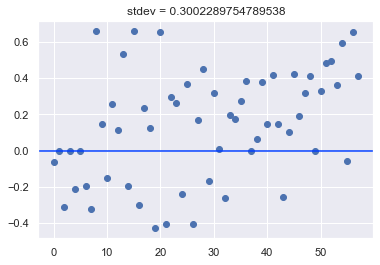

422.55615520477295
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.0, bounds=[-10:10]>, <Parameter 'd_B', value=1.5, bounds=[-10:10]>]
More lines fit (3) than predicted (2). Choosing nearest data lines
Issue occured for i = 1, EB = (0.0, 10.313212000000002)
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.0000000298023224, bounds=[-10:10]>, <Parameter 'd_B', value=1.5, bounds=[-10:10]>]
More lines fit (3) than predicted (2). Choosing nearest data lines
Issue occured for i = 1, EB = (0.0, 10.313212000000002)
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.0, bounds=[-10:10]>, <Parameter 'd_B', value=1.5000000223517418, bounds=[-10:10]>]
More lines fit (3) than predicted (2). Choosing nearest data lines
Issue occured for i = 1, EB = (0.0, 10.313212000000002)
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-1.9594716691833214, bounds=[-10:10]>

[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=3.884137793581507, bounds=[-10:10]>, <Parameter 'd_B', value=1.7687765848028265, bounds=[-10:10]>]
More lines fit (3) than predicted (2). Choosing nearest data lines
Issue occured for i = 1, EB = (0.0, 10.313212000000002)
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=3.8841378514596703, bounds=[-10:10]>, <Parameter 'd_B', value=1.7687765848028265, bounds=[-10:10]>]
More lines fit (3) than predicted (2). Choosing nearest data lines
Issue occured for i = 1, EB = (0.0, 10.313212000000002)
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=3.884137793581507, bounds=[-10:10]>, <Parameter 'd_B', value=1.7687766111596515, bounds=[-10:10]>]
More lines fit (3) than predicted (2). Choosing nearest data lines
Issue occured for i = 1, EB = (0.0, 10.313212000000002)
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=5

[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=9.274741015104777, bounds=[-10:10]>, <Parameter 'd_B', value=-1.4191477661164047, bounds=[-10:10]>]
More lines fit (3) than predicted (2). Choosing nearest data lines
Issue occured for i = 1, EB = (0.0, 10.313212000000002)
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=9.274741153309188, bounds=[-10:10]>, <Parameter 'd_B', value=-1.4191477661164047, bounds=[-10:10]>]
More lines fit (3) than predicted (2). Choosing nearest data lines
Issue occured for i = 1, EB = (0.0, 10.313212000000002)
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=9.274741015104777, bounds=[-10:10]>, <Parameter 'd_B', value=-1.4191477872633542, bounds=[-10:10]>]
More lines fit (3) than predicted (2). Choosing nearest data lines
Issue occured for i = 1, EB = (0.0, 10.313212000000002)
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value

[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=9.999450865394591, bounds=[-10:10]>, <Parameter 'd_B', value=-1.690131851977241, bounds=[-10:10]>]
More lines fit (3) than predicted (2). Choosing nearest data lines
Issue occured for i = 1, EB = (0.0, 10.313212000000002)
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=9.999451014398021, bounds=[-10:10]>, <Parameter 'd_B', value=-1.690131851977241, bounds=[-10:10]>]
More lines fit (3) than predicted (2). Choosing nearest data lines
Issue occured for i = 1, EB = (0.0, 10.313212000000002)
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=9.999450865394591, bounds=[-10:10]>, <Parameter 'd_B', value=-1.6901318771621683, bounds=[-10:10]>]
More lines fit (3) than predicted (2). Choosing nearest data lines
Issue occured for i = 1, EB = (0.0, 10.313212000000002)
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=9

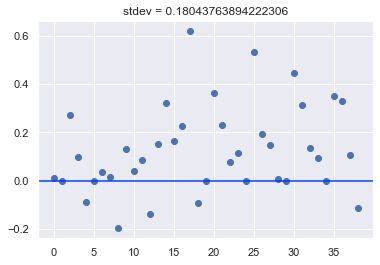

768.6804857254028
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.0, bounds=[-10:10]>, <Parameter 'd_B', value=1.5, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.0000000298023224, bounds=[-10:10]>, <Parameter 'd_B', value=1.5, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.0, bounds=[-10:10]>, <Parameter 'd_B', value=1.5000000223517418, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-1.9591394818430574, bounds=[-10:10]>, <Parameter 'd_B', value=1.6553856269007996, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-1.9591395110365106, bounds=[-10:10]>, <Parameter 'd_B', value=1.6553856269007996, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-1.9591394818430574, bounds=[-10:10]>, 

[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=9.999925892901544, bounds=[-10:10]>, <Parameter 'd_B', value=-1.8282569785557357, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=9.999926041912051, bounds=[-10:10]>, <Parameter 'd_B', value=-1.8282569785557357, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=9.999925892901544, bounds=[-10:10]>, <Parameter 'd_B', value=-1.8282570057988876, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=9.999925892901544, bounds=[-10:10]>, <Parameter 'd_B', value=-1.8282569785557357, bounds=[-10:10]>]
Name        Value      Min      Max   Stderr     Vary     Expr Brute_Step
Temp            4        1       10        0    False     None     None
d            2.14      0.1       10        0    False     None     None
d_B        -1.828      -10       10    194.4     T

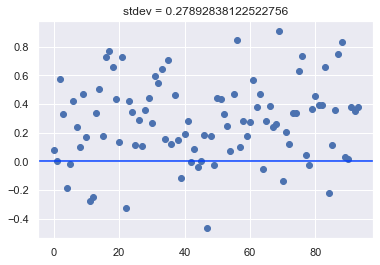

387.73029136657715
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.0, bounds=[-10:10]>, <Parameter 'd_B', value=1.5, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.0000000298023224, bounds=[-10:10]>, <Parameter 'd_B', value=1.5, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.0, bounds=[-10:10]>, <Parameter 'd_B', value=1.5000000223517418, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-1.9816165847180018, bounds=[-10:10]>, <Parameter 'd_B', value=1.7309926937677451, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-1.98161661424639, bounds=[-10:10]>, <Parameter 'd_B', value=1.7309926937677451, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-1.9816165847180018, bounds=[-10:10]>, <

[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-0.8190056806397197, bounds=[-10:10]>, <Parameter 'd_B', value=3.790618126913903, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-0.8188259591332949, bounds=[-10:10]>, <Parameter 'd_B', value=3.7905115703566756, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-0.8189607503039742, bounds=[-10:10]>, <Parameter 'd_B', value=3.790591445323246, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-0.8189607652051354, bounds=[-10:10]>, <Parameter 'd_B', value=3.790591445323246, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-0.8189607503039742, bounds=[-10:10]>, <Parameter 'd_B', value=3.79059150180746, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-0

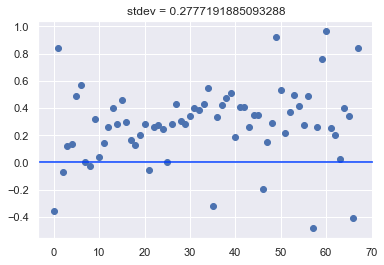

609.5527944564819
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.0, bounds=[-10:10]>, <Parameter 'd_B', value=1.5, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.0000000298023224, bounds=[-10:10]>, <Parameter 'd_B', value=1.5, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.0, bounds=[-10:10]>, <Parameter 'd_B', value=1.5000000223517418, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-1.9417910708201371, bounds=[-10:10]>, <Parameter 'd_B', value=1.8907753599539308, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-1.941791099755079, bounds=[-10:10]>, <Parameter 'd_B', value=1.8907753599539308, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-1.9417910708201371, bounds=[-10:10]>, <

[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-0.6470828827054302, bounds=[-10:10]>, <Parameter 'd_B', value=1.0773322350835113, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-0.49943501121309775, bounds=[-10:10]>, <Parameter 'd_B', value=1.0410097398658424, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-0.610153827977808, bounds=[-10:10]>, <Parameter 'd_B', value=1.0683100079225776, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-0.6101538428789692, bounds=[-10:10]>, <Parameter 'd_B', value=1.0683100079225776, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-0.610153827977808, bounds=[-10:10]>, <Parameter 'd_B', value=1.0683100238416372, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', valu

[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-0.5505112280615448, bounds=[-10:10]>, <Parameter 'd_B', value=1.0536122534454588, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-0.5505112280615448, bounds=[-10:10]>, <Parameter 'd_B', value=1.0536122377454131, bounds=[-10:10]>]
Name        Value      Min      Max   Stderr     Vary     Expr Brute_Step
Temp            4        1       10        0    False     None     None
d            2.14      0.1       10        0    False     None     None
d_B         1.054      -10       10 3.859e-09     True     None     None
d_kappa   -0.5505      -10       10   0.2523     True     None     None
d_mu            1      -10       10        0    False     None     None
mu              1      0.5        3        0    False     None     None
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-0.5505112280615448 +/- 0.252, bounds=[-10

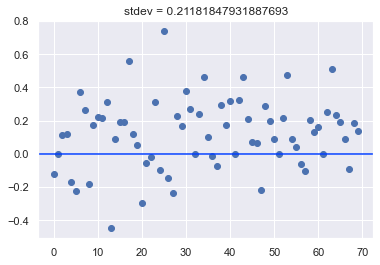

729.8985691070557
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.0, bounds=[-10:10]>, <Parameter 'd_B', value=1.5, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.0000000298023224, bounds=[-10:10]>, <Parameter 'd_B', value=1.5, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.0, bounds=[-10:10]>, <Parameter 'd_B', value=1.5000000223517418, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-1.9276695821169845, bounds=[-10:10]>, <Parameter 'd_B', value=1.5302911182691603, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-1.9276696108414997, bounds=[-10:10]>, <Parameter 'd_B', value=1.5302911182691603, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-1.9276695821169845, bounds=[-10:10]>, 

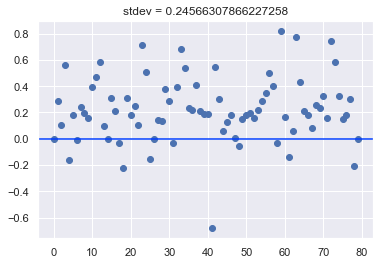

317.3589336872101


In [128]:
# dataset = All_StarkZeeman_Data['20220627']
#Some values: [0.74,-1.30,1]
#[-0.22,1.50,1]
all_intensity_results = {}
method='least_squares'
heights_only=True
Normalize=True
thresh=10/29979.2458
for label,dataset in All_StarkZeeman_Data.items():
    params = Parameters()
    params.add('d_mu', value=1,min=-10,max=10,vary=False)
    params.add('d_kappa', value=-2,min=-10,max=10,vary=True)
    params.add('d_B', value=1.5,min=-10,max=10,vary=True)
    params.add('Temp', value=4.0,min=1,max=10,vary=False)
    params.add('d',value=2.14,min=0.1,max=10,vary=False)
    params.add('mu',value=1.0, min=0.5, max = 3,vary=False)
    t1 = time.time()
    out_i = minimize(field_intensity_residual, params, args=([dataset]),kws={'heights_only':heights_only,'thresh':thresh,'Normalize':Normalize},method=method)#,kws={'flist':True})#,method='least_squares')
    t2 = time.time()
    out_i.params.pretty_print()
    final_resid_i = field_intensity_residual(out_i.params,dataset,heights_only=heights_only,no_uncert=True)
    plt.figure()
    plt.plot(final_resid_i, 'bo')
    plt.axhline(y=0)
    plt.title('stdev = '+ str(final_resid_i.std()))
    plt.show()
    print(t2-t1)
    all_intensity_results[label] = out_i

[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.0, bounds=[-10:10]>, <Parameter 'd_B', value=1.5, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.0000000298023224, bounds=[-10:10]>, <Parameter 'd_B', value=1.5, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.0, bounds=[-10:10]>, <Parameter 'd_B', value=1.5000000223517418, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-1.8222568688578937, bounds=[-10:10]>, <Parameter 'd_B', value=3.4438126872307384, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-1.822256896011637, bounds=[-10:10]>, <Parameter 'd_B', value=3.4438126872307384, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-1.8222568688578937, bounds=[-10:10]>, <Parameter 'd_B', v

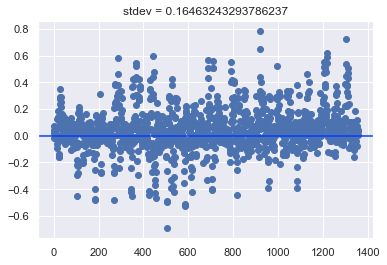

417.3355166912079
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.0, bounds=[-10:10]>, <Parameter 'd_B', value=1.5, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.0000000298023224, bounds=[-10:10]>, <Parameter 'd_B', value=1.5, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.0, bounds=[-10:10]>, <Parameter 'd_B', value=1.5000000223517418, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-1.9689312745340144, bounds=[-10:10]>, <Parameter 'd_B', value=2.0181485394112966, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-1.9689313038733767, bounds=[-10:10]>, <Parameter 'd_B', value=2.0181485394112966, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-1.9689312745340144, bounds=[-10:10]>, 

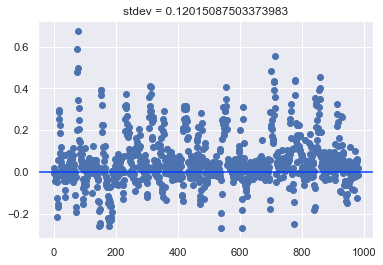

289.8281533718109
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.0, bounds=[-10:10]>, <Parameter 'd_B', value=1.5, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.0000000298023224, bounds=[-10:10]>, <Parameter 'd_B', value=1.5, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.0, bounds=[-10:10]>, <Parameter 'd_B', value=1.5000000223517418, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-1.9480611649363744, bounds=[-10:10]>, <Parameter 'd_B', value=1.654727973646652, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-1.9480611939647479, bounds=[-10:10]>, <Parameter 'd_B', value=1.654727973646652, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-1.9480611649363744, bounds=[-10:10]>, <P

Name        Value      Min      Max   Stderr     Vary     Expr Brute_Step
Temp            4        1       10        0    False     None     None
d            2.14      0.1       10        0    False     None     None
d_B        -1.904      -10       10    58.53     True     None     None
d_kappa        10      -10       10      212     True     None     None
d_mu            1      -10       10        0    False     None     None
mu              1      0.5        3        0    False     None     None
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=9.99992687492137 +/- 212, bounds=[-10:10]>, <Parameter 'd_B', value=-1.903738704999004 +/- 58.5, bounds=[-10:10]>]


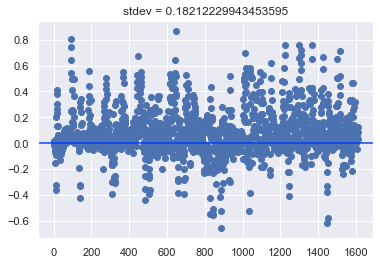

364.74940752983093
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.0, bounds=[-10:10]>, <Parameter 'd_B', value=1.5, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.0000000298023224, bounds=[-10:10]>, <Parameter 'd_B', value=1.5, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.0, bounds=[-10:10]>, <Parameter 'd_B', value=1.5000000223517418, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-1.993126702806371, bounds=[-10:10]>, <Parameter 'd_B', value=1.8010785425492655, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-1.9931267325062734, bounds=[-10:10]>, <Parameter 'd_B', value=1.8010785425492655, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-1.993126702806371, bounds=[-10:10]>, <

[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=3.300994504160294, bounds=[-10:10]>, <Parameter 'd_B', value=-0.44693878841587975, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=3.3009945533489455, bounds=[-10:10]>, <Parameter 'd_B', value=-0.44693878841587975, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=3.300994504160294, bounds=[-10:10]>, <Parameter 'd_B', value=-0.44693880331704094, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=3.180636983715035, bounds=[-10:10]>, <Parameter 'd_B', value=-0.4051263453413737, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=3.1806370311102192, bounds=[-10:10]>, <Parameter 'd_B', value=-0.4051263453413737, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', val

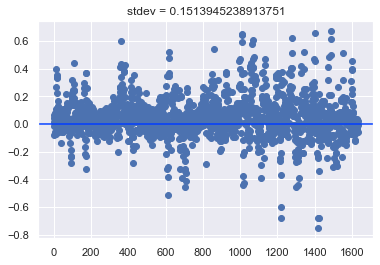

482.3354139328003
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.0, bounds=[-10:10]>, <Parameter 'd_B', value=1.5, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.0000000298023224, bounds=[-10:10]>, <Parameter 'd_B', value=1.5, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.0, bounds=[-10:10]>, <Parameter 'd_B', value=1.5000000223517418, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-1.9094598857343423, bounds=[-10:10]>, <Parameter 'd_B', value=1.8766203243525874, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-1.909459914187512, bounds=[-10:10]>, <Parameter 'd_B', value=1.8766203243525874, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-1.9094598857343423, bounds=[-10:10]>, <

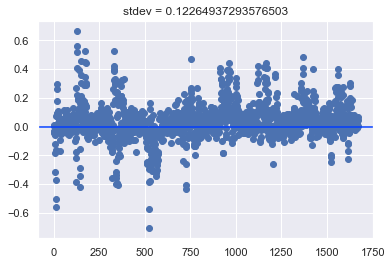

269.6727731227875
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.0, bounds=[-10:10]>, <Parameter 'd_B', value=1.5, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.0000000298023224, bounds=[-10:10]>, <Parameter 'd_B', value=1.5, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.0, bounds=[-10:10]>, <Parameter 'd_B', value=1.5000000223517418, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-1.8862039901637226, bounds=[-10:10]>, <Parameter 'd_B', value=1.7908684860156812, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-1.8862040182703523, bounds=[-10:10]>, <Parameter 'd_B', value=1.7908684860156812, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-1.8862039901637226, bounds=[-10:10]>, 

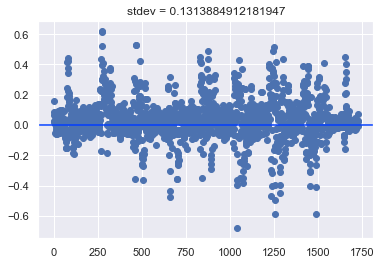

292.5118637084961


In [127]:
# dataset = All_StarkZeeman_Data['20220627']
# [0.636,-1.68,1]
all_intensity_results2 = {}
method='least_squares'
heights_only=False
Normalize=True
thresh=10/29979.2458
for label,dataset in All_StarkZeeman_Data.items():
    params = Parameters()
    params.add('d_mu', value=1,min=-10,max=10,vary=False)
    params.add('d_kappa', value=-2,min=-10,max=10,vary=True)
    params.add('d_B', value=1.5,min=-10,max=10,vary=True)
    params.add('Temp', value=4.0,min=1,max=10,vary=False)
    params.add('d',value=2.14,min=0.1,max=10,vary=False)
    params.add('mu',value=1.0, min=0.5, max = 3,vary=False)
    t1 = time.time()
    out_i = minimize(field_intensity_residual, params, args=([dataset]),kws={'heights_only':heights_only,'thresh':thresh,'Normalize':Normalize},method=method)#,kws={'flist':True})#,method='least_squares')
    t2 = time.time()
    out_i.params.pretty_print()
    final_resid_i = field_intensity_residual(out_i.params,dataset,heights_only=heights_only,no_uncert=True)
    plt.figure()
    plt.plot(final_resid_i, 'bo')
    plt.axhline(y=0)
    plt.title('stdev = '+ str(final_resid_i.std()))
    plt.show()
    print(t2-t1)
    all_intensity_results2[label] = out_i

[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.0, bounds=[-10:10]>, <Parameter 'd_B', value=1.5, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.0985418041731494, bounds=[-10:10]>, <Parameter 'd_B', value=1.5, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.0, bounds=[-10:10]>, <Parameter 'd_B', value=1.5743891607612053, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.0985418041731494, bounds=[-10:10]>, <Parameter 'd_B', value=1.5743891607612053, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.196870896635086, bounds=[-10:10]>, <Parameter 'd_B', value=1.5, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.2949773105843487, bounds=[-10:10]>, <Parameter 'd_B', value=1.46277327

[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.2429249332161882, bounds=[-10:10]>, <Parameter 'd_B', value=1.4705271224025331, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.234783619916831, bounds=[-10:10]>, <Parameter 'd_B', value=1.4681836056748665, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.2215988729923097, bounds=[-10:10]>, <Parameter 'd_B', value=1.4648273589973666, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.2115133434983765, bounds=[-10:10]>, <Parameter 'd_B', value=1.4628020178820087, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.190753431958532, bounds=[-10:10]>, <Parameter 'd_B', value=1.4579263788380317, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value

[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.10092756541653, bounds=[-10:10]>, <Parameter 'd_B', value=1.4352888011134706, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.100761595594477, bounds=[-10:10]>, <Parameter 'd_B', value=1.435245861741592, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.1009093483271357, bounds=[-10:10]>, <Parameter 'd_B', value=1.4352630181733943, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.101054319515182, bounds=[-10:10]>, <Parameter 'd_B', value=1.4353242284899501, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.1009576721078123, bounds=[-10:10]>, <Parameter 'd_B', value=1.4352834216183474, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2

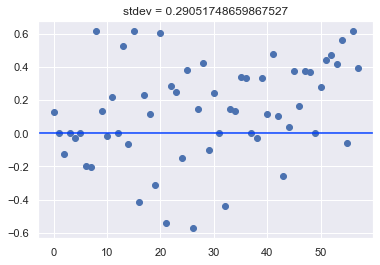

1494.2635734081268
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.0, bounds=[-10:10]>, <Parameter 'd_B', value=1.5, bounds=[-10:10]>]
More lines fit (3) than predicted (2). Choosing nearest data lines
Issue occured for i = 1, EB = (0.0, 10.313212000000002)
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.0985418041731494, bounds=[-10:10]>, <Parameter 'd_B', value=1.5, bounds=[-10:10]>]
More lines fit (3) than predicted (2). Choosing nearest data lines
Issue occured for i = 1, EB = (0.0, 10.313212000000002)
More lines fit (6) than predicted (5). Choosing nearest data lines
Issue occured for i = 4, EB = (0.0, 40.64320000000001)
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.0, bounds=[-10:10]>, <Parameter 'd_B', value=1.5743891607612053, bounds=[-10:10]>]
More lines fit (3) than predicted (2). Choosing nearest data lines
Issue occured for i = 1, EB = (0.0, 10.313212000000002

More lines fit (3) than predicted (2). Choosing nearest data lines
Issue occured for i = 1, EB = (0.0, 10.313212000000002)
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.8783843753854015, bounds=[-10:10]>, <Parameter 'd_B', value=-0.7802789689519827, bounds=[-10:10]>]
More lines fit (3) than predicted (2). Choosing nearest data lines
Issue occured for i = 1, EB = (0.0, 10.313212000000002)
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=4.593659070115484, bounds=[-10:10]>, <Parameter 'd_B', value=1.0686955858057843, bounds=[-10:10]>]
More lines fit (3) than predicted (2). Choosing nearest data lines
Issue occured for i = 1, EB = (0.0, 10.313212000000002)
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=2.590900070329347, bounds=[-10:10]>, <Parameter 'd_B', value=-0.959277615266922, bounds=[-10:10]>]
More lines fit (3) than predicted (2). Choosing nearest data lines
Issue occured f

More lines fit (3) than predicted (2). Choosing nearest data lines
Issue occured for i = 1, EB = (0.0, 10.313212000000002)
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=1.2943459319542843, bounds=[-10:10]>, <Parameter 'd_B', value=-0.7370344981142516, bounds=[-10:10]>]
More lines fit (3) than predicted (2). Choosing nearest data lines
Issue occured for i = 1, EB = (0.0, 10.313212000000002)
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=1.2433909100464646, bounds=[-10:10]>, <Parameter 'd_B', value=-0.6598033778365284, bounds=[-10:10]>]
More lines fit (3) than predicted (2). Choosing nearest data lines
Issue occured for i = 1, EB = (0.0, 10.313212000000002)
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=1.281610326140246, bounds=[-10:10]>, <Parameter 'd_B', value=-0.7177306788550162, bounds=[-10:10]>]
More lines fit (3) than predicted (2). Choosing nearest data lines
Issue occured

More lines fit (3) than predicted (2). Choosing nearest data lines
Issue occured for i = 1, EB = (0.0, 10.313212000000002)
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-1.6912674119020359, bounds=[-10:10]>, <Parameter 'd_B', value=1.2153188091946632, bounds=[-10:10]>]
More lines fit (3) than predicted (2). Choosing nearest data lines
Issue occured for i = 1, EB = (0.0, 10.313212000000002)
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.023721856589532, bounds=[-10:10]>, <Parameter 'd_B', value=1.42984854993502, bounds=[-10:10]>]
More lines fit (2) than predicted (1). Choosing nearest data lines
Issue occured for i = 0, EB = (0.0, 0.050804)
More lines fit (3) than predicted (2). Choosing nearest data lines
Issue occured for i = 1, EB = (0.0, 10.313212000000002)
More lines fit (5) than predicted (4). Choosing nearest data lines
Issue occured for i = 7, EB = (0.0, 71.12559999999999)
More lines fit (5) than predict

More lines fit (3) than predicted (2). Choosing nearest data lines
Issue occured for i = 1, EB = (0.0, 10.313212000000002)
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-1.8378537142867657, bounds=[-10:10]>, <Parameter 'd_B', value=1.3090808223871555, bounds=[-10:10]>]
More lines fit (3) than predicted (2). Choosing nearest data lines
Issue occured for i = 1, EB = (0.0, 10.313212000000002)
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-1.8765670958428764, bounds=[-10:10]>, <Parameter 'd_B', value=1.333535316764383, bounds=[-10:10]>]
More lines fit (3) than predicted (2). Choosing nearest data lines
Issue occured for i = 1, EB = (0.0, 10.313212000000002)
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-1.8790233899337938, bounds=[-10:10]>, <Parameter 'd_B', value=1.3351570756113738, bounds=[-10:10]>]
More lines fit (3) than predicted (2). Choosing nearest data lines
Issue occured

More lines fit (3) than predicted (2). Choosing nearest data lines
Issue occured for i = 1, EB = (0.0, 10.313212000000002)
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-1.8733363940595424, bounds=[-10:10]>, <Parameter 'd_B', value=1.3317183809190247, bounds=[-10:10]>]
More lines fit (3) than predicted (2). Choosing nearest data lines
Issue occured for i = 1, EB = (0.0, 10.313212000000002)
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-1.8709368152135415, bounds=[-10:10]>, <Parameter 'd_B', value=1.3302348834765372, bounds=[-10:10]>]
More lines fit (3) than predicted (2). Choosing nearest data lines
Issue occured for i = 1, EB = (0.0, 10.313212000000002)
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-1.8730123938468246, bounds=[-10:10]>, <Parameter 'd_B', value=1.3315092729313953, bounds=[-10:10]>]
More lines fit (3) than predicted (2). Choosing nearest data lines
Issue occure

More lines fit (3) than predicted (2). Choosing nearest data lines
Issue occured for i = 1, EB = (0.0, 10.313212000000002)
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-1.873099882885068, bounds=[-10:10]>, <Parameter 'd_B', value=1.3315732702835152, bounds=[-10:10]>]
More lines fit (3) than predicted (2). Choosing nearest data lines
Issue occured for i = 1, EB = (0.0, 10.313212000000002)
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-1.8732675873460352, bounds=[-10:10]>, <Parameter 'd_B', value=1.3316772471205205, bounds=[-10:10]>]
More lines fit (3) than predicted (2). Choosing nearest data lines
Issue occured for i = 1, EB = (0.0, 10.313212000000002)
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-1.873349433349535, bounds=[-10:10]>, <Parameter 'd_B', value=1.3317280737041042, bounds=[-10:10]>]
More lines fit (3) than predicted (2). Choosing nearest data lines
Issue occured 

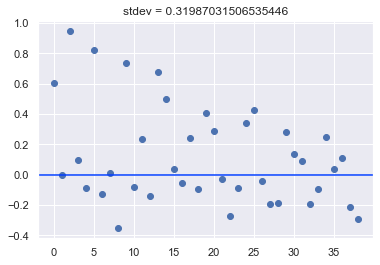

1471.5001153945923
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.0, bounds=[-10:10]>, <Parameter 'd_B', value=1.5, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.0985418041731494, bounds=[-10:10]>, <Parameter 'd_B', value=1.5, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.0, bounds=[-10:10]>, <Parameter 'd_B', value=1.5743891607612053, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.0985418041731494, bounds=[-10:10]>, <Parameter 'd_B', value=1.5743891607612053, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.0246548468866132, bounds=[-10:10]>, <Parameter 'd_B', value=1.5186054251344316, bounds=[-10:10]>]
More lines fit (6) than predicted (4). Choosing nearest data lines
Issue occured for i = 1, EB = (244.0, 0.050804)
[<Para

[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.133191263493069, bounds=[-10:10]>, <Parameter 'd_B', value=1.4634642324661904, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.133612603904755, bounds=[-10:10]>, <Parameter 'd_B', value=1.4628825781942556, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.1332924909814475, bounds=[-10:10]>, <Parameter 'd_B', value=1.463423972370439, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.133708353175421, bounds=[-10:10]>, <Parameter 'd_B', value=1.4629825227078186, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.133320536473942, bounds=[-10:10]>, <Parameter 'd_B', value=1.463343805351883, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.

[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.133621978905971, bounds=[-10:10]>, <Parameter 'd_B', value=1.4630044150589772, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.133619687998383, bounds=[-10:10]>, <Parameter 'd_B', value=1.4630072191544663, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.1336212152701206, bounds=[-10:10]>, <Parameter 'd_B', value=1.4630053497574877, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.133621978905971, bounds=[-10:10]>, <Parameter 'd_B', value=1.4630044150589772, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.133622196879835, bounds=[-10:10]>, <Parameter 'd_B', value=1.4630041133586182, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-

[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.133621222227794, bounds=[-10:10]>, <Parameter 'd_B', value=1.4630053415016153, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.133621226177322, bounds=[-10:10]>, <Parameter 'd_B', value=1.4630053368297737, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.133621223215176, bounds=[-10:10]>, <Parameter 'd_B', value=1.4630053403336536, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.1336212251899402, bounds=[-10:10]>, <Parameter 'd_B', value=1.4630053379977337, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.133621226177321, bounds=[-10:10]>, <Parameter 'd_B', value=1.4630053368297737, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-

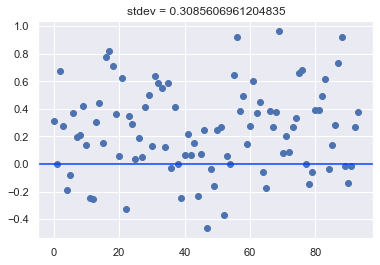

1137.5008692741394
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.0, bounds=[-10:10]>, <Parameter 'd_B', value=1.5, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.0985418041731494, bounds=[-10:10]>, <Parameter 'd_B', value=1.5, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.0, bounds=[-10:10]>, <Parameter 'd_B', value=1.5743891607612053, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-1.9012554724779136, bounds=[-10:10]>, <Parameter 'd_B', value=1.5743891607612053, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-1.8023182305175425, bounds=[-10:10]>, <Parameter 'd_B', value=1.6115505427361008, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-1.8023182305175425, bounds=[-10:10]>,

[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-1.7819706957158807, bounds=[-10:10]>, <Parameter 'd_B', value=1.3301468318927299, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-1.7790289428238406, bounds=[-10:10]>, <Parameter 'd_B', value=1.3312210338205617, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-1.794610783045055, bounds=[-10:10]>, <Parameter 'd_B', value=1.332892291851941, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-1.784223387252645, bounds=[-10:10]>, <Parameter 'd_B', value=1.331778124039376, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-1.7920141211824063, bounds=[-10:10]>, <Parameter 'd_B', value=1.3326137514774832, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-

[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-1.7817269430408, bounds=[-10:10]>, <Parameter 'd_B', value=1.3300822932303529, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-1.7818629997927395, bounds=[-10:10]>, <Parameter 'd_B', value=1.3301183488699806, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-1.7817269018924904, bounds=[-10:10]>, <Parameter 'd_B', value=1.3300821305293926, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-1.7818459978609056, bounds=[-10:10]>, <Parameter 'd_B', value=1.330113862253599, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-1.7817325966483182, bounds=[-10:10]>, <Parameter 'd_B', value=1.3300837345361636, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-

[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-1.7817473581308558, bounds=[-10:10]>, <Parameter 'd_B', value=1.3300876256409477, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-1.7817461776018888, bounds=[-10:10]>, <Parameter 'd_B', value=1.330087311838204, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-1.7817471993564826, bounds=[-10:10]>, <Parameter 'd_B', value=1.330087583434194, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-1.7817462006380058, bounds=[-10:10]>, <Parameter 'd_B', value=1.3300873179566928, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-1.781747068757646, bounds=[-10:10]>, <Parameter 'd_B', value=1.3300875487198844, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=

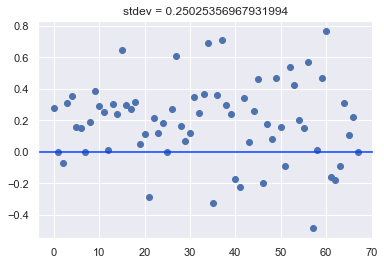

1475.8326816558838
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.0, bounds=[-10:10]>, <Parameter 'd_B', value=1.5, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.0985418041731494, bounds=[-10:10]>, <Parameter 'd_B', value=1.5, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.0, bounds=[-10:10]>, <Parameter 'd_B', value=1.5743891607612053, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-1.9012554724779136, bounds=[-10:10]>, <Parameter 'd_B', value=1.5743891607612053, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-1.8023182305175425, bounds=[-10:10]>, <Parameter 'd_B', value=1.6115505427361008, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-1.8023182305175425, bounds=[-10:10]>,

[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-1.8826708363734213, bounds=[-10:10]>, <Parameter 'd_B', value=1.3902467083215875, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.460809261409219, bounds=[-10:10]>, <Parameter 'd_B', value=1.5174200341336856, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-0.9221642683621525, bounds=[-10:10]>, <Parameter 'd_B', value=1.1623488934750643, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-1.8124838244703696, bounds=[-10:10]>, <Parameter 'd_B', value=1.3812352899627012, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-1.1989180466421843, bounds=[-10:10]>, <Parameter 'd_B', value=1.223901113529692, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value

[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.340369617107818, bounds=[-10:10]>, <Parameter 'd_B', value=1.4941549635711446, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.338545210768821, bounds=[-10:10]>, <Parameter 'd_B', value=1.493820987912219, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.335685217210509, bounds=[-10:10]>, <Parameter 'd_B', value=1.4931146364035754, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.339358801014688, bounds=[-10:10]>, <Parameter 'd_B', value=1.4939927752767446, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.3401805731562364, bounds=[-10:10]>, <Parameter 'd_B', value=1.4942346225401142, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2

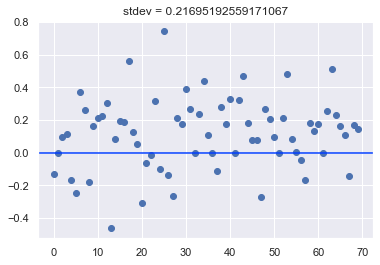

855.1581494808197
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.0, bounds=[-10:10]>, <Parameter 'd_B', value=1.5, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.0985418041731494, bounds=[-10:10]>, <Parameter 'd_B', value=1.5, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.0, bounds=[-10:10]>, <Parameter 'd_B', value=1.5743891607612053, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-1.9012554724779136, bounds=[-10:10]>, <Parameter 'd_B', value=1.5743891607612053, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-1.8023182305175425, bounds=[-10:10]>, <Parameter 'd_B', value=1.6115505427361008, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-1.8023182305175425, bounds=[-10:10]>, 

[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=4.379975144090473, bounds=[-10:10]>, <Parameter 'd_B', value=0.34488585746994005, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=4.079223818504612, bounds=[-10:10]>, <Parameter 'd_B', value=0.41320987564164113, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=4.342106965485595, bounds=[-10:10]>, <Parameter 'd_B', value=0.37636852869790083, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=3.191264807882611, bounds=[-10:10]>, <Parameter 'd_B', value=0.5866072918325198, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=3.494164354902294, bounds=[-10:10]>, <Parameter 'd_B', value=0.5262036097150542, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=4.59

[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=9.219407043770687, bounds=[-10:10]>, <Parameter 'd_B', value=-0.389296905179048, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=9.588203540500018, bounds=[-10:10]>, <Parameter 'd_B', value=-0.46839357527492, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=9.810914214811639, bounds=[-10:10]>, <Parameter 'd_B', value=-0.5286413966618912, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=9.676966346131703, bounds=[-10:10]>, <Parameter 'd_B', value=-0.5060423752968006, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=9.35183986735861, bounds=[-10:10]>, <Parameter 'd_B', value=-0.41848887994640194, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=9.595

[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=9.999996032491055, bounds=[-10:10]>, <Parameter 'd_B', value=-0.5280117557590849, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=9.999629213256664, bounds=[-10:10]>, <Parameter 'd_B', value=-0.5279658429974159, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=9.999933007816107, bounds=[-10:10]>, <Parameter 'd_B', value=-0.5286120622516073, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=9.999300865416036, bounds=[-10:10]>, <Parameter 'd_B', value=-0.5290393346158755, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=9.999407363178612, bounds=[-10:10]>, <Parameter 'd_B', value=-0.5282659965553123, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=9.

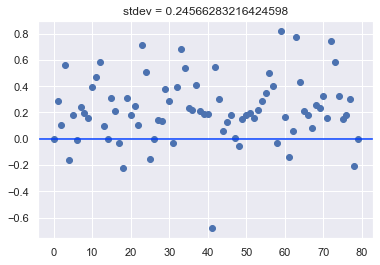

1337.7891900539398


In [129]:
# dataset = All_StarkZeeman_Data['20220627']
#Some values: [0.74,-1.30,1]
#[-0.22,1.50,1]
all_intensity_results3 = {}
method='nelder'
heights_only=True
Normalize=True
thresh=10/29979.2458
for label,dataset in All_StarkZeeman_Data.items():
    params = Parameters()
    params.add('d_mu', value=1,min=-10,max=10,vary=False)
    params.add('d_kappa', value=-2,min=-10,max=10,vary=True)
    params.add('d_B', value=1.5,min=-10,max=10,vary=True)
    params.add('Temp', value=4.0,min=1,max=10,vary=False)
    params.add('d',value=2.14,min=0.1,max=10,vary=False)
    params.add('mu',value=1.0, min=0.5, max = 3,vary=False)
    t1 = time.time()
    out_i = minimize(field_intensity_residual, params, args=([dataset]),kws={'heights_only':heights_only,'thresh':thresh,'Normalize':Normalize},method=method)#,kws={'flist':True})#,method='least_squares')
    t2 = time.time()
    out_i.params.pretty_print()
    final_resid_i = field_intensity_residual(out_i.params,dataset,heights_only=heights_only,no_uncert=True)
    plt.figure()
    plt.plot(final_resid_i, 'bo')
    plt.axhline(y=0)
    plt.title('stdev = '+ str(final_resid_i.std()))
    plt.show()
    print(t2-t1)
    all_intensity_results3[label] = out_i

[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.0, bounds=[-10:10]>, <Parameter 'd_B', value=1.5, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.0000000298023224, bounds=[-10:10]>, <Parameter 'd_B', value=1.5, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.0, bounds=[-10:10]>, <Parameter 'd_B', value=1.5000000223517418, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-1.8222568688578937, bounds=[-10:10]>, <Parameter 'd_B', value=3.4438126872307384, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-1.822256896011637, bounds=[-10:10]>, <Parameter 'd_B', value=3.4438126872307384, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-1.8222568688578937, bounds=[-10:10]>, <Parameter 'd_B', v

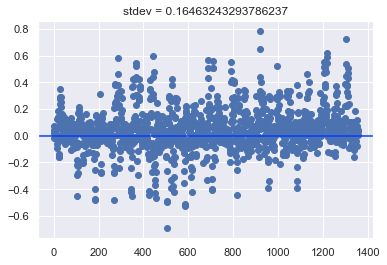

427.6626818180084
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.0, bounds=[-10:10]>, <Parameter 'd_B', value=1.5, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.0000000298023224, bounds=[-10:10]>, <Parameter 'd_B', value=1.5, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.0, bounds=[-10:10]>, <Parameter 'd_B', value=1.5000000223517418, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-1.9689312745340144, bounds=[-10:10]>, <Parameter 'd_B', value=2.0181485394112966, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-1.9689313038733767, bounds=[-10:10]>, <Parameter 'd_B', value=2.0181485394112966, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-1.9689312745340144, bounds=[-10:10]>, 

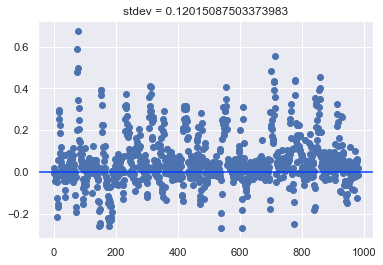

293.09026408195496
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.0, bounds=[-10:10]>, <Parameter 'd_B', value=1.5, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.0000000298023224, bounds=[-10:10]>, <Parameter 'd_B', value=1.5, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.0, bounds=[-10:10]>, <Parameter 'd_B', value=1.5000000223517418, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-1.9480611649363744, bounds=[-10:10]>, <Parameter 'd_B', value=1.654727973646652, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-1.9480611939647479, bounds=[-10:10]>, <Parameter 'd_B', value=1.654727973646652, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-1.9480611649363744, bounds=[-10:10]>, <

Name        Value      Min      Max   Stderr     Vary     Expr Brute_Step
Temp            4        1       10        0    False     None     None
d            2.14      0.1       10        0    False     None     None
d_B        -1.904      -10       10    58.53     True     None     None
d_kappa        10      -10       10      212     True     None     None
d_mu            1      -10       10        0    False     None     None
mu              1      0.5        3        0    False     None     None
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=9.99992687492137 +/- 212, bounds=[-10:10]>, <Parameter 'd_B', value=-1.903738704999004 +/- 58.5, bounds=[-10:10]>]


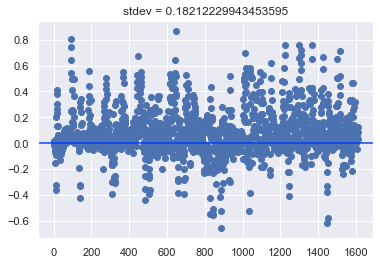

368.1324679851532
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.0, bounds=[-10:10]>, <Parameter 'd_B', value=1.5, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.0000000298023224, bounds=[-10:10]>, <Parameter 'd_B', value=1.5, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.0, bounds=[-10:10]>, <Parameter 'd_B', value=1.5000000223517418, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-1.993126702806371, bounds=[-10:10]>, <Parameter 'd_B', value=1.8010785425492655, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-1.9931267325062734, bounds=[-10:10]>, <Parameter 'd_B', value=1.8010785425492655, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-1.993126702806371, bounds=[-10:10]>, <P

[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=3.300994504160294, bounds=[-10:10]>, <Parameter 'd_B', value=-0.44693878841587975, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=3.3009945533489455, bounds=[-10:10]>, <Parameter 'd_B', value=-0.44693878841587975, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=3.300994504160294, bounds=[-10:10]>, <Parameter 'd_B', value=-0.44693880331704094, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=3.180636983715035, bounds=[-10:10]>, <Parameter 'd_B', value=-0.4051263453413737, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=3.1806370311102192, bounds=[-10:10]>, <Parameter 'd_B', value=-0.4051263453413737, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', val

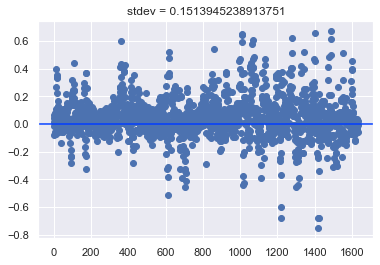

484.0086257457733
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.0, bounds=[-10:10]>, <Parameter 'd_B', value=1.5, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.0000000298023224, bounds=[-10:10]>, <Parameter 'd_B', value=1.5, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.0, bounds=[-10:10]>, <Parameter 'd_B', value=1.5000000223517418, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-1.9094598857343423, bounds=[-10:10]>, <Parameter 'd_B', value=1.8766203243525874, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-1.909459914187512, bounds=[-10:10]>, <Parameter 'd_B', value=1.8766203243525874, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-1.9094598857343423, bounds=[-10:10]>, <

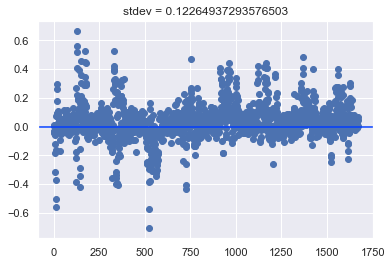

269.7680082321167
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.0, bounds=[-10:10]>, <Parameter 'd_B', value=1.5, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.0000000298023224, bounds=[-10:10]>, <Parameter 'd_B', value=1.5, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-2.0, bounds=[-10:10]>, <Parameter 'd_B', value=1.5000000223517418, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-1.8862039901637226, bounds=[-10:10]>, <Parameter 'd_B', value=1.7908684860156812, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-1.8862040182703523, bounds=[-10:10]>, <Parameter 'd_B', value=1.7908684860156812, bounds=[-10:10]>]
[<Parameter 'd_mu', value=1 (fixed), bounds=[-10:10]>, <Parameter 'd_kappa', value=-1.8862039901637226, bounds=[-10:10]>, 

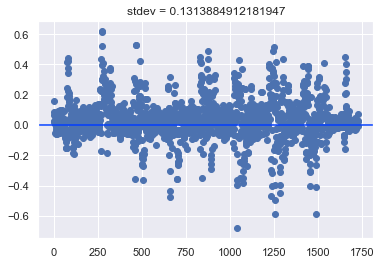

294.45827865600586


In [130]:
# dataset = All_StarkZeeman_Data['20220627']
all_intensity_results4 = {}
heights_only=False
method='least_squares'
Normalize=True
thresh=10/29979.2458
for label,dataset in All_StarkZeeman_Data.items():
    params = Parameters()
    params.add('d_mu', value=1,min=-10,max=10,vary=False)
    params.add('d_kappa', value=-2,min=-10,max=10,vary=True)
    params.add('d_B', value=1.5,min=-10,max=10,vary=True)
    params.add('Temp', value=4.0,min=1,max=10,vary=False)
    params.add('d',value=2.14,min=0.1,max=10,vary=False)
    params.add('mu',value=1.0, min=0.5, max = 3,vary=False)
    t1 = time.time()
    out_i = minimize(field_intensity_residual, params, args=([dataset]),kws={'heights_only':heights_only,'thresh':thresh,'Normalize':Normalize},method=method)#,kws={'flist':True})#,method='least_squares')
    t2 = time.time()
    out_i.params.pretty_print()
    final_resid_i = field_intensity_residual(out_i.params,dataset,heights_only=heights_only,no_uncert=True)
    plt.figure()
    plt.plot(final_resid_i, 'bo')
    plt.axhline(y=0)
    plt.title('stdev = '+ str(final_resid_i.std()))
    plt.show()
    print(t2-t1)
    all_intensity_results4[label] = out_i

In [84]:
# dataset = All_StarkZeeman_Data['20220526']
dataset = All_StarkZeeman_Data
params = Parameters()
params.add('d_mu', value=0.5,min=-10,max=10,vary=True)
params.add('d_kappa', value=0.5,min=-10,max=10,vary=True)
params.add('d_B', value=1,min=-10,max=10,vary=False)
params.add('Temp', value=4.0,min=1,max=10,vary=False)
params.add('d',value=2.14,min=0.1,max=10,vary=False)
params.add('mu',value=1.0, min=0.5, max = 3,vary=False)
t1 = time.time()
out = minimize(all_field_intensity_residual, params, args=([dataset]),kws={'heights_only':False},method='nelder')#,kws={'flist':True})#,method='least_squares')
t2 = time.time()
out.params.pretty_print()
final_resid = all_field_intensity_residual(out.params,dataset,heights_only=False,no_uncert=True)
plt.figure()
plt.plot(final_resid, 'bo')
plt.axhline(y=0)
plt.title('stdev = '+ str(final_resid.std()))
plt.show()
print(t2-t1)

[<Parameter 'd_mu', value=0.5, bounds=[-10:10]>, <Parameter 'd_kappa', value=0.5, bounds=[-10:10]>, <Parameter 'd_B', value=1 (fixed), bounds=[-10:10]>]
[<Parameter 'd_mu', value=0.5249775559588681, bounds=[-10:10]>, <Parameter 'd_kappa', value=0.5, bounds=[-10:10]>, <Parameter 'd_B', value=1 (fixed), bounds=[-10:10]>]
[<Parameter 'd_mu', value=0.5, bounds=[-10:10]>, <Parameter 'd_kappa', value=0.5249775559588681, bounds=[-10:10]>, <Parameter 'd_B', value=1 (fixed), bounds=[-10:10]>]
[<Parameter 'd_mu', value=0.5249775559588681, bounds=[-10:10]>, <Parameter 'd_kappa', value=0.5249775559588681, bounds=[-10:10]>, <Parameter 'd_B', value=1 (fixed), bounds=[-10:10]>]
[<Parameter 'd_mu', value=0.537465112260282, bounds=[-10:10]>, <Parameter 'd_kappa', value=0.537465112260282, bounds=[-10:10]>, <Parameter 'd_B', value=1 (fixed), bounds=[-10:10]>]
[<Parameter 'd_mu', value=0.5624376838666816, bounds=[-10:10]>, <Parameter 'd_kappa', value=0.5124891786956489, bounds=[-10:10]>, <Parameter 'd_B',

[<Parameter 'd_mu', value=1.6070933102157152, bounds=[-10:10]>, <Parameter 'd_kappa', value=1.658942065406638, bounds=[-10:10]>, <Parameter 'd_B', value=1 (fixed), bounds=[-10:10]>]
[<Parameter 'd_mu', value=1.6291633565517394, bounds=[-10:10]>, <Parameter 'd_kappa', value=1.7048143739626376, bounds=[-10:10]>, <Parameter 'd_B', value=1 (fixed), bounds=[-10:10]>]
[<Parameter 'd_mu', value=1.720039829781319, bounds=[-10:10]>, <Parameter 'd_kappa', value=2.0032122146496096, bounds=[-10:10]>, <Parameter 'd_B', value=1 (fixed), bounds=[-10:10]>]
[<Parameter 'd_mu', value=1.857414130503681, bounds=[-10:10]>, <Parameter 'd_kappa', value=2.504197587361112, bounds=[-10:10]>, <Parameter 'd_B', value=1 (fixed), bounds=[-10:10]>]
[<Parameter 'd_mu', value=2.0505143258460823, bounds=[-10:10]>, <Parameter 'd_kappa', value=3.1651407287548405, bounds=[-10:10]>, <Parameter 'd_B', value=1 (fixed), bounds=[-10:10]>]
[<Parameter 'd_mu', value=2.1624867292288634, bounds=[-10:10]>, <Parameter 'd_kappa', val

KeyboardInterrupt: 

In [68]:
out

In [ ]:
# dataset = All_StarkZeeman_Data['20220526']
dataset = All_StarkZeeman_Data
params = Parameters()
params.add('d_mu', value=0.5,min=-10,max=10,vary=True)
params.add('d_kappa', value=0.5,min=-10,max=10,vary=True)
params.add('d_B', value=1,min=-10,max=10,vary=False)
params.add('Temp', value=4.0,min=1,max=10,vary=False)
params.add('d',value=2.14,min=0.1,max=10,vary=False)
params.add('mu',value=1.0, min=0.5, max = 3,vary=False)
t1 = time.time()
out2 = minimize(all_field_intensity_residual, params, args=([dataset]),kws={'heights_only':True},method='nelder')#,kws={'flist':True})#,method='least_squares')
t2 = time.time()
out2.params.pretty_print()
final_resid2 = all_field_intensity_residual(out2.params,dataset,heights_only=True,no_uncert=True)
plt.figure()
plt.plot(final_resid2, 'bo')
plt.axhline(y=0)
plt.title('stdev = '+ str(final_resid2.std()))
plt.show()
print(t2-t1)

In [ ]:
out2

In [ ]:
# dataset = All_StarkZeeman_Data['20220526']
dataset = All_StarkZeeman_Data
params = Parameters()
params.add('d_mu', value=0.5,min=-10,max=10,vary=True)
params.add('d_kappa', value=0.5,min=-10,max=10,vary=True)
params.add('d_B', value=1,min=-10,max=10,vary=False)
params.add('Temp', value=4.0,min=1,max=10,vary=False)
params.add('d',value=2.14,min=0.1,max=10,vary=False)
params.add('mu',value=1.0, min=0.5, max = 3,vary=False)
t1 = time.time()
out3 = minimize(all_field_intensity_residual, params, args=([dataset]),kws={'heights_only':True},method='basinhopping')#,kws={'flist':True})#,method='least_squares')
t2 = time.time()
out3.params.pretty_print()
final_resid3 = all_field_intensity_residual(out3.params,dataset,heights_only=True,no_uncert=True)
plt.figure()
plt.plot(final_resid3, 'bo')
plt.axhline(y=0)
plt.title('stdev = '+ str(final_resid3.std()))
plt.show()
print(t2-t1)

In [ ]:
# dataset = All_StarkZeeman_Data['20220526']
dataset = All_StarkZeeman_Data
params = Parameters()
params.add('d_mu', value=0.5,min=-10,max=10,vary=True)
params.add('d_kappa', value=0.5,min=-10,max=10,vary=True)
params.add('d_B', value=1,min=-10,max=10,vary=False)
params.add('Temp', value=4.0,min=1,max=10,vary=False)
params.add('d',value=2.14,min=0.1,max=10,vary=False)
params.add('mu',value=1.0, min=0.5, max = 3,vary=False)
t1 = time.time()
out4 = minimize(all_field_intensity_residual, params, args=([dataset]),kws={'heights_only':False},method='basinhopping')#,kws={'flist':True})#,method='least_squares')
t2 = time.time()
out4.params.pretty_print()
final_resid4 = all_field_intensity_residual(out4.params,dataset,heights_only=False,no_uncert=True)
plt.figure()
plt.plot(final_resid4, 'bo')
plt.axhline(y=0)
plt.title('stdev = '+ str(final_resid4.std()))
plt.show()
print(t2-t1)

In [75]:
out4

In [ ]:
# dataset = All_StarkZeeman_Data['20220526']
dataset = All_StarkZeeman_Data
params = Parameters()
params.add('d_mu', value=0.5,min=-10,max=10,vary=True)
params.add('d_kappa', value=0.5,min=-10,max=10,vary=True)
params.add('d_B', value=1,min=-10,max=10,vary=False)
params.add('Temp', value=4.0,min=1,max=10,vary=False)
params.add('d',value=2.14,min=0.1,max=10,vary=False)
params.add('mu',value=1.0, min=0.5, max = 3,vary=False)
t1 = time.time()
out5 = minimize(all_field_intensity_residual, params, args=([dataset]),kws={'heights_only':False},method='least_squares')#,kws={'flist':True})#,method='least_squares')
t2 = time.time()
final_resid5 = all_field_intensity_residual(out5.params,dataset,heights_only=False,no_uncert=True)
plt.figure()
plt.plot(final_resid5, 'bo')
plt.axhline(y=0)
plt.title('stdev = '+ str(final_resid5.std()))
plt.show()
print(t2-t1)

In [ ]:
# dataset = All_StarkZeeman_Data['20220526']
dataset = All_StarkZeeman_Data
params = Parameters()
params.add('d_mu', value=0.5,min=-10,max=10,vary=True)
params.add('d_kappa', value=0.5,min=-10,max=10,vary=True)
params.add('d_B', value=1,min=-10,max=10,vary=False)
params.add('Temp', value=4.0,min=1,max=10,vary=False)
params.add('d',value=2.14,min=0.1,max=10,vary=False)
params.add('mu',value=1.0, min=0.5, max = 3,vary=False)
t1 = time.time()
out6 = minimize(all_field_intensity_residual, params, args=([dataset]),kws={'heights_only':True},method='powell')#,kws={'flist':True})#,method='least_squares')
t2 = time.time()
final_resid6 = all_field_intensity_residual(out6.params,dataset,heights_only=True,no_uncert=True)
plt.figure()
plt.plot(final_resid6, 'bo')
plt.axhline(y=0)
plt.title('stdev = '+ str(final_resid6.std()))
plt.show()
print(t2-t1)

In [399]:
for scan in dataset:
    thresh = 1e-4
    E,B= scan['EB']
    print(E,B)
    data_lines = scan['lines cal']
    model_lines,[freq_out,tot_lor],tdms = simulate_spectra([E,B],g,e,gidx,eidx,diagonalize=True,freq_array =None,origin = 17998.5875-319.908907,P_adjust=False,pad=100,T=T,square=square,dipole='x',cm=True,coeffs=v,thresh=1e-3,g=16/(29979.2458),plot=False)
    model_lines=np.sort(np.unique(model_lines))
    line_diffs = model_lines[1:] - model_lines[:-1]
    line_group = [model_lines[0]]
    line_avgs = []
    for i,ld in enumerate(line_diffs):
        if ld<=thresh:
            line_group.append(model_lines[i+1])
        else:
            line_avgs.append(sum(line_group)/len(line_group))
            line_group = [model_lines[i+1]]
    line_avgs.append(sum(line_group)/len(line_group))
    model_avgs = np.array(line_avgs)
    if len(model_avgs)>len(line_avgs):
        diff_array = np.subtract.outer(line_avgs, model_avgs)
        close_model_lines = [model_avgs[np.argmin(abs(_diff))] for _diff in diff_array]
    elif len(model_avgs)<len(line_avgs):
        print('More lines fit than predicted')
        
    

0.0 0.001
10.04 0.001
20.3 0.001
30.2 0.001
40.24 0.001
50.26 0.001
60.22 0.001
70.18 0.001
100.2 0.001
150.2 0.001
190.6 0.001
230.6 0.001
264.4 0.001


In [390]:
diff_array = np.subtract.outer(data_lines, model_avgs)

In [397]:
close_model_lines = [model_avgs[np.argmin(abs(_diff))] for _diff in diff_array]

In [398]:
close_model_lines

[17004.87858511613,
 17004.880372910484,
 17004.883752994672,
 17004.888526510094,
 17004.889783491362]

In [123]:
g = MoleculeLevels.initialize_state('YbOH','174','X010',[1,2],M_values = 'all',I=[0,0],S=1/2,round=8,P_values=[1/2,3/2])
e = MoleculeLevels.initialize_state('YbOH','174','A000',[1,2],M_values = 'all',I=[0,0],S=1/2,round=8,P_values=[1/2,3/2])
Bz = np.linspace(1e-3,70,1001)
Ez = np.linspace(0,300,1001)
g.ZeemanMap(Bz,0,idx=g.select_q({'N':1}))
e.ZeemanMap(Bz,0,idx=e.select_q({'J':1.5,'P':[1/2,-1/2]},parity='-'))
g.StarkMap(Ez,1e-4,idx=g.select_q({'N':1}))
e.StarkMap(Ez,1e-4,idx=e.select_q({'J':1.5,'P':[1/2,-1/2]},parity='-'))

g.eigensystem(0,1e-3)
e.eigensystem(0,1e-3)
gidx = g.select_q({'N':[1]})
eidx = e.select_q({'J':[1.5],'P':[1/2,-1/2]},parity='-')

C:\Users\ajadbaba\AppData\Local\Temp\ipykernel_29656\3932846959.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


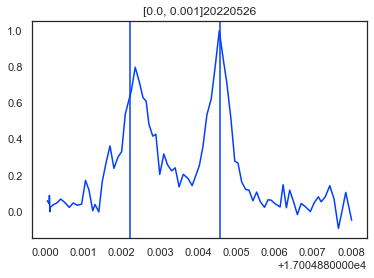

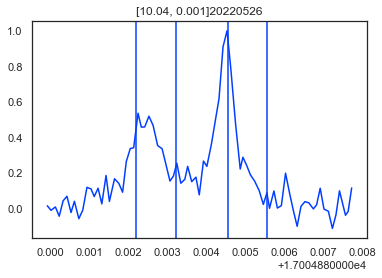

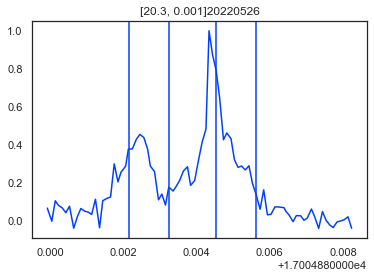

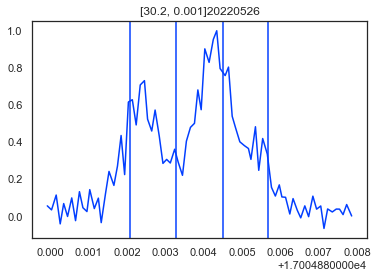

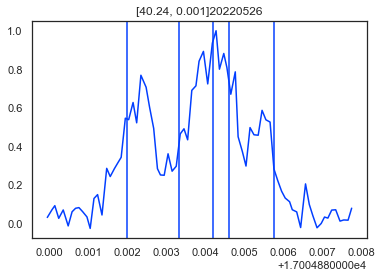

...

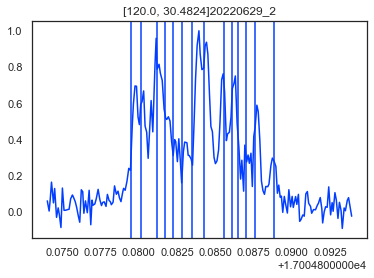

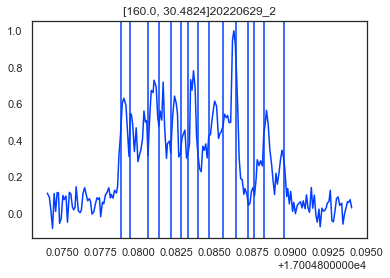

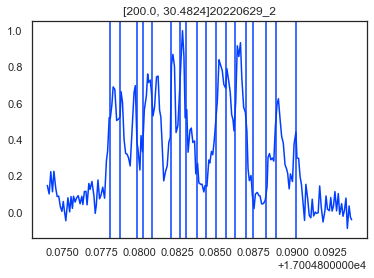

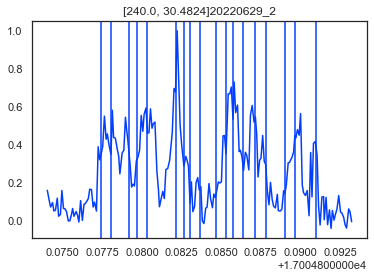

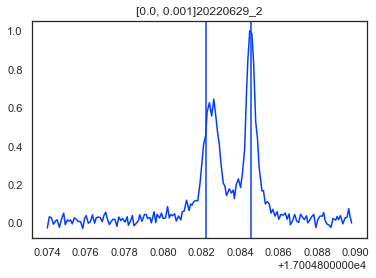

In [195]:
plot_lorentzian=False
all_dataset= E_field_datasets
for label in all_dataset:
    dataset = all_dataset[label]
    for scan in dataset:
        plt.figure()
        plt.title(str(scan['EB'])+label)
        freq_arr,data_arr = scan['data cal']
        data_norm=data_arr/data_arr.max()
        plt.plot(freq_arr,data_norm)
        E,B = scan['EB']
        d=2.12
        mu=1
        T=4
        square=True
#         v=[0.6,-1.5,1]
        v = [0.5,0.5,1]
        if plot_lorentzian:
            model_lines,[freq_out,tot_lor],tdms = simulate_spectra([E,B],g,e,gidx,eidx,diagonalize=True,freq_array =freq_arr,origin = 17998.5875-319.908907,P_adjust=False,pad=10,T=T,square=True,dipole='x',cm=True,coeffs=v,thresh=1e-3,g=16/(29979.2458),make_lorentzians=True,plot=False)
            plt.plot(freq_out,tot_lor/tot_lor.max())
        else:
            model_lines,tdms = simulate_spectra([E,B],g,e,gidx,eidx,diagonalize=True,freq_array =None,origin = 17998.5875-319.908907,P_adjust=False,pad=100,T=T,square=True,dipole='x',cm=True,coeffs=v,thresh=1e-3,g=16/(29979.2458),make_lorentzians=False,plot=False)
            model_lines=np.sort(model_lines)
#             [plt.axvline(x=f) for f in model_lines];
            line_diffs = model_lines[1:] - model_lines[:-1]
            line_group = [model_lines[0]]
            line_avgs = []
            thresh=10/29979.2458
            for i,ld in enumerate(line_diffs):
                if ld<=thresh and model_lines[i+1] - line_group[0] < thresh*1.5:
                    line_group.append(model_lines[i+1])
                else:
                    line_avgs.append(sum(line_group)/len(line_group))
                    line_group = [model_lines[i+1]]
            line_avgs.append(sum(line_group)/len(line_group))
            model_avgs = np.array(line_avgs)
#             if B<61 and B>60:
#                 print(model_avgs)
            [plt.axvline(x=f) for f in model_avgs];

C:\Users\ajadbaba\AppData\Local\Temp\ipykernel_33308\4096905643.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


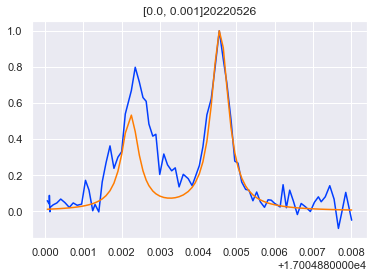

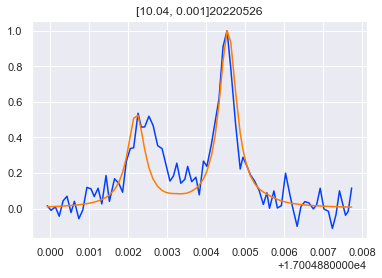

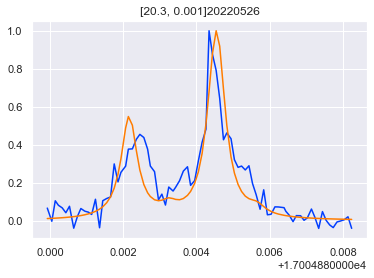

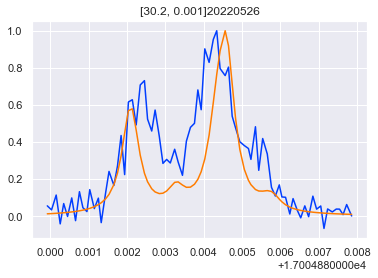

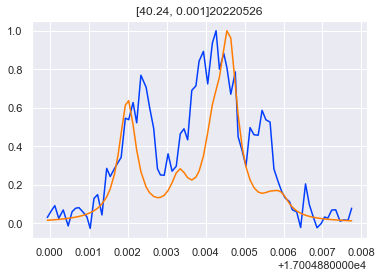

...

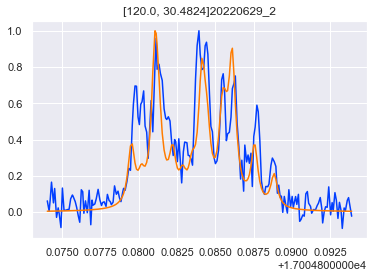

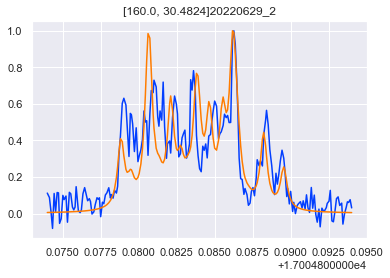

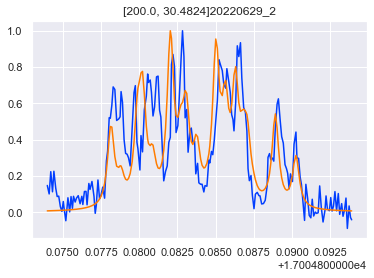

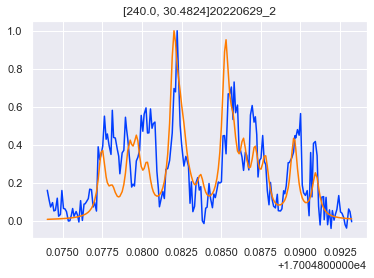

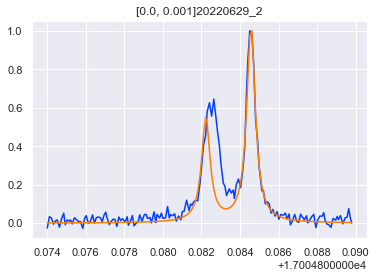

In [131]:
plot_lorentzian=True
for label in All_StarkZeeman_Data:
    dataset = All_StarkZeeman_Data[label]
    for scan in dataset:
        plt.figure()
        plt.title(str(scan['EB'])+label)
        freq_arr,data_arr = scan['data cal']
        data_norm=data_arr/data_arr.max()
        plt.plot(freq_arr,data_norm)
        E,B = scan['EB']
        d=2.12
        mu=1
        T=4
        square=True
#         v=[0.6,-1.5,1]
        v = [1,-2.3,1.5]
        if plot_lorentzian:
            model_lines,[freq_out,tot_lor],tdms = simulate_spectra([d*E,mu*B],g,e,gidx,eidx,diagonalize=True,freq_array =freq_arr,origin = 17998.5875-319.908907,P_adjust=False,pad=10,T=T,square=True,dipole='x',cm=True,coeffs=v,thresh=1e-3,g=16/(29979.2458),make_lorentzians=True,plot=False)
            plt.plot(freq_out,tot_lor/tot_lor.max())
        else:
            model_lines,tdms = simulate_spectra([d*E,mu*B],g,e,gidx,eidx,diagonalize=True,freq_array =None,origin = 17998.5875-319.908907,P_adjust=False,pad=100,T=T,square=True,dipole='x',cm=True,coeffs=v,thresh=1e-3,g=16/(29979.2458),make_lorentzians=False,plot=False)
            model_lines=np.sort(np.unique(model_lines))
            line_diffs = model_lines[1:] - model_lines[:-1]
            line_group = [model_lines[0]]
            line_avgs = []
            thresh=10/29979.2458
            for i,ld in enumerate(line_diffs):
                if ld<=thresh:
                    line_group.append(model_lines[i+1])
                else:
                    line_avgs.append(sum(line_group)/len(line_group))
                    line_group = [model_lines[i+1]]
            line_avgs.append(sum(line_group)/len(line_group))
            model_avgs = np.array(line_avgs)
            [plt.axvline(x=f) for f in model_avgs];

In [354]:
dataset[8]['lines cal']

array([17004.881477865, 17004.882303565, 17004.883069406, 17004.883814993,
       17004.884683113, 17004.886000312, 17004.886828419])

In [261]:
def field_line_residual(params, scans,thresh = 5/29979.2458):
        c1 = params['d_mu']
        c2 = params['d_kappa']
        c3 = params['d_B']
        T = params['Temp']
        v = [c1,c2,c3]
        E = 0
        B=1e-3
        offset = params['offset']
        print(offset)
        lines,[freq_out,tot_lor],tdms = simulate_spectra([E,B],g,e,gidx,eidx,diagonalize=True,freq_array =None,origin = offset+17998.5875-319.908907,P_adjust=False,pad=100,T=T,square=square,dipole='x',cm=True,coeffs=v,thresh=1e-3,g=16/(29979.2458),plot=False);
    #     model_n = tot_lor/tot_lor.max()
        lines=np.sort(np.unique(lines))
        line_diffs = lines[1:] - lines[:-1]
        line_group = [lines[0]]
        line_avgs = []
        for i,ld in enumerate(line_diffs):
            if ld<=thresh:
                line_group.append(lines[i+1])
            else:
                line_avgs.append(sum(line_group)/len(line_group))
                line_group = [lines[i+1]]
        line_avgs.append(sum(line_group)/len(line_group))
        line_avgs = np.array(line_avgs)
        print(line_avgs)
        diff = (data_arr - line_avgs)/uncertainty
        print(diff)
        return diff

In [264]:
cal_out = []
for cal in cal_scans:
    data = calibration_values.T[0]
    uncertainty = calibration_values.T[1]
    params = Parameters()
    params.add('d_mu', value=-0.5,min=-10,max=10,vary=False)
    params.add('d_kappa', value=2,min=-10,max=10,vary=False)
    params.add('d_B', value=-1,min=-10,max=10,vary=False)
    params.add('Temp', value=4.0,min=1,max=10,vary=False)
    params.add('offset',value=0.0000,min=-0.0005,max=0.0005,vary=True)
    t1 = time.time()
    out = minimize(line_residual, params, args=(data,uncertainty))#,kws={'flist':True})#,method='least_squares')
    t2 = time.time()
    print(t2-t1)
    cal_out.append(out)

<Parameter 'offset', value=0.0, bounds=[-0.0005:0.0005]>
[17004.882229063 17004.884572372]
[12.061942233 -0.075537586]
<Parameter 'offset', value=0.0, bounds=[-0.0005:0.0005]>
[17004.882229063 17004.884572372]
[12.061942233 -0.075537586]
<Parameter 'offset', value=0.0, bounds=[-0.0005:0.0005]>
[17004.882229063 17004.884572372]
[12.061942233 -0.075537586]
<Parameter 'offset', value=7.450580625546765e-12, bounds=[-0.0005:0.0005]>
[17004.882229063 17004.884572372]
[12.061941687 -0.07553763 ]
<Parameter 'offset', value=0.00016072452345628017, bounds=[-0.0005:0.0005]>
[17004.882389787 17004.884733096]
[ 0.01594241  -1.056881789]
<Parameter 'offset', value=0.00016072452576514572, bounds=[-0.0005:0.0005]>
[17004.882389787 17004.884733096]
[ 0.01594241  -1.056881789]
<Parameter 'offset', value=0.00016072452345628017, bounds=[-0.0005:0.0005]>
[17004.882389787 17004.884733096]
[ 0.01594241  -1.056881789]
9.667087316513062


In [265]:
cal_out[0]

In [269]:
cal_out[0].params['offset'].value

0.00016072452345628017

In [ ]:
freq 
if len(cal_out) == 1:
    

In [ ]:
from lmfit import minimize, Parameters
import time

g.eigensystem(0,1e-3)
e.eigensystem(0,1e-3)
gidx = g.select_q({'N':[1]})
eidx = e.select_q({'J':[1.5],'P':[1/2,-1/2]},parity='-')

freq = freq0
data = sig0

def residual(params, freq_arr, data_arr,uncertainty,flist = None):
    c1 = params['d_mu']
    c2 = params['d_kappa']
    c3 = params['d_B']
    T = params['Temp']
    v = [c1,c2,c3]
    dE = params['dE']
    offset = params['offset']
    print(offset)
    lines,[freq_out,tot_lor],tdms = simulate_spectra([dE,1e-3],g,e,gidx,eidx,diagonalize=True,freq_array = freq_arr,origin = offset+17998.5875-319.908907,P_adjust=False,pad=1000,T=T,square=square,dipole='x',cm=True,coeffs=v,thresh=1e-4,g=16/(29979.2458),plot=False);
#     model_n = tot_lor/tot_lor.max()
    s=np.sort(lines)
    model_n = np.array([s[0],s[-1]])
#     data_n = data_arr/data_arr.max()
    data_n = np.sort(ps[2:4]+17004.8)
    if flist is None:
        diff = (data_n - model_n)/uncertainty
        print(diff)
    else:
        if type(flist) is bool:
            if flist==True:
                flist=lines
        diff_idx = np.array([np.arange(np.searchsorted(freq,f-100),np.searchsorted(freq,f+100)) for f in flist])
        diff_idx = np.unique(diff_idx)
        diff = (data_n - model_n)[diff_idx]
    return diff


params = Parameters()
params.add('d_mu', value=-0.5,min=-10,max=10,vary=False)
params.add('d_kappa', value=2,min=-10,max=10,vary=False)
params.add('d_B', value=-1,min=-10,max=10,vary=False)
params.add('Temp', value=4.0,min=1,max=10,vary=False)
params.add('dE', value =0,vary=False)
params.add('offset',value=0.0000,min=-0.0005,max=0.0005,vary=True)

uncert = np.array([3,3])/29979.2458
# uncert = np.array([1e-4,1e-4])
t1 = time.time()
out = minimize(residual, params, args=(freq, data,uncert),method='least_squares')#,kws={'flist':True})#,method='least_squares')
t2 = time.time()
print(t2-t1)

In [ ]:
from lmfit import minimize, Parameters
import time

g.eigensystem(0,1e-3)
e.eigensystem(0,1e-3)
gidx = g.select_q({'N':[1]})
eidx = e.select_q({'J':[1.5],'P':[1/2,-1/2]},parity='-')

freq = freq115
data = sig115

def residual(params, freq_arr, data_arr,flist = None):
    c1 = params['d_mu']
    c2 = params['d_kappa']
    c3 = params['d_B']
    T = params['Temp']
    v = [c1,c2,c3]
    dE = params['dE']
    offset = params['offset']
    lines,[freq_out,tot_lor],tdms = simulate_spectra([dE,1e-1],g,e,gidx,eidx,diagonalize=True,freq_array = freq_arr,origin = offset+17998.5875-319.908907,P_adjust=False,pad=1000,T=T,square=square,dipole='x',cm=True,coeffs=v,thresh=1e-4,g=16/(29979.2458),plot=False);
#     model_n = tot_lor/tot_lor.max()
    model_n = tot_lor
    data_n = data_arr/data_arr.max()
    if flist is None:
        diff = (data_n - model_n)
    else:
        if type(flist) is bool:
            if flist==True:
                flist=lines
        diff_idx = np.array([np.arange(np.searchsorted(freq,f-100),np.searchsorted(freq,f+100)) for f in flist])
        diff_idx = np.unique(diff_idx)
        diff = (data_n - model_n)[diff_idx]
    return diff


params = Parameters()
params.add('d_mu', value=0.5,min=-10,max=10,vary=True)
params.add('d_kappa', value=1,min=-10,max=10,vary=True)
params.add('d_B', value=1,min=-10,max=10,vary=True)
params.add('Temp', value=4.0,min=1,max=10,vary=False)
params.add('dE', value =116*2/(2.11*0.5032),vary=False) # 1 Debye = 1.6792×10^-5 cm^-1/(V/cm)
params.add('offset',value=-0.000183,min=-0.0005,max=0.0005,vary=False)

t1 = time.time()
out = minimize(residual, params, args=(freq, data))#,method='bfgs')#,kws={'flist':True})#,method='least_squares')
t2 = time.time()
print(t2-t1)

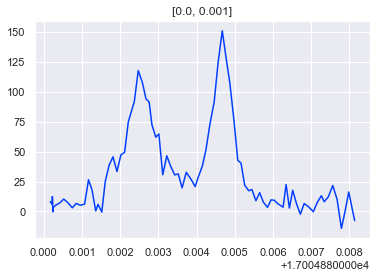

In [202]:
plt.title(batch[0]['EB'])
plt.plot(*batch[0]['data'])

In [243]:
thresh=1e-4
lines,[freq_out,tot_lor],tdms = simulate_spectra([0,1e-3],g,e,gidx,eidx,diagonalize=True,freq_array =None,origin = 17998.5875-319.908907,P_adjust=False,pad=100,T=4,square=square,dipole='x',cm=True,coeffs=[0.5,0.5,1],thresh=1e-3,g=16/(29979.2458),plot=False);
#     model_n = tot_lor/tot_lor.max()
lines=np.sort(np.unique(lines))
line_diffs = lines[1:] - lines[:-1]
line_group = [lines[0]]
line_avgs = []
for i,ld in enumerate(line_diffs):
    if ld<=thresh:
        line_group.append(lines[i+1])
    else:
        line_avgs.append(sum(line_group)/len(line_group))
        line_group = [lines[i+1]]
line_avgs.append(sum(line_group)/len(line_group))
print(line_avgs)

[17004.882229062765, 17004.884572371542]


[0.40824829  0.40824829  0.816496581]


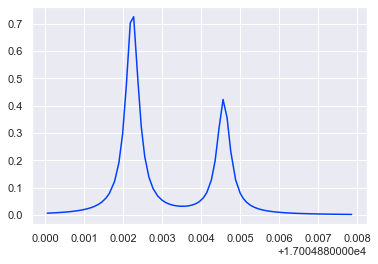

In [163]:
# phi = 20/180*np.pi
# th = 32/180*np.pi
# v = np.array([np.cos(phi)*np.sin(th),np.sin(phi)*np.sin(th),np.cos(th)])
# print(v)
# v[-1]*=1/2.32
v=np.array([0.5,0.5,1])
v=np.array(v)
print(v/np.sqrt(v@v))
T=4
square= True
gidx = g.select_q({'N':[1]})
eidx = e.select_q({'J':[1.5],'P':[1/2,-1/2]},parity='-')
lines,[freq_out,tot_lor],tdms = simulate_spectra([0,1e-3],g,e,gidx,eidx,freq_array = freq0,origin = 17998.5875-319.908907,P_adjust=False,pad=10,T=T,square=square,dipole='x',cm=True,coeffs=v,thresh=1e-3,g=12/(29979.2458),plot=True);


In [186]:
from lmfit import minimize, Parameters
import time

g.eigensystem(0,1e-3)
e.eigensystem(0,1e-3)
gidx = g.select_q({'N':[1]})
eidx = e.select_q({'J':[1.5],'P':[1/2,-1/2]},parity='-')

freq = freq115
data = sig115

def residual(params, freq_arr, data_arr,flist = None):
    c1 = params['d_mu']
    c2 = params['d_kappa']
    c3 = params['d_B']
    T = params['Temp']
    v = [c1,c2,c3]
    dE = params['dE']
    offset = params['offset']
    lines,[freq_out,tot_lor],tdms = simulate_spectra([dE,1e-1],g,e,gidx,eidx,diagonalize=True,freq_array = freq_arr,origin = offset+17998.5875-319.908907,P_adjust=False,pad=1000,T=T,square=square,dipole='x',cm=True,coeffs=v,thresh=1e-4,g=16/(29979.2458),plot=False);
#     model_n = tot_lor/tot_lor.max()
    model_n = tot_lor
    data_n = data_arr/data_arr.max()
    if flist is None:
        diff = (data_n - model_n)
    else:
        if type(flist) is bool:
            if flist==True:
                flist=lines
        diff_idx = np.array([np.arange(np.searchsorted(freq,f-100),np.searchsorted(freq,f+100)) for f in flist])
        diff_idx = np.unique(diff_idx)
        diff = (data_n - model_n)[diff_idx]
    return diff


params = Parameters()
params.add('d_mu', value=0.5,min=-10,max=10,vary=True)
params.add('d_kappa', value=1,min=-10,max=10,vary=True)
params.add('d_B', value=1,min=-10,max=10,vary=True)
params.add('Temp', value=4.0,min=1,max=10,vary=False)
params.add('dE', value =116*2/(2.11*0.5032),vary=False) # 1 Debye = 1.6792×10^-5 cm^-1/(V/cm)
params.add('offset',value=-0.000183,min=-0.0005,max=0.0005,vary=False)

t1 = time.time()
out = minimize(residual, params, args=(freq, data))#,method='bfgs')#,kws={'flist':True})#,method='least_squares')
t2 = time.time()
print(t2-t1)

178.87358617782593


In [190]:
out

[-0.264076152  0.844221671 -0.466426367]


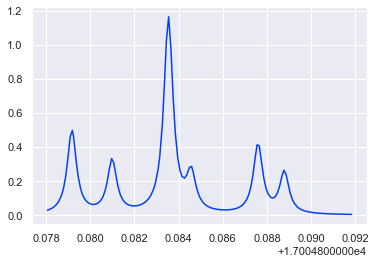

In [191]:
# phi = 20/180*np.pi
# th = 32/180*np.pi
# v = np.array([np.cos(phi)*np.sin(th),np.sin(phi)*np.sin(th),np.cos(th)])
# print(v)
# v[-1]*=1/2.32
v=np.array([out.params['d_mu'].value,out.params['d_kappa'].value,out.params['d_B'].value])
v=np.array(v)
print(v/np.sqrt(v@v))
T=4
square= True
gidx = g.select_q({'N':[1]})
eidx = e.select_q({'J':[1.5],'P':[1/2,-1/2]},parity='-')
lines,[freq_out,tot_lor],tdms = simulate_spectra([out.params['dE'],1e-3],g,e,gidx,eidx,diagonalize=True,freq_array = freq115,origin = 1*out.params['offset'].value+17998.5875-319.908907,P_adjust=False,pad=10,T=T,square=square,dipole='x',cm=True,coeffs=v,thresh=1e-3,g=15/(29979.2458),plot=True);

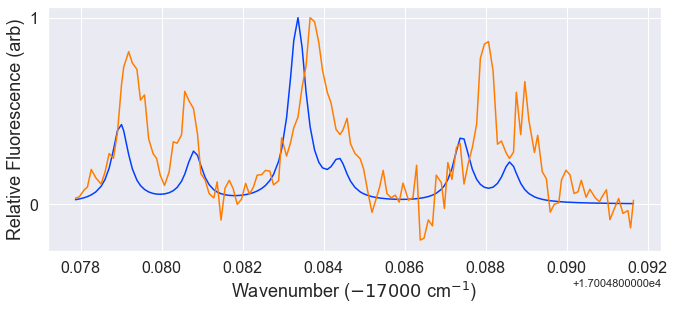

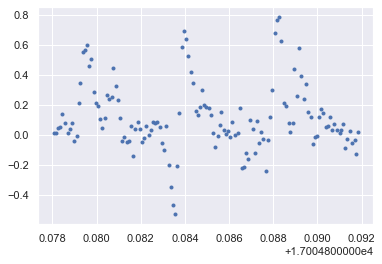

In [192]:
tot_lor_n = tot_lor/tot_lor.max()
data_n = data/data.max()
plt.figure(figsize=(11,4.5))
plt.plot(freq-0.000183,tot_lor_n)
plt.plot(freq-0.000183,data_n)
plt.ylabel('Relative Fluorescence (arb)',fontsize=18)
plt.xlabel(r'Wavenumber ($-17000$ cm$^{-1}$)',fontsize=18)
plt.annotate('Theory',(0.8,-1),fontsize=18)
plt.annotate('Experiment',(0.8,0.9),fontsize=18)
plt.xticks(fontsize=16);
plt.yticks([0,1],fontsize=16);
plt.figure()
plt.plot(freq,(data_n - tot_lor_n),'b.')

In [86]:
fit2Lorentzians(xscale, data,mean_guess,fwhm_guess,norm_guess,sigma=None,plot=True,verbose=False):

Help on class LorentzianModel in module lmfit.models:

class LorentzianModel(lmfit.model.Model)
 |  LorentzianModel(independent_vars=['x'], prefix='', nan_policy='raise', **kwargs)
 |  
 |  A model based on a Lorentzian or Cauchy-Lorentz distribution function.
 |  
 |  The model has three Parameters: `amplitude`, `center`, and `sigma`. In
 |  addition, parameters `fwhm` and `height` are included as constraints
 |  to report full width at half maximum and maximum peak height,
 |  respectively.
 |  
 |  .. math::
 |  
 |      f(x; A, \mu, \sigma) = \frac{A}{\pi} \big[\frac{\sigma}{(x - \mu)^2 + \sigma^2}\big]
 |  
 |  where the parameter `amplitude` corresponds to :math:`A`, `center` to
 |  :math:`\mu`, and `sigma` to :math:`\sigma`. The full width at half
 |  maximum is :math:`2\sigma`.
 |  
 |  For more information, see:
 |  https://en.wikipedia.org/wiki/Cauchy_distribution
 |  
 |  Method resolution order:
 |      LorentzianModel
 |      lmfit.model.Model
 |      builtins.object
 |  


[0.0005, 0.0005, 0.082, 0.0845, 0.5, 1]


Fit error =  [0.000079 0.000028 0.000027 0.00001  0.027634 0.038495]
FIT PARAMS =  [0.000948 0.000486 0.082586 0.08463  0.493795 0.993155]
Mean 1 = 0.082586 +/- 2.7e-05, FWHM 1 = 0.000948 +/- 7.9e-05
Mean 2 = 0.08463 +/- 1e-05, FWHM 2 = 0.000486 +/- 2.8e-05
[17004.882586 17004.88463 ]
[0.000027 0.00001 ]


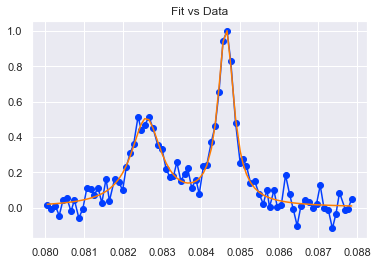

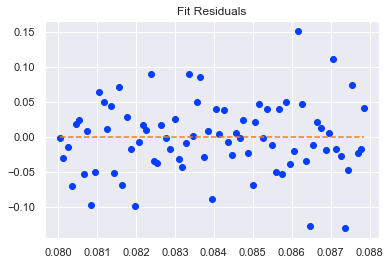

In [103]:
ps,err,resid = fit2Lorentzians(freq-17004.8,data_n,[0.082,0.0845],0.0005*np.ones(2),[0.5,1],verbose=True)
print(ps[2:4]+17004.8)
print(err[2:4])

In [158]:
from lmfit import minimize, Parameters
import time

g.eigensystem(0,1e-3)
e.eigensystem(0,1e-3)
gidx = g.select_q({'N':[1]})
eidx = e.select_q({'J':[1.5],'P':[1/2,-1/2]},parity='-')

freq = freq0
data = sig0

def residual(params, freq_arr, data_arr,uncertainty,flist = None):
    c1 = params['d_mu']
    c2 = params['d_kappa']
    c3 = params['d_B']
    T = params['Temp']
    v = [c1,c2,c3]
    dE = params['dE']
    offset = params['offset']
    print(offset)
    lines,[freq_out,tot_lor],tdms = simulate_spectra([dE,1e-3],g,e,gidx,eidx,diagonalize=True,freq_array = freq_arr,origin = offset+17998.5875-319.908907,P_adjust=False,pad=1000,T=T,square=square,dipole='x',cm=True,coeffs=v,thresh=1e-4,g=16/(29979.2458),plot=False);
#     model_n = tot_lor/tot_lor.max()
    s=np.sort(lines)
    model_n = np.array([s[0],s[-1]])
#     data_n = data_arr/data_arr.max()
    data_n = np.sort(ps[2:4]+17004.8)
    if flist is None:
        diff = (data_n - model_n)/uncertainty
        print(diff)
    else:
        if type(flist) is bool:
            if flist==True:
                flist=lines
        diff_idx = np.array([np.arange(np.searchsorted(freq,f-100),np.searchsorted(freq,f+100)) for f in flist])
        diff_idx = np.unique(diff_idx)
        diff = (data_n - model_n)[diff_idx]
    return diff


params = Parameters()
params.add('d_mu', value=-0.5,min=-10,max=10,vary=False)
params.add('d_kappa', value=2,min=-10,max=10,vary=False)
params.add('d_B', value=-1,min=-10,max=10,vary=False)
params.add('Temp', value=4.0,min=1,max=10,vary=False)
params.add('dE', value =0,vary=False)
params.add('offset',value=0.0000,min=-0.0005,max=0.0005,vary=True)

uncert = np.array([3,3])/29979.2458
# uncert = np.array([1e-4,1e-4])
t1 = time.time()
out = minimize(residual, params, args=(freq, data,uncert),method='least_squares')#,kws={'flist':True})#,method='least_squares')
t2 = time.time()
print(t2-t1)

<Parameter 'offset', value=0.0, bounds=[-0.0005:0.0005]>
[3.567112544 0.575365053]
<Parameter 'offset', value=1.4901161193847656e-08, bounds=[-0.0005:0.0005]>
[3.566963635 0.575216144]
<Parameter 'offset', value=0.00014652683495835299, bounds=[-0.0005:0.0005]>
[ 2.102857866 -0.888889625]
<Parameter 'offset', value=0.00014654173611954683, bounds=[-0.0005:0.0005]>
[ 2.102708957 -0.889038534]
<Parameter 'offset', value=0.00019836026848475132, bounds=[-0.0005:0.0005]>
[ 1.584882144 -1.406865347]
<Parameter 'offset', value=0.00019837516964594517, bounds=[-0.0005:0.0005]>
[ 1.584733235 -1.407014256]
<Parameter 'offset', value=0.00020701180247501125, bounds=[-0.0005:0.0005]>
[ 1.49842664  -1.493320851]
<Parameter 'offset', value=0.0002070267036362051, bounds=[-0.0005:0.0005]>
[ 1.498277731 -1.49346976 ]
<Parameter 'offset', value=0.0002072670460674308, bounds=[-0.0005:0.0005]>
[ 1.495875963 -1.495871528]
<Parameter 'offset', value=0.00020728194722862463, bounds=[-0.0005:0.0005]>
[ 1.495727054

In [154]:
out

In [156]:
sns.set_style('white')

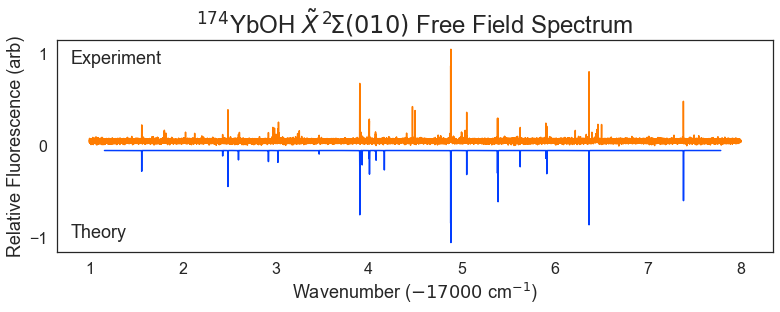

In [198]:
start, stop = (17001,17008)
i,j=(np.searchsorted(tx1[0],start),np.searchsorted(tx1[0],stop))
k,l = (np.searchsorted(freq,start),np.searchsorted(freq,stop))
plt.figure(figsize=(11,4.5))
tx_n = tx1[1]/tx1[1].max()
plt.plot(tx1[0][i:j]-17000,-tx_n[i:j]-0.05)
data_n = data/data.max()
plt.plot(freq[k:l]-17000,data_n[k:l]+0.05)
plt.ylabel('Relative Fluorescence (arb)',fontsize=18)
plt.xlabel(r'Wavenumber ($-17000$ cm$^{-1}$)',fontsize=18)
plt.annotate('Theory',(0.8,-1),fontsize=18)
plt.annotate('Experiment',(0.8,0.9),fontsize=18)
plt.xticks(fontsize=16);
plt.yticks([-1,0,1],fontsize=16);
plt.title(r'$^{174}$YbOH $\tilde{X}\, ^2\!\Sigma(010)$ Free Field Spectrum',fontsize=24)
plt.tight_layout()
# plt.savefig('X010_freefield_theory_exp_v1.svg')

In [21]:
g1 = g.select_q({'N':1,'J':[0.5]},parity='+')
e1 = e.select_q({'J':[0.5],'P':[1/2,-1/2]},parity='-')

g2 = g.select_q({'N':2,'J':2.5},parity='+')
e2 = e.select_q({'J':[1.5],'P':[1/2,-1/2]},parity='-')

g3 = g.select_q({'N':2,'J':2.5},parity='+')
e3 = e.select_q({'J':[2.5],'P':[1/2,-1/2]},parity='-')

eg_pairs = [(e1,g1), (e2,g2), (e3,g3)]

In [7]:
#Import Yuiki's data
folder = 'Yuiki_Stark'
title = '\\20220526_stark_identified_peaks'
peak_file = lambda volt: folder+title+str(volt)+'V.json'
err_file = lambda volt: folder+title+'_error'+str(volt)+'V.json'

V_range = np.array([0,5,15,20,25,30,35,50,75,95,115,132])
I_range = np.zeros(len(V_range))
peak_exp, err_exp = [[],[]]
for V,I in zip(V_range,I_range):
    peak_exp.append(get_json_data(peak_file(V),numpy=True))
    err_exp.append(get_json_data(err_file(V),numpy=True))


In [8]:
#Manual reanalysis of Yuiki's data, using normalization
peak_exp[0] = np.array([17004.882567, 17004.884673])
err_exp[0] = np.array([2.4e-05, 1.3e-05])
peak_exp[2] = np.array([17004.882464, 17004.884365, 17004.885582])
err_exp[2] = np.array([2.3e-05, 2.7e-05, 5.2e-05])
peak_exp[3] = np.array([17004.882367, 17004.884278, 17004.885645])
err_exp[3] = np.array([2.3e-05, 2.2e-05, 2.6e-05])
peak_exp[4] = np.array([17004.882253, 17004.883905, 17004.884641, 17004.885539])
err_exp[4] = np.array([2.7e-05, 2.1e-05, 2.7e-05, 8.2e-05])
peak_exp[5] = np.array([17004.882209, 17004.883847, 17004.884695, 17004.885613, 17004.886154])
err_exp[5] = np.array([2.4e-05, 1.2e-05, 2.3e-05, 3.6e-05, 4.9e-05])
peak_exp[6] = np.array([17004.882019, 17004.883712, 17004.88477,  17004.885697, 17004.88631])
err_exp[6] = np.array([2.6e-05, 2.1e-05, 3.0e-05, 3.0e-05, 2.7e-05])
peak_exp[7] = np.array([17004.881612, 17004.883184, 17004.883886, 17004.884811,
       17004.886095, 17004.886869])
err_exp[7] = np.array([2.8e-05, 3.6e-05, 3.0e-05, 5.3e-05, 3.9e-05, 3.8e-05])
peak_exp[8] = np.array([17004.880808, 17004.882198, 17004.883937, 17004.884871, 17004.886835,
 17004.887711])
err_exp[8] = np.array([1.8e-05, 1.8e-05, 2.2e-05, 2.3e-05, 1.9e-05, 3.2e-05])
peak_exp[9] = np.array([17004.880093, 17004.881501, 17004.883946, 17004.884782, 17004.887521,
 17004.888456])
err_exp[9] = np.array([2.3e-05, 3.9e-05, 3.90e-05, 7.20e-05, 2.40e-05, 3.00e-05])
peak_exp[10] = np.array([17004.879448, 17004.880818, 17004.88394,  17004.884837, 17004.888196,
 17004.88913 ])
err_exp[10] = np.array([2.4e-05, 2.8e-05, 3.0e-05, 6.6e-05, 1.8e-05, 3.3e-05])
peak_exp[11] = np.array([17004.880129, 17004.87885,  17004.88399,  17004.888762, 17004.889746])
err_exp[11] = np.array([2.0e-05, 2.0e-05, 2.3e-05, 2.4e-05, 2.2e-05])

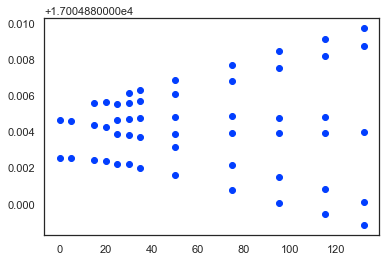

In [9]:
plt.figure()
for i,_V in enumerate(V_range):
    V = _V*np.ones(len(peak_exp[i]))
    plt.errorbar(V,peak_exp[i],yerr=err_exp[i],linestyle='None',marker='o',color='C0')

In [199]:
phi = 30/180*np.pi
th = 42/180*np.pi
v = np.array([np.cos(phi)*np.sin(th),np.sin(phi)*np.sin(th),np.cos(th)])
print(v)
v[-1]*=1.2/2.32
# v=[0.321393805, 0.383022222, 0.698046338]
print(v)
TDM_E, dE_E = simulate_transitions(np.linspace(0,264,101),g,e,E_or_B='E',origin = 17998.5875-319.908907,dipole='x',Debye=5.24,cm=True,coeffs = v)
t_str_E = gen_t_str(np.linspace(0,264,101),g,e,TDM_E, dE_E,E_or_B='E')


[0.579484104 0.334565303 0.743144825]
[0.579484104 0.334565303 0.384385255]
Using B (G) field of 0.0001


In [11]:
sns.set_style('white')

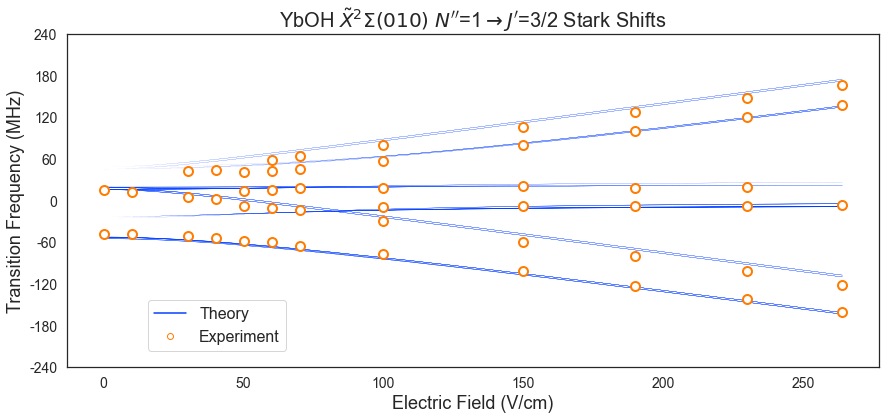

In [202]:
fig = plt.figure(figsize=(13,6))
plt.plot()
g.eigensystem(0,1e-2)
e.eigensystem(0,1e-2)
g3 = g.select_q({'N':1})
e3 = e.select_q({'J':[1.5],'P':[1/2,-1/2]},parity='-')
plot_vs_field(np.linspace(0,264,101),TDM_E,dE_E,e_idx=e3,g_idx=g3,linescale=10,thresh=1e-3,color='C0',marker='None',mfc='None',figure=fig)
plt.ylabel(r'Transition Frequency (MHz)',fontsize=18)
plt.xlabel('Electric Field (V/cm)',fontsize=18)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
colors = ['C0','C1']
mark = ['None','o']
mf = ['None','white']
linest = [None,'None']
lines = [plt.Line2D([0], [0], color=c, marker=mk,mfc=m,linestyle=ls) for c,m,mk,ls in zip(colors,mf,mark,linest)]
labels = ['Theory','Experiment']
plt.legend(lines, labels,loc=(0.1,0.05),fontsize=16)
plt.title(r'YbOH $\tilde{X} ^2 \Sigma (010)$ $N^{\prime \prime}$=1$\rightarrow J^{\prime}$=3/2 Stark Shifts',fontsize=20)
for i,_V in enumerate(V_range):
    V = 2*_V*np.ones(len(peak_exp[i]))
    peaks = peak_exp[i]-0.000183
#     err = err_exp[i]*5
    err = 0.0002*np.ones(len(peak_exp[i]))
    plt.errorbar(V,peaks,yerr=err,linestyle='None',marker='o',color='C1',mfc='white',mew=2,markersize=9)
plt.tight_layout()
yticks = plt.yticks()
newlabels = [str(round(29979.2458*(val-17004.884))) for val in yticks[0]]
newticks = (yticks[0],newlabels)
plt.yticks(*newticks)
plt.savefig('X010_stark_shifts_B0_v2.svg')#,dpi=1000)

In [474]:
print(r'$N"$')

$N"$


In [463]:
newlabels = [str(np.round(29979.2458*(val-17004.884),0)) for val in yticks[0]]

In [462]:
new

['-239.8',
 '-179.9',
 '-119.9',
 '-60.0',
 '0.0',
 '60.0',
 '119.9',
 '179.9',
 '239.8']

In [14]:
freq0,sig0 = get_json_data('20220526_stark_0V.json',numpy=True)
freq50,sig50 = get_json_data('20220526_stark_50V.json',numpy=True)
freq115,sig115 = get_json_data('20220526_stark_115V.json',numpy=True)
freq0-=0.000183
freq50-=0.000183
freq115-=0.000183

Text(0.5, 0, 'Transition Frequency (MHz - Offset)')

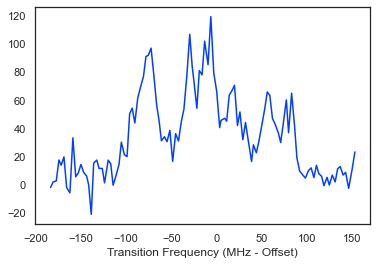

In [1060]:
plt.plot(29979.2458*(freq50-17004.884),sig50)
plt.xlabel('Transition Frequency (MHz - Offset)')

In [830]:
np.sqrt(0.7)

0.8366600265340756

In [87]:
# phi = 30/180*np.pi
# th = 42/180*np.pi
# v = np.array([np.cos(phi)*np.sin(th),np.sin(phi)*np.sin(th),np.cos(th)])
# print(v)
# v[-1]*=1.2/2.32
# # v=[0.321393805, 0.383022222, 0.698046338]
v=[-8,-0.5,7]
print(v)
v=np.array(v)
print(v/np.sqrt(v@v))
square= True
g3 = g.select_q({'N':1})
e3 = e.select_q({'J':[1.5],'P':[1/2,-1/2]},parity='-')
lx1,tx1,tdmx1 = simulate_spectra([115*2,0],g,e,g3,e3,origin = 17998.5875-319.908907,square=square,dipole='x',cm=True,coeffs=v,thresh=1e-3,g=15/(29979.2458),plot=False)
plt.figure()
i1 = 50
plt.plot(tx1[0][i1:-i1],tx1[1][i1:-i1]/tx1[1].max())
plt.plot(freq115,sig115/sig115.max(),color='C1')

[-8, -0.5, 7]
[-0.751745577 -0.046984099  0.65777738 ]


TypeError: _searchsorted_dispatcher() got an unexpected keyword argument 'linestyle'

<Figure size 432x288 with 0 Axes>

In [47]:
MHz = lambda x : 29979.2458*(x-17004.884)

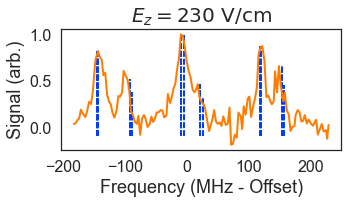

In [111]:
i1,j1 = (100,-80)
plt.figure(figsize=(5,3))
# plt.plot(MHz(tx1[0][i1:j1]),tx1[1][i1:j1]/tx1[1].max(),linestyle='-')
for lx in lx1:
    _i = np.searchsorted(freq115,lx)
    plt.vlines(MHz(lx),ymax=max(sig115[_i-2:_i+2]/sig115.max()),ymin=-0.1,linestyle='--',color='C0')
plt.plot(MHz(freq115),sig115/sig115.max(),linewidth=2, color = 'C1')#linewidth=0,marker='o',markersize=3.5)
plt.title(r'$E_z = 230 \,\,\mathrm{V/cm}$',fontsize=20)
plt.xticks(fontsize=16)
plt.yticks([0,0.5,1],fontsize=16)
plt.xlabel('Frequency (MHz - Offset)',fontsize=18)
plt.ylabel('Signal (arb.)',fontsize=18)
plt.tight_layout();
plt.savefig('Stark_230Vcm_N1_dashed.svg')

[-8, -0.5, 7]
[-0.751745577 -0.046984099  0.65777738 ]


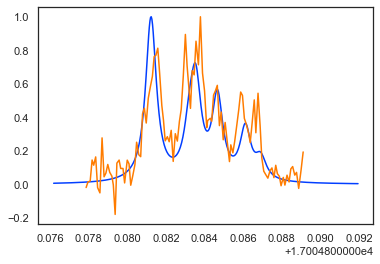

In [78]:
v=[-8,-0.5,7]
print(v)
v=np.array(v)
print(v/np.sqrt(v@v))
square= True
g3 = g.select_q({'N':1})
e3 = e.select_q({'J':[1.5],'P':[1/2,-1/2]},parity='-')
lx2,tx2,tdmx2 = simulate_spectra([50*2,0],g,e,g3,e3,origin = 17998.5875-319.908907,square=square,dipole='x',cm=True,coeffs=v,thresh=1e-3,g=20/(29979.2458),plot=False)
plt.figure()
i2 = 50
plt.plot(tx2[0][i2:-i2],tx2[1][i2:-i2]/tx2[1].max())
plt.plot(freq50,sig50/sig50.max())

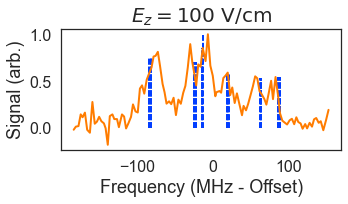

In [112]:
plt.figure(figsize=(5,3))
i2,j2 = (100,-120)
# plt.plot(MHz(tx2[0][i2:j2]),tx2[1][i2:j2]/tx2[1].max(),linestyle='-')
for lx in lx2:
    _i = np.searchsorted(freq50,lx)
    plt.vlines(MHz(lx),ymax=max(sig50[_i-2:_i+2]/sig50.max()),ymin=0,linestyle='--',color='C0')
plt.plot(MHz(freq50),sig50/sig50.max(),linewidth=2,color='C1')#linewidth=0,marker='o',markersize=3.5)
plt.title(r'$E_z = 100 \,\,\mathrm{V/cm}$',fontsize=20)
plt.xticks([-100,0,100],fontsize=16)
plt.yticks([0,0.5,1],fontsize=16)
plt.xlabel('Frequency (MHz - Offset)',fontsize=18)
plt.ylabel('Signal (arb.)',fontsize=18)
plt.tight_layout();
plt.savefig('Stark_100Vcm_N1_dashed.svg')

[-8, -0.5, 7]
[-0.751745577 -0.046984099  0.65777738 ]


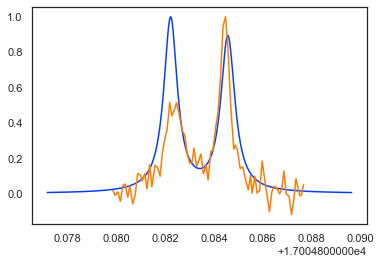

In [80]:
# phi = 30/180*np.pi
# th = 42/180*np.pi
# v = np.array([np.cos(phi)*np.sin(th),np.sin(phi)*np.sin(th),np.cos(th)])
# print(v)
# v[-1]*=1.2/2.32
# # v=[0.321393805, 0.383022222, 0.698046338]
v=[-8,-0.5,7]
print(v)
v=np.array(v)
print(v/np.sqrt(v@v))
square= True
g3 = g.select_q({'N':1})
e3 = e.select_q({'J':[1.5],'P':[1/2,-1/2]},parity='-')
lx3,tx3,tdmx3 = simulate_spectra([0*2,0],g,e,g3,e3,origin = 17998.5875-319.908907,square=square,dipole='x',cm=True,coeffs=v,thresh=1e-3,g=20/(29979.2458),plot=False)
plt.figure()
i3 = 90
plt.plot(tx3[0][i1:-i1],tx3[1][i1:-i1]/tx3[1].max())
plt.plot(freq0,sig0/sig0.max())

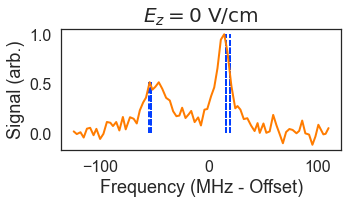

In [114]:
plt.figure(figsize=(5,3))
i3,j3=(110,-90)
# plt.plot(MHz(tx3[0][i3:j3]),tx3[1][i3:j3]/tx3[1].max())
for lx in lx3:
    _i = np.searchsorted(freq0,lx)
    plt.vlines(MHz(lx),ymax=max(sig0[_i-2:_i+2]/sig0.max()),ymin=0,linestyle='--',color='C0')
plt.plot(MHz(freq0),sig0/sig0.max(),linewidth=2,color='C1')#linewidth=0,marker='o',markersize=3.5)#linewidth=0,marker='o',markersize=3.5)
plt.title(r'$E_z = 0 \,\,\mathrm{V/cm}$',fontsize=20)
plt.xticks([-100,0,100],fontsize=16)
plt.yticks([0,0.5,1],fontsize=16)
plt.xlabel('Frequency (MHz - Offset)',fontsize=18)
plt.ylabel('Signal (arb.)',fontsize=18)
plt.tight_layout();
plt.savefig('Stark_0Vcm_N1_dashed.svg')

In [848]:
#things that kinda worked: 
#p 20, t 32, ba 1/2.32
#p 170, t 32, ba 0.6/2.32
#p 175, t 33, ba 0.8/2.32
#p 30, t 42, ba 1.2/2.32
#p 40, t 42, ba 1.2/2.32
#Free field: p 50, t 30, ba 1.87/2.32

In [568]:
E0=0
B0=0
square=True
# v=[1,1,0.5]
for e3,g3 in eg_pairs:
    v=[0.35,0.65,1]
    lx1,tx1,tdmx1 = simulate_spectra([E0,B0],g,e,g3,e3,origin = 17998.5875-319.908907,square=square,dipole='x',cm=True,coeffs=v,thresh=1e-3,g=12/(29979.2458),plot=True);

#     v = [1,1,-1]
#     # g3 = g.select_q({'N':2,'J':2.5},parity='+')
#     # e3 = e.select_q({'J':[1.5],'P':[1/2,-1/2]},parity='-')
#     lx2,tx2,tdmx2 = simulate_spectra([E0,B0],g,e,g3,e3,origin = 17998.5875-319.908907,square=square,dipole='x',cm=True,coeffs=v,thresh=1e-3,g=12/(29979.2458),plot=True);

#     v = [-1,1,1]
#     # g3 = g.select_q({'N':2,'J':2.5},parity='+')
#     # e3 = e.select_q({'J':[2.5],'P':[1/2,-1/2]},parity='-')
#     lx3,tx3,tdmx3 = simulate_spectra([E0,B0],g,e,g3,e3,origin = 17998.5875-319.908907,square=square,dipole='x',cm=True,coeffs=v,thresh=1e-3,g=12/(29979.2458),plot=True);
    
#     v = [1,-1,1]
#     # g3 = g.select_q({'N':2,'J':2.5},parity='+')
#     # e3 = e.select_q({'J':[2.5],'P':[1/2,-1/2]},parity='-')
#     lx3,tx3,tdmx3 = simulate_spectra([E0,B0],g,e,g3,e3,origin = 17998.5875-319.908907,square=square,dipole='x',cm=True,coeffs=v,thresh=1e-3,g=12/(29979.2458),plot=True);
    

NameError: name 'eg_pairs' is not defined

Fit error =  [inf inf inf]
FIT PARAMS =  [0.35 0.65 1.  ]




C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\minpack.py:834: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


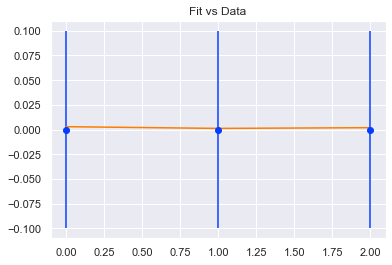

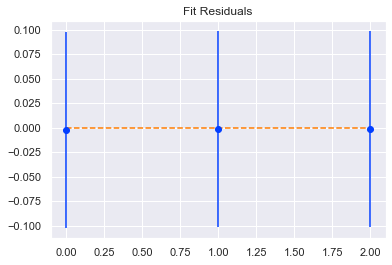

In [41]:
x = np.arange(0,len(eg_pairs))
data = np.zeros(len(eg_pairs))
sig = np.zeros(len(eg_pairs))
sig[:] = 0.1
params,err,resid = fit_intensities(x,data,g,e,[0,0],eg_pairs,guess=[0.35,0.65,1],sigma=sig,bounds=([-10,-10,-10],[10,10,10]),plot=True,verbose=True,dipole='z')

In [121]:
np.linspace(-3,3,31)

array([-3. , -2.8, -2.6, -2.4, -2.2, -2. , -1.8, -1.6, -1.4, -1.2, -1. ,
       -0.8, -0.6, -0.4, -0.2,  0. ,  0.2,  0.4,  0.6,  0.8,  1. ,  1.2,
        1.4,  1.6,  1.8,  2. ,  2.2,  2.4,  2.6,  2.8,  3. ])

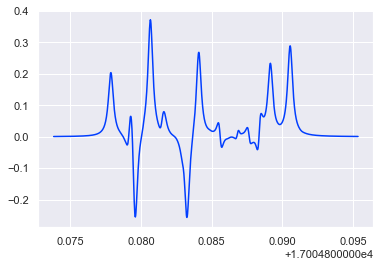

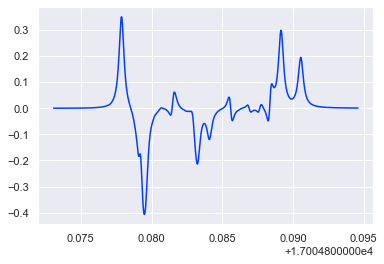

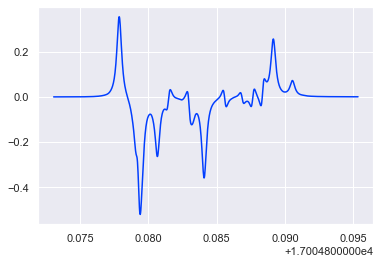

In [14]:
v = [1,0,0]
square= tRUE
E0 = 100
B0 = 70
g3 = g.select_q({'N':1})
e3 = e.select_q({'J':[1.5],'P':[1/2,-1/2]},parity='-')
lx1,tx1,tdmx1 = simulate_spectra([E0,B0],g,e,g3,e3,origin = 17998.5875-319.908907,square=square,dipole='x',cm=True,coeffs=v,thresh=1e-3,g=12/(29979.2458),plot=True);

v = [0,1,0]
# g3 = g.select_q({'N':2,'J':2.5},parity='+')
# e3 = e.select_q({'J':[1.5],'P':[1/2,-1/2]},parity='-')
lx2,tx2,tdmx2 = simulate_spectra([E0,B0],g,e,g3,e3,origin = 17998.5875-319.908907,square=square,dipole='x',cm=True,coeffs=v,thresh=1e-3,g=12/(29979.2458),plot=True);

v = [0,0,1]
# g3 = g.select_q({'N':2,'J':2.5},parity='+')
# e3 = e.select_q({'J':[2.5],'P':[1/2,-1/2]},parity='-')
lx3,tx3,tdmx3 = simulate_spectra([E0,B0],g,e,g3,e3,origin = 17998.5875-319.908907,square=square,dipole='x',cm=True,coeffs=v,thresh=1e-3,g=12/(29979.2458),plot=True);

In [8]:
v = np.array([np.sqrt(3),np.sqrt(4),np.sqrt(9)])
v/=np.sqrt(v@v)
print(v)
square= True
g3 = g.select_q({'N':[1,2,3]})
e3 = e.select_q({'J':[0.5,1.5,2.5,3.5],'P':[1/2,-1/2]})
lx1,tx1,tdmx1 = simulate_spectra([0,0],g,e,g3,e3,origin = 17998.5875-319.908907,pad=1000,square=square,dipole='x',cm=True,coeffs=v,thresh=1e-3,g=12/(29979.2458),plot=False);

[0.433012702 0.5         0.75       ]


KeyError: 'uA010'

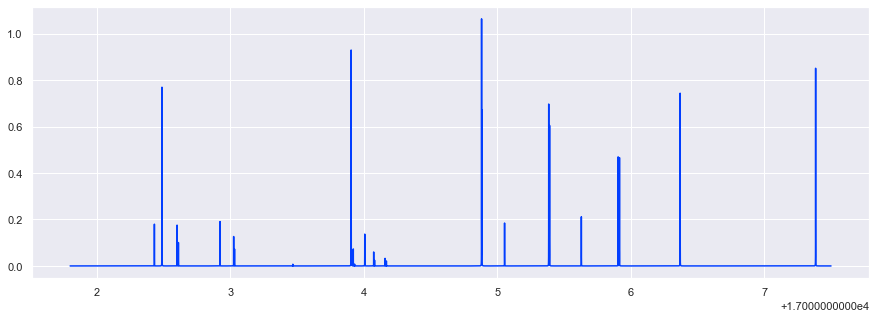

In [189]:
start, stop = (17001.8,17007.5)
i,j=(np.searchsorted(tx1[0],start),np.searchsorted(tx1[0],stop))
plt.figure(figsize=(15,5))
plt.plot(tx1[0][i:j],tx1[1][i:j])

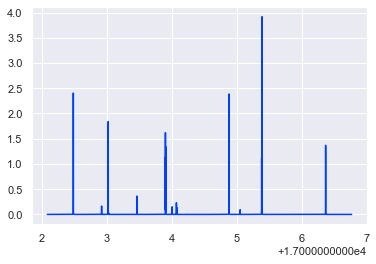

In [59]:
v = [1,1,0.5]
square= True
g3 = g.select_q({'N':[1,2]})
e3 = e.select_q({'J':[0.5,1.5,2.5],'P':[1/2,-1/2]})
lx1,tx1,tdmx1 = simulate_spectra([0,0],g,e,g3,e3,origin = 17998.5875-319.908907,pad=1000,square=square,dipole='x',cm=True,coeffs=v,thresh=1e-3,g=12/(29979.2458),plot=True);

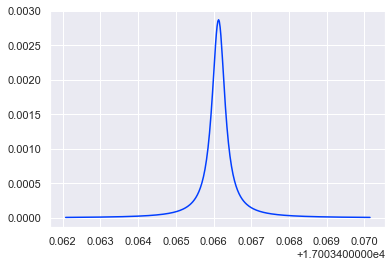

In [44]:
g3 = g.select_q({'N':1,'J':[0.5]},parity='+')
e3 = e.select_q({'J':[0.5],'P':[1/2,-1/2]},parity='-')
square= True
lx1,tx1,tdmx1 = simulate_spectra([0,0],g,e,g3,e3,origin = 17998.5875-319.908907,square=square,dipole='x',cm=True,coeffs=v,thresh=1e-3,g=12/(29979.2458),plot=True);

[0.321393805 0.383022222 0.866025404]
[0.321393805 0.383022222 0.698046338]


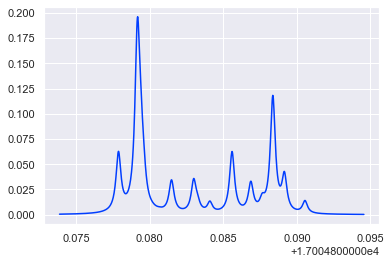

In [195]:
phi = 50/180*np.pi
th = 30/180*np.pi
v = np.array([np.cos(phi)*np.sin(th),np.sin(phi)*np.sin(th),np.cos(th)])
print(v)
v[-1]*=1.87/2.32
print(v)
square= True
g3 = g.select_q({'N':1})
e3 = e.select_q({'J':[1.5],'P':[1/2,-1/2]},parity='-')
lx1,tx1,tdmx1 = simulate_spectra([100,70],g,e,g3,e3,origin = 17998.5875-319.908907,square=square,dipole='x',cm=True,coeffs=v,thresh=1e-3,g=12/(29979.2458),plot=True);

[0.632455532 0.632455532 0.447213595]


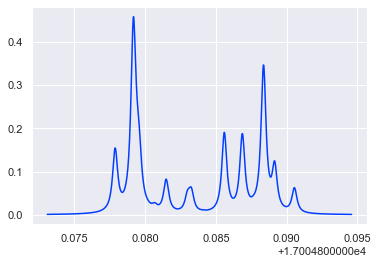

In [115]:
v = np.array([np.sqrt(2),np.sqrt(2),1])
v=v/np.sqrt(v@v)
print(v)
square= True
g3 = g.select_q({'N':1})
e3 = e.select_q({'J':[1.5],'P':[1/2,-1/2]},parity='-')
lx1,tx1,tdmx1 = simulate_spectra([100,70],g,e,g3,e3,origin = 17998.5875-319.908907,square=square,dipole='x',cm=True,coeffs=v,thresh=1e-3,g=12/(29979.2458),plot=True);

[0.554700196 0.480384461 0.67936622 ]


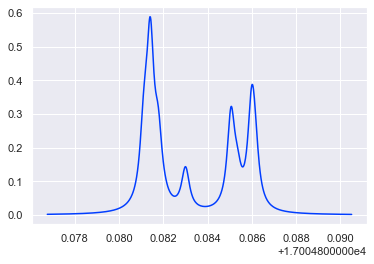

In [200]:
v = np.array([np.sqrt(4),np.sqrt(3),np.sqrt(6)])
v/=np.sqrt(v@v)
print(v)
square= True
g3 = g.select_q({'N':1})
e3 = e.select_q({'J':[1.5],'P':[1/2,-1/2]},parity='-')
lx1,tx1,tdmx1 = simulate_spectra([0,30],g,e,g3,e3,origin = 17998.5875-319.908907,square=square,dipole='x',cm=True,coeffs=v,thresh=1e-3,g=12/(29979.2458),plot=True);

[0.314485451 0.104828484 0.943456353]


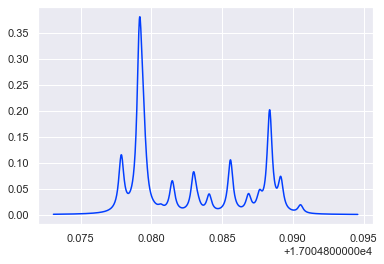

In [94]:
v = np.array([3,1,9])
v=v/np.sqrt(v@v)
print(v)
square= True
g3 = g.select_q({'N':1})
e3 = e.select_q({'J':[1.5],'P':[1/2,-1/2]},parity='-')
lx1,tx1,tdmx1 = simulate_spectra([100,70],g,e,g3,e3,origin = 17998.5875-319.908907,square=square,dipole='x',cm=True,coeffs=v,thresh=1e-3,g=12/(29979.2458),plot=True);

[0.666666667 0.666666667 0.333333333]


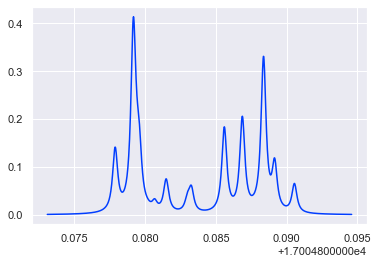

In [75]:
v = np.array([1,1,1/2])
v=v/np.sqrt(v@v)
print(v)
square= True
g3 = g.select_q({'N':1})
e3 = e.select_q({'J':[1.5],'P':[1/2,-1/2]},parity='-')
lx1,tx1,tdmx1 = simulate_spectra([100,70],g,e,g3,e3,origin = 17998.5875-319.908907,square=square,dipole='x',cm=True,coeffs=v,thresh=1e-3,g=12/(29979.2458),plot=True);

In [161]:
tdmx3

[0.0001307079993195859,
 3.343979523485602e-06,
 1.3665448567463444e-05,
 0.000455433908828133,
 9.906762861591423e-06,
 1.1449420335269954e-05,
 0.0034947620687369933,
 0.0001402705343033371,
 0.0024226998139642427,
 1.45857820917984e-06,
 0.0002601293327027177,
 0.00026560407811718233,
 9.051266044432854e-06,
 9.048637491936656e-06,
 5.408907086456862e-06,
 0.003562451187776473,
 9.095034066874018e-05,
 0.004001844898155503,
 2.543868042416939e-05,
 0.0007033231638696968,
 4.909531631833701e-05,
 0.0024227002910722547,
 1.661084805159331e-05,
 1.1518887356183468e-05,
 5.205106928590503e-05,
 3.127075841071831e-05,
 6.622130483398556e-06,
 0.00037935332793506346,
 0.00018158476094770775,
 8.876212797509828e-05,
 0.0038060892922118644,
 0.00012520084594347392,
 0.0010675828223969525,
 0.00012778100888512442,
 3.954653001600085e-05,
 8.405034071715623e-05,
 0.0004784233215001749,
 0.0008552472014204355,
 0.001958502404075527,
 0.00023925657846633888,
 7.236885156035451e-05,
 0.001885490

In [167]:
diff = np.array([np.subtract.outer(E_e, E_g) for E_e,E_g in zip(e.evals_E,g.evals_E)])

In [172]:
dE_E.shape

(101, 88, 24)

In [96]:
simulate_transitions(field_vals,state_g,state_e,E_or_B='E',origin = 0,dipole='z',Debye=5.24,cm=True,scale=-0.5)

NameError: name 'field_vals' is not defined

In [117]:
np.transpose(g.evecs_E,axes=[0,2,1]).shape

(1001, 24, 24)

In [79]:
x = np.array([1,2,3,4,5,6])
y = np.array([6,7,8,9,10,11])
np.subtract.outer(y,x)

array([[ 5,  4,  3,  2,  1,  0],
       [ 6,  5,  4,  3,  2,  1],
       [ 7,  6,  5,  4,  3,  2],
       [ 8,  7,  6,  5,  4,  3],
       [ 9,  8,  7,  6,  5,  4],
       [10,  9,  8,  7,  6,  5]])

In [66]:
Escan = np.linspace(0,240,13)
print(Escan)

[  0.  20.  40.  60.  80. 100. 120. 140. 160. 180. 200. 220. 240.]


In [70]:
np.searchsorted(Ez,Escan)

array([  0,  80, 160, 240, 320, 400, 480, 560, 640, 720, 800, 880, 960],
      dtype=int64)

In [69]:
Ez[idx]

array([  0.,  20.,  40.,  60.,  80., 100., 120., 140., 160., 180., 200.,
       220., 240.])

In [62]:
np.identity(5)

array([[1., 0., 0., 0., 0.],
       [0., 1., 0., 0., 0.],
       [0., 0., 1., 0., 0.],
       [0., 0., 0., 1., 0.],
       [0., 0., 0., 0., 1.]])

In [34]:
Bscan = np.linspace(0,70,6)
Bscan[0]=1e-3
print(Bscan)

# Escan = np.linspace(0,500,7)
Escan = np.linspace(0,240,11)
print(Escan)

[ 0.001 14.    28.    42.    56.    70.   ]
[  0.  24.  48.  72.  96. 120. 144. 168. 192. 216. 240.]


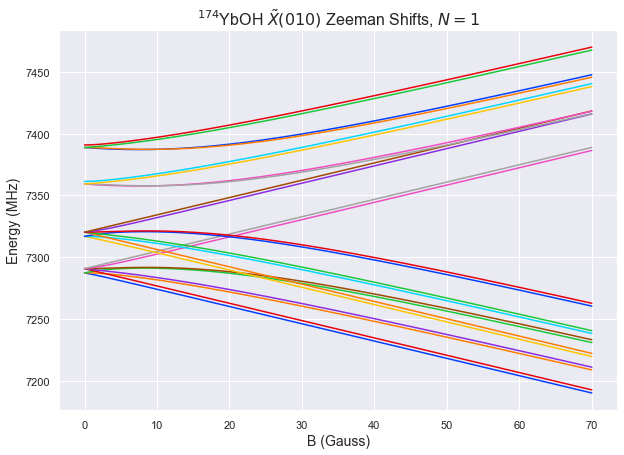

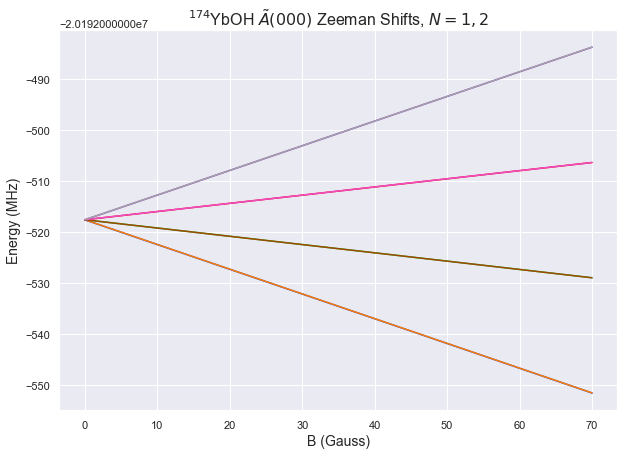

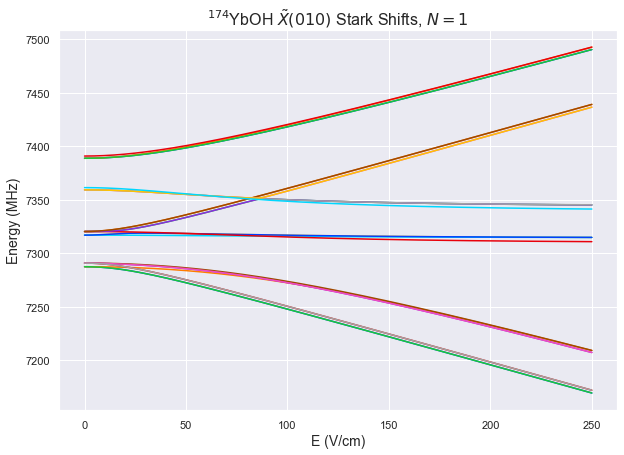

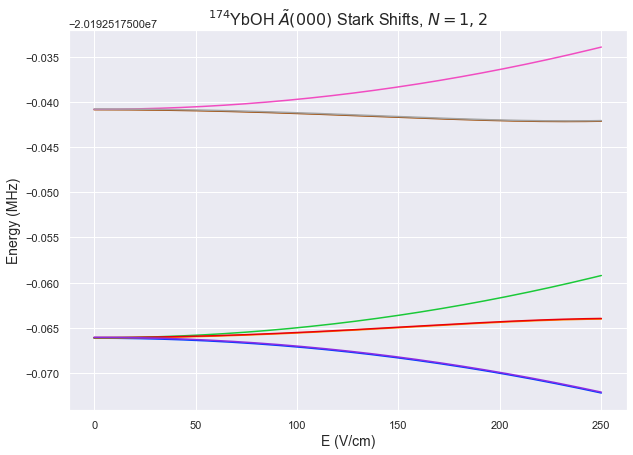

In [4]:
g = MoleculeLevels.initialize_state('YbOH','174','X010',[1],M_values = 'all',I=[0,1/2],S=1/2,round=8,P_values=[1/2,3/2])
e = MoleculeLevels.initialize_state('YbOH','174','A000',[1,2],M_values = 'all',I=[0,1/2],S=1/2,round=8,P_values=[1/2,3/2])
# Bstep = 0.001
# Bz = np.arange(0,1+Bstep,Bstep)
# Bz[0]=1e-4
# Estep = 0.25
# Ez = np.arange(0,500+Estep,Estep)
Bz = np.linspace(1e-3,70,1001)
Ez = np.linspace(0,250,1001)
g.ZeemanMap(Bz,0,idx=g.select_q({'N':1}),plot=True)
e.ZeemanMap(Bz,0,idx=e.select_q({'J':1.5,'P':1/2},parity='-'),plot=True)
g.StarkMap(Ez,1e-4,idx=g.select_q({'N':1}),plot=True)
e.StarkMap(Ez,1e-4,idx=e.select_q({'J':1.5,'P':1/2},parity='-'),plot=True)

In [285]:
TDM_E, dE_E = simulate_transitions(np.linspace(0,250,101),g,e,E_or_B='E',origin = 17998.5875-319.908907,dipole='z',Debye=5.24,cm=True,coeffs = [0.852, 0.087, 0.516])
t_str_E = gen_t_str(np.linspace(0,250,101),g,e,TDM_E, dE_E,E_or_B='E')

Using B (G) field of 0.0001


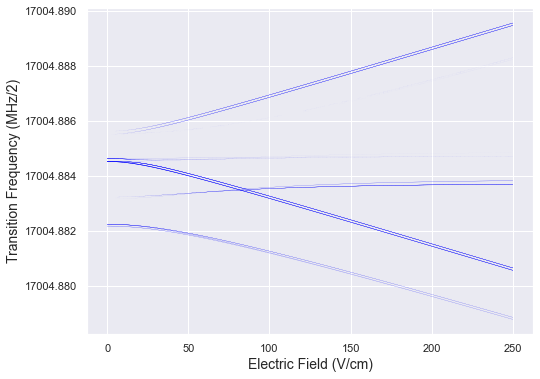

In [6]:
g.eigensystem(0,1e-2)
e.eigensystem(0,1e-2)
g1 = g.select_q({'N':1,'J':1.5})
e1 = e.select_q({'J':[1.5],'P':[1/2,-1/2]},parity='-')
g2 = g.select_q({'N':1, 'J':0.5})
e2 = e.select_q({'J':[1.5],'P':[1/2,-1/2]},parity='-')
g3 = g.select_q({'N':1})
e3 = e.select_q({'J':[1.5],'P':[1/2,-1/2]},parity='-')
plot_vs_field(np.linspace(0,250,101),TDM_E,dE_E,e_idx=e3,g_idx=g3,linescale=5,thresh=1e-3,color='blue',marker='None',mfc='None')

In [128]:
t_str_E[0,0,0]

'(N=1-,J=1.5,F=1,M=-1)->(J=0.5-,F=1,M=-1)'

In [130]:
TDM[0,0,0]


-0.0

In [110]:
tdm = Forbidden_TDM_b2a(0,g,e,scale=1)
tdm.shape

(88, 24)

In [113]:
np.matmul(tdm,g.evecs_E).shape

(1001, 88, 24)

In [108]:
g.evecs_E[0].shape

(24, 24)

In [109]:
e.evecs_E[0].shape

(88, 88)

(7273.9759138283, 7404.3146470817)

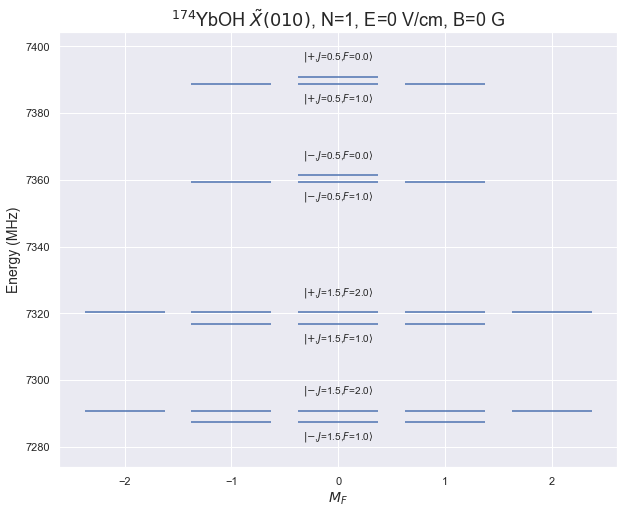

In [22]:
E0 = 0
B0 = 0
idx = g.select_q({'N':1,'J':[0.5,1.5]})
g.display_levels(E0,B0,'F',idx=idx,parity=True,label=True,label_q=[q for q in g.q_str if q not in ['N','K']],label_off=0.05,figsize=(10,8),alt_label=True)
plt.title(g.state_str+', N=1, E={} V/cm, B={} G'.format(E0,B0),fontsize=18)
# plt.grid(False)
# ax = plt.gca()
# ax.set_facecolor('None')
plt.ylim()

In [23]:
Trans_E = {}
D=5.24
origin = 17998.59-319.908907
# origin = 0
cm=True
scale=-0.5
for _E in Escan:
    g.ZeemanMap(Bz,_E,plot=False)
    e.ZeemanMap(Bz,_E,plot=False)
    Trans_E[_E] = {#'all': transitions_E(g,e,Escan,dipole='abs',Debye=5.24,origin=17323.5875-319.9089),
                   'x': transitions_B(g,e,Bscan,dipole='x',Debye=D,origin=origin,cm=cm,scale=scale),
                   'z': transitions_B(g,e,Bscan,dipole='z',Debye=D,origin=origin,cm=cm,scale=scale),
#                    'x+z': transitions_E(g,e,Escan,dipole='x+z',Debye=5.24,origin=17323.5875-319.9089),
                  }
#output of transitions_E is TDM_E, dE_E, table_E

Using E (V/cm) field of 0.0
0.001
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
14.000799999999998
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
28.0006
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
42.00039999999999
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
56.00019999999999
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
70.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully c

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Using E (V/cm) field of 80.0
0.001
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
14.000799999999998
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
28.0006
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
42.00039999999999
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
56.00019999999999
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
70.0
Successfully 

Successfully converted eigenvectors from bBJ to aBJ
70.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Using E (V/cm) field of 160.0
0.001
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
14.000799999999998
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
28.0006
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
42.00039999999999
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
56.00019999999999
Successfully converted eigenvectors from bBJ to aBJ
Successfully

In [24]:
Trans_B = {}
D=5.24
origin = 17998.59-319.908907
cm=True
# origin = 0
scale=-0.5
for _B in Bscan:
    g.StarkMap(Ez,_B,plot=False)
    e.StarkMap(Ez,_B,plot=False)
    Trans_B[_B] = {#'all': transitions_E(g,e,Escan,dipole='abs',Debye=5.24,origin=17323.5875-319.9089),
                   'x': transitions_E(g,e,Escan,dipole='x',Debye=D,origin=origin,cm=cm,scale=scale),
                   'z': transitions_E(g,e,Escan,dipole='z',Debye=D,origin=origin,cm=cm,scale=scale),
#                    'x+z': transitions_E(g,e,Escan,dipole='x+z',Debye=5.24,origin=17323.5875-319.9089),
                  }
#output of transitions_E is TDM_E, dE_E, table_E

Using B (G) field of 0.001
0.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
20.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
40.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
60.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
80.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
100.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
120.0
S

120.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
140.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
160.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
180.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
200.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Using B (G) field of 28.0
0.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
20.0

20.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
40.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
60.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
80.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
100.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
120.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
140.0
Successfully converted eig

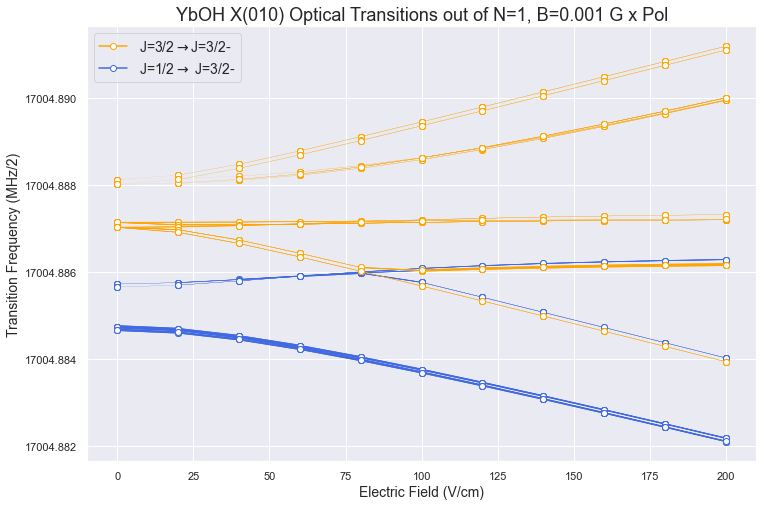

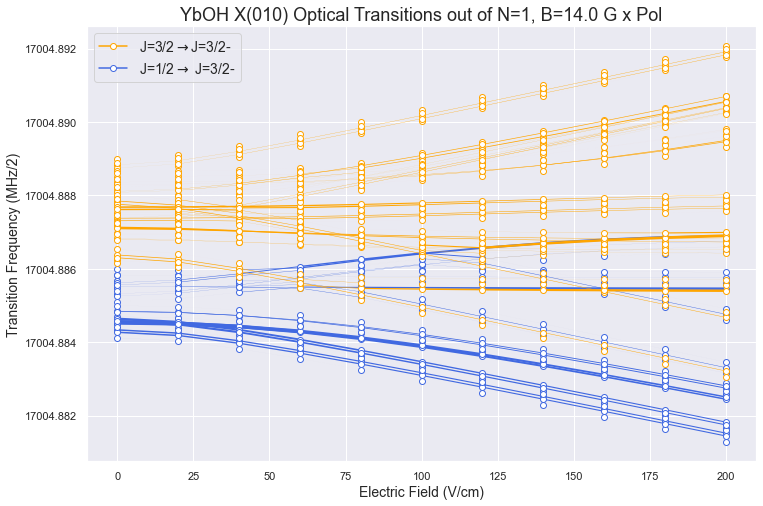

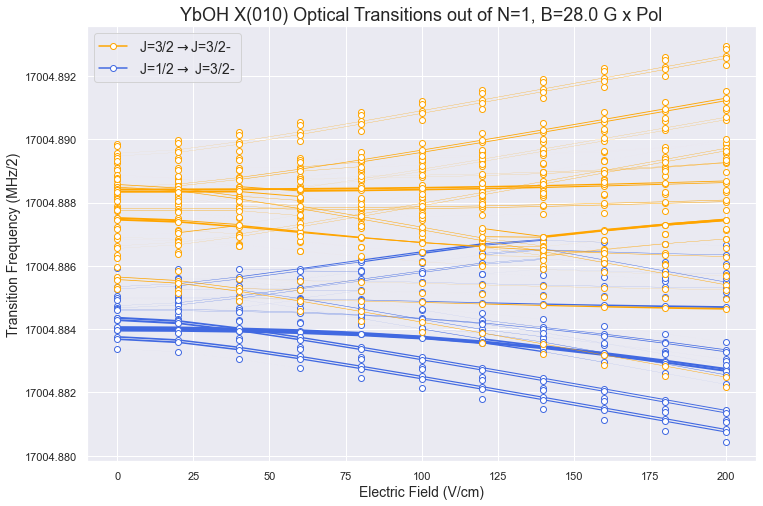

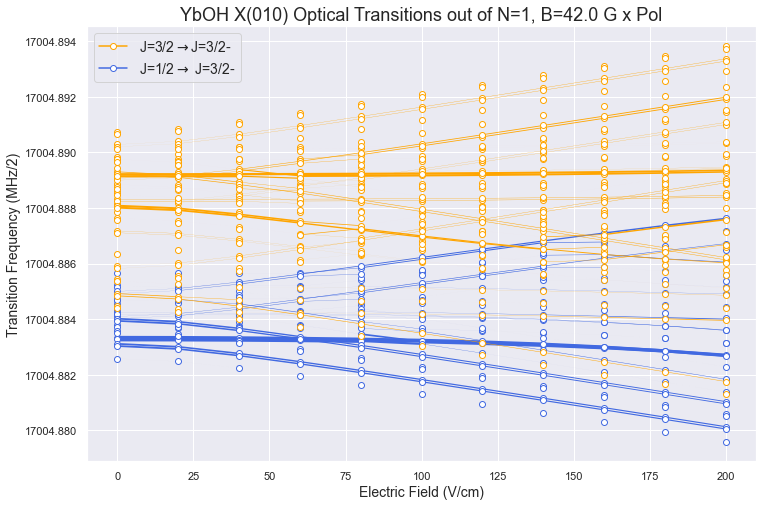

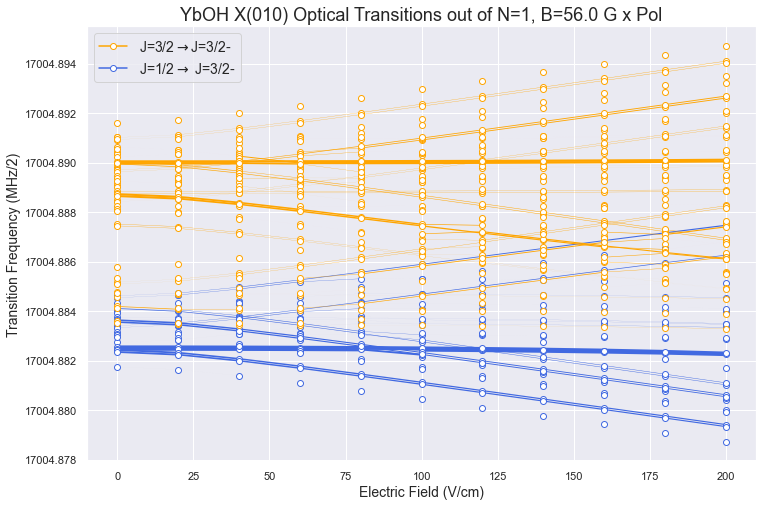

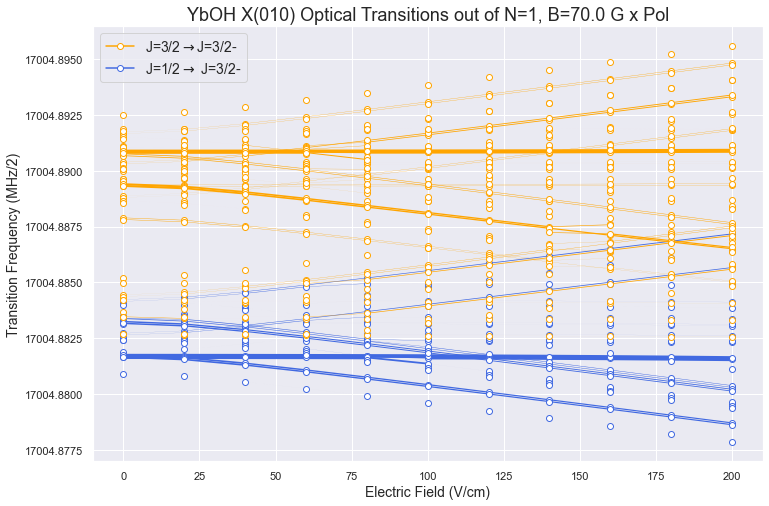

In [31]:
pol = 'x'
print_bool = False
for B in Bscan:
    g.eigensystem(0,1e-2)
    e.eigensystem(0,1e-2)
    g1 = g.select_q({'N':1,'J':1.5})
    e1 = e.select_q({'J':[1.5],'P':[1/2,-1/2]},parity='-')
    g2 = g.select_q({'N':1, 'J':0.5})
    e2 = e.select_q({'J':[1.5],'P':[1/2,-1/2]},parity='-')
    g3 = g.select_q({'N':1})
    e3 = e.select_q({'J':[1.5],'P':[1/2,-1/2]},parity='-')
#     g4 = g.select_q({'N':1,'J':[1.5]})
#     e4 = e.select_q({'N':1,'J':[1.5]})
    fig,a = plt.subplots(figsize=(12,8))
    TDM_E,dE_E,t_str_E = Trans_B[B][pol]
    
#     g = N1.select_q({'N':1,'J':0.5,'F':0},parity='-')
#     e = N2.select_q({'N':2,'J':1.5,'M':[-2,-1,1,2]},parity='+')
#     plot_B(Bscan,TDM_B,dE_B,g_idx=g,e_idx=e,linescale=10,figure=fig,color='pink',marker=None,mfc='white')
#     g = N1.select_q({'N':1,'J':0.5,'F':[1]},parity='-')
#     e = N2.select_q({'N':2,'J':1.5,'M':[-2,-1,0,1,2]},parity='+')
    plot_E(Escan,TDM_E,dE_E,g_idx=g2,Debye=D,e_idx=e2,linescale=0.1,figure=fig,color='royalblue',marker='o',mfc='white')
    plot_E(Escan,TDM_E,dE_E,g_idx=g1,Debye=D,e_idx=e1,linescale=0.1,figure=fig,color='orange',marker='o',mfc='white')
#     plot_E(Escan,TDM_E,dE_E,g_idx=g4,Debye=D,e_idx=e4,linescale=10,figure=fig,color='hotpink',marker='o',mfc='white')
    colors = ['orange','royalblue','hotpink']
    mark = ['o','o','o']
    mf = ['white','white','white']
    lines = [plt.Line2D([0], [0], color=c, marker=mk,mfc=m) for c,m,mk in zip(colors,mf,mark)]
    labels = [r'J=3/2$\rightarrow $J=3/2-',r'J=1/2$\rightarrow$ J=3/2-']
    plt.legend(lines, labels,loc='best',fontsize=14)
    plt.title('YbOH X(010) Optical Transitions out of N=1, B={} G {} Pol'.format(B,pol),fontsize=18)
    plt.show()
    if print_bool:
        print('B = {} G'.format(B))
        table = print_table_E(Escan,TDM_E,dE_E,t_str_E,g3,e3,thresh = 1e-2,cut=True,dipole=pol)

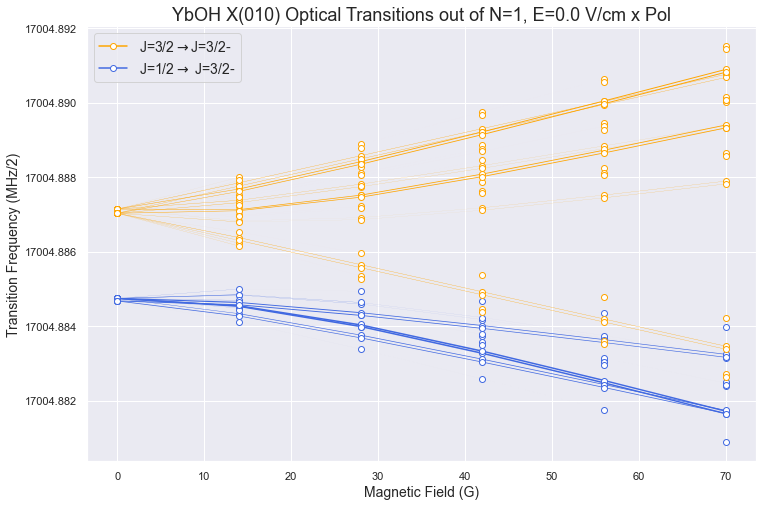

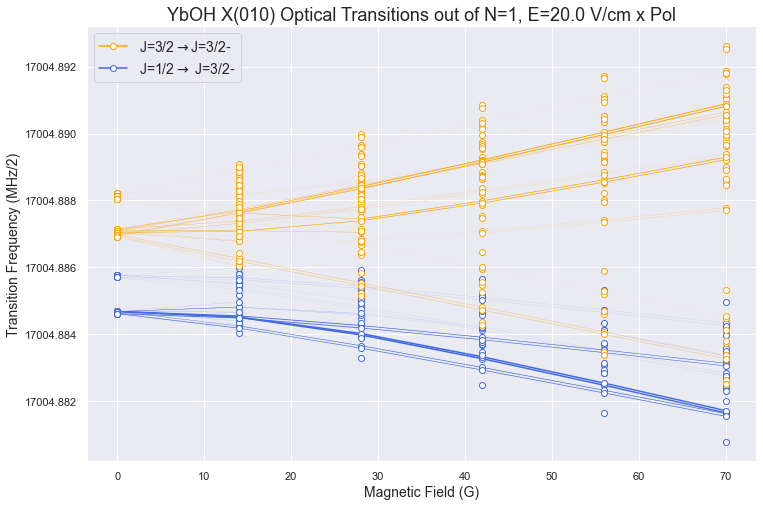

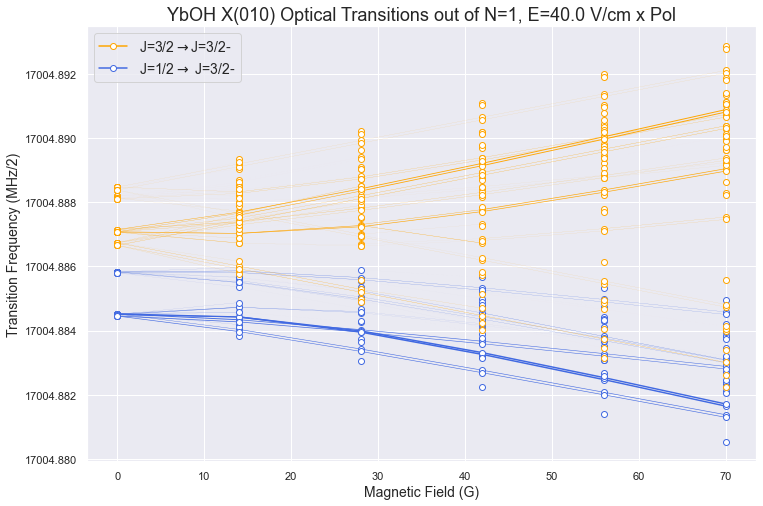

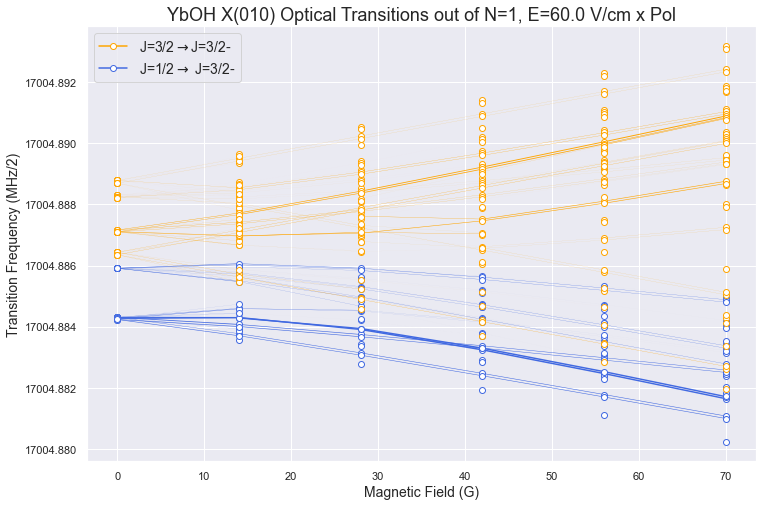

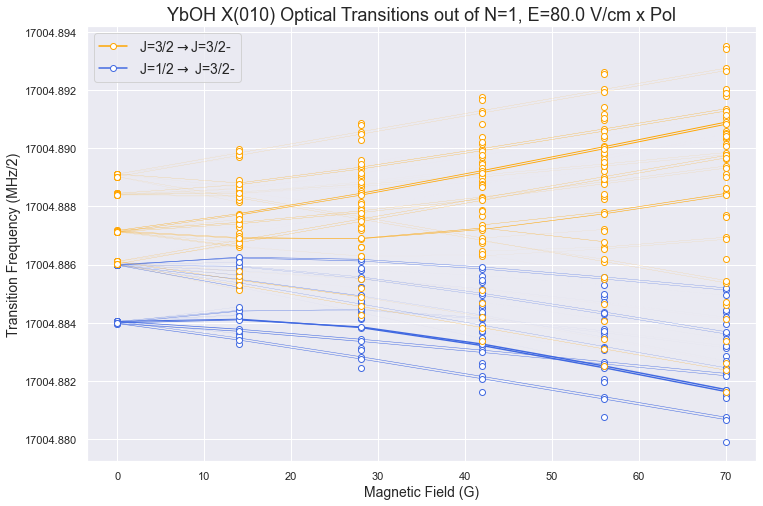

...

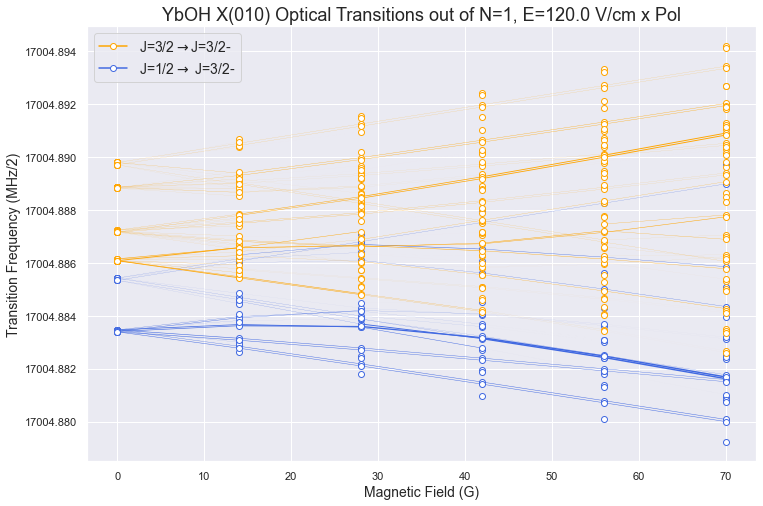

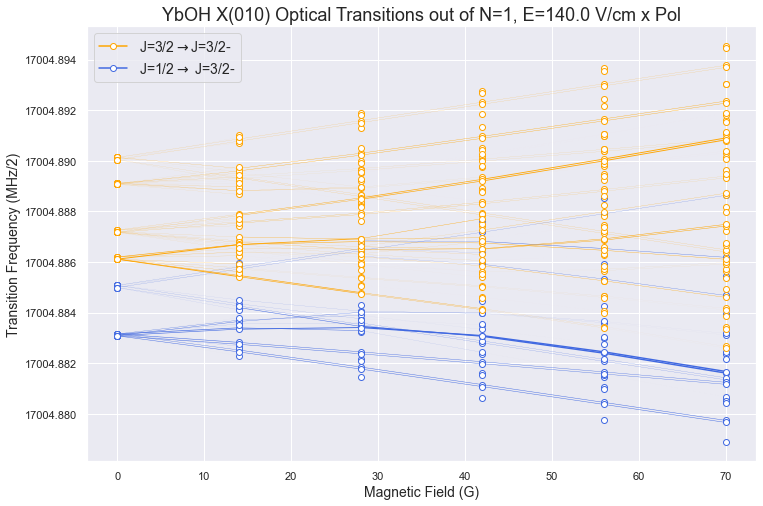

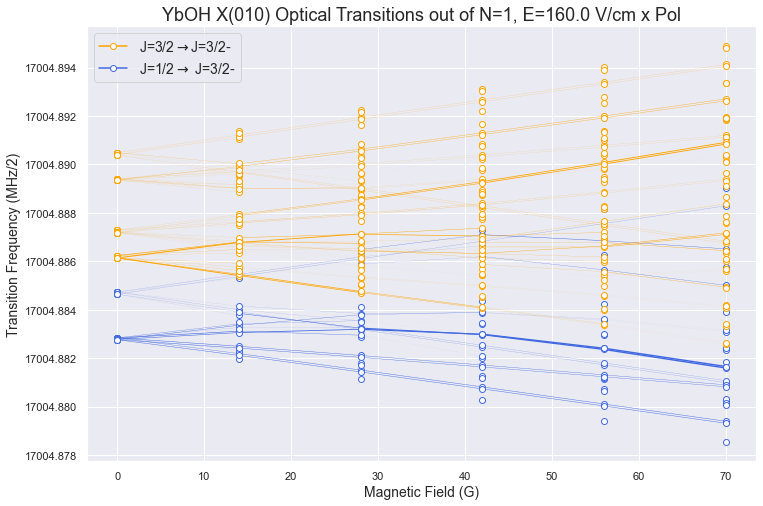

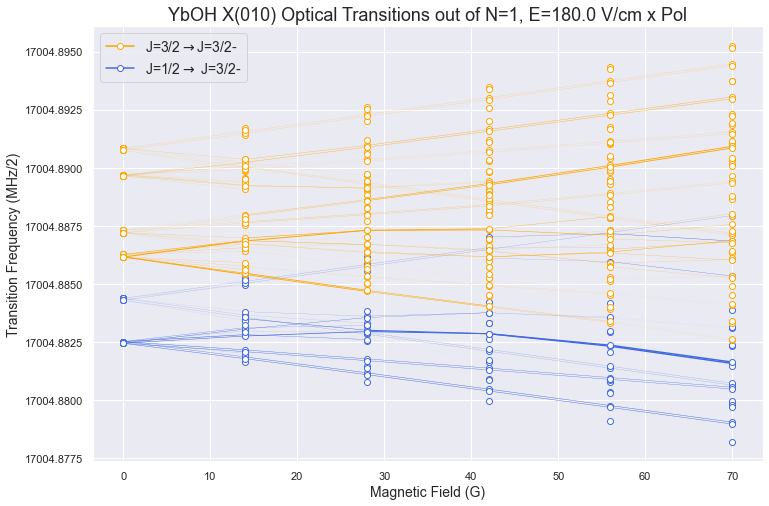

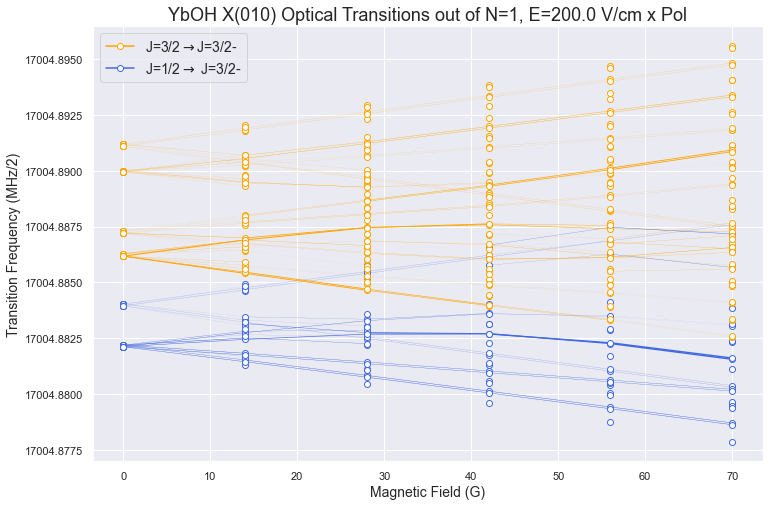

In [33]:
pol = 'x'
print_bool = False
for E in Escan:
    g.eigensystem(0,1e-2)
    e.eigensystem(0,1e-2)
    g1 = g.select_q({'N':1,'J':[1.5]})
    e1 = e.select_q({'J':[1.5],'P':[-1/2,1/2]},parity='-')
    g2 = g.select_q({'N':1,'J':[0.5]})
    e2 = e.select_q({'J':[1.5],'P':[-1/2,1/2]},parity='-')
    g3 = g.select_q({'N':1,'J':[0.5,1.5]})
    e3 = e.select_q({'J':[1.5],'P':[-1/2,1/2]},parity='-')
#     g4 = g.select_q({'N':1,'J':[1.5]})
#     e4 = e.select_q({'N':1,'J':[1.5]})
    fig,a = plt.subplots(figsize=(12,8))
    TDM_B,dE_B,t_str_B = Trans_E[E][pol]
    
#     g = N1.select_q({'N':1,'J':0.5,'F':0},parity='-')
#     e = N2.select_q({'N':2,'J':1.5,'M':[-2,-1,1,2]},parity='+')
#     plot_B(Bscan,TDM_B,dE_B,g_idx=g,e_idx=e,linescale=10,figure=fig,color='pink',marker=None,mfc='white')
#     g = N1.select_q({'N':1,'J':0.5,'F':[1]},parity='-')
#     e = N2.select_q({'N':2,'J':1.5,'M':[-2,-1,0,1,2]},parity='+')
    plot_B(Bscan,TDM_B,dE_B,g_idx=g2,Debye=D,e_idx=e2,linescale=0.2,figure=fig,color='royalblue',marker='o',mfc='white')
    plot_B(Bscan,TDM_B,dE_B,g_idx=g1,Debye=D,e_idx=e1,linescale=0.2,figure=fig,color='orange',marker='o',mfc='white')
#     plot_B(Bscan,TDM_B,dE_B,g_idx=g4,Debye=D,e_idx=e4,linescale=10,figure=fig,color='hotpink',marker='o',mfc='white')
    colors = ['orange','royalblue','hotpink']
    mark = ['o','o','o']
    mf = ['white','white','white']
    lines = [plt.Line2D([0], [0], color=c, marker=mk,mfc=m) for c,m,mk in zip(colors,mf,mark)]
    labels = [r'J=3/2$\rightarrow $J=3/2-',r'J=1/2$\rightarrow$ J=3/2-']
    plt.legend(lines, labels,loc='best',fontsize=14)
    plt.title('YbOH X(010) Optical Transitions out of N=1, E={} V/cm {} Pol'.format(E,pol),fontsize=18)
    plt.show()
    if print_bool:
        print('E = {} V/cm'.format(E))
        table = print_table_B(Bscan,TDM_B,dE_B,t_str_B,g3,e3,thresh = 1e-1,cut=True,dipole=pol)

Using E (V/cm) field of 100
40.04042799999999
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ


Text(0.5, 0, 'Frequency (cm-1)')

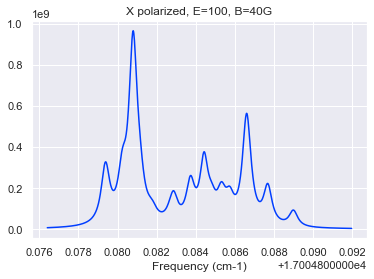

In [48]:
D=5.24
origin = 17998.5875-319.908907
cm=True
E0 =100
B0 = 40
pol = 'x'
if g.E0 != E0 and g.B0 != B0:
    g.ZeemanMap(Bz,E0,plot=False)
    e.ZeemanMap(Bz,E0,plot=False)
info_EB = transitions_B(g,e,[B0],dipole=pol,Debye=D,origin=origin,cm=cm,scale=1.5)
TDM,dE,t_str = info_EB
gidx = g.select_q({'N':1,})
eidx = e.select_q({'J':1.5,'P':[1/2,-1/2]},parity='-')
lines,lor,tdms = simulate_spectra_E(np.square(TDM),dE,gidx,eidx,[E0],E0=E0,g=15/(29979.2458),cut=True,thresh = 1e-6);
plt.title('X polarized, E={}, B={}G'.format(E0,B0))
plt.xlabel('Frequency (cm-1)')

Using E (V/cm) field of 240
70.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ


Text(0.5, 0, 'Frequency (cm-1)')

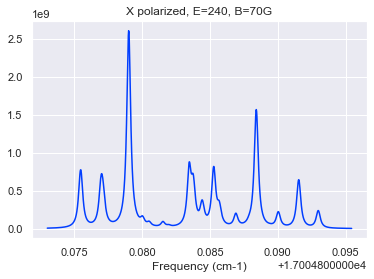

In [43]:
D=5.24
origin = 17998.5875-319.908907
cm=True
E0 =240
B0 = 70
pol = 'x'
g.ZeemanMap(Bz,E0,plot=False)
e.ZeemanMap(Bz,E0,plot=False)
info_EB = transitions_B(g,e,[B0],dipole=pol,Debye=D,origin=origin,cm=cm,scale=2)
TDM,dE,t_str = info_EB
gidx = g.select_q({'N':1,})
eidx = e.select_q({'J':1.5,'P':[1/2,-1/2]},parity='-')
lines,lor,tdms = simulate_spectra_E(np.square(TDM),dE,gidx,eidx,[E0],E0=E0,g=10/(29979.2458),cut=True,thresh = 1e-6);
plt.title('X polarized, E={}, B={}G'.format(E0,B0))
plt.xlabel('Frequency (cm-1)')

Using E (V/cm) field of 200
70.0
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ


Text(0.5, 0, 'Frequency (cm-1)')

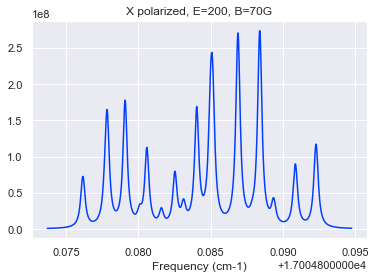

In [54]:
D=5.24
origin = 17998.5875-319.908907
cm=True
E0 =200
B0 = 70
pol = 'x'
g.ZeemanMap(Bz,E0,plot=False)
e.ZeemanMap(Bz,E0,plot=False)
info_EB = transitions_B(g,e,[B0],dipole=pol,Debye=D,origin=origin,cm=cm,scale=-0.5)
TDM,dE,t_str = info_EB
gidx = g.select_q({'N':1,})
eidx = e.select_q({'J':1.5,'P':[1/2,-1/2]},parity='-')
lines,lor,tdms = simulate_spectra_E(np.square(TDM),dE,gidx,eidx,[E0],E0=E0,g=10/(29979.2458),cut=True,thresh = 1e-6);
plt.title('X polarized, E={}, B={}G'.format(E0,B0))
plt.xlabel('Frequency (cm-1)')

In [50]:
list(zip(lines,np.round(tdms,2)))

[(17004.885625565592, 0.0),
 (17004.885625573635, 0.0),
 (17004.8856255817, 0.0),
 (17004.88562558978, 0.0),
 (17004.88562559788, 0.0),
 (17004.885626412288, 0.0),
 (17004.885626425752, 0.0),
 (17004.885626439194, 0.0),
 (17004.88562552802, 0.0),
 (17004.885625536062, 0.0),
 (17004.885625544128, 0.0),
 (17004.885625552208, 0.0),
 (17004.885625560306, 0.0),
 (17004.88562637472, 0.0),
 (17004.88562638818, 0.0),
 (17004.885626401625, 0.0),
 (17004.885625490446, 0.0),
 (17004.88562549849, 0.0),
 (17004.885625506555, 0.0),
 (17004.885625514635, 0.0),
 (17004.885625522733, 0.0),
 (17004.885626337145, 0.0),
 (17004.885626350606, 0.0),
 (17004.885626364052, 0.0),
 (17004.885513007244, 0.0),
 (17004.885513015288, 0.0),
 (17004.885513023353, 0.0),
 (17004.885513031433, 0.0),
 (17004.88551303953, 0.0),
 (17004.885513853944, 0.0),
 (17004.885513867404, 0.0),
 (17004.88551388085, 0.0),
 (17004.885512983874, 0.0),
 (17004.885512991917, 0.0),
 (17004.885512999983, 0.0),
 (17004.885513008063, 0.0),
 (

In [13]:
g.H_symbolic

Matrix([
[                                   7376.1145,                                      14.7525,                                                                0,                                                                0,        -0.4670780207227*B_z + 0.35406644*E_z,                                            0,                                                               0,                                                               0,                                                                0,                                                                0, -1.32109614318485*B_z + 0.25036278071458*E_z,                                            0,                                                               0,                                                               0,                                                  0,                                                  0,                                                   0,                                  

In [11]:
tdms

[6.064171141636983e-46,
 4.226999171544122e-46,
 4.948252343296877e-37,
 1.558987355456383e-47,
 6.278296729019124e-35,
 1.59301095110898e-49,
 4.500087965536726e-36,
 2.359416157352145e-49,
 9.321292124790326e-45,
 2.90200372281242e-36,
 1.9605758764649535e-50,
 8.311397339070044e-37,
 2.456003334351353e-46,
 1.5990388439794054e-35,
 0.0,
 1.168736322396162e-34,
 3.5170303135490674e-36,
 5.922701250239668e-46,
 1.0147520952985284e-36,
 8.578835703445444e-52,
 1.6061952003389555e-47,
 1.3505102389307162e-49,
 9.48097237481962e-35,
 2.390260726632192e-51,
 7.256189889118569e-51,
 7.027152435803517e-50,
 5.797239755831444e-51,
 2.2002307746557107e-35,
 5.002438099434919e-46,
 1.3024009707693615e-47,
 0.0,
 4.0616491538069627e-35,
 7.116523237779351e-46,
 3.108991877697639e-46,
 1.5347069910063884e-34,
 2.4515849871683403e-47,
 4.830166785395953e-35,
 1.5545528729962804e-48,
 7.204856025909445e-36,
 1.3778391761332771e-49,
 5.668411362367823e-45,
 1.4290467661792785e-36,
 2.05872161998158

In [2]:
list(zip(lines,np.round(tdms,4)))

NameError: name 'lines' is not defined

In [72]:
x010 = MoleculeLevels.initialize_state('YbOH','174','X010',[1,2,3],M_values = 'all',I=[0,1/2],S=1/2,round=8,P_values=[1/2,3/2])

In [93]:
a000 = MoleculeLevels.initialize_state('YbOH','174','A000',[1,2,3],M_values = 'all',I=[0,1/2],S=1/2,round=8,P_values=[1/2,3/2])

In [104]:
vals,vecs = x010.eigensystem(0,70)

In [105]:
arian = vals/(29979.2458)+17998.5875*0 + 319.908907
arian

array([320.148744361, 320.148828215, 320.149367315, 320.149441671,
       320.149728534, 320.149812389, 320.150105544, 320.1501824  ,
       320.15035149 , 320.150425846, 320.151089722, 320.151166577,
       320.155290038, 320.155371815, 320.156274211, 320.156283024,
       320.156349805, 320.156355988, 320.157015762, 320.157096457,
       320.157267201, 320.157333982, 320.157999942, 320.158080636,
       321.123647052, 321.123724084, 321.124338139, 321.12441076 ,
       321.125123373, 321.12518938 , 321.126055812, 321.126111994,
       321.126599586, 321.126676618, 321.127272319, 321.127290672,
       321.127313054, 321.127363293, 321.128075907, 321.128141914,
       321.129008346, 321.129064528, 321.130192451, 321.130224853,
       321.130265588, 321.130267693, 321.133108022, 321.133144985,
       321.133152625, 321.133220226, 321.134311032, 321.134367074,
       321.135235521, 321.135297554, 321.136015963, 321.136060557,
       321.136080905, 321.13610516 , 321.137263567, 321.137319

In [106]:
yuiki = np.array([320.1487449054689,
 320.14882867433334,
 320.1493677915599,
 320.14944215413476,
 320.14972907817537,
 320.1498128468788,
 320.1501059880212,
 320.15018289508924,
 320.15035196566134,
 320.1504263282467,
 320.15109016416596,
 320.15116707131,
 320.1552895986822,
 320.1553712932073,
 320.1562737712242,
 320.15628256414885,
 320.1563493733945,
 320.1563554655924,
 320.15701528768074,
 320.15709601958105,
 320.1572667404665,
 320.157333549744,
 320.15799946610764,
 320.1580801980822,
 321.12364762182864,
 321.1237246038431,
 321.1243386400533,
 321.1244112442359,
 321.1251238046136,
 321.125189818375,
 321.12605616884974,
 321.1261123692014,
 321.1266001531445,
 321.1266771350238,
 321.1272725920058,
 321.1272911713893,
 321.127313336039,
 321.1273637754876,
 321.12807633597487,
 321.1281423497074,
 321.1290087002457,
 321.1290649006297,
 321.1301920385976,
 321.1302251234593,
 321.13026586759264,
 321.1302672314525,
 321.1331078288354,
 321.13314456977446,
 321.13315249521617,
 321.133219762498,
 321.13431076319864,
 321.1343668409232,
 321.1352352063056,
 321.13529722894185,
 321.1360156185607,
 321.1360603609972,
 321.1360804925639,
 321.1361050272506,
 321.13726329548416,
 321.13731937318124,
 321.1381877386899,
 321.13824976139455,
 321.1389681510318,
 321.1390330251966,
 322.5980065435203,
 322.5980515177244,
 322.5989507499722,
 322.5989768306349,
 322.59989475794436,
 322.59990233014406,
 322.60082800550344,
 322.60083857932693,
 322.6017538469585,
 322.6017822248682,
 322.6026798456246,
 322.6027257043227,
 322.60391161456585,
 322.60395658890155,
 322.60485582107464,
 322.6048819018104,
 322.6057998291021,
 322.60580740131917,
 322.60673307667935,
 322.60674365053853,
 322.6076589181363,
 322.6076872961324,
 322.6085849168053,
 322.6086307756382]
)

In [107]:
arian = arian[:len(yuiki)]

In [108]:
arian-yuiki

array([-0.000000544, -0.000000459, -0.000000477, -0.000000483,
       -0.000000544, -0.000000458, -0.000000444, -0.000000495,
       -0.000000476, -0.000000482, -0.000000443, -0.000000494,
        0.000000439,  0.000000521,  0.00000044 ,  0.00000046 ,
        0.000000431,  0.000000522,  0.000000475,  0.000000437,
        0.000000461,  0.000000432,  0.000000476,  0.000000438,
       -0.00000057 , -0.000000519, -0.000000501, -0.000000485,
       -0.000000431, -0.000000439, -0.000000357, -0.000000376,
       -0.000000567, -0.000000517, -0.000000273, -0.000000499,
       -0.000000282, -0.000000482, -0.000000429, -0.000000436,
       -0.000000354, -0.000000373,  0.000000413, -0.00000027 ,
       -0.00000028 ,  0.000000461,  0.000000193,  0.000000415,
        0.00000013 ,  0.000000464,  0.000000269,  0.000000233,
        0.000000315,  0.000000325,  0.000000344,  0.000000196,
        0.000000412,  0.000000133,  0.000000271,  0.000000236,
        0.000000317,  0.000000328,  0.000000347,  0.000

In [20]:
yuiki_dict=[{'E': 320.1519874763684, 'N': 1, 'J': 1.5, 'P': 1.5, 'F': 1.0, 'Parity': -1},
 {'E': 320.1520999838366, 'N': 1, 'J': 1.5, 'P': 1.5, 'F': 2.0, 'Parity': -1},
 {'E': 320.15297164904666, 'N': 1, 'J': 1.5, 'P': 1.5, 'F': 1.0, 'Parity': 1},
 {'E': 320.1530841563027, 'N': 1, 'J': 1.5, 'P': 1.5, 'F': 2.0, 'Parity': 1},
 {'E': 320.1543861935952, 'N': 2, 'J': 0.5, 'P': 0.5, 'F': 1.0, 'Parity': -1},
 {'E': 320.15445561666667, 'N': 2, 'J': 0.5, 'P': 0.5, 'F': 0.0, 'Parity': -1},
 {'E': 320.1553703735929, 'N': 2, 'J': 0.5, 'P': 0.5, 'F': 1.0, 'Parity': 1},
 {'E': 320.15543979666666, 'N': 2, 'J': 0.5, 'P': 0.5, 'F': 0.0, 'Parity': 1},
 {'E': 321.126903550508, 'N': 3, 'J': 2.5, 'P': 1.5, 'F': 2.0, 'Parity': 1},
 {'E': 321.1269959175537, 'N': 3, 'J': 2.5, 'P': 1.5, 'F': 3.0, 'Parity': 1},
 {'E': 321.12985608178155, 'N': 3, 'J': 2.5, 'P': 1.5, 'F': 2.0, 'Parity': -1},
 {'E': 321.12994844866734, 'N': 3, 'J': 2.5, 'P': 1.5, 'F': 3.0, 'Parity': -1},
 {'E': 321.13344633701143, 'N': 4, 'J': 1.5, 'P': 0.5, 'F': 2.0, 'Parity': 1},
 {'E': 321.1334983606937, 'N': 4, 'J': 1.5, 'P': 0.5, 'F': 1.0, 'Parity': 1},
 {'E': 321.1363988694775, 'N': 4, 'J': 1.5, 'P': 0.5, 'F': 2.0, 'Parity': -1},
 {'E': 321.1364508933697, 'N': 4, 'J': 1.5, 'P': 0.5, 'F': 1.0, 'Parity': -1}]
yuiki = np.array([dic['E'] for dic in yuiki_dict])

In [29]:
yuiki_dict = [{'E': 17323.6215181406, 'J': 0.5, 'P': 0.5, 'F': 1.0, 'Parity': -1},
 {'E': 17323.621520250603, 'J': 0.5, 'P': 0.5, 'F': 0.0, 'Parity': -1},
 {'E': 17324.05958434058, 'J': 0.5, 'P': 0.5, 'F': 1.0, 'Parity': 1},
 {'E': 17324.059586450603, 'J': 0.5, 'P': 0.5, 'F': 0.0, 'Parity': 1},
 {'E': 17324.16150616901, 'J': 1.5, 'P': 0.5, 'F': 2.0, 'Parity': 1},
 {'E': 17324.161507012934, 'J': 1.5, 'P': 0.5, 'F': 1.0, 'Parity': 1},
 {'E': 17325.037615680852, 'J': 1.5, 'P': 0.5, 'F': 2.0, 'Parity': -1},
 {'E': 17325.03761652477, 'J': 1.5, 'P': 0.5, 'F': 1.0, 'Parity': -1},
 {'E': 17325.207514011483, 'J': 2.5, 'P': 0.5, 'F': 3.0, 'Parity': -1},
 {'E': 17325.2075145539, 'J': 2.5, 'P': 0.5, 'F': 2.0, 'Parity': -1},
 {'E': 17326.521621058928, 'J': 2.5, 'P': 0.5, 'F': 3.0, 'Parity': 1},
 {'E': 17326.521621601343, 'J': 2.5, 'P': 0.5, 'F': 2.0, 'Parity': 1},
 {'E': 17326.75953928891, 'J': 3.5, 'P': 0.5, 'F': 4.0, 'Parity': 1},
 {'E': 17326.75953969059, 'J': 3.5, 'P': 0.5, 'F': 3.0, 'Parity': 1},
 {'E': 17328.511575207624, 'J': 3.5, 'P': 0.5, 'F': 4.0, 'Parity': -1},
 {'E': 17328.5115756093, 'J': 3.5, 'P': 0.5, 'F': 3.0, 'Parity': -1},
 {'E': 17328.81757400227, 'J': 4.5, 'P': 0.5, 'F': 5.0, 'Parity': -1},
 {'E': 17328.817574321674, 'J': 4.5, 'P': 0.5, 'F': 4.0, 'Parity': -1},
 {'E': 17331.007447239914, 'J': 4.5, 'P': 0.5, 'F': 5.0, 'Parity': 1},
 {'E': 17331.00744755931, 'J': 4.5, 'P': 0.5, 'F': 4.0, 'Parity': 1},
 {'E': 18674.093743102694, 'J': 1.5, 'P': 1.5, 'F': 1.0, 'Parity': 1},
 {'E': 18674.093743190835, 'J': 1.5, 'P': 1.5, 'F': 1.0, 'Parity': -1},
 {'E': 18674.093745634593, 'J': 1.5, 'P': 1.5, 'F': 2.0, 'Parity': 1},
 {'E': 18674.093745722734, 'J': 1.5, 'P': 1.5, 'F': 2.0, 'Parity': -1},
 {'E': 18675.35922925572, 'J': 2.5, 'P': 1.5, 'F': 2.0, 'Parity': -1},
 {'E': 18675.359229608264, 'J': 2.5, 'P': 1.5, 'F': 2.0, 'Parity': 1},
 {'E': 18675.35923088326, 'J': 2.5, 'P': 1.5, 'F': 3.0, 'Parity': -1},
 {'E': 18675.359231235805, 'J': 2.5, 'P': 1.5, 'F': 3.0, 'Parity': 1},
 {'E': 18677.13088968148, 'J': 3.5, 'P': 1.5, 'F': 3.0, 'Parity': 1},
 {'E': 18677.130890562763, 'J': 3.5, 'P': 1.5, 'F': 3.0, 'Parity': -1},
 {'E': 18677.130890886958, 'J': 3.5, 'P': 1.5, 'F': 4.0, 'Parity': 1},
 {'E': 18677.13089176824, 'J': 3.5, 'P': 1.5, 'F': 4.0, 'Parity': -1},
 {'E': 18679.40870508287, 'J': 4.5, 'P': 1.5, 'F': 4.0, 'Parity': -1},
 {'E': 18679.40870604166, 'J': 4.5, 'P': 1.5, 'F': 5.0, 'Parity': -1},
 {'E': 18679.408706845228, 'J': 4.5, 'P': 1.5, 'F': 4.0, 'Parity': 1},
 {'E': 18679.408707804017, 'J': 4.5, 'P': 1.5, 'F': 5.0, 'Parity': 1}
]
yuiki = np.array([dic['E'] for dic in yuiki_dict])


In [30]:
a000 = MoleculeLevels.initialize_state('YbOH','174','A000',[1,2,3,4,5],M_values = 'none',I=[0,1/2],S=1/2,round=8,P_values=[1/2,3/2])

Cannot construct decoupled basis without M values


In [22]:
x010 = MoleculeLevels.initialize_state('YbOH','174','X010',[1,2],M_values = 'none',I=[0,1/2],S=1/2,round=8,P_values=[1/2,3/2])

Cannot construct decoupled basis without M values
Cannot construct decoupled basis without M values
Cannot construct decoupled basis without M values


In [34]:
arian = (a000.evals0[:32])/29979.2458

In [40]:
arian + 17998.5875

array([17323.621518507, 17323.621520617, 17324.059584434, 17324.059586544,
       17324.161505859, 17324.161506703, 17325.037614829, 17325.037615673,
       17325.20751248 , 17325.207513023, 17326.521618725, 17326.521619268,
       17326.75953599 , 17326.759536392, 17328.511570859, 17328.511571261,
       17328.817568388, 17328.817568707, 17331.007440345, 17331.007440664,
       17331.381596098, 17331.381596364, 17334.009190724, 17334.00919099 ,
       18674.093742061, 18674.093742149, 18674.093744593, 18674.093744681,
       18675.359226862, 18675.359227214, 18675.359228489, 18675.359228842])

In [23]:
arian = (x010.evals0)/29979.2458

In [37]:
(arian - arian.min()) - (yuiki - yuiki.min())

array([    0.         ,     0.         ,    -0.000000273,    -0.000000273,
          -0.000000677,    -0.000000676,    -0.000001218,    -0.000001218,
          -0.000001898,    -0.000001898,    -0.0000027  ,    -0.0000027  ,
          -0.000003665,    -0.000003665,    -0.000004715,    -0.000004715,
          -0.000005981,    -0.000005981,    -0.000007261,    -0.000007261,
       -1342.712147371, -1342.712147194, -1340.084555277, -1340.0845551  ,
          -1.265487561,    -1.265487825,    -1.265486657,    -1.265486921,
          -1.771663186,    -1.771663715,    -1.771662764,    -1.771663293])

In [26]:
arian[0]

0.2430803987877507

In [28]:
yuiki[0]-arian[0]

319.90890707758064

In [19]:
dE[0,gidx,:]

array([[17003.46946, 17003.46946, 17003.46946, 17003.46946, 17003.46847,
        17003.46847, 17003.46847, 17003.46847, 17003.46712, 17003.46712,
        17003.46613, 17003.46613],
       [17003.46946, 17003.46946, 17003.46946, 17003.46946, 17003.46847,
        17003.46847, 17003.46847, 17003.46847, 17003.46712, 17003.46712,
        17003.46613, 17003.46613],
       [17003.53594, 17003.53594, 17003.53594, 17003.53594, 17003.53496,
        17003.53496, 17003.53496, 17003.53496, 17003.5336 , 17003.5336 ,
        17003.53262, 17003.53262],
       [17003.53594, 17003.53594, 17003.53594, 17003.53594, 17003.53496,
        17003.53496, 17003.53496, 17003.53496, 17003.5336 , 17003.5336 ,
        17003.53262, 17003.53262],
       [17003.53594, 17003.53594, 17003.53594, 17003.53594, 17003.53496,
        17003.53496, 17003.53496, 17003.53496, 17003.5336 , 17003.5336 ,
        17003.53262, 17003.53262],
       [17003.53594, 17003.53594, 17003.53594, 17003.53594, 17003.53496,
        17003.53496, 1

In [79]:
g.select_q({'J':0.5},parity='+')

array([20, 21, 22, 23])

In [120]:
v = g.evecs_E[-1][20]
P=g.Parity_mat

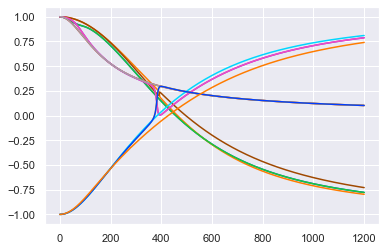

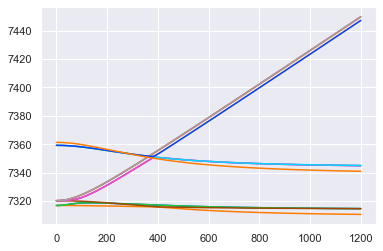

In [162]:
v = g.evecs_E.T[23]
parity_E = np.zeros((len(g.evals0),len(Ez)))
for i in range(len(g.evals0)):
    for j in range(len(Ez)):
        v=g.evecs_E[j,i]
        parity_E[i,j] = v@P@v
for pval in parity_E[8:20,:]:
    plt.plot(pval)
plt.figure()
for trace in g.evals_E.T[8:20]:
    plt.plot(trace);

In [132]:
parity_E.shape

(24, 1201)

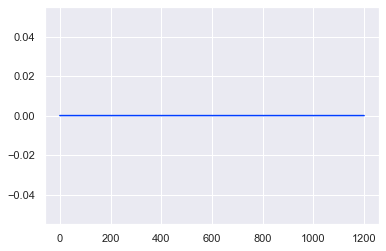

In [118]:
plt.plot(parity_E)

In [40]:
np.array(X010.parities)[X010.select_q({'N':1},parity='+')]

array([1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.])

In [38]:
X010.evals0[X010.select_q({'N':1},parity='+')]

array([7316.81479, 7316.92707, 7317.04005, 7320.16263, 7320.23306,
       7320.30326, 7320.37321, 7320.44287, 7388.74287, 7388.78421,
       7388.82802, 7390.86796])

In [33]:
X010.evecs0[X010.select_q({'N':1},parity='+')].shape

(12, 24)

In [22]:
Bz = np.linspace(1e-3,50,1000)
Ez = np.linspace(0,1000,1000)

Text(0.5, 1.0, 'G=3 Stark Shifts')

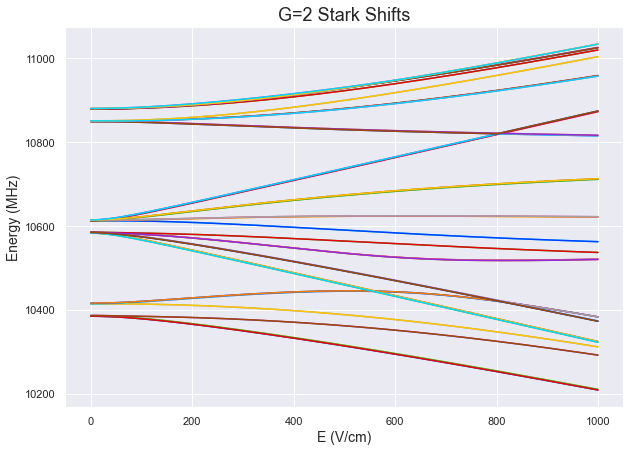

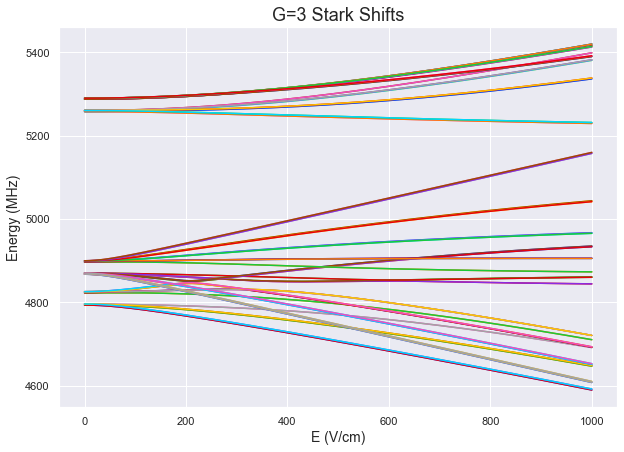

In [23]:
X010.StarkMap(Ez,1e-3,plot=True,idx = X010.select_q({'G':2}))
plt.title('G=2 Stark Shifts',fontsize=18)
X010.StarkMap(Ez,1e-3,plot=True,idx = X010.select_q({'G':3}))
plt.title('G=3 Stark Shifts',fontsize=18)

Text(0.5, 1.0, 'G=0 Zeeman Shifts')

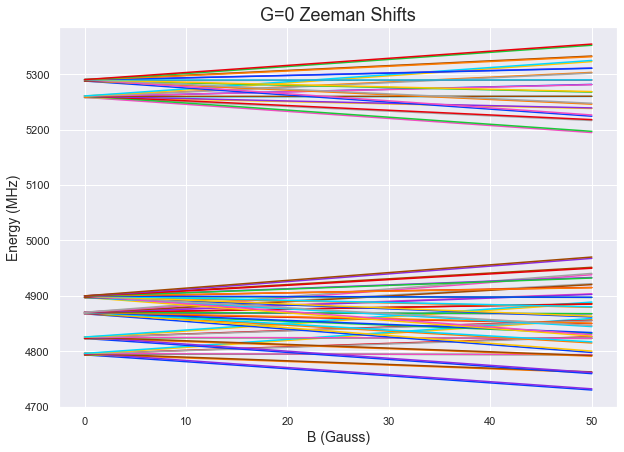

In [24]:
X010.ZeemanMap(Bz,0,plot=True,idx = X010.select_q({'G':3}))
plt.title('G=0 Zeeman Shifts',fontsize=18)

Text(0.5, 1.0, 'G=1 Zeeman Shifts')

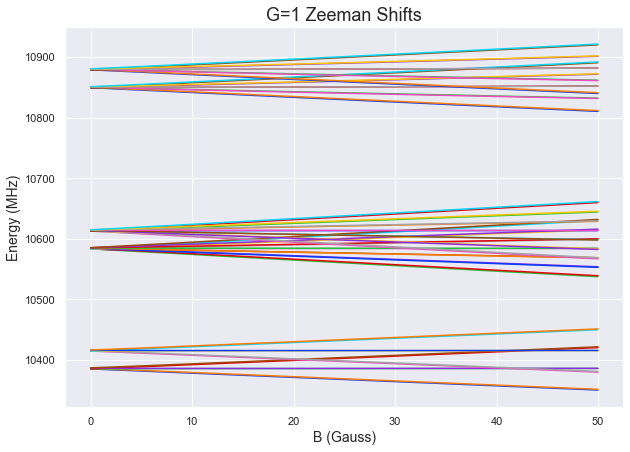

In [25]:
X010.ZeemanMap(Bz,0,plot=True,idx = X010.select_q({'G':2}))
plt.title('G=1 Zeeman Shifts',fontsize=18)

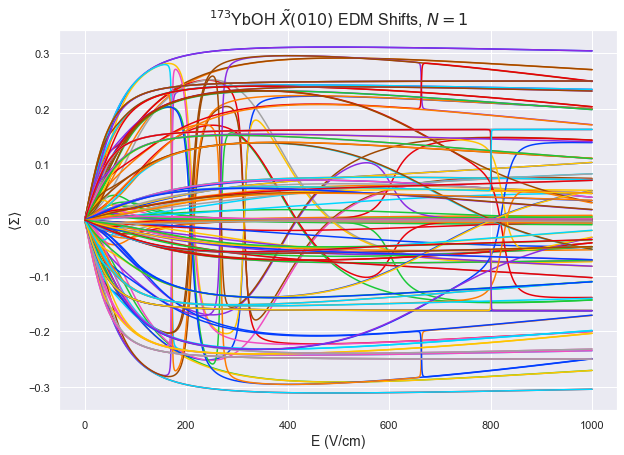

In [41]:
X010.PTV_Map('EDM',E_or_B='E',plot=True)

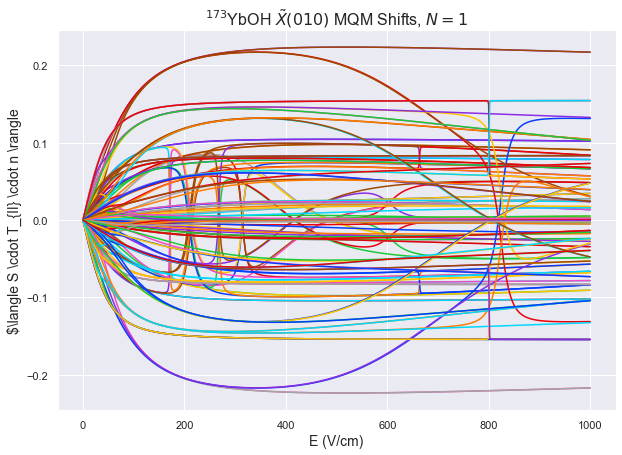

In [35]:
X010.PTV_Map('MQM',E_or_B='E',plot=True)

In [28]:
X010.g_eff_Map(step=1e-6);

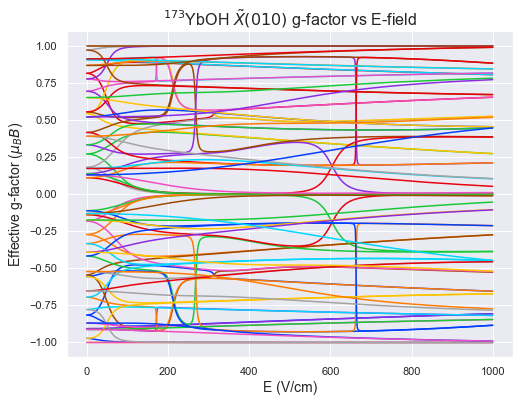

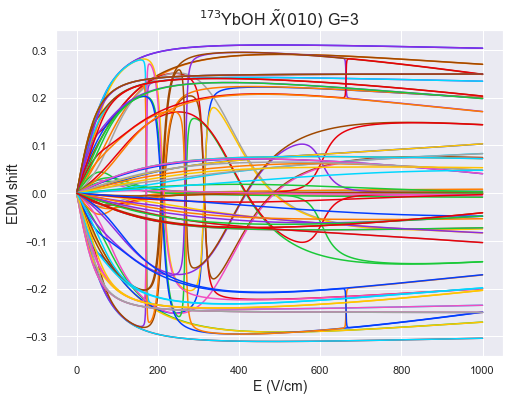

In [44]:
qd={'G':3}
plt.figure(figsize=(8,6))
for i in X010.select_q(qd):#range(len(X010_174.g_eff_E.T)):
#     if abs(X010.PTV_E.T[i]).mean()<0.05:
#         continue
    plt.plot(Ez,X010.g_eff_E.T[i])
plt.xlabel('E (V/cm)',fontsize=14)
plt.ylabel(r'Effective g-factor ($\mu_B B$)',fontsize=14)
plt.title(X010.state_str + ' g-factor vs E-field',fontsize=16);
plt.figure(figsize=(8,6))
for i in X010.select_q(qd):#range(len(X010_174.PTV_E.T)):
#     if abs(X010.PTV_E.T[i]).mean()<0.05:
#         continue
    plt.plot(Ez,X010.PTV_E.T[i])
plt.xlabel('E (V/cm)',fontsize=14)
plt.ylabel('EDM shift',fontsize=14)
plt.title(X010.state_str+' G={}'.format(qd['G'][0]),fontsize=16);

Text(0.5, 1.0, '$^{173}$YbOH $\\tilde{X}(010)$ MQM Shifts, G=3, E=300 V/cm')

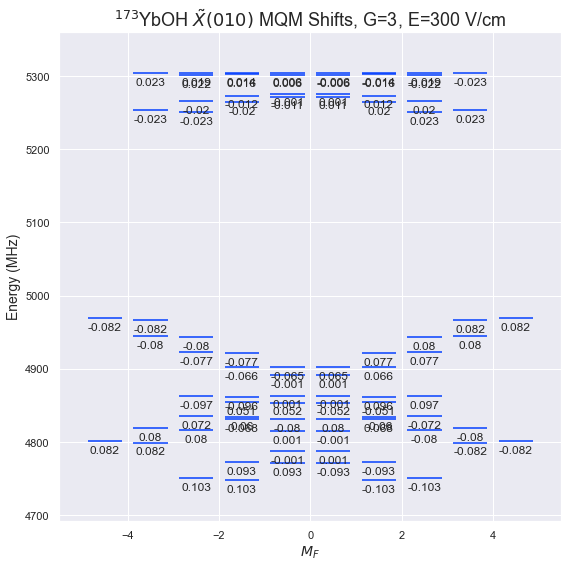

In [62]:
X010.display_PTV(300,1e-4,'MQM',idx=X010.select_q({'G':3}),round=3)
# plt.ylim(10300,10500)
plt.xlim(-5.5,5.5)
plt.title(X010.state_str + ' MQM Shifts, G=3, E=300 V/cm',fontsize=18)

(-2.5, 2.5)

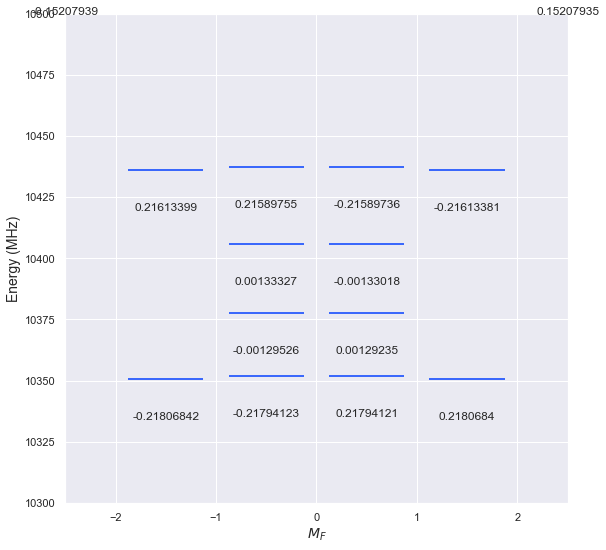

In [52]:
X010.display_PTV(300,1e-3,'MQM',idx=X010.select_q({'G':2}))
plt.ylim(10300,10500)
plt.xlim(-2.5,2.5)

Text(0.5, 1.0, 'CaOH X(010) N=2+,J=3/2 Zeeman Shifts')

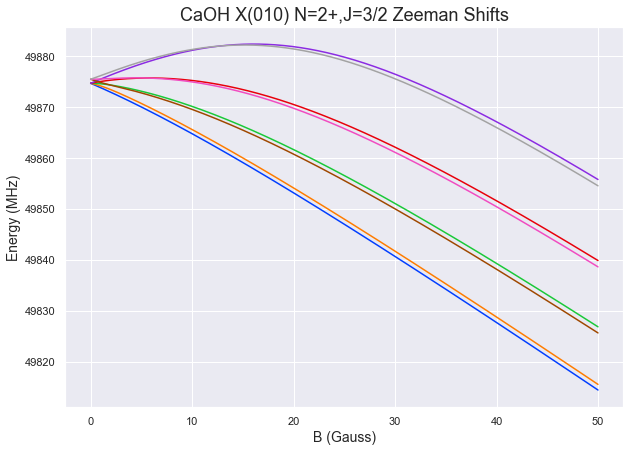

In [243]:
X010.ZeemanMap(Bz,0,plot=True,idx = X010.select_q({'N':2,'J':1.5},parity='+'))
plt.title('CaOH X(010) N=2+,J=3/2 Zeeman Shifts',fontsize=18)

In [56]:
B0 = 9
E0 = 150
evals, evecs = X010.eigensystem(E0,B0,order=True,method='torch')
M0_idx = X010.select_q({'N':1,})
print(M0_idx)
print('\n')
for i in M0_idx:
    display(Latex('$E = '+str(np.round(X010.evals0[i],4))+r'\:\mathrm{MHz}$'))
    print('Decoupled:')
    display(Latex(X010.gen_state_str(i,basis='decoupled',thresh=0.05,label_q=['K','M_N','M_S','M_I','M_F'],round=4)))
#     print('Case A:')
#     display(Latex(X010.gen_state_str(i,basis='aBJ',thresh=0.05,label_q=['K','J','F','Sigma','P','M'],round=4)))
    print('Case B:')
    print('Parity=',X010.parities[i])
    display(Latex(X010.gen_state_str(i,thresh=0.0005,round=4)))
    print('\n')

[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23]




<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case B:
Parity= -1.0


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case B:
Parity= -1.0


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case B:
Parity= -1.0


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case B:
Parity= -1.0


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case B:
Parity= -1.0


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case B:
Parity= -1.0


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case B:
Parity= -1.0


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case B:
Parity= -1.0


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case B:
Parity= -1.0


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case B:
Parity= -1.0


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case B:
Parity= -1.0


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case B:
Parity= -1.0


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case B:
Parity= 1.0


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case B:
Parity= 1.0


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case B:
Parity= 1.0


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case B:
Parity= 1.0


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case B:
Parity= 1.0


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case B:
Parity= 1.0


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case B:
Parity= 1.0


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case B:
Parity= 1.0


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case B:
Parity= 1.0


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case B:
Parity= 1.0


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case B:
Parity= 1.0


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case B:
Parity= 1.0


<IPython.core.display.Latex object>

In [282]:
E0=50
B0=1e-4
TDM0 = 1.465*Calculate_TDMs(0,N1,N2,E0,B0,[0])
# TDMp = 1.465*Calculate_TDMs(1,X010,X010,E0,B0)
# TDMm = 1.465*Calculate_TDMs(-1,X010,X010,E0,B0)
# TDMx = -1/np.sqrt(2)*(TDMp - TDMm)

Successfully converted eigenvectors from bBJ to aBJ
Successfully converted eigenvectors from bBJ to aBJ


In [283]:
def l2s(inputlist):
      """
      Convert a flatten list to a list of slices:
      test = [0,2,3,4,5,6,12,99,100,101,102,13,14,18,19,20,25]
      list_to_slices(test)
      -> [(0, 0), (2, 6), (12, 14), (18, 20), (25, 25), (99, 102)]
      """
      inputlist.sort()
      pointers = np.where(np.diff(inputlist) > 1)[0]
      pointers = zip(np.r_[0, pointers+1], np.r_[pointers, len(inputlist)-1])
      slices = [(inputlist[i], inputlist[j]+1) for i, j in pointers]
      return slices

In [286]:
N1_all = N1.select_q({'N':1,'F':0},parity='-')
N2_all = N2.select_q({'N':2,'M':0},parity='+')

In [289]:
N2s

(4, 5)

C:\Users\ajadbaba\AppData\Local\Temp/ipykernel_20532/4255074159.py:40: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cbar = fig.colorbar(mat, ax=ax,fraction=0.015, pad=0.05)


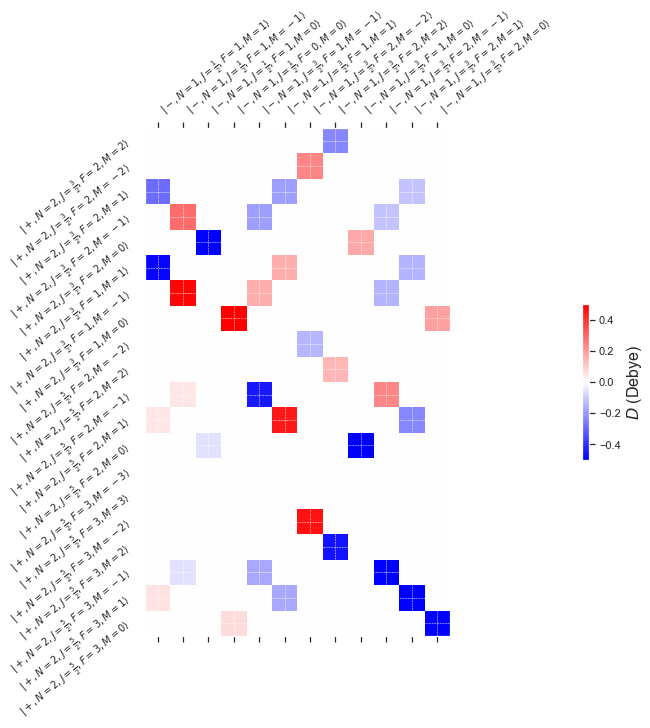

In [290]:
fig,ax = plt.subplots(figsize=(10,10),constrained_layout=True)
# ax.set_aspect('equal')
N1_all = N1.select_q({'N':1},parity='-')
N2_all = N2.select_q({'N':2},parity='+')
N1s = l2s(N1_all)[0]
N2s = l2s(N2_all)[0]
N1l = np.arange(*N1s)
N2l = np.arange(*N2s)
log=False
BR_plot = TDM0 #convert MHz/V/cm to Debye
if log:
    BR_plot=np.log10(BR_plot)
    vmin = -10
    vmax = 0
else:
    vmin=None
    vmax = None
#     log_BR = np.copy(BR0)
#     for i,val1 in enumerate(log_BR):
#         for j,val2 in enumerate(val1):
#             if val2 !=0:
#                 log_BR[i,j] = np.log10(val2)
#     BR_plot = log_BR
mat = ax.matshow(BR_plot[slice(*N2s),slice(*N1s)],cmap=plt.get_cmap('bwr'),vmax = 0.5, vmin = -0.5)
y = np.arange(0,len(N2l))
x = np.arange(0,len(N1l))
ax.set_yticks(y)
ax.set_xticks(x)
y_labels = [N2.gen_state_str(i,thresh=0.2,single=True,parity=True,show_coeff=False, label_q=['N','J','F','M']) for i in N2l]
x_labels = [N1.gen_state_str(i,thresh=0.2,single=True,parity=True,show_coeff=False, label_q=['N','J','F','M']) for i in N1l]
# x_labels = [X010.gen_state_str(i,thresh=0.3,single=True,parity=False,show_coeff=True, basis='decoupled',label_q=['K','M_N','M_S','M_F'],round=2) for i in N2]
# y_labels = [X010.gen_state_str(i,thresh=0.3,single=True,parity=False,show_coeff=True, basis='decoupled',label_q=['K','M_N','M_S','M_F'],round=2) for i in N1]
ax.set_yticklabels(y_labels, rotation='40', fontsize=12, ha='right')
ax.set_xticklabels(x_labels, rotation='40', fontsize=12,ha='left')
ax.tick_params(axis='both',labelsize=10,direction='out')
ax.grid(True,which='major',color='white',ls='--',linewidth=0.5)
ax.grid(False,which='minor')
(bot,top) = ax.get_ylim()
# ax.set_ylim(bot+0.5, top-0.5)
cbar = fig.colorbar(mat, ax=ax,fraction=0.015, pad=0.05)
cbar.set_label(label=r'$D$ (Debye)',size=16)
#ax.set_xlim(-0.5,x.size+0.5);

C:\Users\ajadbaba\AppData\Local\Temp/ipykernel_3440/1571935017.py:41: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cbar = fig.colorbar(mat, ax=ax,fraction=0.03, pad=0.0,extend='min')


Text(0.5, 1.0, '$|D|$ (Debye)')

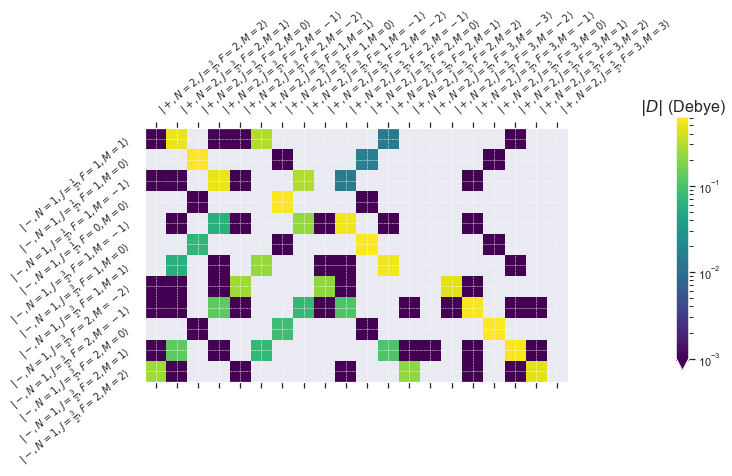

In [18]:
fig,ax = plt.subplots(figsize=(10,10),constrained_layout=True)
# ax.set_aspect('equal')
N1_all = X010.select_q({'N':1},parity='-')
N2_all = X010.select_q({'N':2},parity='+')
N1s = l2s(N1_all)[0]
N2s = l2s(N2_all)[0]
N1 = np.arange(*N1s)
N2 = np.arange(*N2s)
log=False
BR_plot = abs(TDM0)
BR_plot[BR_plot<1e-8]=0
if log:
    BR_plot=np.log10(BR_plot)
    vmin = -10
    vmax = 0
else:
    vmin=None
    vmax = None
#     log_BR = np.copy(BR0)
#     for i,val1 in enumerate(log_BR):
#         for j,val2 in enumerate(val1):
#             if val2 !=0:
#                 log_BR[i,j] = np.log10(val2)
#     BR_plot = log_BR
mat = ax.matshow(BR_plot[slice(*N1s),slice(*N2s)],cmap=sns.color_palette("viridis", as_cmap=True),norm=colors.LogNorm(vmin=1e-3))#vmax = vmax, vmin = -3)
x = np.arange(0,len(N2))
y = np.arange(0,len(N1))
ax.set_yticks(y)
ax.set_xticks(x)
x_labels = [X010.gen_state_str(i,thresh=0.2,single=True,parity=True,show_coeff=False, label_q=['N','J','F','M']) for i in N2]
y_labels = [X010.gen_state_str(i,thresh=0.2,single=True,parity=True,show_coeff=False, label_q=['N','J','F','M']) for i in N1]
# x_labels = [X010.gen_state_str(i,thresh=0.3,single=True,parity=False,show_coeff=True, basis='decoupled',label_q=['K','M_N','M_S','M_F'],round=2) for i in N2]
# y_labels = [X010.gen_state_str(i,thresh=0.3,single=True,parity=False,show_coeff=True, basis='decoupled',label_q=['K','M_N','M_S','M_F'],round=2) for i in N1]
ax.set_yticklabels(y_labels, rotation='40', fontsize=12, ha='right')
ax.set_xticklabels(x_labels, rotation='40', fontsize=12,ha='left')
ax.tick_params(axis='both',labelsize=10,direction='out')
ax.grid(True,which='major',color='white',ls='--',linewidth=0.5)
ax.grid(False,which='minor')
(bot,top) = ax.get_ylim()
# ax.set_ylim(bot+0.5, top)
cbar = fig.colorbar(mat, ax=ax,fraction=0.03, pad=0.0,extend='min')
cbar.ax.set_title(label=r'$|D|$ (Debye)',size=16,rotation=0)
#ax.set_xlim(-0.5,x.size+0.5);

In [13]:
from tabulate import tabulate

In [135]:
plt.figure(figsize=(10,7))
for (i,trace) in enumerate(X010.evals_B.T[N2]):
    plt.plot(Bz,trace)
plt.xlabel('B (G)',fontsize=14)
plt.ylabel('Energy (MHz)',fontsize=14)
plt.title(r'$^{40}$CaOH $\tilde{X}(010)$ Zeeman Shifts, $N=2-$',fontsize=16);
plt.ylim(49865,49885)

plt.figure(figsize=(10,7))
for (i,trace) in enumerate(X010.evals_E.T[N1]):
    grad = np.gradient(trace)/(Ez[1]-Ez[0])
    plt.plot(Bz,grad)
plt.xlabel('B (G)',fontsize=14)
plt.ylabel('Polarization (MHz/Volts)',fontsize=14)
plt.title(r'$^{40}$CaOH $\tilde{X}(010)$ Magnetization, $N=2-$',fontsize=16);

AttributeError: 'NoneType' object has no attribute 'T'

<Figure size 720x504 with 0 Axes>

(9900.0, 10090.0)

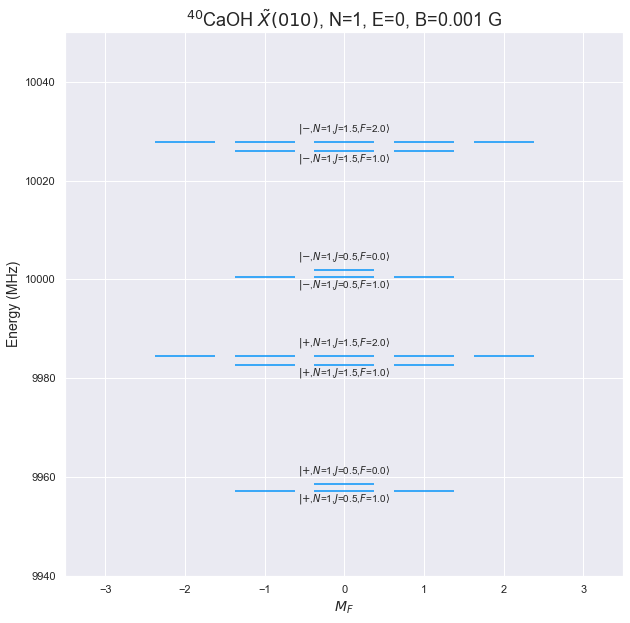

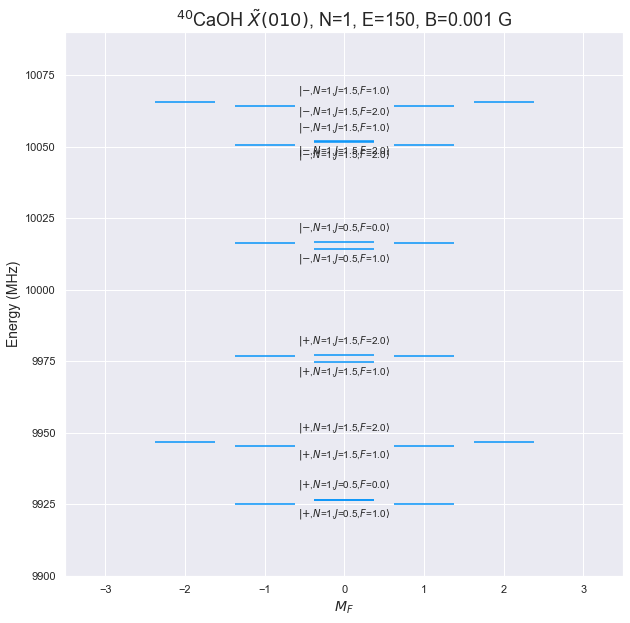

In [57]:
E0=0
B0=1e-3
N=1
X010.display_levels(E0,B0,'F',idx=N_idx[N-1],parity=True,label_q=[q for q in X010.q_str if q!='K'],figsize=(10,10),alt_label=True)
plt.title(X010.state_str+', N={}, E={}, B={} G'.format(N,E0,B0),fontsize=18)
plt.xlim(-3.5,3.5)
plt.ylim(9940,10050)

E0=150
B0=1e-3
N=1
X010.display_levels(E0,B0,'F',idx=N_idx[N-1],parity=True,label_q=[q for q in X010.q_str if q!='K'],figsize=(10,10),alt_label=True)
plt.title(X010.state_str+', N={}, E={}, B={} G'.format(N,E0,B0),fontsize=18)
plt.xlim(-3.5,3.5)
plt.ylim(9900,10090)

# N=2
# X010.display_levels(E0,B0,'F',idx=N_idx[N-1],parity=True,label_q=[q for q in X010.q_str if q!='K'],figsize=(10,10),alt_label=True)
# plt.title(X010.state_str+', N={}, E={} V/cm, B={} G'.format(N,E0,B0),fontsize=18)
# plt.xlim(-3.5,3.5)

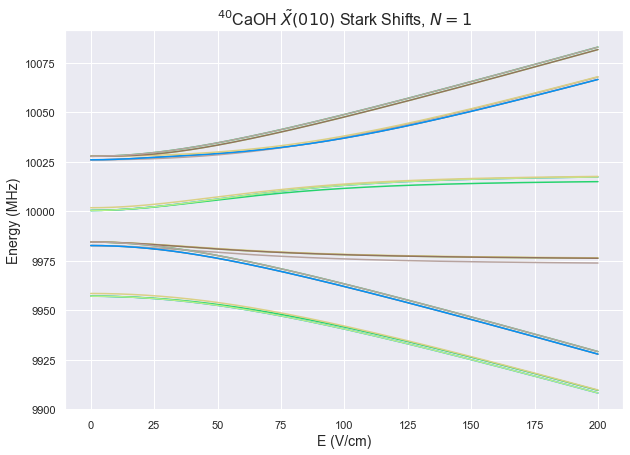

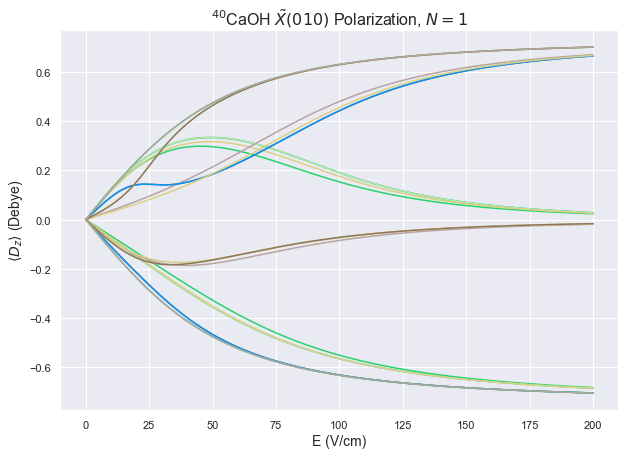

In [133]:
plt.figure(figsize=(10,7))
for (i,trace) in enumerate(X010.evals_E.T[N_idx[0]]):
    plt.plot(Ez,trace)
plt.xlabel('E (V/cm)',fontsize=14)
plt.ylabel('Energy (MHz)',fontsize=14)
plt.title(r'$^{40}$CaOH $\tilde{X}(010)$ Stark Shifts, $N=1$',fontsize=16);

plt.figure(figsize=(10,7))
for (i,trace) in enumerate(X010.evals_E.T[N_idx[0]]):
    grad = np.gradient(trace)/(Ez[1]-Ez[0])
    plt.plot(Ez,grad*1.986)
plt.xlabel('E (V/cm)',fontsize=14)
plt.ylabel(r'$\langle D_z \rangle$ (Debye)',fontsize=14)
plt.title(r'$^{40}$CaOH $\tilde{X}(010)$ Polarization, $N=1$',fontsize=16);

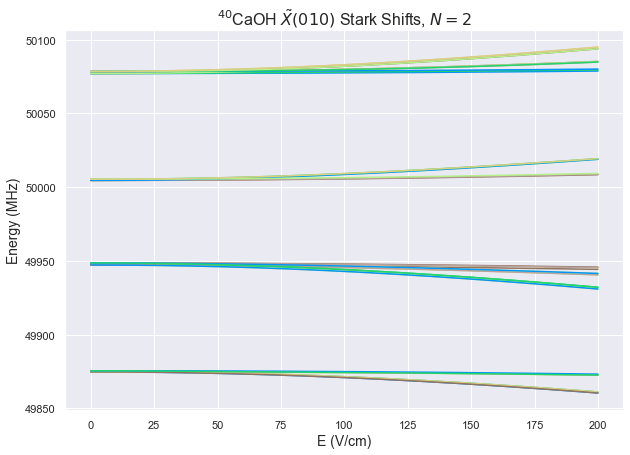

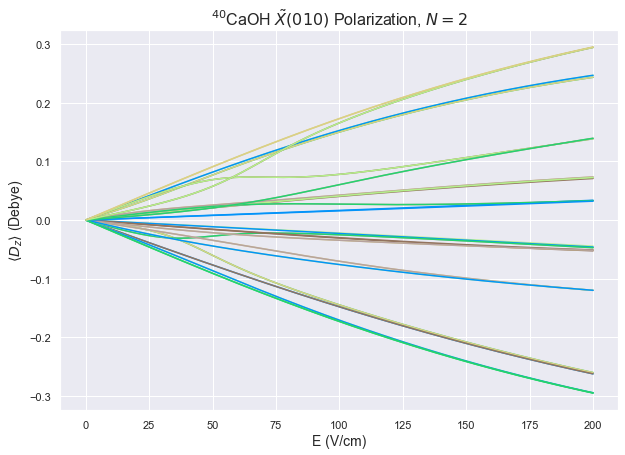

In [134]:
plt.figure(figsize=(10,7))
for (i,trace) in enumerate(X010.evals_E.T[N_idx[1]]):
    plt.plot(Ez,trace)
plt.xlabel('E (V/cm)',fontsize=14)
plt.ylabel('Energy (MHz)',fontsize=14)
plt.title(r'$^{40}$CaOH $\tilde{X}(010)$ Stark Shifts, $N=2$',fontsize=16);

plt.figure(figsize=(10,7))
for (i,trace) in enumerate(X010.evals_E.T[N_idx[1]]):
    grad = np.gradient(trace)/(Ez[1]-Ez[0])
    plt.plot(Ez,grad*1.986)
plt.xlabel('E (V/cm)',fontsize=14)
plt.ylabel(r'$\langle D_z \rangle$ (Debye)',fontsize=14)
plt.title(r'$^{40}$CaOH $\tilde{X}(010)$ Polarization, $N=2$',fontsize=16);

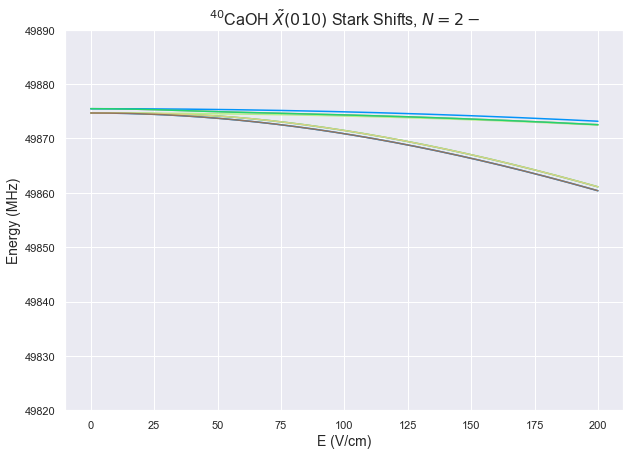

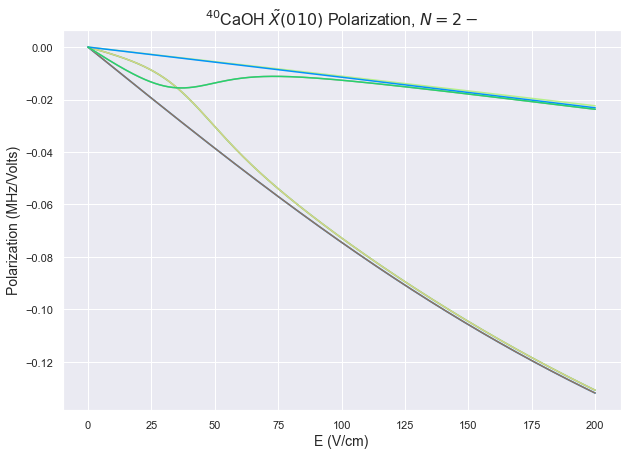

In [135]:
plt.figure(figsize=(10,7))
for (i,trace) in enumerate(X010.evals_E.T[N2_all]):
    plt.plot(Ez,trace)
plt.xlabel('E (V/cm)',fontsize=14)
plt.ylabel('Energy (MHz)',fontsize=14)
plt.title(r'$^{40}$CaOH $\tilde{X}(010)$ Stark Shifts, $N=2-$',fontsize=16);
plt.ylim(49820,49890)

plt.figure(figsize=(10,7))
for (i,trace) in enumerate(X010.evals_E.T[N2_all]):
    grad = np.gradient(trace)/(Ez[1]-Ez[0])
    plt.plot(Ez,grad)
plt.xlabel('E (V/cm)',fontsize=14)
plt.ylabel('Polarization (MHz/Volts)',fontsize=14)
plt.title(r'$^{40}$CaOH $\tilde{X}(010)$ Polarization, $N=2-$',fontsize=16);

In [36]:
X010.display_levels(0,1e-6,'F',idx=N1_all,label_q=[q for q in X010.q_str if q!='K'],alt_label=True)
plt.title(X010.state_str+', N=1d',fontsize=18)

Text(0.5, 1.0, '$^{40}$CaOH $\\tilde{X}(010)$, N=1,2, Free Field')

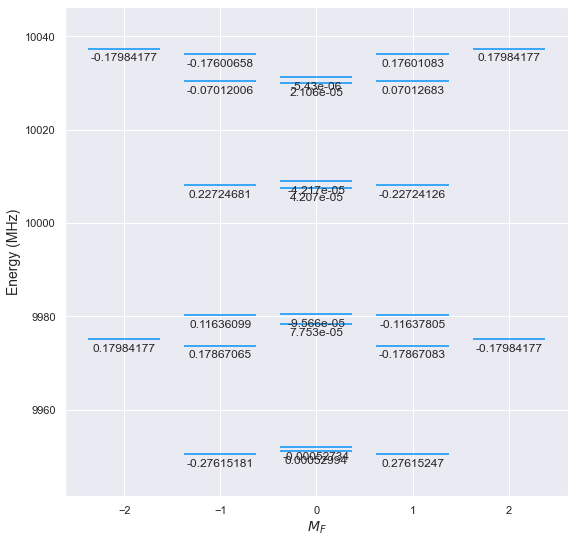

In [130]:
# X010 = MoleculeLevels.initialize_state('CaOH','40','X010',N_list,M_values = 'custom',I=[0,1/2],S=1/2,round=16,M_range=[1])
X010 = MoleculeLevels.initialize_state('CaOH','40','X010',[1],M_values = 'all',I=[0,1/2],S=1/2,round=8)
X010.display_PTV(60.8,1e-3,'EDM')

Text(0.5, 1.0, '$^{40}$CaOH $\\tilde{X}(010)$, N=1,2 60 V/cm, 1e-06 G')

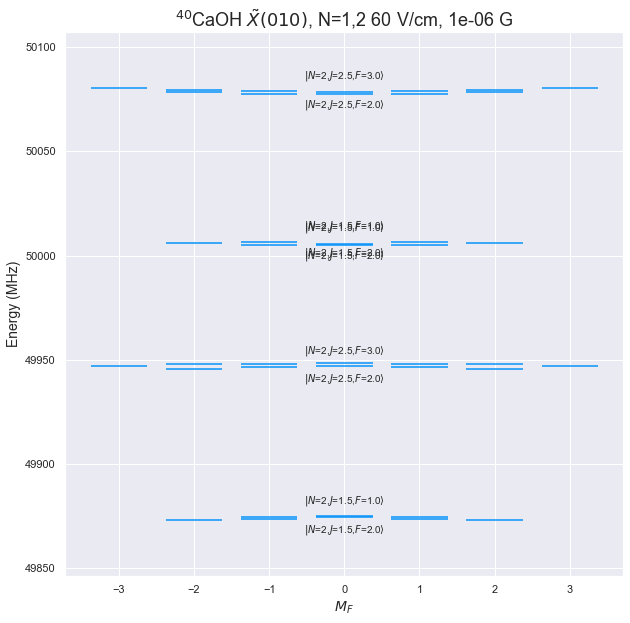

In [14]:
Efield = 60
Bfield = 1e-6
X010.display_levels(Efield,Bfield,'F',idx=N2,label_q=[q for q in X010.q_str if q!='K'],alt_label=True)
plt.title(X010.state_str+', N=1,2 {} V/cm, {} G'.format(Efield,Bfield),fontsize=18)

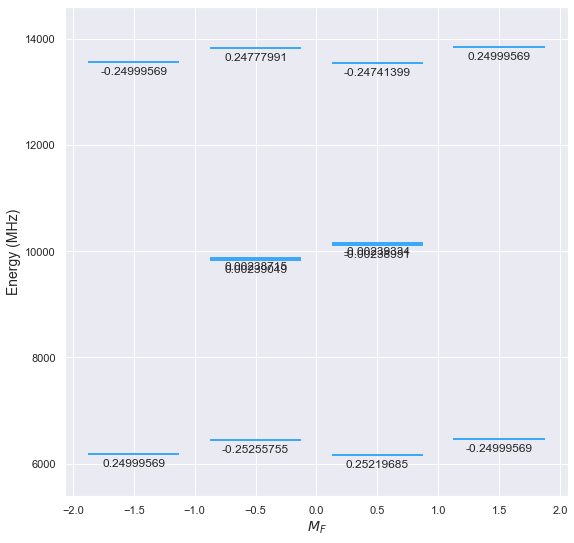

In [41]:
X010.display_PTV(,'EDM')

In [34]:
evals, evecs = X010.eigensystem(Efield,Bfield,order=True,method='torch')
M0_idx = X010.select_q({'M':[-3/2,-1/2,1/2,3/2]})
print(M0_idx)
print('\n')
for i in M0_idx:
    display(Latex('$E = '+str(np.round(X010.evals0[i],4))+r'\:\mathrm{MHz}$'))
    print('Decoupled:')
    display(Latex(X010.gen_state_str(i,basis='decoupled',thresh=0.05,label_q=['K','M_N','M_S','M_I','M_F'],round=4)))
    print('Case A:')
    display(Latex(X010.gen_state_str(i,basis='aBJ',thresh=0.05,label_q=['K','J','F','Sigma','P','M'],round=4)))
    print('Case B:')
    display(Latex(X010.gen_state_str(i,thresh=0.05,round=4)))
    print('\n')

[ 0  1  2  3  4  5  6  7  8  9 10 11]




<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case A:


<IPython.core.display.Latex object>

Case B:


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case A:


<IPython.core.display.Latex object>

Case B:


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case A:


<IPython.core.display.Latex object>

Case B:


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case A:


<IPython.core.display.Latex object>

Case B:


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case A:


<IPython.core.display.Latex object>

Case B:


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case A:


<IPython.core.display.Latex object>

Case B:


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case A:


<IPython.core.display.Latex object>

Case B:


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case A:


<IPython.core.display.Latex object>

Case B:


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case A:


<IPython.core.display.Latex object>

Case B:


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case A:


<IPython.core.display.Latex object>

Case B:


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case A:


<IPython.core.display.Latex object>

Case B:


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case A:


<IPython.core.display.Latex object>

Case B:


<IPython.core.display.Latex object>

In [117]:
evals, evecs = X010.eigensystem(1000,1e-8,order=True,method='torch')
M0_idx = X010.select_q({'M':[0]})
print(M0_idx)
print('\n')
for i in M0_idx:
    display(Latex('$E = '+str(np.round(X010.evals0[i],4))+r'\:\mathrm{MHz}$'))
    print('Decoupled:')
    display(Latex(X010.gen_state_str(i,basis='decoupled',thresh=0.01,label_q=['K','M_N','M_S','M_I','M_F'],round=4)))
    print('Case A:')
    display(Latex(X010.gen_state_str(i,basis='aBJ',thresh=0.01,label_q=['J','K','Sigma','P','M'],round=4)))
    print('Case B:')
    display(Latex(X010.gen_state_str(i,thresh=0.01,round=4)))
    print('\n')

[ 2  3  8 11 12 15 18 19]




<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case A:


<IPython.core.display.Latex object>

Case B:


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case A:


<IPython.core.display.Latex object>

Case B:


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case A:


<IPython.core.display.Latex object>

Case B:


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case A:


<IPython.core.display.Latex object>

Case B:


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case A:


<IPython.core.display.Latex object>

Case B:


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case A:


<IPython.core.display.Latex object>

Case B:


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case A:


<IPython.core.display.Latex object>

Case B:


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case A:


<IPython.core.display.Latex object>

Case B:


<IPython.core.display.Latex object>

In [42]:
Bz = np.linspace(1e-6,40,1000)
Ez = np.linspace(0,500,1000)

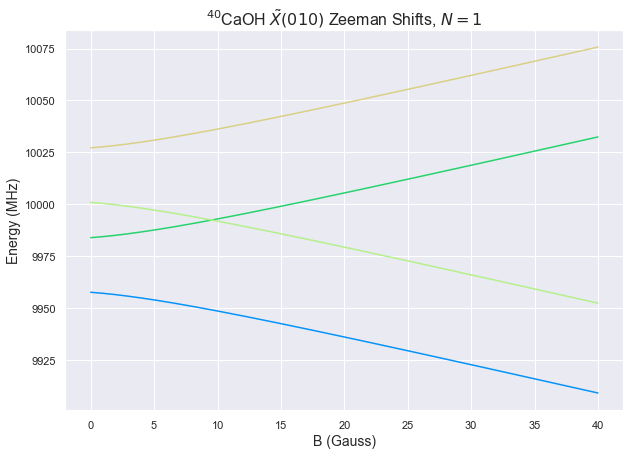

In [75]:
X010.ZeemanMap(Bz,0,plot=True)

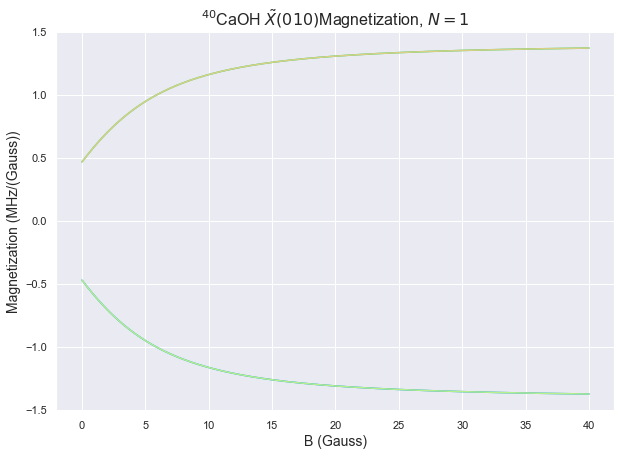

In [76]:
plt.figure(figsize=(10,7))
for (i,trace) in enumerate(X010.evals_B.T):
    grad = np.gradient(trace)/(Bz[1]-Bz[0])
    plt.plot(Bz,grad)
plt.xlabel('B (Gauss)',fontsize=14)
plt.ylabel('Magnetization (MHz/(Gauss))',fontsize=14)
plt.title(X010.state_str + r'Magnetization, $N={}$'.format(*X010.N_range),fontsize=16);

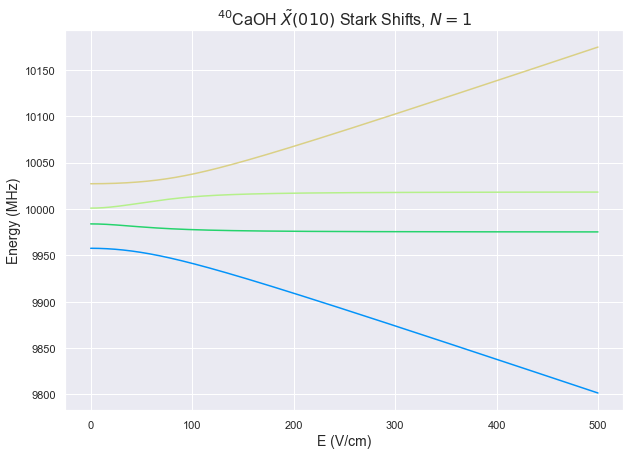

In [78]:
X010.StarkMap(Ez,1e-6,plot=True)
# X010.plot_evals_EB('E',kV_kG=True,GHz=True)

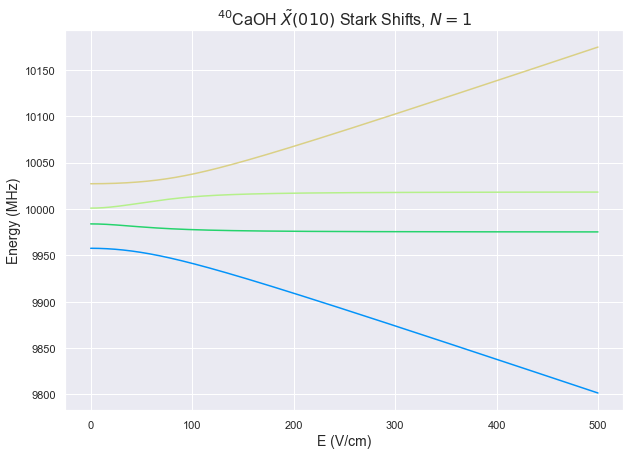

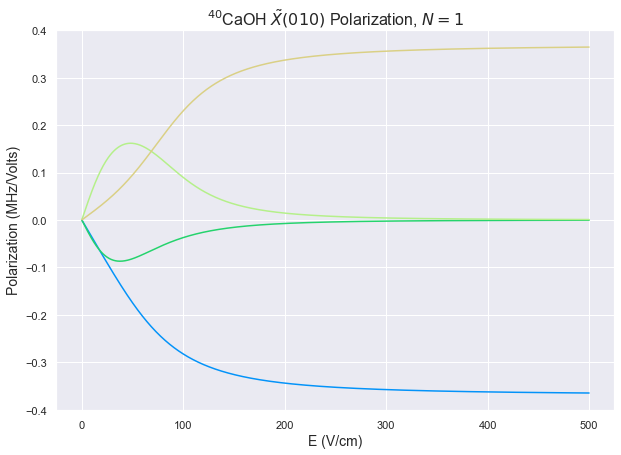

In [98]:
plt.figure(figsize=(10,7))
for (i,trace) in enumerate(X010.evals_E.T):
    plt.plot(Ez,trace)
plt.xlabel('E (V/cm)',fontsize=14)
plt.ylabel('Energy (MHz)',fontsize=14)
plt.title(r'$^{40}$CaOH $\tilde{X}(010)$ Stark Shifts, $N=1$',fontsize=16);

plt.figure(figsize=(10,7))
for (i,trace) in enumerate(X010.evals_E.T):
    grad = np.gradient(trace)/(Ez[1]-Ez[0])
    plt.plot(Ez,grad)
plt.xlabel('E (V/cm)',fontsize=14)
plt.ylabel('Polarization (MHz/Volts)',fontsize=14)
plt.title(r'$^{40}$CaOH $\tilde{X}(010)$ Polarization, $N=1$',fontsize=16);

We can display a plot of the energy levels at arbitray field. (The code does not handle parity labeling well, so I am leaving out L for zero field.)

Text(0.5, 1.0, '$^{40}$CaOH $\\tilde{X}(010)$, N=1, 0.5 kV/cm')

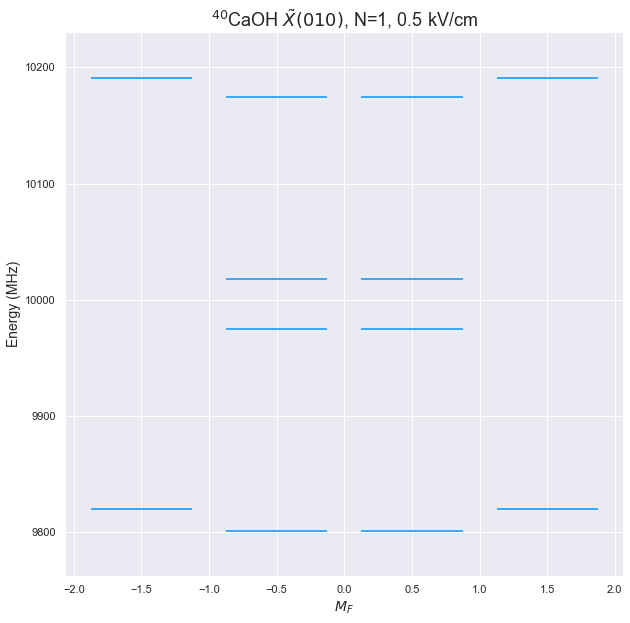

In [47]:
X010.display_levels(500,1e-7,'F',label=None,alt_label=True)
plt.title(X010.state_str+', N=1, 0.5 kV/cm',fontsize=18)

We can also look at PT violating shifts. Here, we consider the EDM shifts as a function of E field. 

In [48]:
X010.eigensystem(0,1e-8);

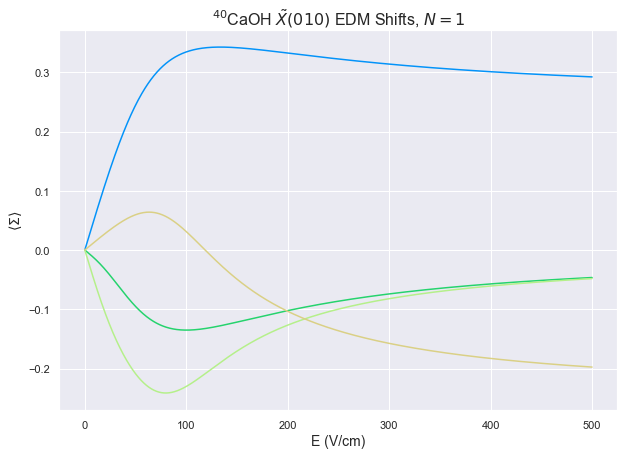

In [85]:
X010.PTV_Map('EDM',E_or_B='E',plot=True)

We can look specifically at the upper and lower Stark manifolds at a given field value too.

Text(0.5, 1.0, '$^{40}$CaOH $\\tilde{X}(010)$, EDM shifts at 60.8 V/cm')

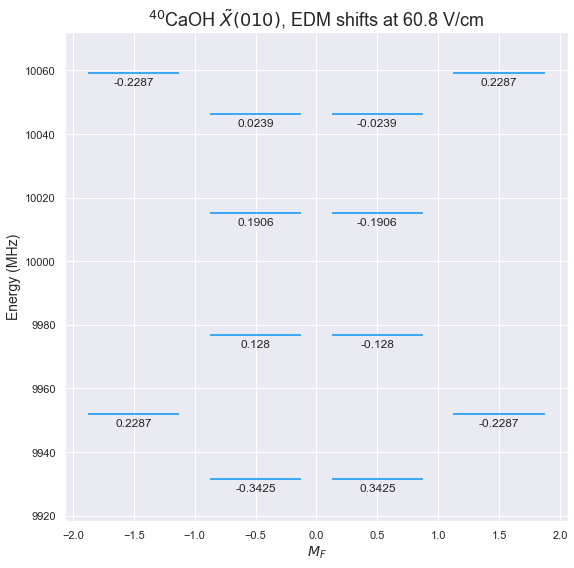

In [51]:
X010.display_PTV(133,1e-7,'EDM',round=4)
plt.title(X010.state_str+', EDM shifts at 60.8 V/cm',fontsize=18)

In [60]:
X010.eigensystem(1000,0)
M0_idx = X010.select_q({'M':[1]})
print(M0_idx)
print('\n')
for i in M0_idx:
    display(Latex('$E = '+str(np.round(X010.evals0[i],4))+r'\:\mathrm{MHz}$'))
    print('Decoupled:')
    display(Latex(X010.gen_state_str(i,basis='decoupled',thresh=0.01,label_q=['K','M_N','M_S','M_I','M_F'],round=4)))
    print('Case A:')
    display(Latex(X010.gen_state_str(i,basis='aBJ',thresh=0.01,label_q=['K','Sigma','P','M'],round=4)))
    print('Case B:')
    display(Latex(X010.gen_state_str(i,thresh=0.01,round=4)))
    print('\n')

[0 1 2 3 4 5]




<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case A:


<IPython.core.display.Latex object>

Case B:


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case A:


<IPython.core.display.Latex object>

Case B:


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case A:


<IPython.core.display.Latex object>

Case B:


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case A:


<IPython.core.display.Latex object>

Case B:


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case A:


<IPython.core.display.Latex object>

Case B:


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Decoupled:


<IPython.core.display.Latex object>

Case A:


<IPython.core.display.Latex object>

Case B:


<IPython.core.display.Latex object>

In [50]:
X010.eigensystem(100,1e-2)
(sy.Matrix(X010.evecs0[0]).T*X010.H_symbolic*sy.Matrix(X010.evecs0[0]))[0]

-0.048487643331535*Bz - 0.277154404334809*Ez + 9969.35364112334

In [43]:
(sy.Matrix(X010.evecs0[1]).T*X010.H_symbolic*sy.Matrix(X010.evecs0[1]))[0]

1.28069264538709*Bz - 0.368490639112473*Ez + 9987.63731699745

In [20]:
import matrix_elements_sym as me
from functools import partial
from matrix_elements_sym import decouple_b_even

def H_even_X(q_numbers,params,matrix_elements,symbolic=True,E=0,B=0,M_values='all',precision=5):
    q_str = list(q_numbers)     # Get keys for quantum number dict
    if symbolic:
        Ez,Bz = sy.symbols('E_z B_z')
        size = len(q_numbers[q_str[0]])
        # Need to construct empty matrices to fill with matrix elements
        # Sympy does not like numpy arrays, so convert to list
        H0 = np.zeros((size,size)).tolist()
        V_B = np.zeros((size,size)).tolist()
        V_E = np.zeros((size,size)).tolist()
        #Iz = np.zeros((size,size)).tolist()
        #Sz = np.zeros((size,size)).tolist()
        for i in range(size):
            for j in range(size):
                # State out is LHS of bra ket, state in is RHS
                state_out = {q+'0':q_numbers[q][i] for q in q_str}
                state_in = {q+'1':q_numbers[q][j] for q in q_str}
                q_args = {**state_out,**state_in}
                elements = {term: sy.nsimplify(element(**q_args)) for term, element in matrix_elements.items()}
                # The Hamiltonian
                H0[i][j] = params['Be']*elements['N^2'] + params['Gamma_SR']*elements['N.S'] + \
                    params['bF']*elements['I.S'] + params['c']/3*sy.sqrt(6)*elements['T2_0(I,S)']
                if params.get('q_lD') is not None:
                    H0[i][j] += params['q_lD']/2*elements['l-doubling'] - params['Gamma_SR']*elements['NzSz']+params['Gamma_Prime']*elements['NzSz']
                if M_values!='none':
                    V_B[i][j]+=params['g_S']*params['mu_B']*elements['ZeemanZ']
                    V_E[i][j]+=-params['muE']*elements['StarkZ']
                # H[i][j] = round(H[i][j],precision)
                #Iz[i][j] = params['c']*elements['Iz']
                #Sz[i][j] = elements['Sz']
        # Need to construct IzSz term and add to Hamiltonian
        #H=matadd(H,matmult(Iz,Sz))
        # Create symbolic object
        H_symbolic = sy.Matrix(H0)+Ez*sy.Matrix(V_E)+Bz*sy.Matrix(V_B)
#         H0_num = np.array(H0).astype(np.float64)
#         V_E_num = np.array(V_E).astype(np.float64)
#         V_B_num = np.array(V_B).astype(np.float64)
        # Use symbolic object to create function that given E and B values, returns a numpy array
#         H_func = lambda E,B: H0_num + V_E_num*E + V_B_num*B
        # H_func = sy.lambdify((Ez,Bz), H_symbolic, modules='numpy')
        return H_symbolic

def decouple_b(input_qnumbers,output_qnumbers,S=1/2,I=1/2):
    input_keys = list(input_qnumbers)
    output_keys = list(output_qnumbers)
    input_size = len(input_qnumbers[input_keys[0]])
    output_size = len(output_qnumbers[output_keys[0]])
    basis_matrix = np.zeros((output_size,input_size)).tolist()
    for i in range(output_size):
        for j in range(input_size):
            decoupled_qnumbers = {q:output_qnumbers[q][i] for q in output_keys}
            b_qnumbers = {q:input_qnumbers[q][j] for q in input_keys}
            basis_matrix[i][j] = sy.nsimplify(decouple_b_even(decoupled_qnumbers,b_qnumbers,S=S,I=I))
    return basis_matrix
   
    

bBJ_even_X_matrix_elements={
        # Fine Structure
        'N^2': me.Rot_bBJ,                 # N^2 Rotation
        'N.S': me.SR_bBJ,                  # N.S Spin Rotation
        'l-doubling': me.lD_bBJ,           # Effective l doubling
        'NzSz': me.NzSz_bBJ,               # NzSz for bending mode

        # Hydrogen Hyperfine
        'I.S': me.IS_bBJ,                  # I.S Fermi Contact Interaction
        'T2_0(I,S)': me.T2IS_bBJ,          # I S dipolar interaction
        'Iz': me.Iz_bBJ,                   # I.n projection of I on internuclear axis n
        'Sz': me.Sz_bBJ,                   # S.n projection of S on internuclear axis n
        }

ext_fields = {
# External Fields
'ZeemanZ': me.ZeemanZ_bBJ,         # Zeeman interaction with lab z magnetic field
'StarkZ': me.StarkZ_bBJ            # Stark interaction with lab z electric field
}
bBJ_even_X_matrix_elements.update(ext_fields)
for term,element in bBJ_even_X_matrix_elements.items():       #iterate through, substitute hydrogen proton value
            bBJ_even_X_matrix_elements[term] = partial(element,I=1/2)

        

B,gamma,gammap, bF,c,b,q_lD,muE,muB,g_S,g_L = sy.symbols('B_{rot} gamma gamma^\' b_F c b q_{lD} D mu_B g_S g_L')
params_40X010 = {
'Be': B,
'Gamma_SR': gamma,
'Gamma_Prime': gammap,
'bF': 0,
'c': 0,
'b': b,
'q_lD': q_lD,
'muE': muE,
'mu_B': muB, #MHz/Gauss
'g_S': g_S,
'g_L': g_L,
}

def build_operator(q_numbers,parameter,operator_element,M_values='all',precision=5):
    q_str = list(q_numbers)     # Get keys for quantum number dict
    size = len(q_numbers[q_str[0]])
    # Need to construct empty matrices to fill with matrix elements
    # Sympy does not like numpy arrays, so convert to list
    H0 = np.zeros((size,size)).tolist()
    #Iz = np.zeros((size,size)).tolist()
    #Sz = np.zeros((size,size)).tolist()
    for i in range(size):
        for j in range(size):
            # State out is LHS of bra ket, state in is RHS
            state_out = {q+'0':q_numbers[q][i] for q in q_str}
            state_in = {q+'1':q_numbers[q][j] for q in q_str}
            q_args = {**state_out,**state_in}
            operator = sy.nsimplify(operator_element(**q_args))
            H0[i][j]+= parameter*operator
    H_symbolic = sy.Matrix(H0)
    return H_symbolic

In [21]:
H_sym = H_even_X(X010.q_numbers,params_40X010,bBJ_even_X_matrix_elements,symbolic=True,E=0,B=0,M_values='all',precision=8)

In [22]:
(H_sym)

Matrix([
[            B_{rot} - gamma/2 - gamma^'/2,                                   -q_{lD},                                                        0,                                                        0,                 -B_z*g_S*mu_B/6 + D*E_z/3,                                         0,                                                         0,                                                         0,                                                               0,                                                               0, -sqrt(2)*B_z*g_S*mu_B/3 + sqrt(2)*D*E_z/6,                                         0,                                                              0,                                                              0,                                                         0,                                                         0,                                                         0,                                                         0,     

In [23]:
NzSz = build_operator(X010.q_numbers,params_40X010['Gamma_Prime'],bBJ_even_X_matrix_elements['NzSz'],precision=8)
NS = build_operator(X010.q_numbers,params_40X010['Gamma_SR'],bBJ_even_X_matrix_elements['N.S'],precision=8)

In [24]:
NS-NzSz

Matrix([
[-gamma + gamma^'/2,                  0,                  0,                  0,                  0,                  0,                  0,                  0,                   0,                   0,                   0,                   0,                   0,                   0,                   0,                   0,                   0,                   0,                   0,                   0,                   0,                   0,                   0,                   0],
[                 0, -gamma + gamma^'/2,                  0,                  0,                  0,                  0,                  0,                  0,                   0,                   0,                   0,                   0,                   0,                   0,                   0,                   0,                   0,                   0,                   0,                   0,                   0,                   0,                   0,                  

In [25]:
inputt = X010.q_numbers
output = X010.alt_q_numbers['decoupled']
basis_matrix = sy.Matrix(decouple_b(inputt,output,I=1/2))

In [26]:
H_dcpl = basis_matrix*H_sym*basis_matrix.T

In [27]:
NzSz_dcpl = basis_matrix*NzSz*basis_matrix.T
NS_dcpl = basis_matrix*NS*basis_matrix.T

In [28]:
SR_dcpl = NS_dcpl-NzSz_dcpl

In [29]:
SR_dcpl

Matrix([
[gamma/2 - gamma^'/4,                   0,                   0,                   0,                                   0,                                   0,                                   0,                                   0,                                   0,                                   0,                                   0,                                   0,                                   0,                                   0,                                   0,                                   0,                                   0,                                   0,                                   0,                                   0,                   0,                   0,                   0,                   0],
[                  0, gamma/2 - gamma^'/4,                   0,                   0,                                   0,                                   0,                                   0,                                  

In [24]:
ilist = range(0,24)
for i in ilist:
    print(i)
    for k,v in X010.alt_q_numbers['decoupled'].items():
        print('{} = {}'.format(k,v[i]))

0
K = -1
N = 1
M_N = -1
M_S = -0.5
M_I = 0
M_F = -1.5
1
K = 1
N = 1
M_N = -1
M_S = -0.5
M_I = 0
M_F = -1.5
2
K = -1
N = 1
M_N = -1
M_S = 0.5
M_I = 0
M_F = -0.5
3
K = 1
N = 1
M_N = -1
M_S = 0.5
M_I = 0
M_F = -0.5
4
K = -1
N = 1
M_N = 0
M_S = -0.5
M_I = 0
M_F = -0.5
5
K = 1
N = 1
M_N = 0
M_S = -0.5
M_I = 0
M_F = -0.5
6
K = -1
N = 1
M_N = 0
M_S = 0.5
M_I = 0
M_F = 0.5
7
K = 1
N = 1
M_N = 0
M_S = 0.5
M_I = 0
M_F = 0.5
8
K = -1
N = 1
M_N = 1
M_S = -0.5
M_I = 0
M_F = 0.5
9
K = 1
N = 1
M_N = 1
M_S = -0.5
M_I = 0
M_F = 0.5
10
K = -1
N = 1
M_N = 1
M_S = 0.5
M_I = 0
M_F = 1.5
11
K = 1
N = 1
M_N = 1
M_S = 0.5
M_I = 0
M_F = 1.5
12


IndexError: list index out of range

In [25]:
vec = np.zeros(24)
vec[6] = 1/sy.sqrt(2) #
vec[17] = 1/sy.sqrt(2)

In [26]:
NS_dcpl-NzSz_dcpl

Matrix([
[gamma/4,       0,               0,               0,               0,               0,               0,               0,               0,               0,       0,       0],
[      0, gamma/4,               0,               0,               0,               0,               0,               0,               0,               0,       0,       0],
[      0,       0,        -gamma/4,               0, sqrt(2)*gamma/4,               0,               0,               0,               0,               0,       0,       0],
[      0,       0,               0,        -gamma/4,               0, sqrt(2)*gamma/4,               0,               0,               0,               0,       0,       0],
[      0,       0, sqrt(2)*gamma/4,               0,               0,               0,               0,               0,               0,               0,       0,       0],
[      0,       0,               0, sqrt(2)*gamma/4,               0,               0,               0,               0, 

In [27]:
H_dcpl=sy.simplify(H_dcpl)
H_dcpl

Matrix([
[-B_z*g_S*mu_B/2 + B_{rot} - D*E_z/2 + gamma/4,                                       -q_{lD},                                            0,                                            0,                         0,                         0,                        0,                        0,                                             0,                                             0,                                            0,                                            0],
[                                      -q_{lD}, -B_z*g_S*mu_B/2 + B_{rot} + D*E_z/2 + gamma/4,                                            0,                                            0,                         0,                         0,                        0,                        0,                                             0,                                             0,                                            0,                                            0],
[                              

In [135]:
X010.eigensystem(1000,0)
even = sy.Matrix([0,1/sy.sqrt(2),0,0,0,0,1/sy.sqrt(2),0])
odd = sy.Matrix([1/sy.sqrt(2),0,0,0,0,0,0,-1/sy.sqrt(2)])
x = sy.simplify(even.T*H_dcpl*even)
y = sy.simplify(odd.T*H_dcpl*odd)
x[0]

B_{rot} + D*E_z/2 + b_F/4 + c/60 - gamma/4

B_{rot} - D*E_z/2 + b_F/4 + c/60 - gamma/4

In [142]:
X010.eigensystem(1000,)
x = sy.Matrix(X010.evecs0[0]).T*H_sym*sy.Matrix(X010.evecs0[0])
y = sy.Matrix(X010.evecs0[1]).T*H_sym*sy.Matrix(X010.evecs0[1])
sy.N(x-y)[0]

-1.09823410572936e-11*B_z*g_S*mu_B + 3.74903172901661e-5*D*E_z - 0.00019018948895402*b_F - 0.0122648086400407*c - 5.8647193332706e-5*gamma + 0.00118230125639449*q_{lD}

In [42]:
X010.H_symbolic

Matrix([
[                           9980.21896666667,                                      21.649,         -0.4670780207227*Bz + 0.24583286*Ez,                                           0, -1.32109614318485*Bz + 0.173830082344483*Ez,                                           0,                                           0,                                           0],
[                                     21.649,                            9980.21896666667,                                           0,         -0.4670780207227*Bz - 0.24583286*Ez,                                           0, -1.32109614318485*Bz - 0.173830082344483*Ez,                                           0,                                           0],
[        -0.4670780207227*Bz + 0.24583286*Ez,                                           0,                            9978.89541111111,                                      21.649,                            1.14594510633293,                                          

In [17]:
X010.eigensystem(100000,0)
M0_idx = X010.select_q({'M':[0]})
print(M0_idx)
for i in M0_idx:
    print('E =',X010.evals0[i])
    display(Latex(X010.gen_state_str(i,basis='decoupled',thresh=0.001,label_q=['K','M_N','M_S','M_I','M_F'])))
#     display(Latex(X010.gen_state_str(i,basis='aBJ',thresh=0.05,label_q=['K','Sigma','P','M'])))
#     display(Latex(X010.gen_state_str(i,thresh=0.05)))

[0 1 2 3 4 5 6 7]
E = -26869.87053477218


<IPython.core.display.Latex object>

E = -26869.753213628093


<IPython.core.display.Latex object>

E = 9973.151313958582


<IPython.core.display.Latex object>

E = 10016.449292801037


<IPython.core.display.Latex object>

E = 10042.423225935365


<IPython.core.display.Latex object>

E = 10085.720997939427


<IPython.core.display.Latex object>

E = 46880.36769489169


<IPython.core.display.Latex object>

E = 46880.485222874166


<IPython.core.display.Latex object>

In [83]:
X010.eigensystem(0,1e-6)
X010.g_eff_Map(step=1e-6);

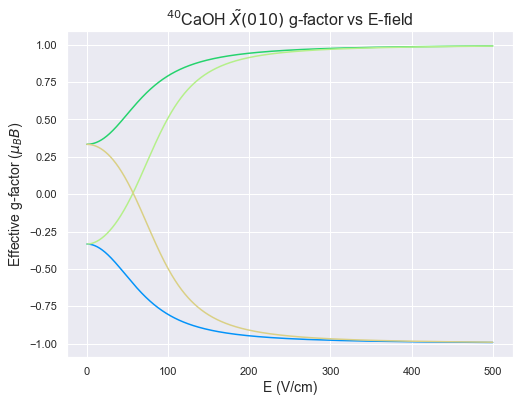

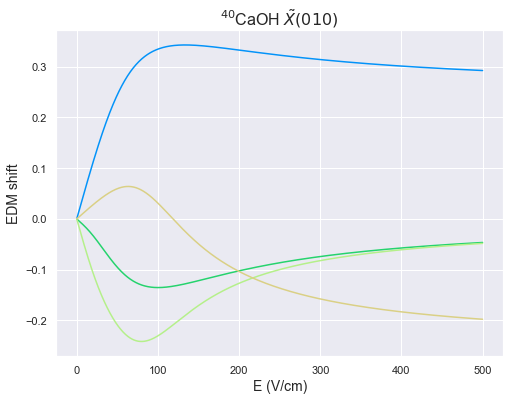

In [86]:
j = range(len(X010.evals0))
plt.figure(figsize=(8,6))
for i in range(len(X010.g_eff_E.T)):#range(len(X010_174.g_eff_E.T)):
    plt.plot(Ez,X010.g_eff_E.T[i])
plt.xlabel('E (V/cm)',fontsize=14)
plt.ylabel(r'Effective g-factor ($\mu_B B$)',fontsize=14)
plt.title(X010.state_str + ' g-factor vs E-field',fontsize=16);
plt.figure(figsize=(8,6))
for i in range(len(X010.g_eff_E.T)):#range(len(X010_174.PTV_E.T)):
    plt.plot(Ez,X010.PTV_E.T[i])
plt.xlabel('E (V/cm)',fontsize=14)
plt.ylabel('EDM shift',fontsize=14)
plt.title(X010.state_str,fontsize=16);

In [81]:
X010.eigensystem(0,1e-6)
M_idx = X010.select_q({'M':[1/2]})
print(M_idx)

[0 1 2 3]


IndexError: index 4 is out of bounds for axis 0 with size 4

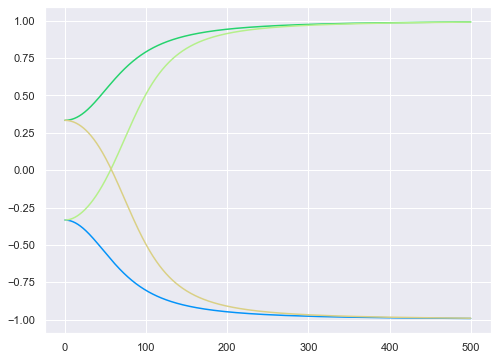

In [87]:
j = range(len(X010.evals0))
plt.figure(figsize=(8,6))
for i in range(10):#range(len(X010_174.g_eff_E.T)):
    plt.plot(Ez,X010.g_eff_E.T[i])
plt.xlabel('E (V/cm)',fontsize=14)
plt.ylabel(r'Effective g-factor ($\mu_B B$)',fontsize=14)
plt.title(X010.state_str + ' g-factor vs E-field',fontsize=16);
plt.xlim(53,73)
plt.figure(figsize=(8,6))
for i in range(12):#range(len(X010_174.PTV_E.T)):
    plt.plot(Ez,X010.PTV_E.T[i])
plt.xlabel('E (V/cm)',fontsize=14)
plt.ylabel('EDM shift',fontsize=14)
plt.title(X010.state_str,fontsize=16);
plt.xlim(53,73);

In [175]:
for j in [12,18]:
    g_eff = X010.g_eff_E.T[j]
    for i in range(1,len(g_eff)):
        if (g_eff[i]>0 and g_eff[i-1]<0) or g_eff[i]<0 and g_eff[i-1]>0:
            print('idx =',j)
            print('E field =',(Ez[i]+Ez[i-1])/2)
            print('PTV =,',(X010.PTV_E.T[j][i]+X010.PTV_E.T[j][i-1])/2)
            print('Energy =',(X010.evals_E.T[j][i]+X010.evals_E.T[j][i-1])/2)

idx = 12
E field = 60.83108310831083
PTV =, -0.22727988
Energy = 10008.053070099853
idx = 18
E field = 65.28152815281528
PTV =, 0.070567485
Energy = 10030.921999206803
